#progetto di architettura dati:

* prendere un "database" assunto pulito,
* sporcarlo in maniera controllata ed incrementale (tranne il testset)
* ed goni stadio di sporcature utilizzare 3 algoritmi di ML
* analizzare i risultati facendo il confronto

valutare il downsampling

usare sickit-learn dato che h2o fa casino con i vari calcoli di roc ed auc

ricordarsi per le categoriche non-ordinali il one-hot-encoding e poi l'eleiminazione di una colonna per rendere i valori non-co-dipendenti

per le altre categoriche si può fare il label encoding se ritenuto opportuno

vedere se rimuovere gli auto-previsione corretta (se hai degli insoluti a priori è un no)

per sporcare il dataset:

*   ripetizione di voci del datset
*   errori di selezione (es: sostituire tot voci maschio con femmina ma non con valori random)

*   rendere alcuni dati inconsistenti
*   vedere se NaN crea o meno errori durante l'esecuzione, risposta: si, da problemi con albero e gauss, risolto attraverso imputazione con la media



In [ ]:
from pathlib import Path

import pandas as pd
import numpy as np
import random
import string
import os
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPClassifier
from sklearn.inspection import permutation_importance
from sklearn.impute import SimpleImputer


from sklearn.tree import DecisionTreeClassifier, plot_tree

from sklearn.metrics import accuracy_score, f1_score, roc_curve, auc, confusion_matrix,roc_auc_score
import matplotlib.pyplot as plt
import seaborn as sns


from sklearn.ensemble import RandomForestClassifier # Import Random Forest Classifier


In [ ]:
from sklearn.naive_bayes import GaussianNB

import matplotlib.pyplot as plt

In [ ]:
from google.colab import drive

drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [ ]:
if ((Path.cwd() / 'drive/MyDrive/architettura-Dati/' / 'progetto-architettura-v2.ipynb').exists()): #####

  data = pd.read_csv('drive/MyDrive/architettura-Dati/dati/loan_data.csv')

else:
  data= pd.read_csv('https://raw.githubusercontent.com/Barbera9/temp/refs/heads/main/loan_data.csv')


In [ ]:
data.head()

,person_age,person_gender,person_education,person_income,person_emp_exp,person_home_ownership,loan_amnt,loan_intent,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,credit_score,previous_loan_defaults_on_file,loan_status
0,22.0,female,Master,71948.0,0,RENT,35000.0,PERSONAL,16.02,0.49,3.0,561,No,1
1,21.0,female,High School,12282.0,0,OWN,1000.0,EDUCATION,11.14,0.08,2.0,504,Yes,0
2,25.0,female,High School,12438.0,3,MORTGAGE,5500.0,MEDICAL,12.87,0.44,3.0,635,No,1
3,23.0,female,Bachelor,79753.0,0,RENT,35000.0,MEDICAL,15.23,0.44,2.0,675,No,1
4,24.0,male,Master,66135.0,1,RENT,35000.0,MEDICAL,14.27,0.53,4.0,586,No,1


In [ ]:
categorical_cols = ['person_gender', 'person_education', 'person_home_ownership', 'loan_intent','previous_loan_defaults_on_file'] #categoriche

for col in categorical_cols:
    if col in data.columns:
        print(f"{col}: {data[col].unique()}")
    else:
        print(f"Column '{col}' not found in the DataFrame.")

person_gender: ['female' 'male']
person_education: ['Master' 'High School' 'Bachelor' 'Associate' 'Doctorate']
person_home_ownership: ['RENT' 'OWN' 'MORTGAGE' 'OTHER']
loan_intent: ['PERSONAL' 'EDUCATION' 'MEDICAL' 'VENTURE' 'HOMEIMPROVEMENT'
 'DEBTCONSOLIDATION']
previous_loan_defaults_on_file: ['No' 'Yes']


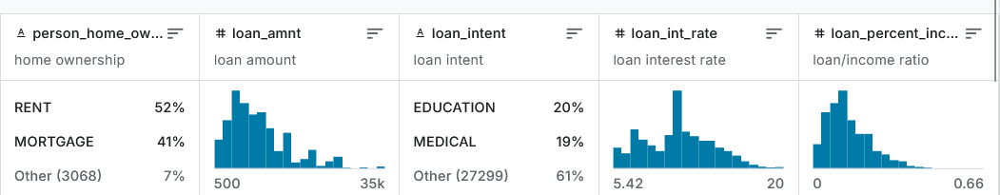

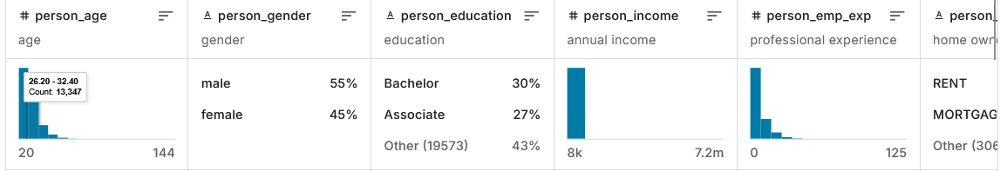

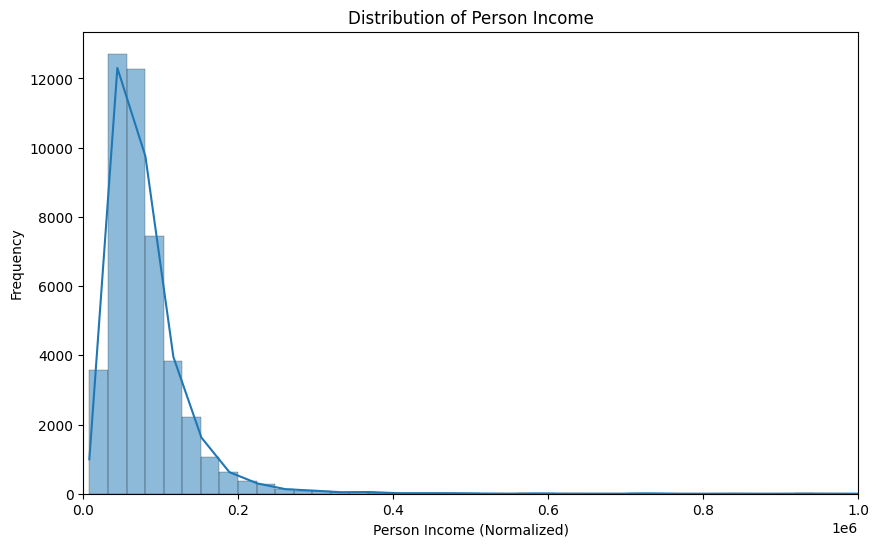

In [ ]:
# Visualize the distribution of 'person_income' using a histogram or bar plot
plt.figure(figsize=(10, 6))
sns.histplot(data['person_income'], bins=300, kde=True)
plt.xlabel('Person Income (Normalized)')
plt.ylabel('Frequency')
plt.title('Distribution of Person Income')
plt.xlim(0, 1000000)
plt.show()

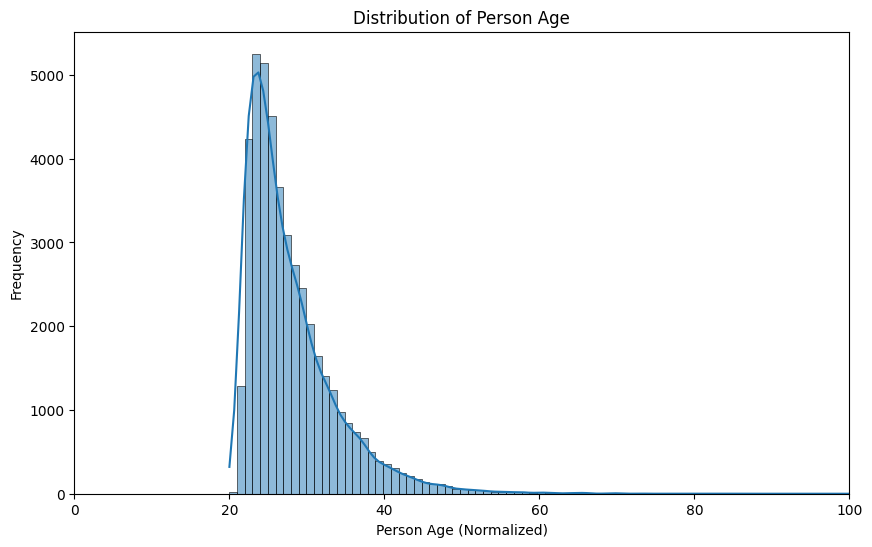

In [ ]:
# Visualize the distribution of 'person_income' using a histogram or bar plot
plt.figure(figsize=(10, 6))
sns.histplot(data['person_age'], bins=125, kde=True)
plt.xlabel('Person Age (Normalized)')
plt.ylabel('Frequency')
plt.title('Distribution of Person Age')
plt.xlim(0, 100)
plt.show()

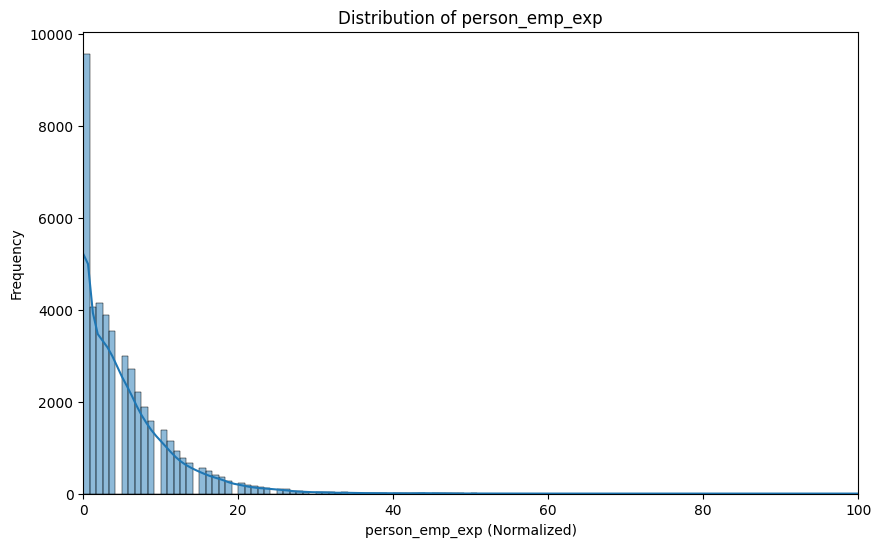

In [ ]:
# Visualize the distribution of 'person_income' using a histogram or bar plot
plt.figure(figsize=(10, 6))
sns.histplot(data['person_emp_exp'], bins=150, kde=True)
plt.xlabel('person_emp_exp (Normalized)')
plt.ylabel('Frequency')
plt.title('Distribution of person_emp_exp')
plt.xlim(0, 100)
plt.show()

In [ ]:
# Calculate histogram bins and counts for person_emp_exp
counts, bin_edges = np.histogram(data['person_emp_exp'], bins=150) # Use the same number of bins as in the plot

# The first bar corresponds to the first bin
first_bin_start = bin_edges[0]
first_bin_end = bin_edges[1]

print(f"The first bar represents values in the range: [{first_bin_start}, {first_bin_end})")

# Filter the DataFrame to get values within the first bin's range
values_in_first_bin = data[(data['person_emp_exp'] >= first_bin_start) & (data['person_emp_exp'] < first_bin_end)]['person_emp_exp']

print("\nValues of 'person_emp_exp' in the first bar:")
display(values_in_first_bin.head()) # Displaying the head as there might be many values
print(f"\nNumber of values in the first bar: {len(values_in_first_bin)}")

The first bar represents values in the range: [0.0, 0.8333333333333334)

Values of 'person_emp_exp' in the first bar:


,person_emp_exp
0,0
1,0
3,0
5,0
9,0



Number of values in the first bar: 9566


In [ ]:
def remove_first_bin_values(data, feature_to_remove_from, percentage_to_remove):

    newData = data.copy()

    if feature_to_remove_from in newData.columns:
        feature_data = newData[feature_to_remove_from]

        # Calculate histogram bins and counts for the specified feature
        # Use a large number of bins to approximate the first bar as values >= min and < first_bin_end
        counts, bin_edges = np.histogram(feature_data.dropna(), bins=150) # Calculate bins on non-NaN data

        if len(bin_edges) > 1:
            first_bin_start = bin_edges[0]
            first_bin_end = bin_edges[1]

            # Identify rows in the first bin
            first_bin_indices = newData[(feature_data >= first_bin_start) & (feature_data < first_bin_end)].index.tolist()

            num_to_remove = int(len(first_bin_indices) * percentage_to_remove)
            num_to_remove = min(num_to_remove, len(first_bin_indices)) # Ensure not removing more than available

            if num_to_remove > 0:
                indices_to_remove = random.sample(first_bin_indices, num_to_remove)
                # Remove the entire rows based on the selected indices
                newData = newData.drop(indices_to_remove)
                print(f"Rimosso {num_to_remove} ({percentage_to_remove:.2%}) righe dalla prima barra di '{feature_to_remove_from}'.")
            else:
                print(f"Nessuna riga rimossa dalla prima barra di '{feature_to_remove_from}'.")
        else:
            print(f"Non è stato possibile determinare i bin per la feature '{feature_to_remove_from}'. Nessuna riga rimossa.")
    else:
        print(f"La feature '{feature_to_remove_from}' non è presente nel DataFrame.")

    return newData

In [ ]:
data = remove_first_bin_values(data, feature_to_remove_from='person_emp_exp', percentage_to_remove=0.55)


Rimosso 5261 (55.00%) righe dalla prima barra di 'person_emp_exp'.


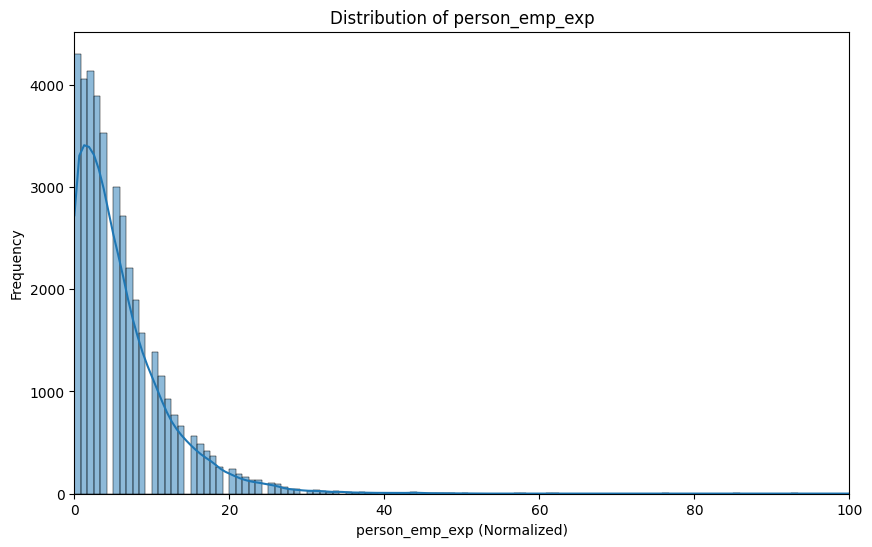

In [ ]:
# Visualize the distribution of 'person_income' using a histogram or bar plot
plt.figure(figsize=(10, 6))
sns.histplot(data['person_emp_exp'], bins=150, kde=True)
plt.xlabel('person_emp_exp (Normalized)')
plt.ylabel('Frequency')
plt.title('Distribution of person_emp_exp')
plt.xlim(0, 100)
plt.show()

essendo circa 10k entrate su un dataset di 45k entrate l'eliminazione dei dati potrebbe compromettere la bontà del dataset

si può notare che le vari features non hanno distribuzione perfettamente normale. Dato che , però, i valori che causano l'anomalia sulla distribuzione sono relativamente circoscritti non è necessaria un ulteriore normalizzazione (ulteriori info sotto)

loan_percent_income è definito con "Loan amount as a percentage of annual income" quindi droppo loan_percent_income per evitare multicollinarità

In [ ]:
if 'previous_loan_defaults_on_file' in data.columns:
    initial_rows = len(data)
    data = data[data['previous_loan_defaults_on_file'] != 'Yes'].copy() # Keep rows where the value is not 'Yes'
    rows_removed = initial_rows - len(data)
    print(f"Rimosse {rows_removed} righe dove 'previous_loan_defaults_on_file' era 'Yes'.")
    display(data.head())
else:
    print("La colonna 'previous_loan_defaults_on_file' non è presente nel DataFrame.")

Rimosse 20151 righe dove 'previous_loan_defaults_on_file' era 'Yes'.


,person_age,person_gender,person_education,person_income,person_emp_exp,person_home_ownership,loan_amnt,loan_intent,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,credit_score,previous_loan_defaults_on_file,loan_status
2,25.0,female,High School,12438.0,3,MORTGAGE,5500.0,MEDICAL,12.87,0.44,3.0,635,No,1
4,24.0,male,Master,66135.0,1,RENT,35000.0,MEDICAL,14.27,0.53,4.0,586,No,1
5,21.0,female,High School,12951.0,0,OWN,2500.0,VENTURE,7.14,0.19,2.0,532,No,1
6,26.0,female,Bachelor,93471.0,1,RENT,35000.0,EDUCATION,12.42,0.37,3.0,701,No,1
7,24.0,female,High School,95550.0,5,RENT,35000.0,MEDICAL,11.11,0.37,4.0,585,No,1


In [ ]:
data = data.drop('loan_percent_income', axis = 1)

In [ ]:
data = data.drop('previous_loan_defaults_on_file', axis = 1)
display(data.head())

,person_age,person_gender,person_education,person_income,person_emp_exp,person_home_ownership,loan_amnt,loan_intent,loan_int_rate,cb_person_cred_hist_length,credit_score,loan_status
2,25.0,female,High School,12438.0,3,MORTGAGE,5500.0,MEDICAL,12.87,3.0,635,1
4,24.0,male,Master,66135.0,1,RENT,35000.0,MEDICAL,14.27,4.0,586,1
5,21.0,female,High School,12951.0,0,OWN,2500.0,VENTURE,7.14,2.0,532,1
6,26.0,female,Bachelor,93471.0,1,RENT,35000.0,EDUCATION,12.42,3.0,701,1
7,24.0,female,High School,95550.0,5,RENT,35000.0,MEDICAL,11.11,4.0,585,1


In [ ]:
def downsampling(oldata):

    data = oldata.copy()

    # Conta le occorrenze delle classi di loan_status
    class_counts = data['loan_status'].value_counts()

    # Identifica la classe minoritaria e maggioritaria
    minority_class = class_counts.idxmin()
    majority_class = class_counts.idxmax()
    minority_count = class_counts[minority_class]
    majority_count = class_counts[majority_class]

    # DataFrame per la classe minoritaria
    minority_df = data[data['loan_status'] == minority_class]

    # DataFrame per la classe maggioritaria
    majority_df = data[data['loan_status'] == majority_class]

    # Downsampling della classe maggioritaria per avere lo stesso numero di campioni della classe minoritaria
    # Manteniamo random_state qui per la riproducibilità della selezione del sottoinsieme
    majority_downsampled = majority_df.sample(n=minority_count, random_state=420)

    # Concatena i DataFrame bilanciati
    balanced_df = pd.concat([minority_df, majority_downsampled])

    # Resetta l'indice del DataFrame bilanciato e mescola le righe per la riproducibilità
    data = balanced_df.sample(frac=1, random_state=420).reset_index(drop=True).copy()

    return data

In [ ]:
def fitEncoding(X_train,y_train,X_test,y_test):

  xv_train = X_train.copy()
  yv_train = y_train.copy()
  xv_test = X_test.copy()
  yv_test = y_test.copy()

  categorical_cols = ['person_gender','person_education', 'person_home_ownership', 'loan_intent']

  # fitting dell' encoder
  encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False, drop='first')
  encoder.fit(xv_train[categorical_cols])

  encoded_features_train = encoder.transform(xv_train[categorical_cols])
  encoded_features_test = encoder.transform(xv_test[categorical_cols])

  # Crea DataFrame dalle feature codificate
  # È cruciale usare gli stessi indici e nomi di colonna per una corretta unione
  encoded_df_train = pd.DataFrame(encoded_features_train,
                                    columns=encoder.get_feature_names_out(categorical_cols),
                                    index=xv_train.index)

  encoded_df_test = pd.DataFrame(encoded_features_test,
                                   columns=encoder.get_feature_names_out(categorical_cols),
                                   index=xv_test.index)

  # Rimuovi le colonne categoriche originali e concatena le nuove colonne codificate
  X_train_processed = pd.concat([xv_train.drop(columns=categorical_cols), encoded_df_train], axis=1)
  X_test_processed = pd.concat([xv_test.drop(columns=categorical_cols), encoded_df_test], axis=1)



  return X_train_processed,yv_train,X_test_processed,yv_test

In [ ]:
def sporcaX(X_train, y_train, inconsistenza=0,nan=0,ripetizioni=0,selezioni=0,MIA=0,input_err=0):

    xv_train = X_train.copy()
    yv_train = y_train.copy()

    # unione target al dataset per le sporcature per quando necessario avere entrambe

    df_unified = pd.concat([xv_train, yv_train], axis=1)

    # Errori di selezione
    #ipotizza che la compilazione di un dataset abbia alcuni elementi (categorici + target) compilabili attraverso la selezione di varie opzioni in un menu a tendina, questo simula l'errore in tale selezione
    #person_gender: ['female' 'male']  -> swap
    #person_education: ['Master' 'High School' 'Bachelor' 'Associate' 'Doctorate'] -> random sobstitution
    #person_home_ownership: ['RENT' 'OWN' 'MORTGAGE' 'OTHER'] -> random sobstitution
    #loan_intent: ['PERSONAL' 'EDUCATION' 'MEDICAL' 'VENTURE' 'HOMEIMPROVEMENT' 'DEBTCONSOLIDATION'] -> random sobstitution
    #loan_status (target): [0,1] -> swap

    if selezioni > 0:

      selectable_cols_name = ['person_gender','person_education', 'person_home_ownership', 'loan_intent','loan_status']
      df_unified_subset = df_unified[selectable_cols_name].copy()

      num_selection_errors = int(df_unified_subset.size * selezioni)
      if num_selection_errors > 0:
        # Ensure we don't try to add more selection errors than there are cells
        num_selection_errors = min(num_selection_errors, df_unified_subset.size)
        # Use random.sample for efficiency if adding many error values
        all_cell_indices = [(r, c) for r in range(df_unified_subset.shape[0]) for c in range(df_unified_subset.shape[1])]
        missing_cell_indices = random.sample(all_cell_indices, num_selection_errors)

        person_gender = 0
        person_education = 0
        person_home_ownership = 0
        loan_intent = 0
        loan_status = 0


        for row_idx, col_idx in missing_cell_indices:
              col_name = df_unified_subset.columns[col_idx] # Get column name from index

              #potrebbe essere migliorata con una lista mappata, ma per ora lasciamo così (principalmente per testing,debugging ed affini)

              if col_name == 'loan_status':
                loan_status += 1
                current_value = df_unified_subset.iloc[row_idx, col_idx]
                new_value = 1 - current_value # Invert the value 1-1 = 0 ; 1-0 = 1
                df_unified_subset.iloc[row_idx, col_idx] = new_value

              elif col_name == 'person_gender':
                person_gender += 1
                current_value = df_unified_subset.iloc[row_idx, col_idx]
                new_value = 'male' if current_value == 'female' else ('female' if current_value == 'male' else current_value)
                df_unified_subset.iloc[row_idx, col_idx] = new_value

              elif col_name == 'person_education':
                person_education += 1
                current_value = df_unified_subset.iloc[row_idx, col_idx]
                list_of_values = ['Master', 'High School', 'Bachelor', 'Associate', 'Doctorate']
                list_of_values.remove(current_value)
                new_value = random.choice(list_of_values)
                df_unified_subset.iloc[row_idx, col_idx] = new_value

              elif col_name == 'person_home_ownership':
                person_home_ownership += 1
                current_value = df_unified_subset.iloc[row_idx, col_idx]
                list_of_values = ['RENT', 'OWN', 'MORTGAGE', 'OTHER']
                list_of_values.remove(current_value)
                new_value = random.choice(list_of_values)
                df_unified_subset.iloc[row_idx, col_idx] = new_value

              elif col_name == 'loan_intent':
                loan_intent += 1
                current_value = df_unified_subset.iloc[row_idx, col_idx]
                list_of_values = ['PERSONAL', 'EDUCATION', 'MEDICAL', 'VENTURE', 'HOMEIMPROVEMENT', 'DEBTCONSOLIDATION']
                list_of_values.remove(current_value)
                new_value = random.choice(list_of_values)
                df_unified_subset.iloc[row_idx, col_idx] = new_value

              else:
                print(f"valore non gestito:{df_unified_subset.iloc[row_idx, col_idx]} , colonna: {col_name}, tipo: {type(df_unified_subset.iloc[row_idx, col_idx])} ")

      ## aggiornamento del dataset
      df_unified_dropped = df_unified.drop(columns=selectable_cols_name)
      data_uncleaned = pd.concat([df_unified_dropped, df_unified_subset], axis=1)

      ## divisione target e test
      xv_train = data_uncleaned.drop('loan_status', axis=1) # loan status è il nome della target nel nostro dataset
      yv_train = data_uncleaned['loan_status']

      print('')
      print('modifiche in:')
      print(f'person_gender: {person_gender}')
      print(f'person_education: {person_education}')
      print(f'person_home_ownership: {person_home_ownership}')
      print(f'loan_intent: {loan_intent}')
      print(f'loan_status: {loan_status}')
      print('')



    # Inconsistenze nei dati
    # piu' anni di lavoro (person_emp_exp) che età
    # piu' anni di credito (cb_person_cred_hist_length ) che età
    if inconsistenza > 0:
      num_inconsistent = int(len(xv_train) * 2 * inconsistenza) # max value = numrows*2 ; una riga può contenere tutte e due le incostenze

      # Colonne tra cui scegliere per le inconsistenza
      inconsistent_cols = ['person_emp_exp', 'cb_person_cred_hist_length']
      # Ottieni gli indici numerici delle colonne da corrompere
      inconsistent_col_indices = [xv_train.columns.get_loc(col) for col in inconsistent_cols]

      person_emp_exp = 0
      cb_person_cred_hist_length = 0

      # Seleziona casualmente gli indici delle righe e delle colonne
      if num_inconsistent > 0:
        # Creare una lista di tutte le possibili combinazioni (riga, colonna) per le colonne selezionate
        all_cell_indices = [(r, c_idx) for r in range(xv_train.shape[0]) for c_idx in inconsistent_col_indices]

        # Assicurati di non selezionare più celle di quelle disponibili
        num_inconsistent = min(num_inconsistent, len(all_cell_indices))
        # Seleziona casualmente gli indici delle celle
        inconsistent_cell_indices = random.sample(all_cell_indices, num_inconsistent)

        for row_idx, col_idx in inconsistent_cell_indices:
          col_name = xv_train.columns[col_idx] # Get column name from index

          if col_name == 'person_emp_exp':
            person_emp_exp += 1
            current_value= xv_train.iloc[row_idx, col_idx] # anni di lavoro
            new_value = int (current_value + xv_train.iloc[row_idx, col_idx]) # anni di lavoro pari o maggiori dell' età
            xv_train.iloc[row_idx, col_idx] = new_value

          elif col_name == 'cb_person_cred_hist_length':
            cb_person_cred_hist_length += 1
            current_value= xv_train.iloc[row_idx, col_idx] # anni di credito
            new_value = float (current_value + xv_train.iloc[row_idx, col_idx]) # anni di credito pari o maggiori dell' età
            xv_train.iloc[row_idx, col_idx] = new_value

          else:
            print(f"valore non gestito:{xv_train.iloc[row_idx, col_idx]} , colonna: {col_name}, tipo: {type(xv_train.iloc[row_idx, col_idx])} ")

        print('')
        print('inconsistenze in:')
        print(f'person_emp_exp: {person_emp_exp}')
        print(f'cb_person_cred_hist_length: {cb_person_cred_hist_length}')
        print('')

    # errore di input
    # es: per un numerico 96 diventa 69, per il categorico ciao, ciiao e simili, errori di maiuscole-minuscole, spazi/ spazi multipli, caratteri speciali quali quello di acapo ";"
    # in teroria posso sporcare anche il target senza incappare in errori di training
    if input_err > 0:
      num_input_errors = int(df_unified.size * input_err)
      loan_status = 0
      float_point_to_comma = 0
      int_swap_first_two_digits = 0
      str_swap_consecutive_char=0
      str_duplicate_random_char=0
      str_first_case_change=0
      str_endswith_multiple_spaces=0
      str_add_random_separator=0
      str_add_new_line_char=0

      if num_input_errors > 0:
        # Ensure we don't try to add more input errors than there are cells
        num_input_errors = min(num_input_errors, df_unified.size)
        # Use random.sample for efficiency if adding many
        all_cell_indices = [(r, c) for r in range(df_unified.shape[0]) for c in range(df_unified.shape[1])]
        input_cell_indices = random.sample(all_cell_indices, num_input_errors)

        for row_idx, col_idx in input_cell_indices:
          col_name = df_unified.columns[col_idx] # Get column name from index
          if col_name == 'loan_status':
            loan_status +=1
            df_unified.iloc[row_idx, col_idx] =  random.choice([np.nan,2]) if (df_unified.iloc[row_idx, col_idx]) == 1  else random.choice([np.nan,9])

          elif isinstance(df_unified.iloc[row_idx, col_idx], (float, np.floating)): # se è un numero non target float
            value= df_unified.iloc[row_idx, col_idx]
            df_unified.iloc[row_idx, col_idx] =f"{value:.2f}".replace('.', ',') # se è float sostituisci i . con le ,
            float_point_to_comma +=1

          elif isinstance(df_unified.iloc[row_idx, col_idx], (int, np.integer)): # se è un numero non target int:
                value= df_unified.iloc[row_idx, col_idx]
                if int(value) > 9:
                  number = int(df_unified.iloc[row_idx, col_idx])
                  str_number = str(number)
                  # Swap the first two digits
                  new_number = int (str_number[1] + str_number[0] + str_number[2:]) # swap dei primi due caratteri di un numero intero
                  df_unified.iloc[row_idx, col_idx] = new_number
                  int_swap_first_two_digits +=1

          elif isinstance(df_unified.iloc[row_idx, col_idx], str):
            old_str = df_unified.iloc[row_idx, col_idx]
            error_type = random.choice(['swap', 'duplicate','case_change','spazio_multiplo','separatore','acapo'])
            if error_type == 'swap': # inverte l'ordine di due caratteri consecutivi
              str_swap_consecutive_char +=1
              if len(old_str) >= 2:
                swap_index = random.randint(0, len(old_str) - 2)
                new_str = list(old_str)
                new_str[swap_index], new_str[swap_index + 1] = new_str[swap_index + 1], new_str[swap_index]
                df_unified.iloc[row_idx, col_idx] = "".join(new_str)
            elif error_type == 'duplicate': #duplica un carattere randomico
              str_duplicate_random_char +=1
              duplicate_index = random.randint(0, len(old_str) - 1)
              new_str = list(old_str)
              new_str.insert(duplicate_index, new_str[duplicate_index])
              df_unified.iloc[row_idx, col_idx] = "".join(new_str)
            elif error_type == 'case_change': #inverte la prima carattere in maiuscola o minuscola
              str_first_case_change +=1
              new_str = list(old_str)
              new_str[0].swapcase()
              df_unified.iloc[row_idx, col_idx] = "".join(new_str)
            elif error_type =='spazio_multiplo':
              str_endswith_multiple_spaces +=1
              new_str = old_str + ' ' * random.randint(1,5)
              df_unified.iloc[row_idx, col_idx] = new_str
            elif error_type =='separatore':
              str_add_random_separator +=1
              new_str = old_str+ random.choice([';','  ']) # separatori sono ; e tabulazione(rari dataset)
              df_unified.iloc[row_idx, col_idx] = new_str
            elif error_type =='acapo':
              str_add_new_line_char +=1
              new_str = old_str + '\n'
              df_unified.iloc[row_idx, col_idx] = new_str
          else:
            print(f"valore non gestito:{df_unified.iloc[row_idx, col_idx]} , colonna: {col_name}, tipo: {type(df_unified.iloc[row_idx, col_idx])} ")
        print('')
        print('input error types added:')
        print(f'loan_status: {loan_status}')
        print(f'float_point_to_comma: {float_point_to_comma}')
        print(f'int_swap_first_two_digits: {int_swap_first_two_digits}')
        print(f'str_swap_consecutive_char: {str_swap_consecutive_char}')
        print(f'str_duplicate_random_char: {str_duplicate_random_char}')
        print(f'str_first_case_change: {str_first_case_change}')
        print(f'str_endswith_multiple_spaces: {str_endswith_multiple_spaces}')
        print(f'str_add_random_separator: {str_add_random_separator}')
        print(f'str_add_new_line_char: {str_add_new_line_char}')
        print('')


    # Inserimento di valori NaN
    if nan > 0:
      # Select only numerical columns for NaN injection
      numerical_cols = xv_train.select_dtypes(include=np.number).columns.tolist()
      if numerical_cols: # Check if there are numerical columns
          num_nan_cells = int(len(xv_train) * len(numerical_cols) * nan)
          if num_nan_cells > 0:
              # Ensure indices are within bounds
              num_nan_cells = min(num_nan_cells, len(xv_train) * len(numerical_cols))
              # Select random row indices
              row_indices = np.random.randint(0, len(xv_train), num_nan_cells)
              # Select random column indices from numerical columns
              col_indices_in_numerical = np.random.randint(0, len(numerical_cols), num_nan_cells)
              # Map back to original DataFrame column names
              col_names_to_corrupt = [numerical_cols[i] for i in col_indices_in_numerical]

              # Apply NaN based on selected row and numerical column names
              for r_idx, col_name in zip(row_indices, col_names_to_corrupt):
                  xv_train.loc[xv_train.index[r_idx], col_name] = np.nan # Use .loc with actual index

    ## eliminazione valori (MIA)

    if MIA > 0:
      #verisone che inserisce MIAs anche nel target, assume che se il target è mancante è posto = 0 (nessun prestito effettuato)
      # considerare di eliminare la riga dal dataset se viene eliminata una variabile target
      num_missing_values = int(xv_train.size * MIA)
      if num_missing_values > 0:
        # Ensure we don't try to add more missing values than there are cells
        num_missing_values = min(num_missing_values, xv_train.size)
        # Use random.sample for efficiency if adding many missing values
        all_cell_indices = [(r, c) for r in range(xv_train.shape[0]) for c in range(xv_train.shape[1])]
        missing_cell_indices = random.sample(all_cell_indices, num_missing_values)
        numerical=0
        strings=0

        for row_idx, col_idx in missing_cell_indices:
              col_name = xv_train.columns[col_idx] # Get column name from index
              if isinstance(xv_train.iloc[row_idx, col_idx], (float, np.floating, int, np.integer)):
                  numerical +=1
                  xv_train.iloc[row_idx, col_idx] = np.nan # Valore sentinella per numerici
              elif isinstance(xv_train.iloc[row_idx, col_idx],(str)):
                  strings +=1
                  xv_train.iloc[row_idx, col_idx] = None # Stringa vuota per categorici
              else:
                print(f"valore non gestito:{xv_train.iloc[row_idx, col_idx]} , colonna: {col_name}, tipo: {type(xv_train.iloc[row_idx, col_idx])} ")
        print('')
        print('MIA added:')
        print(f'numerical: {numerical}')
        print(f'strings: {strings}')
        print('')




    # Ripetizione di voci del dataset
    #calcola la percentuale "ripetizioni" di elemeti da rimuovere dal dataset
    # sceglie randomicamnetne gli elementi da rimuovere e quelli da duplicare

    if ripetizioni > 0:
      num_duplicate_rows = int(len(df_unified) * ripetizioni) #utilizzo df_unified per gestire anche il target

      if num_duplicate_rows > 0:
          num_rows_to_keep = len(df_unified) - num_duplicate_rows
          # Seleziona casualmente gli indici delle righe originali da mantenere
          original_indices = random.sample(df_unified.index.tolist(), num_rows_to_keep)
          df_kept = df_unified.loc[original_indices].copy()
          # Seleziona casualmente gli indici delle righe da duplicare
          indices_for_duplicates = random.choices(df_kept.index.tolist(), k=num_duplicate_rows)
          df_duplicates = df_unified.loc[indices_for_duplicates]
          # Concatena le righe mantenute con i duplicati
          df_unified = pd.concat([df_kept, df_duplicates], ignore_index=True)
          # Reset index after concatenation to ensure a clean integer index
          df_unified.reset_index(drop=True, inplace=True)
          print(f"Aggiunti {num_duplicate_rows} duplicati. Dimensione dataset finale: {len(df_unified)}")
          # divide x e y
          xv_train = df_unified.drop('loan_status', axis=1) # loan status è il nome della target nel nostro dataset
          yv_train = df_unified['loan_status']




    return xv_train, yv_train

In [ ]:
def prepareData(data,inconsistenza=0,nan=0,ripetizioni=0,selezioni=0,MIA=0,input_err=0):

    newData = data.iloc[:,0:-1].copy() # seleziona tutto tranne l'ulltima colonna # usa .copy() per evitare SettingWithCopyWarning
    target = data.iloc[:,-1].copy() # seleziona solo l'ultima colonna ( target )

    # Assicura che newData e target abbiano lo stesso indice prima dello split
    newData.reset_index(drop=True, inplace=True)
    target.reset_index(drop=True, inplace=True)


    X_train, X_test, y_train, y_test = train_test_split(newData, target, test_size =0.30,
                                                    stratify= target, #mantiene le proporzioni delle classi differenti dato che il dataset potrebbe essere sbilanciato
                                                    random_state= 420) #fissato random seed per replicabilità


    X_train, y_train = sporcaX(X_train,y_train,inconsistenza=inconsistenza,nan=nan,ripetizioni=ripetizioni,selezioni=selezioni,MIA=MIA,input_err=input_err)

    X_train,y_train,X_test,y_test = fitEncoding(X_train,y_train,X_test,y_test) # fitta l'encoder sul train sporco e poi lo utilizza sia per lo sporco che per il pulito per coerenza

    return X_train, X_test, y_train, y_test

In [ ]:
def evaluate_model(model, X_test, y_test, y_pred, x_train_type ,y_train ,y_train_pred ,y_pred_proba=None, y_train_pred_proba=None):

    # Calculate metrics test
    accuracy = accuracy_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    auc_test = roc_auc_score(y_test, y_pred_proba)
    conf_matrix = confusion_matrix(y_test, y_pred)

    # Calculate metrics Train (for overfitting)

    acc_train = accuracy_score(y_train, y_train_pred)
    f1_train = f1_score(y_train, y_train_pred)
    auc_train = roc_auc_score(y_train, y_train_pred_proba)

    ############

    print(f"Model: {type(model).__name__}")
    print(f"Accuracy test: {accuracy:.4f} | Accuracy Training: {acc_train:.4f}")
    print(f"F1-score test: {f1:.4f} | F1-score Training: {f1_train:.4f}")
    print(f"roc_AUC-score test:{auc_test:.4f} | roc_AUC-score Training:      {auc_train:.4f}")

    # Indice di Overfitting (differenza tra training e test performance)
    # Una differenza maggiore indica più overfitting.
    print(f"Differenza Accuracy: {acc_train - accuracy:.4f}")
    print(f"Differenza F1-score: {f1_train - f1:.4f}")
    print(f"Differenza AUC:      {auc_train - auc_test:.4f}")
    ####################
    # verifica features utilizzate
    if type(model).__name__ != 'MLPClassifier':
      feature_names = x_train_type.columns
      # non è possibile stampare le features utilizzate per il neural a causa della mancanza nel dataframe
      # utilizzato del comando per ottenere il nome delle colonne
      # però i risultati del decision sono così simili che possiamo assumere che vengano utilizzate le stesse features o molto simili
      if type(model).__name__ == 'DecisionTreeClassifier':
        print("Importanza delle Feature per Decision Tree:")
        # Ottieni l'importanza delle feature dall'attributo del modello
        importances = model.feature_importances_
        # Crea una serie per visualizzare meglio
        feature_importances_dt = pd.Series(importances, index=feature_names).sort_values(ascending=False)

        # Stampa l'importanza delle feature in formato testuale
        for feature, importance in feature_importances_dt.items():
          if importance > 0:
            if importance > 0.001:
              print(f"'{feature}': {importance:.4f}")
            else:
              print(f"'{feature}': {importance:.4e}")
      elif type(model).__name__ == 'GaussianNB':

        #stima dell' importanza
        print("\nImportanza delle Feature (stimata con Permutation Importance) per Gaussian Naive Bayes:")
        # Calcola la permutation importance per Gaussian Naive Bayes
        # Usiamo il test set per valutare l'importanza su dati non visti
        perm_importance_gnb = permutation_importance(model, X_test, y_test, random_state=42)

        # Crea una serie per visualizzare meglio, usando le medie dell'importanza
        feature_importances_gnb = pd.Series(perm_importance_gnb.importances_mean, index=feature_names).sort_values(ascending=False)
        for feature, importance in feature_importances_gnb.items():
          if importance != 0 :
            if importance > 0.001 or  importance < -0.001 :
              print(f"'{feature}': {importance:.4f}")
            else:
              print(f"'{feature}': {importance:.4e}")
    else: #test MLPClass
      feature_names_MLP = x_train_type.columns
      #print(list(feature_names_MLP))
      print("\nImportanza delle Feature (stimata con Permutation Importance) per MLP:")
      # Convert X_test to a NumPy array before calculating permutation importance
      perm_importance_mlp = permutation_importance(model, X_test.values, y_test, random_state=42)

      # Crea una serie per visualizzare meglio, usando le medie dell' importanza
      feature_importances_mlp = pd.Series(perm_importance_mlp.importances_mean, index=feature_names_MLP).sort_values(ascending=False)

      # Print the entire series to see all importance scores
      print(feature_importances_mlp)



    # Calculate ROC curve and AUC
    if y_pred_proba is not None:
        fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
        roc_auc = auc(fpr, tpr)
        print(f"AUC: {roc_auc:.4f}")

        # Plot ROC curve
        plt.figure(figsize=(8, 6))
        plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('Receiver Operating Characteristic (ROC) Curve')
        plt.legend(loc="lower right")
        plt.show()
    else:
        print("AUC not calculated as predicted probabilities were not provided.")


    # Plot Confusion Matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False,
                xticklabels=['Predicted 0', 'Predicted 1'],
                yticklabels=['Actual 0', 'Actual 1'])
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title('Confusion Matrix')
    plt.show()

In [ ]:


def runTestset(oldata,inconsistenza=0,nan=0,ripetizioni=0,selezioni=0,MIA=0,input_err=0):

  data = oldata.copy()

  data = downsampling(data)

  X_train, X_test, y_train, y_test = prepareData(data,inconsistenza=inconsistenza,nan=nan,ripetizioni=ripetizioni,selezioni=selezioni,MIA=MIA,input_err=input_err)

  # initiate list to store models and predictions
  models = []

  # initiate x_train_type to store X_train used
  x_train_type = []

  ####### Imputation for NaN values

  #  imputer for NaN values
  imputer = SimpleImputer(missing_values=np.nan, strategy='mean')

  # Fit on training data and transform both training and test data
  X_train_imputed = imputer.fit_transform(X_train)
  X_test_imputed = imputer.transform(X_test)

  # Convert back to DataFrame to retain column names
  # Use the index from the original X_train/X_test to maintain alignment
  X_train_imputed = pd.DataFrame(X_train_imputed, columns=X_train.columns, index=X_train.index)
  X_test_imputed = pd.DataFrame(X_test_imputed, columns=X_test.columns, index=X_test.index)



  ######## naive-bayes
  gnb = GaussianNB()
  # Use the imputed data for training and prediction
  gnb.fit(X_train_imputed, y_train)

  y_pred_gnb = gnb.predict(X_test_imputed)
  y_train_pred_gnb = gnb.predict(X_train_imputed)


  # GaussianNB might raise errors or behave unexpectedly with NaNs if not handled -> imputed NaNs
  models.append({
      'name': 'Naive Bayes',
      'model': gnb,
      'y_pred': y_pred_gnb,
      'y_pred_proba': gnb.predict_proba(X_test_imputed)[:, 1], # Get probability for the positive class
      'y_train_pred': y_train_pred_gnb,
      'y_train_pred_proba': gnb.predict_proba(X_train_imputed)[:, 1] # Get probability for the positive class
  })

  x_train_type.append({
      'name': 'Naive Bayes',
      'x_train': X_train_imputed
  })


  ######## decision-tree

  dtc = DecisionTreeClassifier(random_state=42, max_depth=6, min_samples_split=3)

  # Use the imputed data for training and prediction

  dtc.fit(X_train_imputed, y_train)

  y_pred_dtc = dtc.predict(X_test_imputed)
  y_train_pred_dtc = dtc.predict(X_train_imputed)

  # DTC can sometimes handle NaNs, but behavior varies. Used imputed data for consistency.
  models.append({
      'name': 'Decision Tree',
      'model': dtc,
      'y_pred': y_pred_dtc,
      'y_pred_proba': dtc.predict_proba(X_test_imputed)[:, 1], # Get probability for the positive class
      'y_train_pred': y_train_pred_dtc,
      'y_train_pred_proba': dtc.predict_proba(X_train_imputed)[:, 1] # Get probability for the positive class
  })

  x_train_type.append({
      'name': 'Decision Tree',
      'x_train': X_train_imputed
  })

  ###### neural network

  # Inizializziamo lo StandardScaler (necessario per il nn)
  scaler = StandardScaler()

  # Applichiamo lo scaling solo alle feature numeriche
  # Scaliamo il training set e poi trasformiamo il test set con lo stesso scaler
  X_train_scaled = scaler.fit_transform(X_train_imputed)
  X_test_scaled = scaler.transform(X_test_imputed)

  # Creiamo un'istanza della Rete Neurale
  # hidden_layer_sizes: Una tupla che specifica il numero di neuroni in ogni strato nascosto.
  #                     in questo caso: un solo strato nascosto con tot neuroni.
  # activation: Funzione di attivazione per gli strati nascosti ('relu' è il piu' utilizzato).
  # solver: Algoritmo per l'ottimizzazione dei pesi ('adam' è un default).
  # max_iter: Numero massimo di epoche.
  # random_state: Per riproducibilità.
  # alpha: Termine di regolarizzazione L2 (per prevenire overfitting).
  # learning_rate_init: Tasso di apprendimento iniziale.
  nn_model = MLPClassifier(
      hidden_layer_sizes=(30,),  # Un singolo strato nascosto con tot neuroni
     activation='relu',         # Funzione di attivazione ReLU
     solver='adam',             # Ottimizzatore Adam
     max_iter=5000,              # Numero massimo di epoche
     random_state=42,           # Random state per riproducibilità
     alpha=0.0001,              # Regolarizzazione L2 (piccola)
     learning_rate_init=0.01   # Tasso di apprendimento
  )

  # Addestramento della Rete Neurale sul training set scalato

  nn_model.fit(X_train_scaled, y_train)

  y_train_pred_nn = nn_model.predict(X_train_scaled)
  y_test_pred_nn = nn_model.predict(X_test_scaled)

  # Select only the probability for the positive class  (used later in models.append ecc)
  y_train_pred_proba_nn = nn_model.predict_proba(X_train_scaled)[:, 1]
  y_test_pred_proba_nn = nn_model.predict_proba(X_test_scaled)[:, 1]


  models.append({
      'name': 'Neural Network',
      'model': nn_model,
      'y_pred': y_test_pred_nn,
      'y_pred_proba':y_test_pred_proba_nn, # Get probability for the positive class
      'y_train_pred': y_train_pred_nn,
      'y_train_pred_proba': y_train_pred_proba_nn # Get probability for the positive class
  })


  x_train_type.append({
      'name': 'Neural Network',
      'x_train': X_train_imputed
  })


  return X_test, y_test, y_train, models, x_train_type

In [ ]:
def main(oldata,inconsistenza=0,nan=0,ripetizioni=0,selezioni=0,MIA=0,input_err=0):

  X_test, y_test, y_train ,models,x_train_type = runTestset(oldata.copy(),inconsistenza=inconsistenza,nan=nan,ripetizioni=ripetizioni,selezioni=selezioni,MIA=MIA,input_err=input_err)

  for model in models:
    current_x_train_info = next(item for item in x_train_type if item["name"] == model["name"])
    current_x_train = current_x_train_info["x_train"]
    # Pass X_test and y_test ecc.. from the unpacked values to evaluate_model
    evaluate_model(model = model['model'], x_train_type = current_x_train,y_train = y_train ,X_test = X_test,y_test= y_test, y_pred=model.get('y_pred'), y_pred_proba=model.get('y_pred_proba'),y_train_pred=model.get('y_train_pred'),y_train_pred_proba=model.get('y_train_pred_proba'))

##caso pulito

Model: GaussianNB
Accuracy test: 0.6270 | Accuracy Training: 0.6351
F1-score test: 0.6935 | F1-score Training: 0.7023
roc_AUC-score test:0.7312 | roc_AUC-score Training:      0.7429
Differenza Accuracy: 0.0082
Differenza F1-score: 0.0087
Differenza AUC:      0.0116

Importanza delle Feature (stimata con Permutation Importance) per Gaussian Naive Bayes:
'loan_int_rate': 0.0532
'person_income': 0.0392
'credit_score': 0.0133
'loan_amnt': 0.0098
'person_home_ownership_RENT': 0.0012
'loan_intent_VENTURE': 3.4345e-04
'person_education_High School': 2.6712e-04
'loan_intent_EDUCATION': 1.9080e-04
'person_education_Bachelor': 1.5264e-04
'person_home_ownership_OWN': 1.1448e-04
'loan_intent_MEDICAL': 3.8161e-05
'person_education_Doctorate': -3.8161e-05
'person_education_Master': -1.1448e-04
'loan_intent_HOMEIMPROVEMENT': -1.5264e-04
'loan_intent_PERSONAL': -2.2896e-04
'cb_person_cred_hist_length': -0.0064
'person_age': -0.0084
'person_emp_exp': -0.0126
AUC: 0.7312


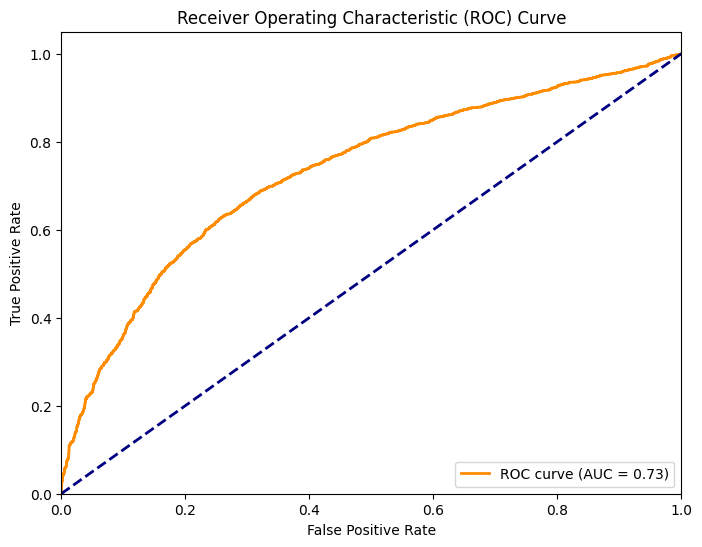

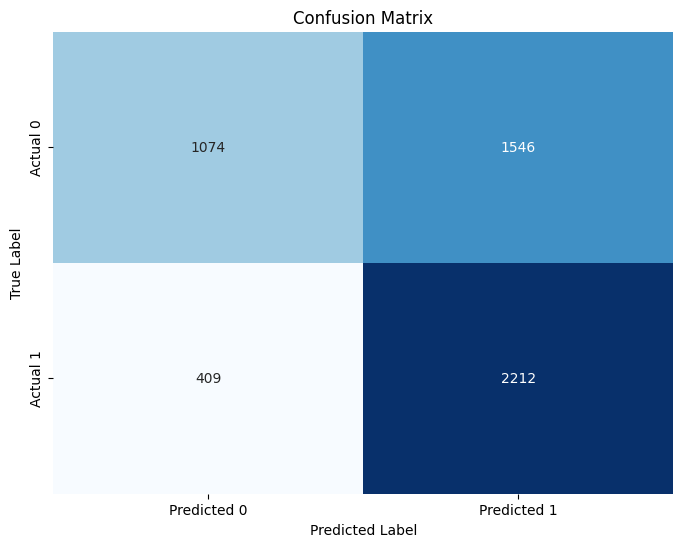

Model: DecisionTreeClassifier
Accuracy test: 0.8044 | Accuracy Training: 0.8145
F1-score test: 0.7891 | F1-score Training: 0.7999
roc_AUC-score test:0.8781 | roc_AUC-score Training:      0.8914
Differenza Accuracy: 0.0101
Differenza F1-score: 0.0107
Differenza AUC:      0.0133
Importanza delle Feature per Decision Tree:
'person_income': 0.3486
'loan_int_rate': 0.2915
'loan_amnt': 0.1348
'person_home_ownership_RENT': 0.1307
'credit_score': 0.0264
'person_home_ownership_OWN': 0.0159
'loan_intent_HOMEIMPROVEMENT': 0.0145
'loan_intent_MEDICAL': 0.0138
'loan_intent_VENTURE': 0.0068
'loan_intent_PERSONAL': 0.0063
'loan_intent_EDUCATION': 0.0059
'person_age': 0.0027
'cb_person_cred_hist_length': 0.0017
'person_education_Doctorate': 2.9884e-04
AUC: 0.8781


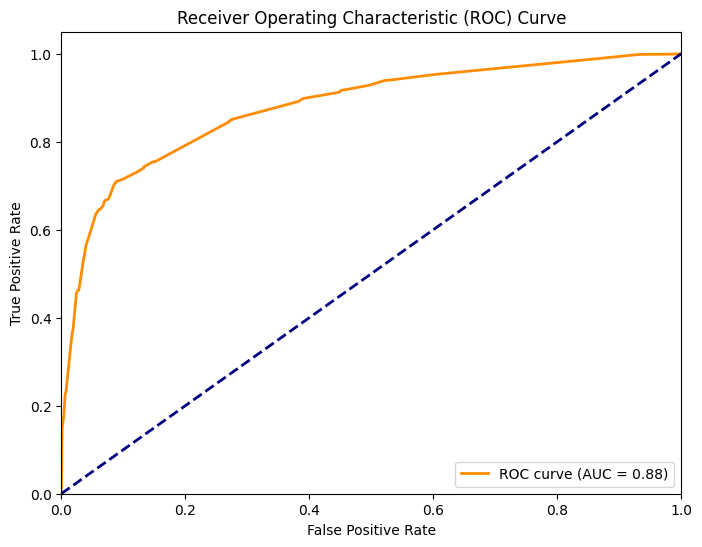

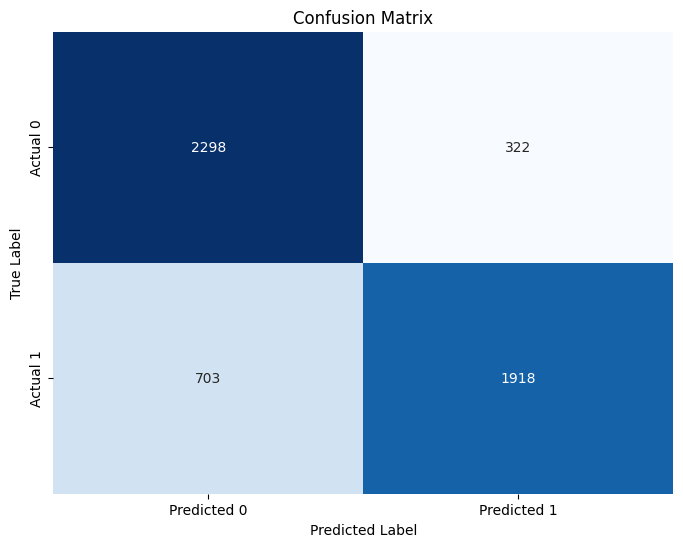

Model: MLPClassifier
Accuracy test: 0.8212 | Accuracy Training: 0.8376
F1-score test: 0.8144 | F1-score Training: 0.8320
roc_AUC-score test:0.8981 | roc_AUC-score Training:      0.9252
Differenza Accuracy: 0.0164
Differenza F1-score: 0.0176
Differenza AUC:      0.0271

Importanza delle Feature (stimata con Permutation Importance) per MLP:
person_age                      0.000000
person_emp_exp                  0.000000
cb_person_cred_hist_length      0.000000
loan_int_rate                   0.000000
person_home_ownership_OTHER     0.000000
person_home_ownership_OWN       0.000000
credit_score                    0.000000
person_gender_male              0.000000
person_education_Bachelor       0.000000
person_education_Doctorate      0.000000
person_education_High School    0.000000
person_education_Master         0.000000
loan_intent_HOMEIMPROVEMENT     0.000000
loan_intent_MEDICAL             0.000000
person_home_ownership_RENT      0.000000
loan_intent_EDUCATION           0.000000
loa

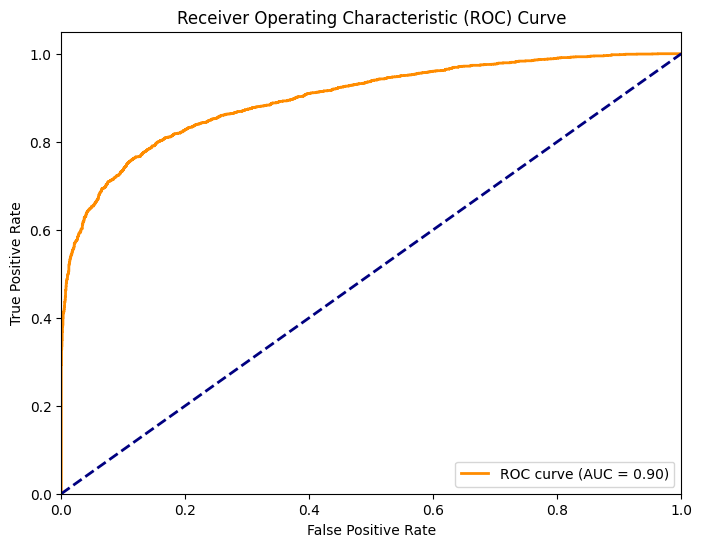

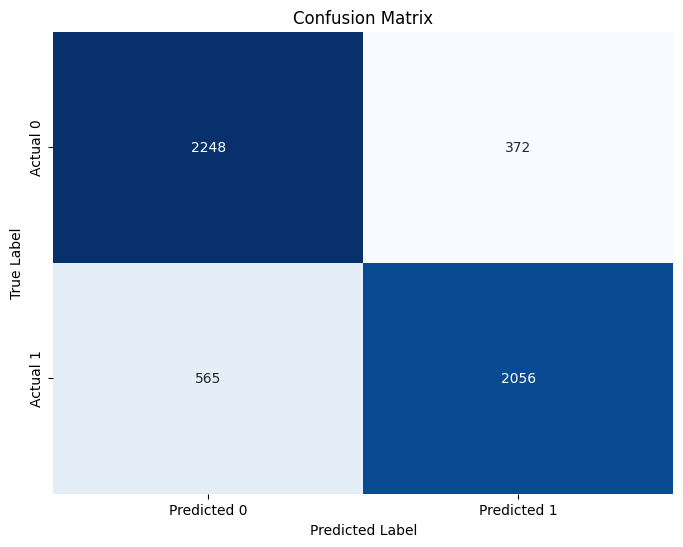

In [ ]:
main(data) ## caso pulito

## 10% di : NaN , inconsistenze , ripetizioni, selezioni, MIA, input_err

Model: GaussianNB
Accuracy test: 0.6230 | Accuracy Training: 0.6180
F1-score test: 0.6916 | F1-score Training: 0.6950
roc_AUC-score test:0.7263 | roc_AUC-score Training:      0.7275
Differenza Accuracy: -0.0049
Differenza F1-score: 0.0033
Differenza AUC:      0.0013

Importanza delle Feature (stimata con Permutation Importance) per Gaussian Naive Bayes:
'loan_int_rate': 0.0509
'person_income': 0.0400
'credit_score': 0.0148
'loan_amnt': 0.0110
'person_home_ownership_RENT': 0.0023
'loan_intent_VENTURE': 5.3425e-04
'person_home_ownership_OWN': 1.5264e-04
'person_education_High School': 1.5264e-04
'loan_intent_MEDICAL': 7.6321e-05
'loan_intent_PERSONAL': 3.8161e-05
'loan_intent_HOMEIMPROVEMENT': -3.8161e-05
'person_education_Master': -3.0529e-04
'loan_intent_EDUCATION': -3.4345e-04
'cb_person_cred_hist_length': -0.0053
'person_age': -0.0096
'person_emp_exp': -0.0107
AUC: 0.7263


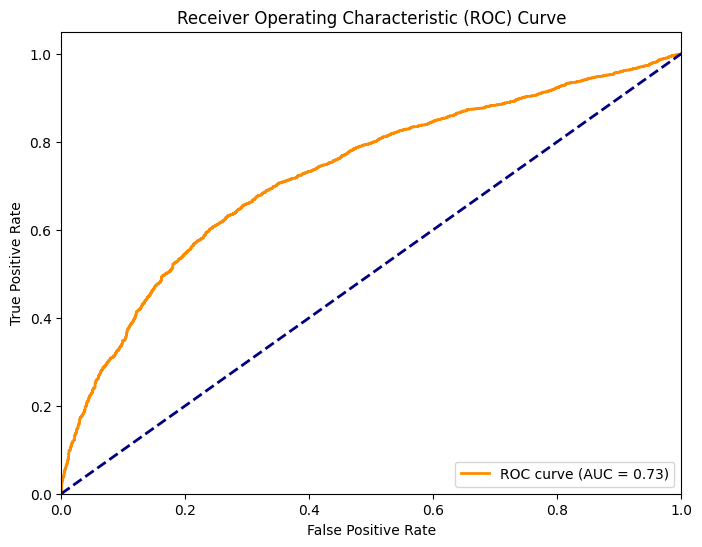

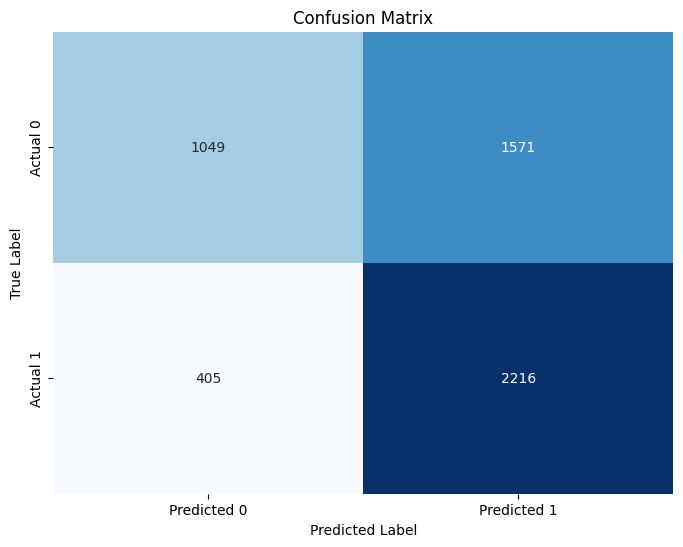

Model: DecisionTreeClassifier
Accuracy test: 0.8174 | Accuracy Training: 0.7969
F1-score test: 0.8073 | F1-score Training: 0.7784
roc_AUC-score test:0.8803 | roc_AUC-score Training:      0.8700
Differenza Accuracy: -0.0205
Differenza F1-score: -0.0290
Differenza AUC:      -0.0103
Importanza delle Feature per Decision Tree:
'person_income': 0.2959
'loan_int_rate': 0.2926
'loan_amnt': 0.1879
'person_home_ownership_RENT': 0.1283
'credit_score': 0.0308
'person_home_ownership_OWN': 0.0191
'loan_intent_MEDICAL': 0.0159
'loan_intent_HOMEIMPROVEMENT': 0.0115
'loan_intent_EDUCATION': 0.0091
'loan_intent_VENTURE': 0.0075
'cb_person_cred_hist_length': 7.5183e-04
'person_education_Bachelor': 5.7444e-04
'person_age': 9.3121e-05
'person_emp_exp': 3.0328e-05
AUC: 0.8803


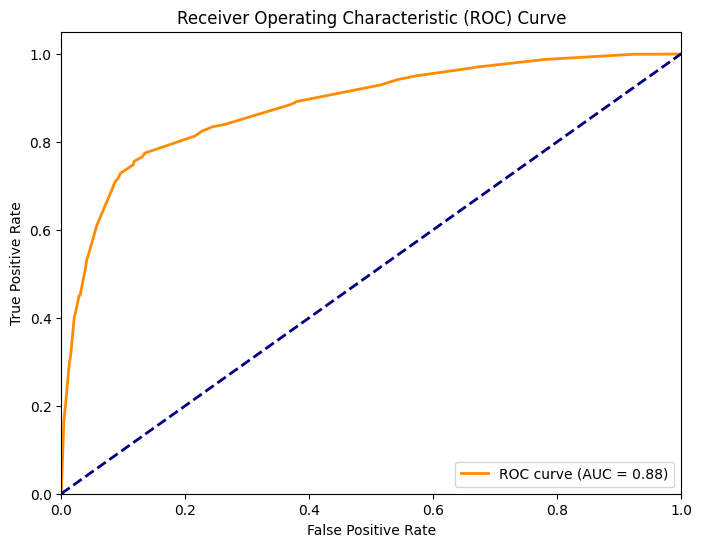

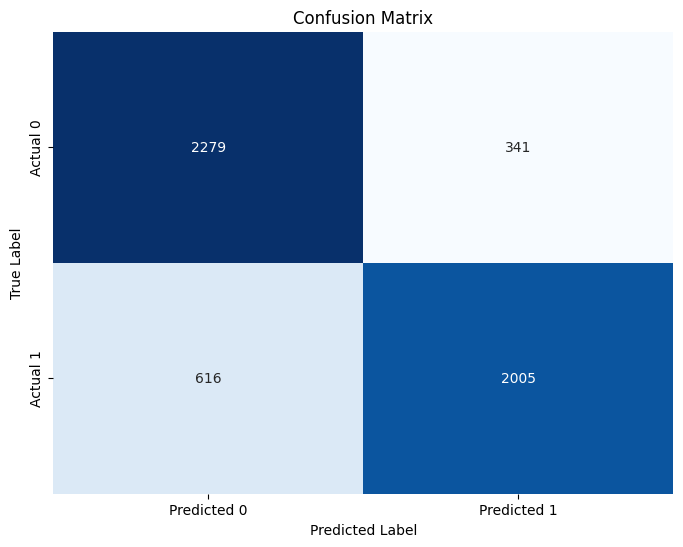

Model: MLPClassifier
Accuracy test: 0.8187 | Accuracy Training: 0.8132
F1-score test: 0.8182 | F1-score Training: 0.8075
roc_AUC-score test:0.8972 | roc_AUC-score Training:      0.9013
Differenza Accuracy: -0.0055
Differenza F1-score: -0.0107
Differenza AUC:      0.0040

Importanza delle Feature (stimata con Permutation Importance) per MLP:
person_income                   0.000038
person_age                      0.000000
person_emp_exp                  0.000000
loan_int_rate                   0.000000
person_home_ownership_OTHER     0.000000
cb_person_cred_hist_length      0.000000
credit_score                    0.000000
person_gender_male              0.000000
person_education_Bachelor       0.000000
person_education_Doctorate      0.000000
person_education_High School    0.000000
person_education_Master         0.000000
loan_intent_HOMEIMPROVEMENT     0.000000
person_home_ownership_OWN       0.000000
person_home_ownership_RENT      0.000000
loan_intent_EDUCATION           0.000000
l

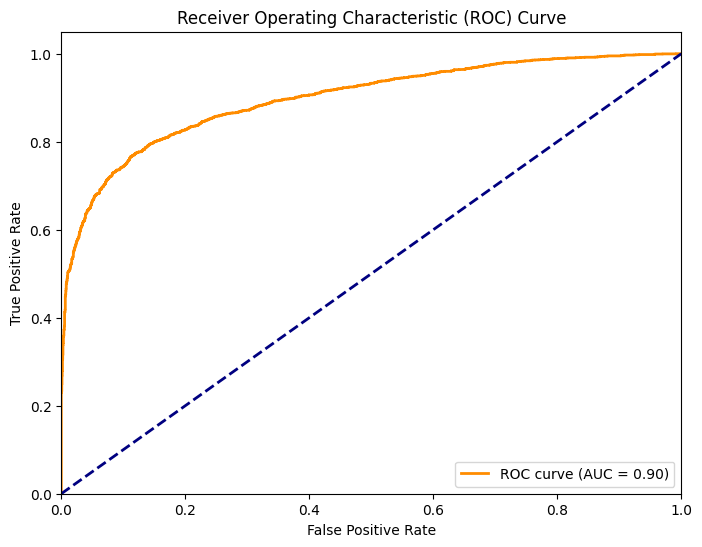

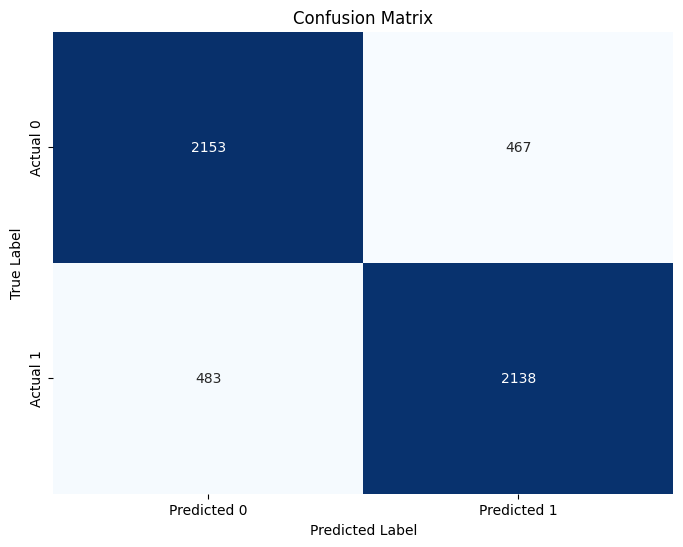

In [ ]:
main(data,nan=0.1) # caso con NaN 10%


inconsistenze in:
person_emp_exp: 1273
cb_person_cred_hist_length: 1172

Model: GaussianNB
Accuracy test: 0.6266 | Accuracy Training: 0.6364
F1-score test: 0.6965 | F1-score Training: 0.7037
roc_AUC-score test:0.7352 | roc_AUC-score Training:      0.7425
Differenza Accuracy: 0.0098
Differenza F1-score: 0.0072
Differenza AUC:      0.0073

Importanza delle Feature (stimata con Permutation Importance) per Gaussian Naive Bayes:
'loan_int_rate': 0.0544
'person_income': 0.0403
'credit_score': 0.0138
'loan_amnt': 0.0114
'person_home_ownership_RENT': 0.0022
'person_education_Bachelor': 3.4345e-04
'loan_intent_VENTURE': 3.0529e-04
'loan_intent_HOMEIMPROVEMENT': 1.5264e-04
'person_education_Master': 3.8161e-05
'loan_intent_EDUCATION': -7.6321e-05
'loan_intent_PERSONAL': -1.9080e-04
'person_education_High School': -2.6712e-04
'person_home_ownership_OWN': -3.8161e-04
'loan_intent_MEDICAL': -3.8161e-04
'cb_person_cred_hist_length': -0.0042
'person_age': -0.0081
'person_emp_exp': -0.0095
AUC: 0.735

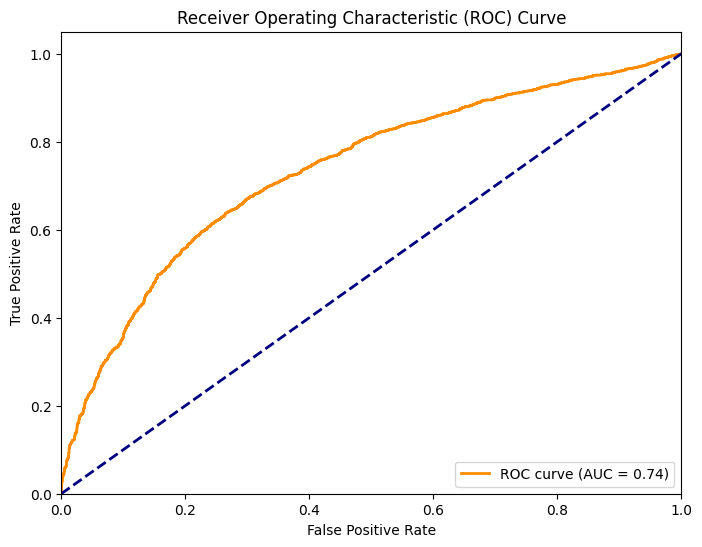

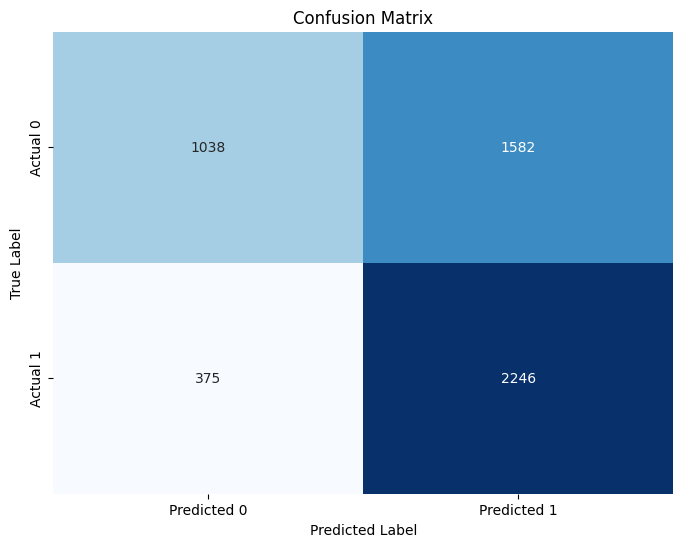

Model: DecisionTreeClassifier
Accuracy test: 0.8031 | Accuracy Training: 0.8145
F1-score test: 0.7885 | F1-score Training: 0.8007
roc_AUC-score test:0.8760 | roc_AUC-score Training:      0.8904
Differenza Accuracy: 0.0114
Differenza F1-score: 0.0122
Differenza AUC:      0.0145
Importanza delle Feature per Decision Tree:
'person_income': 0.3432
'loan_int_rate': 0.2932
'loan_amnt': 0.1349
'person_home_ownership_RENT': 0.1315
'credit_score': 0.0256
'person_home_ownership_OWN': 0.0169
'loan_intent_HOMEIMPROVEMENT': 0.0146
'loan_intent_MEDICAL': 0.0139
'loan_intent_VENTURE': 0.0069
'loan_intent_PERSONAL': 0.0064
'loan_intent_EDUCATION': 0.0059
'person_emp_exp': 0.0039
'person_age': 0.0022
'cb_person_cred_hist_length': 7.2865e-04
'person_education_Doctorate': 3.0058e-04
AUC: 0.8760


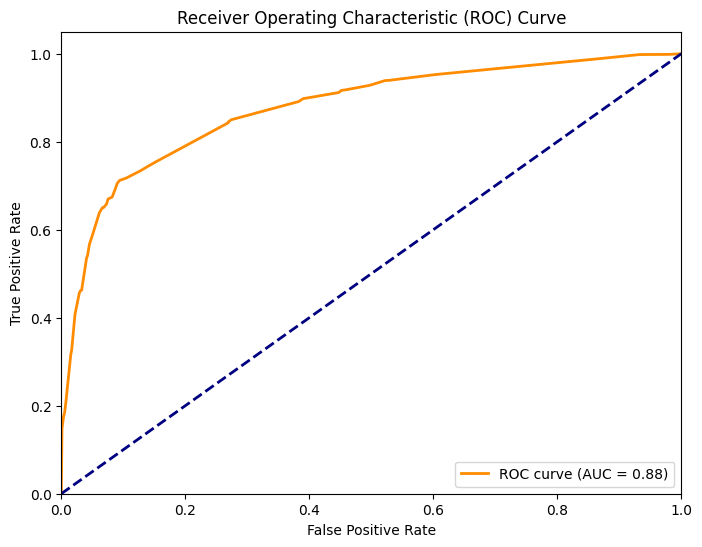

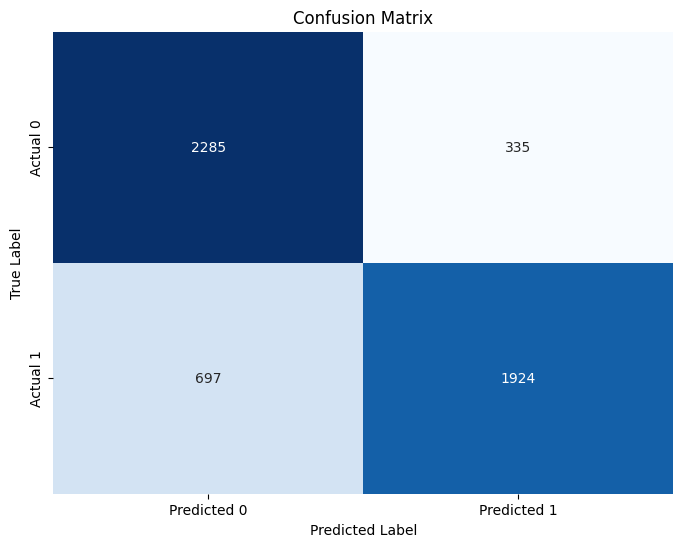

Model: MLPClassifier
Accuracy test: 0.8237 | Accuracy Training: 0.8411
F1-score test: 0.8160 | F1-score Training: 0.8340
roc_AUC-score test:0.9033 | roc_AUC-score Training:      0.9260
Differenza Accuracy: 0.0174
Differenza F1-score: 0.0180
Differenza AUC:      0.0227

Importanza delle Feature (stimata con Permutation Importance) per MLP:
person_age                      0.000000e+00
person_emp_exp                  0.000000e+00
cb_person_cred_hist_length      0.000000e+00
loan_int_rate                   0.000000e+00
person_home_ownership_OTHER     0.000000e+00
person_home_ownership_OWN       0.000000e+00
credit_score                    0.000000e+00
person_gender_male              0.000000e+00
person_education_Bachelor       0.000000e+00
person_education_Doctorate      0.000000e+00
person_education_High School    0.000000e+00
person_education_Master         0.000000e+00
loan_intent_HOMEIMPROVEMENT     0.000000e+00
loan_intent_MEDICAL             0.000000e+00
person_home_ownership_RENT   

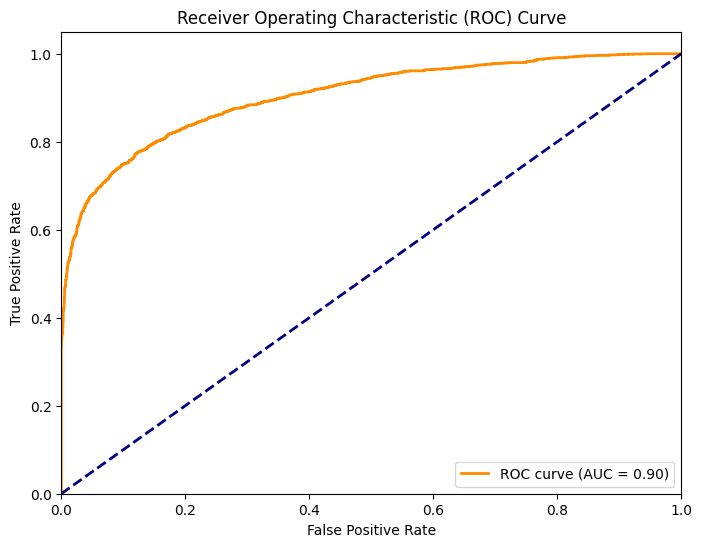

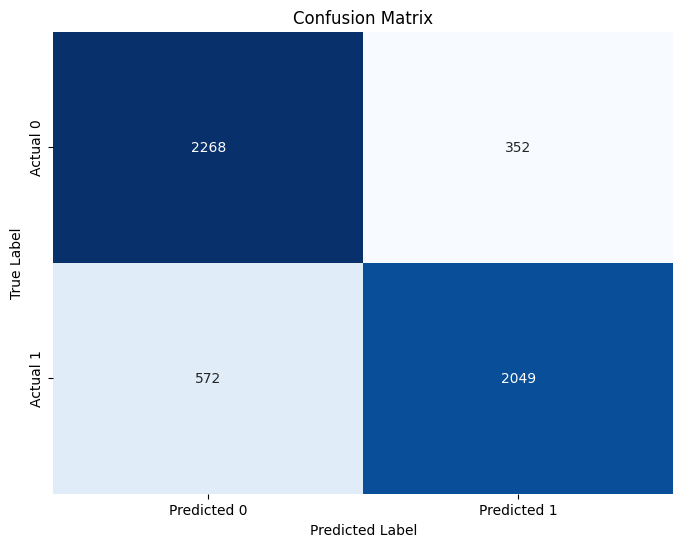

In [ ]:
main(data,inconsistenza=0.1) # caso con inconsistenza 10%

Aggiunti 1222 duplicati. Dimensione dataset finale: 12229
Model: GaussianNB
Accuracy test: 0.6720 | Accuracy Training: 0.6792
F1-score test: 0.7085 | F1-score Training: 0.7143
roc_AUC-score test:0.7468 | roc_AUC-score Training:      0.7628
Differenza Accuracy: 0.0072
Differenza F1-score: 0.0058
Differenza AUC:      0.0160

Importanza delle Feature (stimata con Permutation Importance) per Gaussian Naive Bayes:
'loan_int_rate': 0.0755
'person_income': 0.0503
'credit_score': 0.0232
'loan_amnt': 0.0170
'person_home_ownership_RENT': 0.0033
'loan_intent_MEDICAL': 6.8689e-04
'loan_intent_VENTURE': 3.4345e-04
'person_education_Master': 3.0529e-04
'person_education_High School': 2.6712e-04
'person_education_Bachelor': 1.1448e-04
'person_gender_male': 1.1448e-04
'loan_intent_EDUCATION': 7.6321e-05
'loan_intent_HOMEIMPROVEMENT': 3.8161e-05
'person_home_ownership_OWN': -7.6321e-05
'loan_intent_PERSONAL': -1.9080e-04
'cb_person_cred_hist_length': -0.0032
'person_emp_exp': -0.0061
'person_age': -0.0

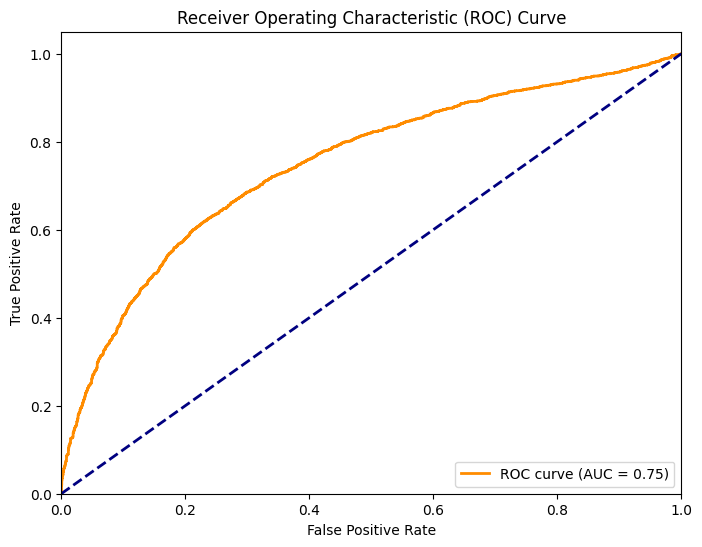

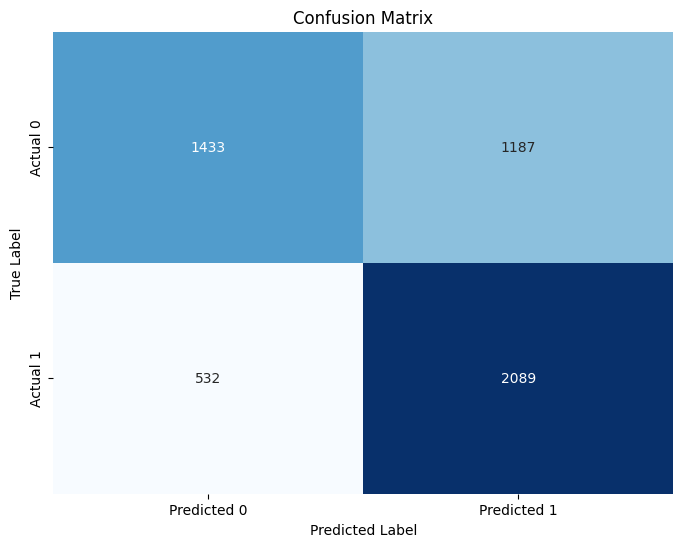

Model: DecisionTreeClassifier
Accuracy test: 0.8145 | Accuracy Training: 0.8224
F1-score test: 0.8053 | F1-score Training: 0.8113
roc_AUC-score test:0.8797 | roc_AUC-score Training:      0.8940
Differenza Accuracy: 0.0079
Differenza F1-score: 0.0060
Differenza AUC:      0.0143
Importanza delle Feature per Decision Tree:
'person_income': 0.3447
'loan_int_rate': 0.2858
'loan_amnt': 0.1540
'person_home_ownership_RENT': 0.1335
'credit_score': 0.0239
'person_home_ownership_OWN': 0.0155
'loan_intent_MEDICAL': 0.0139
'loan_intent_HOMEIMPROVEMENT': 0.0138
'loan_intent_EDUCATION': 0.0080
'loan_intent_VENTURE': 0.0059
'person_age': 6.4879e-04
'loan_intent_PERSONAL': 4.3610e-04
AUC: 0.8797


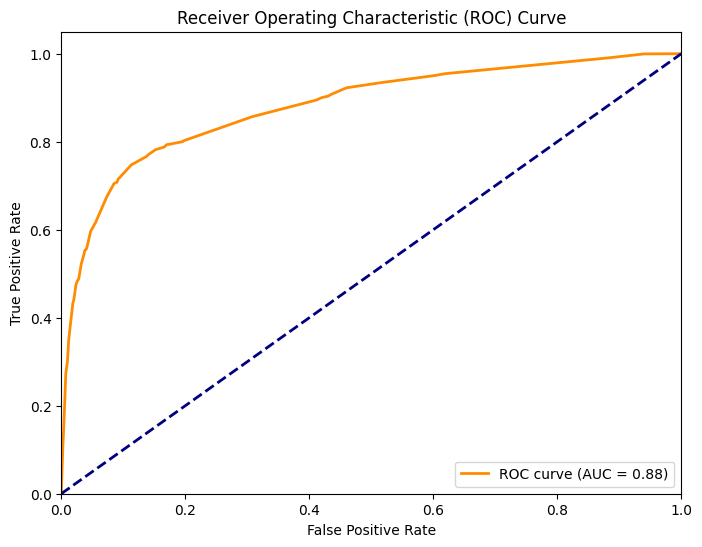

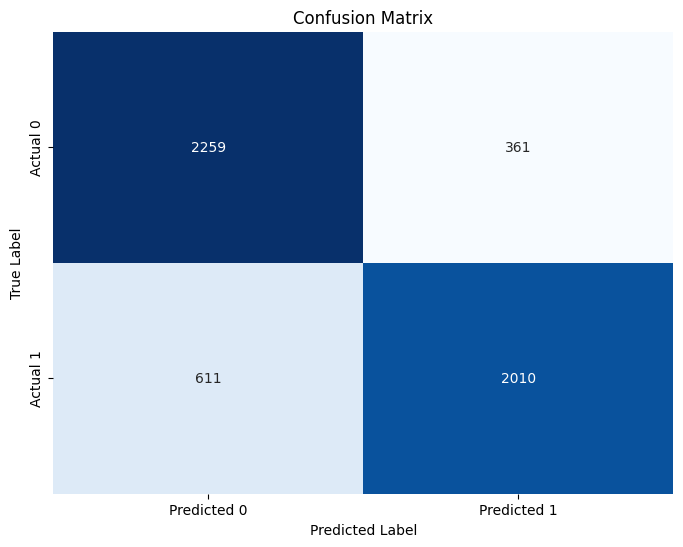

Model: MLPClassifier
Accuracy test: 0.8199 | Accuracy Training: 0.8477
F1-score test: 0.8126 | F1-score Training: 0.8406
roc_AUC-score test:0.8965 | roc_AUC-score Training:      0.9289
Differenza Accuracy: 0.0278
Differenza F1-score: 0.0280
Differenza AUC:      0.0324

Importanza delle Feature (stimata con Permutation Importance) per MLP:
person_age                      0.000000
person_emp_exp                  0.000000
cb_person_cred_hist_length      0.000000
loan_int_rate                   0.000000
person_home_ownership_OTHER     0.000000
person_home_ownership_OWN       0.000000
credit_score                    0.000000
person_gender_male              0.000000
person_education_Bachelor       0.000000
person_education_Doctorate      0.000000
person_education_High School    0.000000
person_education_Master         0.000000
loan_intent_HOMEIMPROVEMENT     0.000000
loan_intent_MEDICAL             0.000000
person_home_ownership_RENT      0.000000
loan_intent_EDUCATION           0.000000
loa

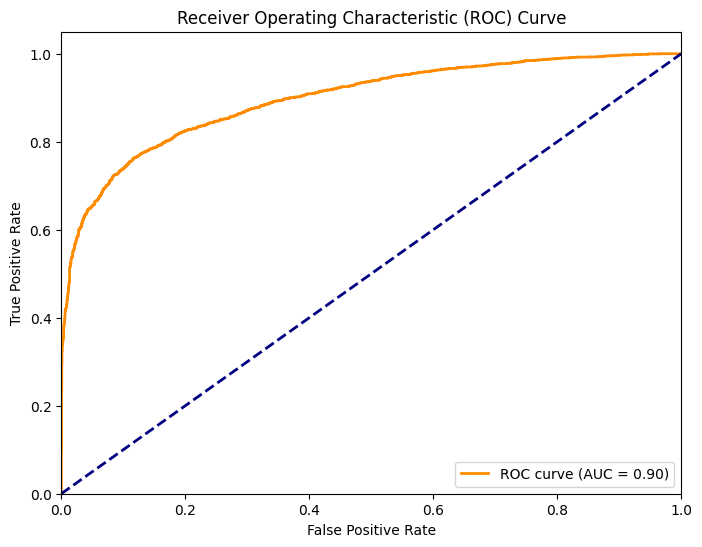

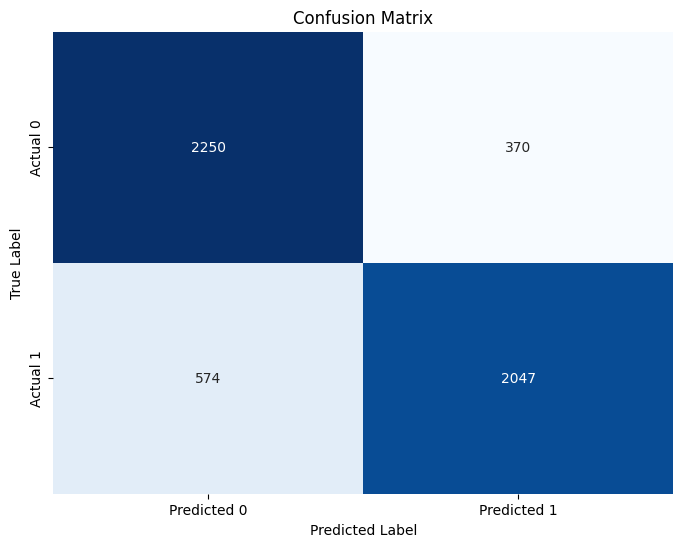

In [ ]:
main(data,ripetizioni=0.1) # caso con ripetizioni 10%


modifiche in:
person_gender: 1252
person_education: 1212
person_home_ownership: 1200
loan_intent: 1230
loan_status: 1220

Model: GaussianNB
Accuracy test: 0.6121 | Accuracy Training: 0.5918
F1-score test: 0.6893 | F1-score Training: 0.6751
roc_AUC-score test:0.7254 | roc_AUC-score Training:      0.6871
Differenza Accuracy: -0.0203
Differenza F1-score: -0.0142
Differenza AUC:      -0.0383

Importanza delle Feature (stimata con Permutation Importance) per Gaussian Naive Bayes:
'loan_int_rate': 0.0479
'person_income': 0.0392
'credit_score': 0.0120
'loan_amnt': 0.0079
'person_home_ownership_RENT': 0.0015
'loan_intent_EDUCATION': 6.1057e-04
'loan_intent_MEDICAL': 3.4345e-04
'person_education_Bachelor': 2.6712e-04
'person_education_Master': 1.9080e-04
'loan_intent_HOMEIMPROVEMENT': 1.5264e-04
'loan_intent_PERSONAL': 1.1448e-04
'person_home_ownership_OWN': -3.8161e-05
'loan_intent_VENTURE': -6.4873e-04
'cb_person_cred_hist_length': -0.0039
'person_age': -0.0090
'person_emp_exp': -0.0117
AUC:

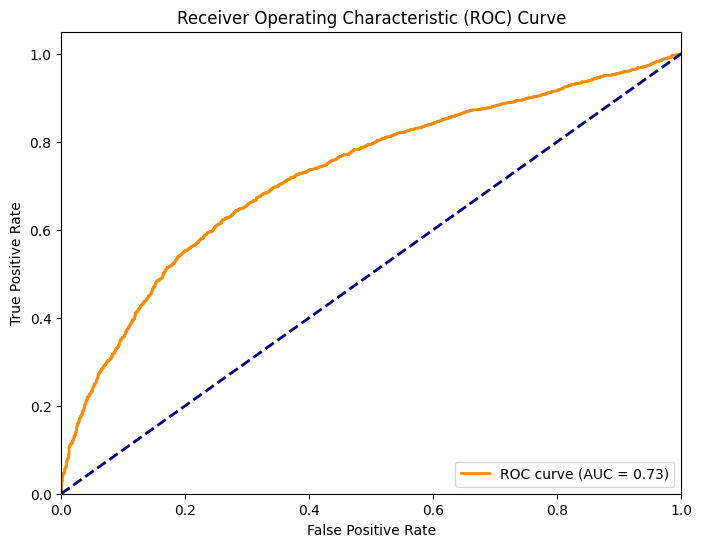

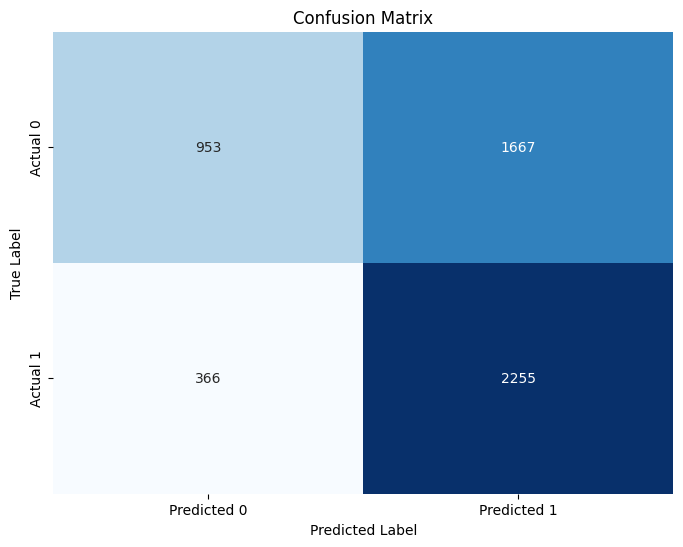

Model: DecisionTreeClassifier
Accuracy test: 0.8094 | Accuracy Training: 0.7519
F1-score test: 0.7950 | F1-score Training: 0.7283
roc_AUC-score test:0.8642 | roc_AUC-score Training:      0.8133
Differenza Accuracy: -0.0575
Differenza F1-score: -0.0667
Differenza AUC:      -0.0509
Importanza delle Feature per Decision Tree:
'person_income': 0.3752
'loan_int_rate': 0.3035
'loan_amnt': 0.1818
'person_home_ownership_RENT': 0.0553
'credit_score': 0.0354
'loan_intent_HOMEIMPROVEMENT': 0.0137
'loan_intent_EDUCATION': 0.0079
'loan_intent_VENTURE': 0.0064
'loan_intent_PERSONAL': 0.0045
'cb_person_cred_hist_length': 0.0044
'person_emp_exp': 0.0037
'loan_intent_MEDICAL': 0.0036
'person_age': 0.0031
'person_home_ownership_OWN': 0.0016
AUC: 0.8642


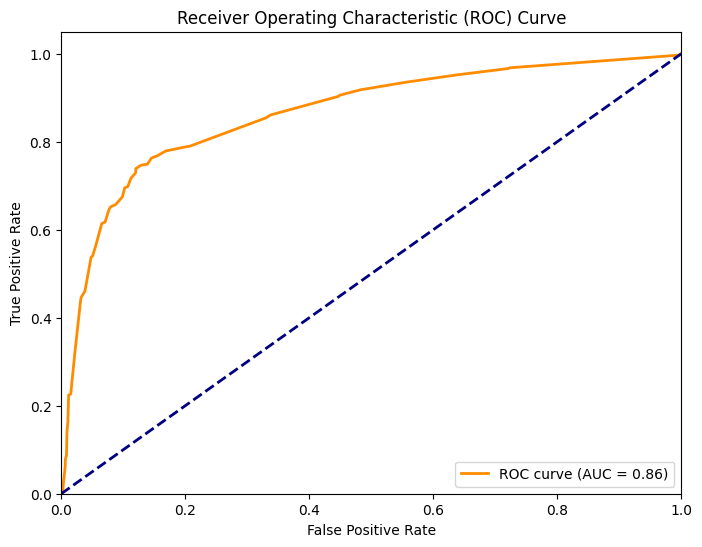

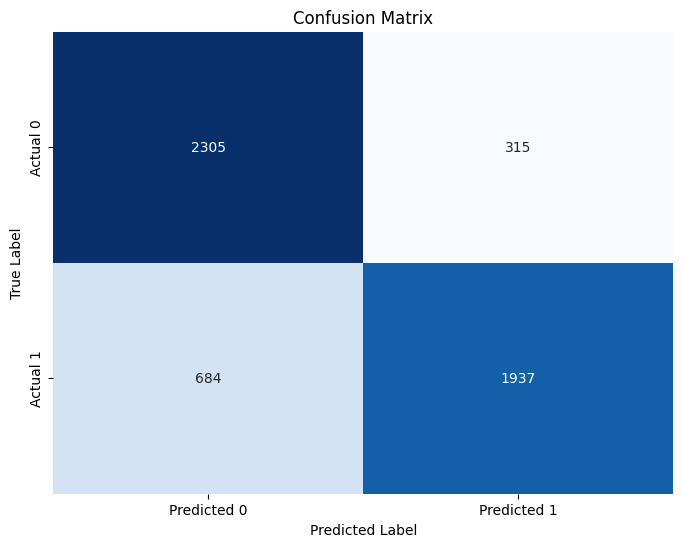

Model: MLPClassifier
Accuracy test: 0.7888 | Accuracy Training: 0.7624
F1-score test: 0.7963 | F1-score Training: 0.7684
roc_AUC-score test:0.8729 | roc_AUC-score Training:      0.8402
Differenza Accuracy: -0.0263
Differenza F1-score: -0.0280
Differenza AUC:      -0.0328

Importanza delle Feature (stimata con Permutation Importance) per MLP:
person_age                      0.0
person_income                   0.0
person_emp_exp                  0.0
loan_amnt                       0.0
loan_int_rate                   0.0
cb_person_cred_hist_length      0.0
credit_score                    0.0
person_gender_male              0.0
person_education_Bachelor       0.0
person_education_Doctorate      0.0
person_education_High School    0.0
person_education_Master         0.0
person_home_ownership_OTHER     0.0
person_home_ownership_OWN       0.0
person_home_ownership_RENT      0.0
loan_intent_EDUCATION           0.0
loan_intent_HOMEIMPROVEMENT     0.0
loan_intent_MEDICAL             0.0
loan_int

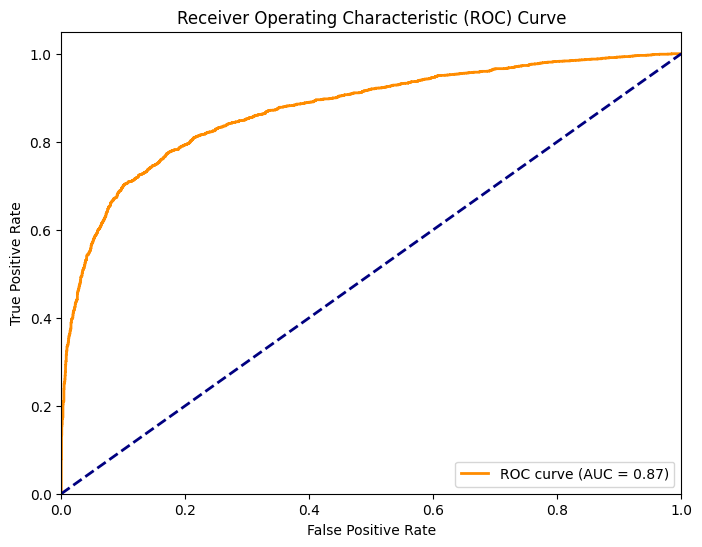

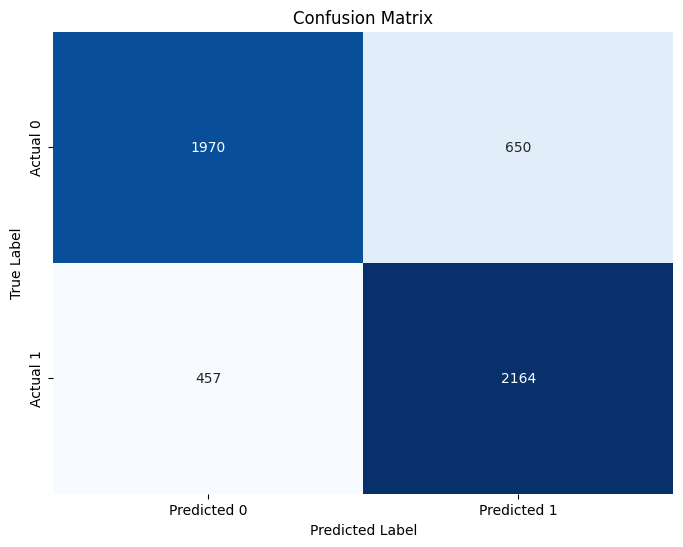

In [ ]:
main(data,selezioni=0.1) # caso con errori di selezione 10%


MIA added:
numerical: 8626
strings: 4825

Model: GaussianNB
Accuracy test: 0.6190 | Accuracy Training: 0.6125
F1-score test: 0.6895 | F1-score Training: 0.6925
roc_AUC-score test:0.7235 | roc_AUC-score Training:      0.7239
Differenza Accuracy: -0.0065
Differenza F1-score: 0.0030
Differenza AUC:      0.0004

Importanza delle Feature (stimata con Permutation Importance) per Gaussian Naive Bayes:
'loan_int_rate': 0.0495
'person_income': 0.0382
'credit_score': 0.0140
'loan_amnt': 0.0103
'person_home_ownership_RENT': 0.0028
'person_education_High School': 5.7241e-04
'loan_intent_VENTURE': 4.9609e-04
'loan_intent_HOMEIMPROVEMENT': 7.6321e-05
'loan_intent_MEDICAL': 3.8161e-05
'person_education_Master': 3.8161e-05
'person_home_ownership_OWN': 3.8161e-05
'loan_intent_EDUCATION': -1.5264e-04
'cb_person_cred_hist_length': -0.0040
'person_age': -0.0081
'person_emp_exp': -0.0115
AUC: 0.7235


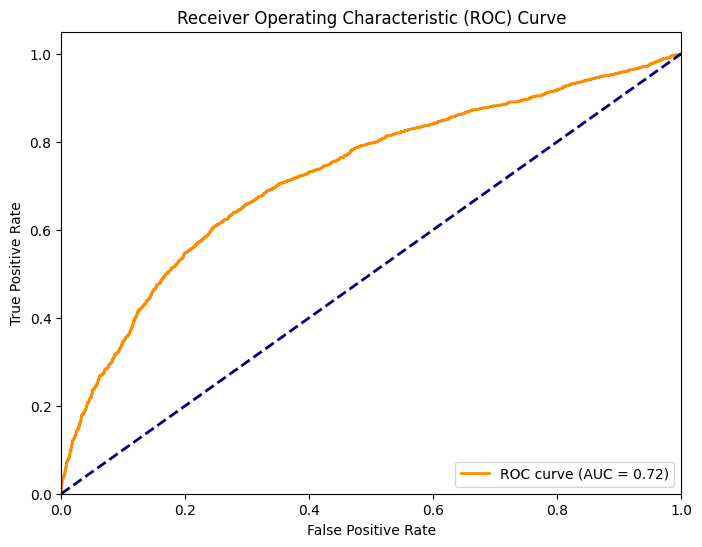

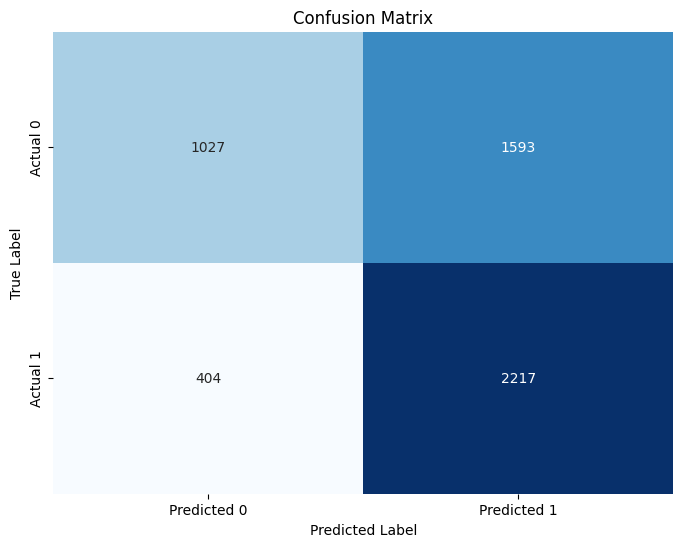

Model: DecisionTreeClassifier
Accuracy test: 0.8180 | Accuracy Training: 0.7863
F1-score test: 0.8055 | F1-score Training: 0.7644
roc_AUC-score test:0.8780 | roc_AUC-score Training:      0.8603
Differenza Accuracy: -0.0316
Differenza F1-score: -0.0410
Differenza AUC:      -0.0177
Importanza delle Feature per Decision Tree:
'person_income': 0.3152
'loan_int_rate': 0.3089
'loan_amnt': 0.1613
'person_home_ownership_RENT': 0.1080
'credit_score': 0.0300
'person_home_ownership_None': 0.0236
'person_home_ownership_OWN': 0.0161
'loan_intent_MEDICAL': 0.0108
'loan_intent_HOMEIMPROVEMENT': 0.0100
'loan_intent_EDUCATION': 0.0057
'loan_intent_VENTURE': 0.0045
'cb_person_cred_hist_length': 0.0033
'person_emp_exp': 0.0013
'person_age': 7.8091e-04
'loan_intent_PERSONAL': 5.6714e-04
AUC: 0.8780


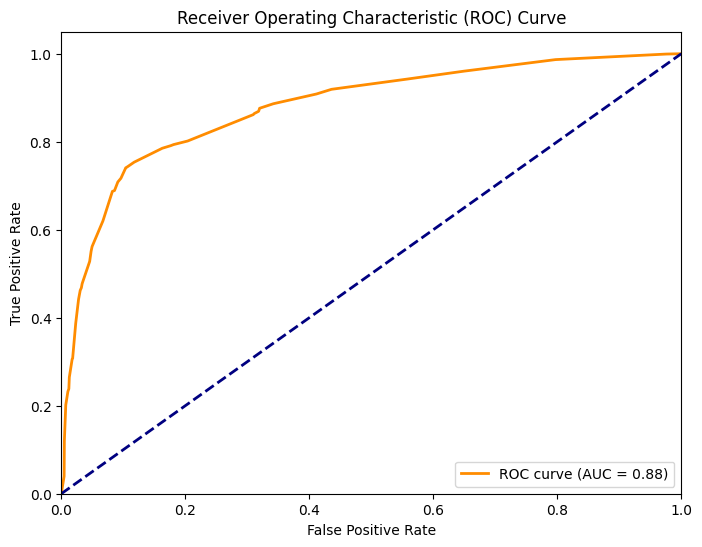

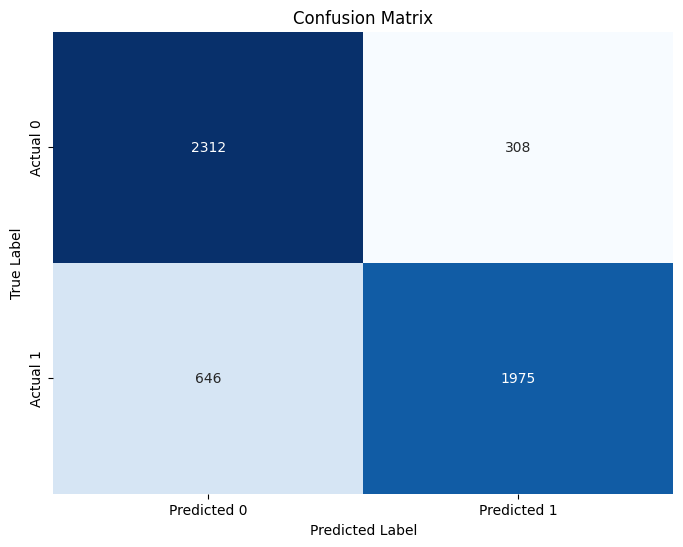

Model: MLPClassifier
Accuracy test: 0.8113 | Accuracy Training: 0.8143
F1-score test: 0.8050 | F1-score Training: 0.8033
roc_AUC-score test:0.8928 | roc_AUC-score Training:      0.8973
Differenza Accuracy: 0.0030
Differenza F1-score: -0.0017
Differenza AUC:      0.0045

Importanza delle Feature (stimata con Permutation Importance) per MLP:
person_age                      0.0
person_income                   0.0
person_emp_exp                  0.0
loan_amnt                       0.0
loan_int_rate                   0.0
cb_person_cred_hist_length      0.0
credit_score                    0.0
person_gender_male              0.0
person_gender_None              0.0
person_education_Bachelor       0.0
person_education_Doctorate      0.0
person_education_High School    0.0
person_education_Master         0.0
person_education_None           0.0
person_home_ownership_OTHER     0.0
person_home_ownership_OWN       0.0
person_home_ownership_RENT      0.0
person_home_ownership_None      0.0
loan_inten

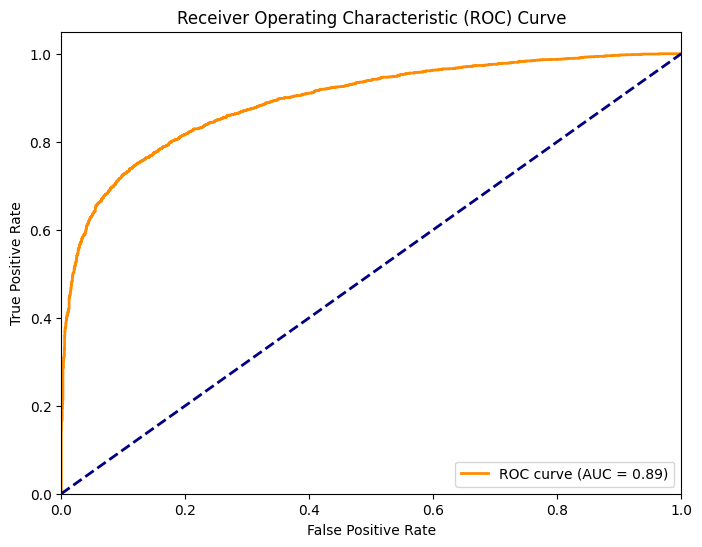

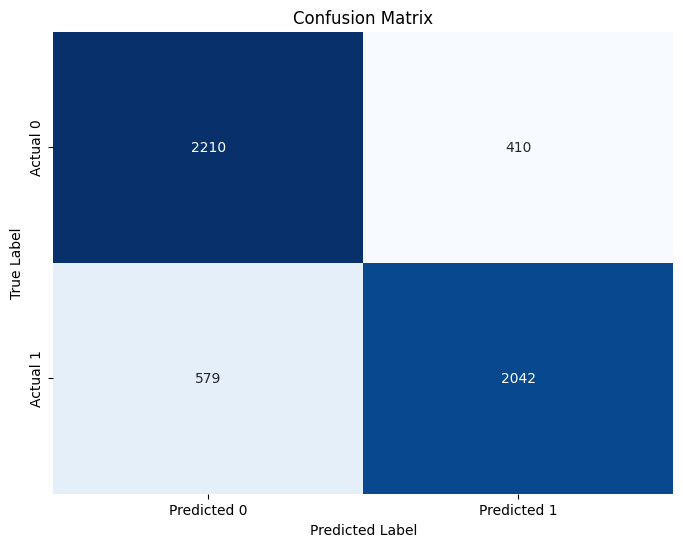

In [ ]:
main(data,MIA=0.1) # caso con mancanza dati 10%

/tmp/ipython-input-2607937929.py:179: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '13,11' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df_unified.iloc[row_idx, col_idx] =f"{value:.2f}".replace('.', ',') # se è float sostituisci i . con le ,
/tmp/ipython-input-2607937929.py:179: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '27,00' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df_unified.iloc[row_idx, col_idx] =f"{value:.2f}".replace('.', ',') # se è float sostituisci i . con le ,
/tmp/ipython-input-2607937929.py:179: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '13243,00' has dtype incompatible with float64, please explicitly cast to a compatible dtype


input error types added:
loan_status: 1271
float_point_to_comma: 6057
int_swap_first_two_digits: 1506
str_swap_consecutive_char: 872
str_duplicate_random_char: 849
str_first_case_change: 796
str_endswith_multiple_spaces: 814
str_add_random_separator: 767
str_add_new_line_char: 797

Model: GaussianNB
Accuracy test: 0.6270 | Accuracy Training: 0.6351
F1-score test: 0.6935 | F1-score Training: 0.7023
roc_AUC-score test:0.7312 | roc_AUC-score Training:      0.7429
Differenza Accuracy: 0.0082
Differenza F1-score: 0.0087
Differenza AUC:      0.0116

Importanza delle Feature (stimata con Permutation Importance) per Gaussian Naive Bayes:
'loan_int_rate': 0.0532
'person_income': 0.0392
'credit_score': 0.0133
'loan_amnt': 0.0098
'person_home_ownership_RENT': 0.0012
'loan_intent_VENTURE': 3.4345e-04
'person_education_High School': 2.6712e-04
'loan_intent_EDUCATION': 1.9080e-04
'person_education_Bachelor': 1.5264e-04
'person_home_ownership_OWN': 1.1448e-04
'loan_intent_MEDICAL': 3.8161e-05
'perso

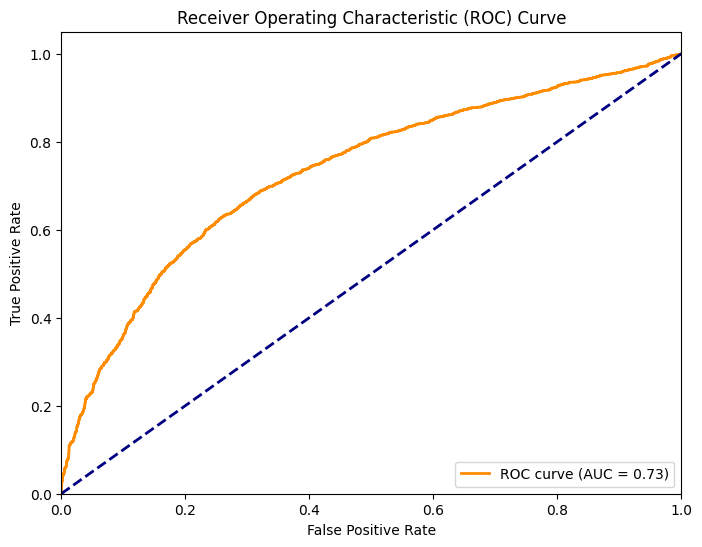

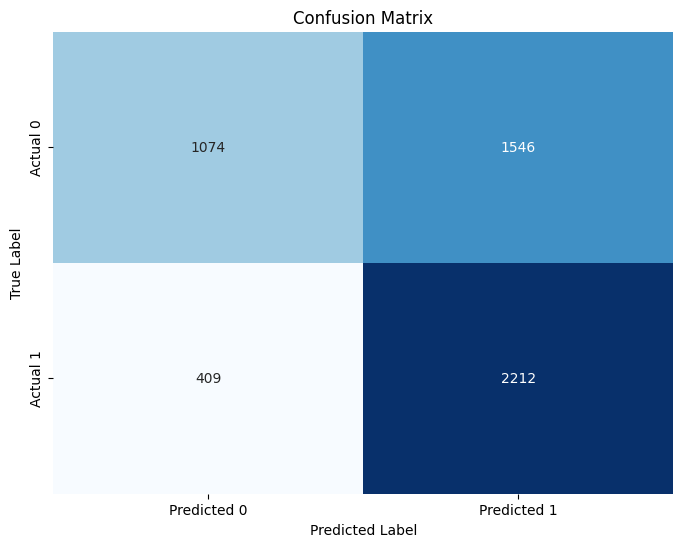

Model: DecisionTreeClassifier
Accuracy test: 0.8044 | Accuracy Training: 0.8145
F1-score test: 0.7891 | F1-score Training: 0.7999
roc_AUC-score test:0.8781 | roc_AUC-score Training:      0.8914
Differenza Accuracy: 0.0101
Differenza F1-score: 0.0107
Differenza AUC:      0.0133
Importanza delle Feature per Decision Tree:
'person_income': 0.3486
'loan_int_rate': 0.2915
'loan_amnt': 0.1348
'person_home_ownership_RENT': 0.1307
'credit_score': 0.0264
'person_home_ownership_OWN': 0.0159
'loan_intent_HOMEIMPROVEMENT': 0.0145
'loan_intent_MEDICAL': 0.0138
'loan_intent_VENTURE': 0.0068
'loan_intent_PERSONAL': 0.0063
'loan_intent_EDUCATION': 0.0059
'person_age': 0.0027
'cb_person_cred_hist_length': 0.0017
'person_education_Doctorate': 2.9884e-04
AUC: 0.8781


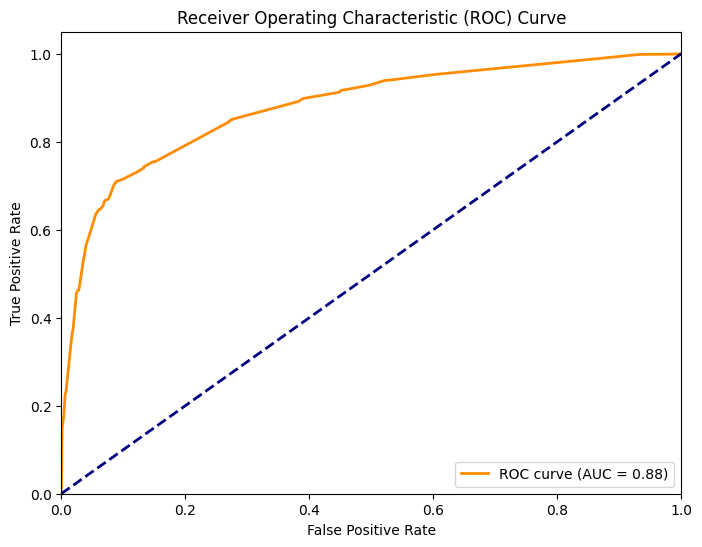

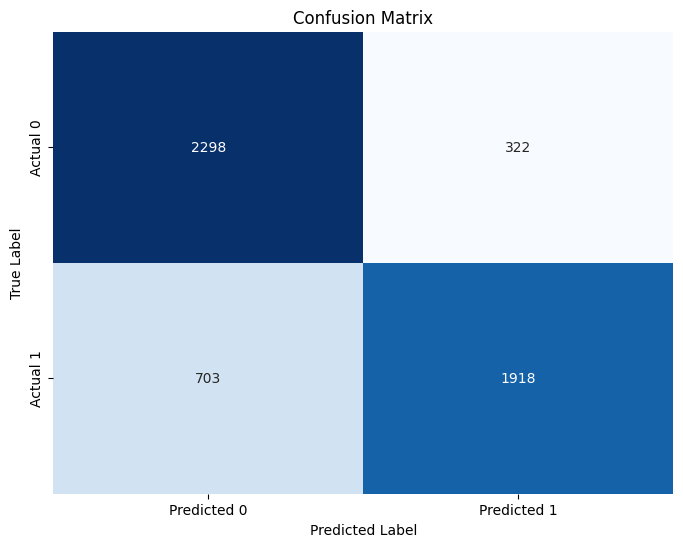

Model: MLPClassifier
Accuracy test: 0.8212 | Accuracy Training: 0.8376
F1-score test: 0.8144 | F1-score Training: 0.8320
roc_AUC-score test:0.8981 | roc_AUC-score Training:      0.9252
Differenza Accuracy: 0.0164
Differenza F1-score: 0.0176
Differenza AUC:      0.0271

Importanza delle Feature (stimata con Permutation Importance) per MLP:
person_age                      0.000000
person_emp_exp                  0.000000
cb_person_cred_hist_length      0.000000
loan_int_rate                   0.000000
person_home_ownership_OTHER     0.000000
person_home_ownership_OWN       0.000000
credit_score                    0.000000
person_gender_male              0.000000
person_education_Bachelor       0.000000
person_education_Doctorate      0.000000
person_education_High School    0.000000
person_education_Master         0.000000
loan_intent_HOMEIMPROVEMENT     0.000000
loan_intent_MEDICAL             0.000000
person_home_ownership_RENT      0.000000
loan_intent_EDUCATION           0.000000
loa

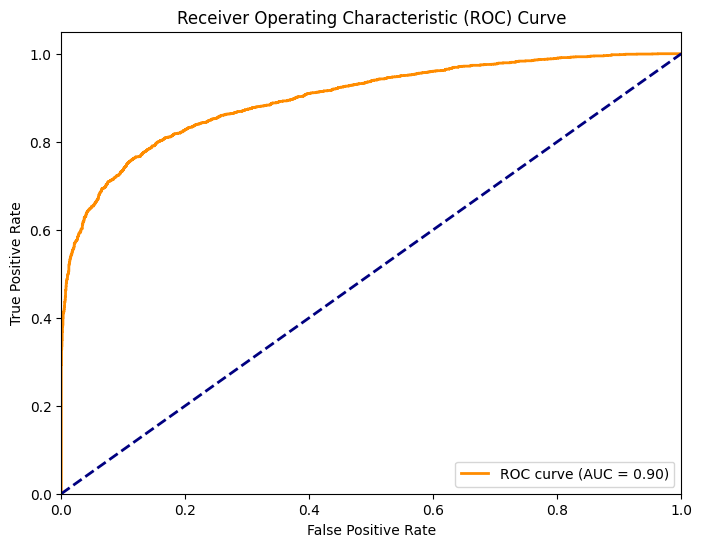

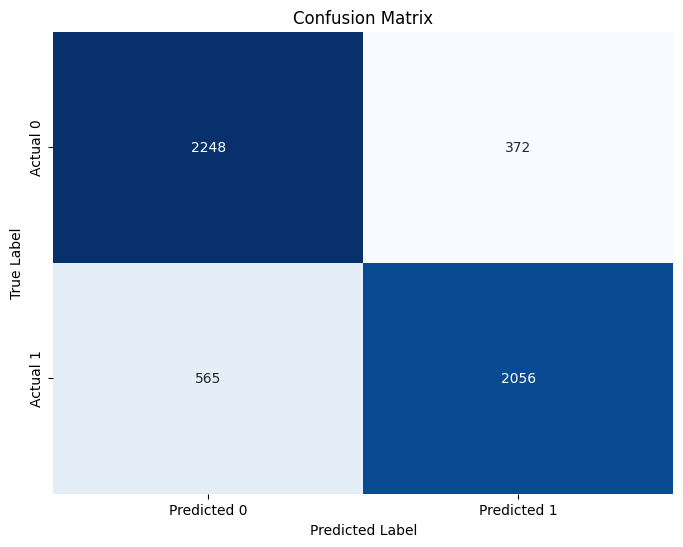

In [ ]:
main(data,input_err=0.1)

## NaN dal 20% al 50%

Model: GaussianNB
Accuracy test: 0.6140 | Accuracy Training: 0.6012
F1-score test: 0.6875 | F1-score Training: 0.6885
roc_AUC-score test:0.7199 | roc_AUC-score Training:      0.7127
Differenza Accuracy: -0.0128
Differenza F1-score: 0.0010
Differenza AUC:      -0.0072

Importanza delle Feature (stimata con Permutation Importance) per Gaussian Naive Bayes:
'loan_int_rate': 0.0470
'person_income': 0.0361
'credit_score': 0.0143
'loan_amnt': 0.0089
'person_home_ownership_RENT': 0.0018
'loan_intent_PERSONAL': 7.6321e-05
'loan_intent_EDUCATION': 7.6321e-05
'person_education_Doctorate': 3.8161e-05
'loan_intent_HOMEIMPROVEMENT': -2.2204e-17
'person_home_ownership_OWN': -6.6613e-17
'person_education_Bachelor': -7.6321e-05
'person_education_High School': -7.6321e-05
'person_education_Master': -1.5264e-04
'loan_intent_VENTURE': -2.2896e-04
'loan_intent_MEDICAL': -3.0529e-04
'cb_person_cred_hist_length': -0.0042
'person_age': -0.0082
'person_emp_exp': -0.0111
AUC: 0.7199


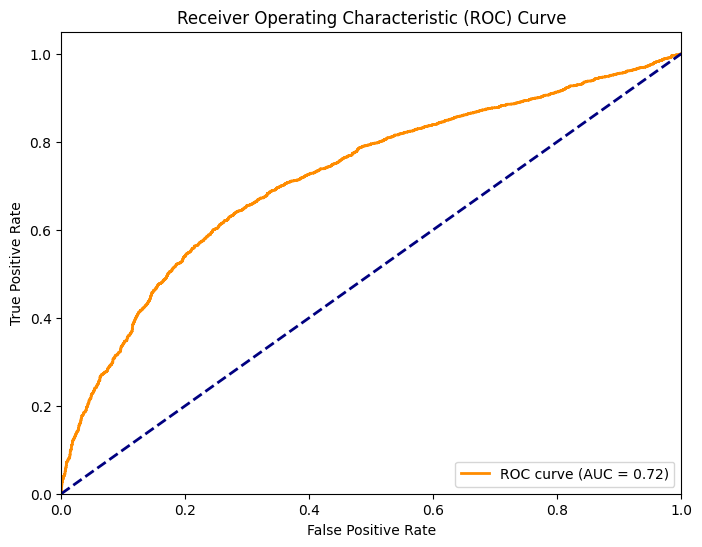

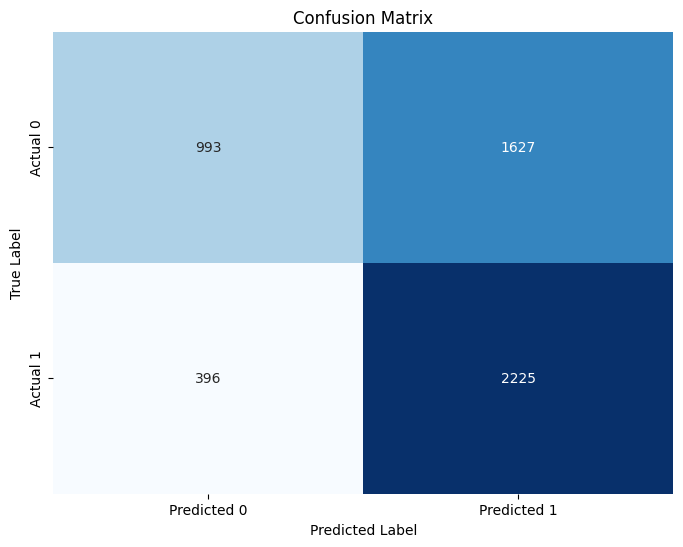

Model: DecisionTreeClassifier
Accuracy test: 0.8008 | Accuracy Training: 0.7610
F1-score test: 0.7780 | F1-score Training: 0.7205
roc_AUC-score test:0.8673 | roc_AUC-score Training:      0.8469
Differenza Accuracy: -0.0398
Differenza F1-score: -0.0575
Differenza AUC:      -0.0204
Importanza delle Feature per Decision Tree:
'loan_int_rate': 0.2630
'person_home_ownership_RENT': 0.2598
'person_income': 0.2225
'loan_amnt': 0.1663
'loan_intent_MEDICAL': 0.0279
'person_home_ownership_OWN': 0.0157
'loan_intent_EDUCATION': 0.0114
'loan_intent_VENTURE': 0.0095
'loan_intent_PERSONAL': 0.0092
'credit_score': 0.0083
'person_age': 0.0041
'cb_person_cred_hist_length': 0.0016
'person_emp_exp': 6.7274e-04
AUC: 0.8673


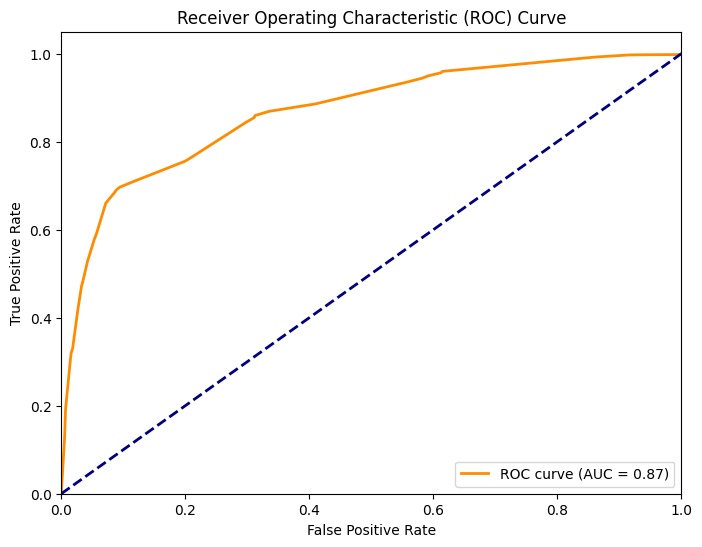

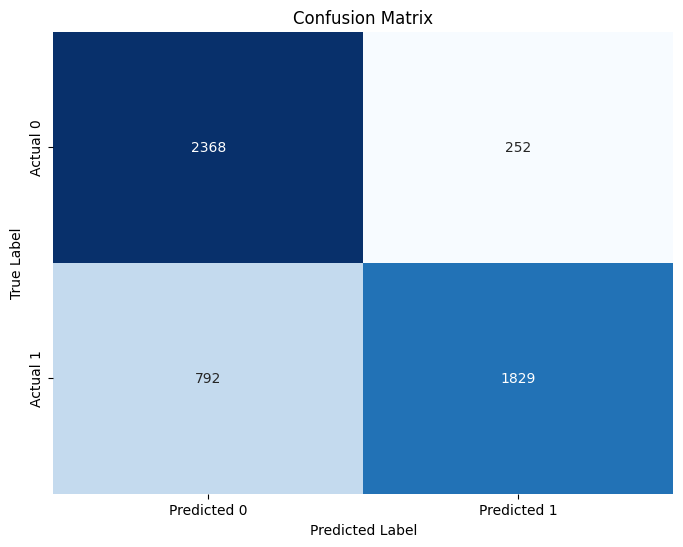

Model: MLPClassifier
Accuracy test: 0.8098 | Accuracy Training: 0.7958
F1-score test: 0.8106 | F1-score Training: 0.7882
roc_AUC-score test:0.8902 | roc_AUC-score Training:      0.8830
Differenza Accuracy: -0.0140
Differenza F1-score: -0.0224
Differenza AUC:      -0.0073

Importanza delle Feature (stimata con Permutation Importance) per MLP:
person_age                      0.0
person_income                   0.0
person_emp_exp                  0.0
loan_amnt                       0.0
loan_int_rate                   0.0
cb_person_cred_hist_length      0.0
credit_score                    0.0
person_gender_male              0.0
person_education_Bachelor       0.0
person_education_Doctorate      0.0
person_education_High School    0.0
person_education_Master         0.0
person_home_ownership_OTHER     0.0
person_home_ownership_OWN       0.0
person_home_ownership_RENT      0.0
loan_intent_EDUCATION           0.0
loan_intent_HOMEIMPROVEMENT     0.0
loan_intent_MEDICAL             0.0
loan_int

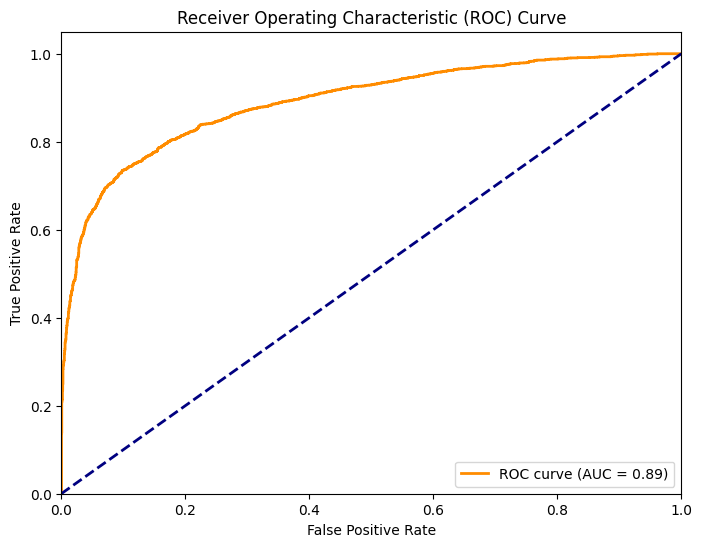

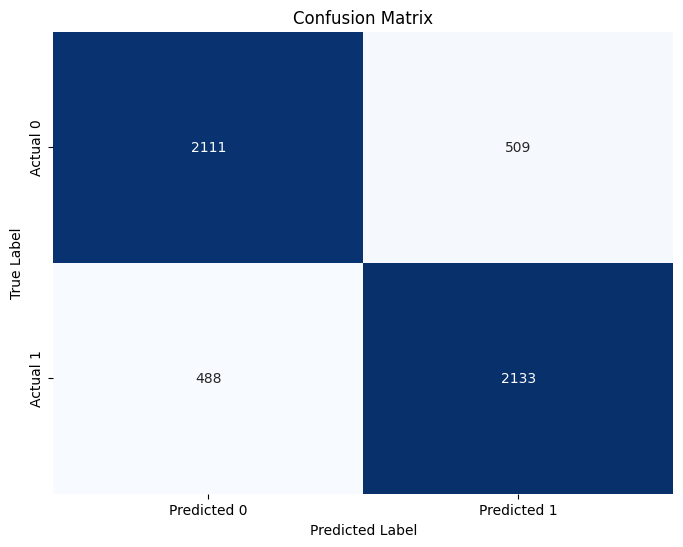

In [ ]:
main(data,nan=0.2) # caso con NaN 20%

Model: GaussianNB
Accuracy test: 0.6566 | Accuracy Training: 0.6439
F1-score test: 0.6982 | F1-score Training: 0.6958
roc_AUC-score test:0.7335 | roc_AUC-score Training:      0.7257
Differenza Accuracy: -0.0127
Differenza F1-score: -0.0024
Differenza AUC:      -0.0078

Importanza delle Feature (stimata con Permutation Importance) per Gaussian Naive Bayes:
'loan_int_rate': 0.0665
'person_income': 0.0383
'credit_score': 0.0203
'loan_amnt': 0.0143
'person_home_ownership_RENT': 0.0015
'person_education_Bachelor': 3.0529e-04
'person_education_High School': 1.9080e-04
'loan_intent_PERSONAL': 3.8161e-05
'loan_intent_MEDICAL': 2.2204e-17
'loan_intent_VENTURE': -1.1448e-04
'loan_intent_HOMEIMPROVEMENT': -1.5264e-04
'person_education_Master': -3.0529e-04
'person_home_ownership_OWN': -3.8161e-04
'loan_intent_EDUCATION': -6.1057e-04
'cb_person_cred_hist_length': -0.0054
'person_emp_exp': -0.0068
'person_age': -0.0073
AUC: 0.7335


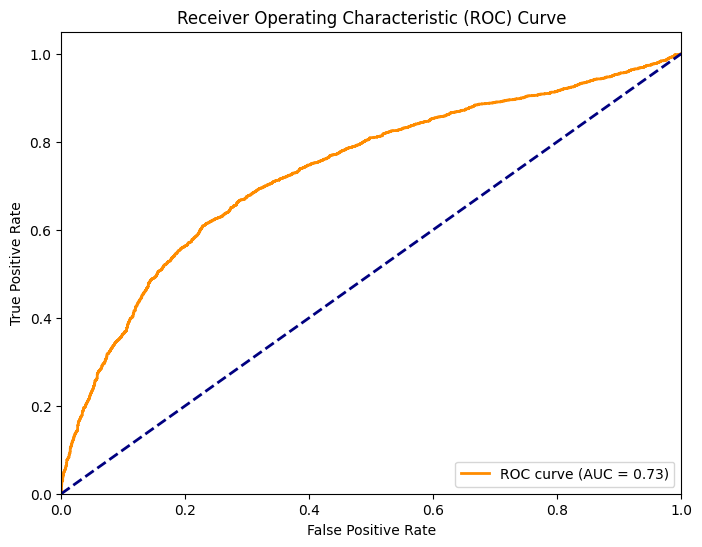

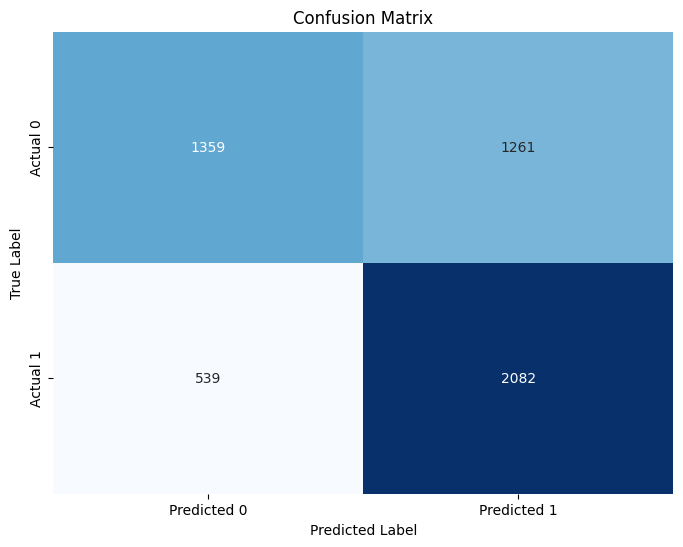

Model: DecisionTreeClassifier
Accuracy test: 0.8126 | Accuracy Training: 0.7610
F1-score test: 0.7919 | F1-score Training: 0.7156
roc_AUC-score test:0.8735 | roc_AUC-score Training:      0.8433
Differenza Accuracy: -0.0517
Differenza F1-score: -0.0764
Differenza AUC:      -0.0301
Importanza delle Feature per Decision Tree:
'loan_int_rate': 0.2629
'person_home_ownership_RENT': 0.2613
'person_income': 0.2420
'loan_amnt': 0.1468
'loan_intent_MEDICAL': 0.0258
'person_home_ownership_OWN': 0.0143
'loan_intent_HOMEIMPROVEMENT': 0.0114
'loan_intent_VENTURE': 0.0100
'loan_intent_EDUCATION': 0.0073
'loan_intent_PERSONAL': 0.0066
'credit_score': 0.0064
'person_emp_exp': 0.0028
'cb_person_cred_hist_length': 0.0013
'person_age': 0.0011
AUC: 0.8735


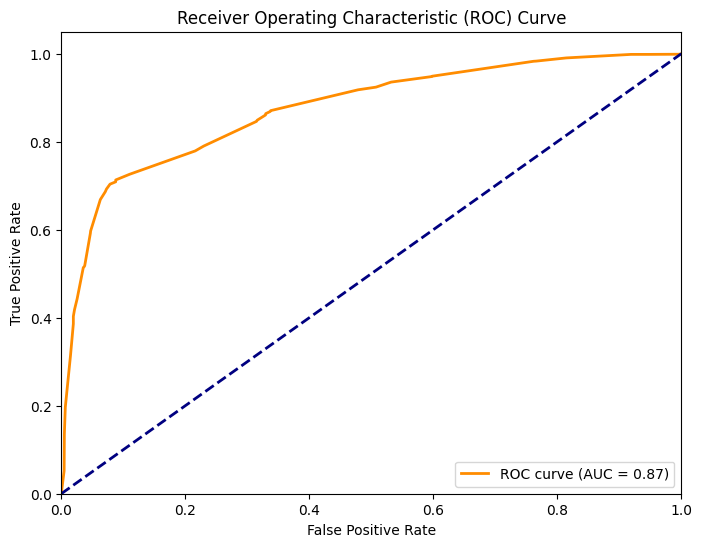

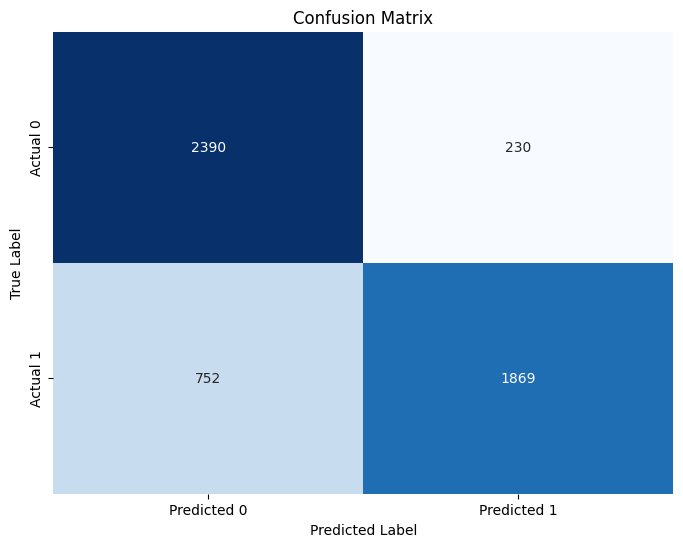

Model: MLPClassifier
Accuracy test: 0.8061 | Accuracy Training: 0.7884
F1-score test: 0.8067 | F1-score Training: 0.7792
roc_AUC-score test:0.8883 | roc_AUC-score Training:      0.8774
Differenza Accuracy: -0.0178
Differenza F1-score: -0.0275
Differenza AUC:      -0.0109

Importanza delle Feature (stimata con Permutation Importance) per MLP:
person_age                      0.000000
person_emp_exp                  0.000000
cb_person_cred_hist_length      0.000000
loan_int_rate                   0.000000
person_home_ownership_OTHER     0.000000
person_home_ownership_OWN       0.000000
credit_score                    0.000000
person_gender_male              0.000000
person_education_Bachelor       0.000000
person_education_Doctorate      0.000000
person_education_High School    0.000000
person_education_Master         0.000000
loan_intent_HOMEIMPROVEMENT     0.000000
loan_intent_MEDICAL             0.000000
person_home_ownership_RENT      0.000000
loan_intent_EDUCATION           0.000000


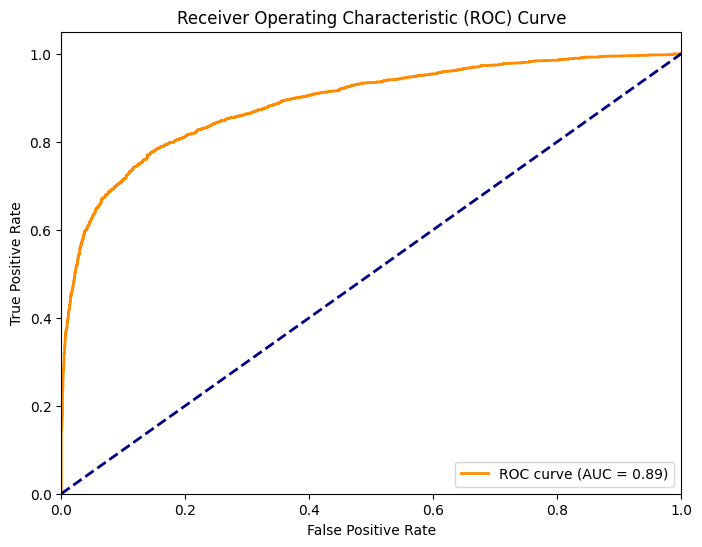

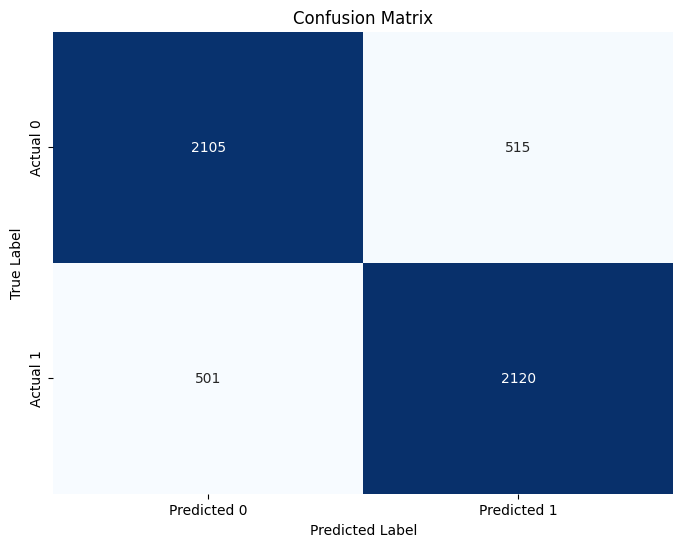

In [ ]:
main(data, nan=0.25)

Model: GaussianNB
Accuracy test: 0.6533 | Accuracy Training: 0.6305
F1-score test: 0.6977 | F1-score Training: 0.6910
roc_AUC-score test:0.7304 | roc_AUC-score Training:      0.7157
Differenza Accuracy: -0.0228
Differenza F1-score: -0.0067
Differenza AUC:      -0.0146

Importanza delle Feature (stimata con Permutation Importance) per Gaussian Naive Bayes:
'loan_int_rate': 0.0644
'person_income': 0.0437
'credit_score': 0.0210
'loan_amnt': 0.0169
'person_home_ownership_RENT': 0.0032
'loan_intent_PERSONAL': 2.2896e-04
'person_education_High School': 1.1448e-04
'person_education_Bachelor': 7.6321e-05
'person_education_Master': 3.8161e-05
'loan_intent_VENTURE': 6.6613e-17
'loan_intent_HOMEIMPROVEMENT': -1.5264e-04
'person_home_ownership_OWN': -1.5264e-04
'loan_intent_MEDICAL': -3.0529e-04
'loan_intent_EDUCATION': -4.9609e-04
'cb_person_cred_hist_length': -0.0040
'person_emp_exp': -0.0059
'person_age': -0.0060
AUC: 0.7304


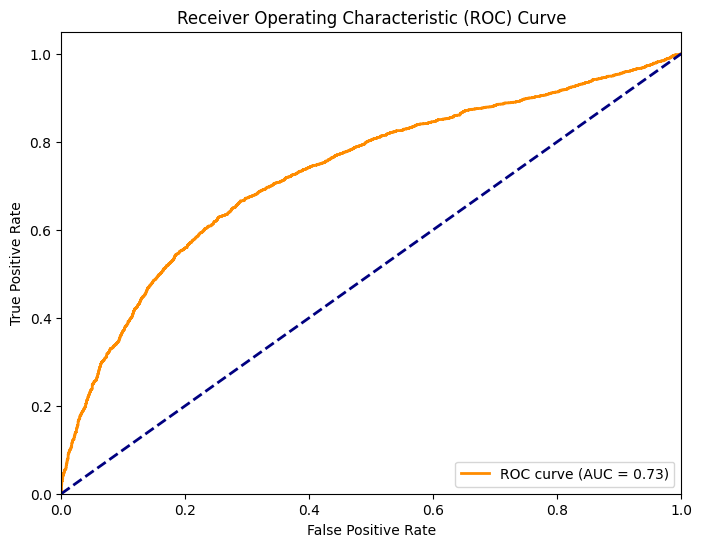

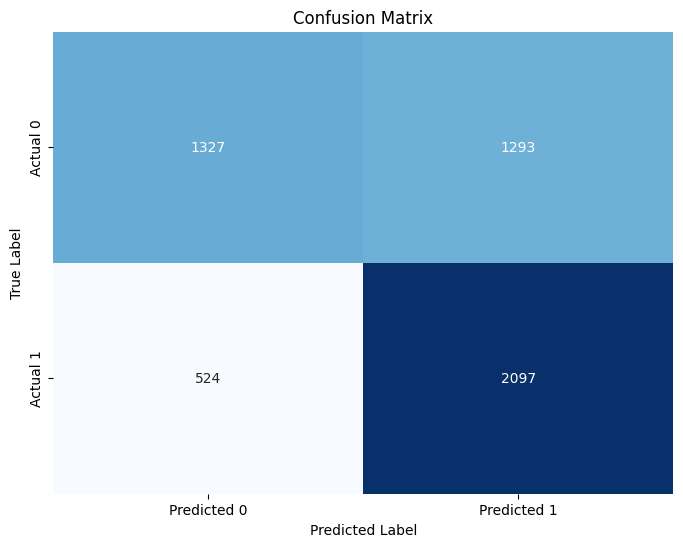

Model: DecisionTreeClassifier
Accuracy test: 0.7901 | Accuracy Training: 0.7509
F1-score test: 0.7811 | F1-score Training: 0.7433
roc_AUC-score test:0.8702 | roc_AUC-score Training:      0.8344
Differenza Accuracy: -0.0392
Differenza F1-score: -0.0378
Differenza AUC:      -0.0358
Importanza delle Feature per Decision Tree:
'person_home_ownership_RENT': 0.2761
'loan_int_rate': 0.2598
'person_income': 0.2195
'loan_amnt': 0.1416
'loan_intent_VENTURE': 0.0243
'loan_intent_MEDICAL': 0.0158
'person_home_ownership_OWN': 0.0139
'loan_intent_HOMEIMPROVEMENT': 0.0128
'credit_score': 0.0118
'loan_intent_EDUCATION': 0.0083
'loan_intent_PERSONAL': 0.0075
'cb_person_cred_hist_length': 0.0049
'person_age': 0.0027
'person_emp_exp': 7.0467e-04
'person_education_Master': 4.3853e-04
AUC: 0.8702


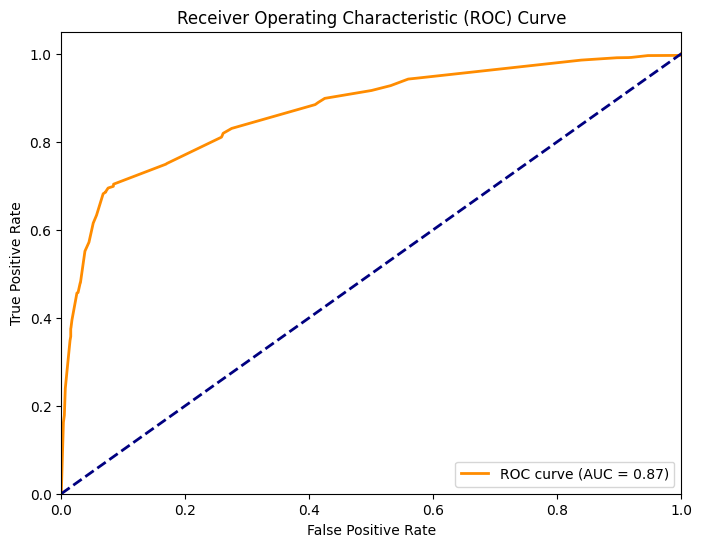

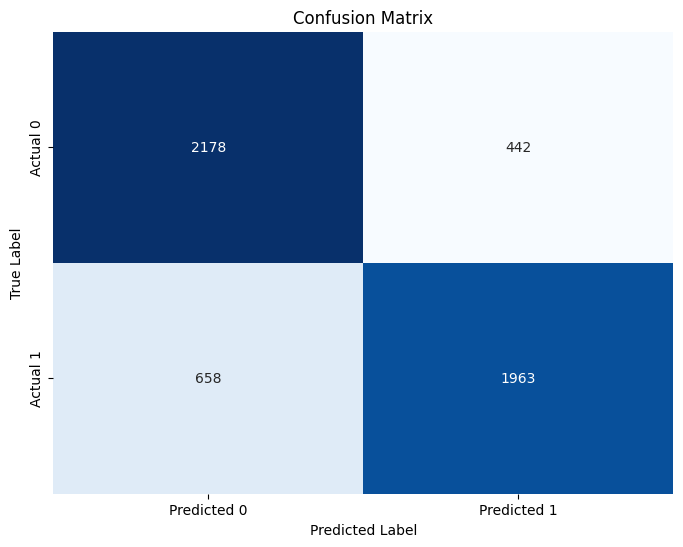

Model: MLPClassifier
Accuracy test: 0.7989 | Accuracy Training: 0.7778
F1-score test: 0.8023 | F1-score Training: 0.7722
roc_AUC-score test:0.8809 | roc_AUC-score Training:      0.8666
Differenza Accuracy: -0.0211
Differenza F1-score: -0.0301
Differenza AUC:      -0.0142

Importanza delle Feature (stimata con Permutation Importance) per MLP:
person_income                   0.000038
person_age                      0.000000
person_emp_exp                  0.000000
loan_int_rate                   0.000000
person_home_ownership_OTHER     0.000000
cb_person_cred_hist_length      0.000000
credit_score                    0.000000
person_gender_male              0.000000
person_education_Bachelor       0.000000
person_education_Doctorate      0.000000
person_education_High School    0.000000
person_education_Master         0.000000
loan_intent_HOMEIMPROVEMENT     0.000000
person_home_ownership_OWN       0.000000
person_home_ownership_RENT      0.000000
loan_intent_EDUCATION           0.000000


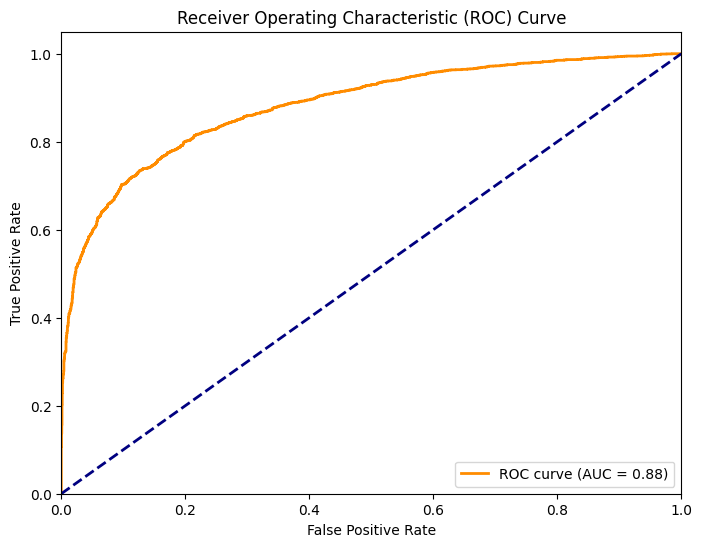

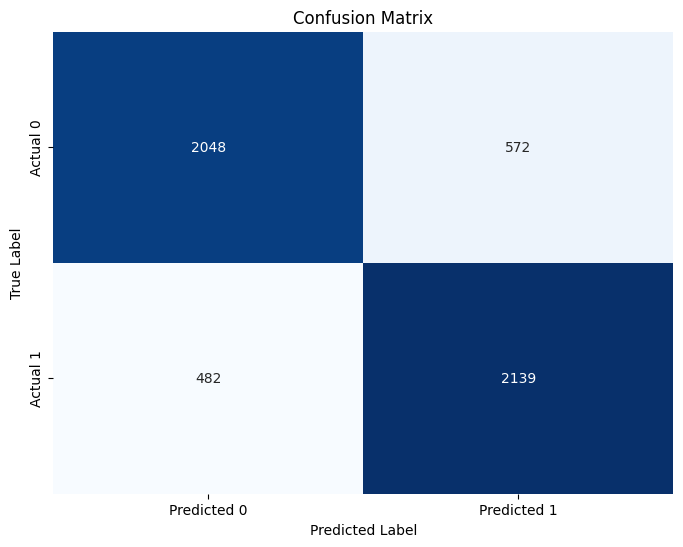

In [ ]:
main(data,nan=0.3) # caso con NaN 30%

Model: GaussianNB
Accuracy test: 0.6003 | Accuracy Training: 0.5674
F1-score test: 0.6782 | F1-score Training: 0.6733
roc_AUC-score test:0.7080 | roc_AUC-score Training:      0.6814
Differenza Accuracy: -0.0328
Differenza F1-score: -0.0049
Differenza AUC:      -0.0266

Importanza delle Feature (stimata con Permutation Importance) per Gaussian Naive Bayes:
'loan_int_rate': 0.0368
'person_income': 0.0333
'credit_score': 0.0138
'loan_amnt': 0.0066
'person_home_ownership_RENT': 0.0035
'person_education_High School': 2.2896e-04
'loan_intent_VENTURE': 3.8161e-05
'loan_intent_MEDICAL': -2.2204e-17
'person_education_Bachelor': -3.8161e-05
'loan_intent_PERSONAL': -3.8161e-05
'person_education_Master': -1.1448e-04
'person_home_ownership_OWN': -3.8161e-04
'loan_intent_EDUCATION': -4.5793e-04
'cb_person_cred_hist_length': -0.0079
'person_age': -0.0094
'person_emp_exp': -0.0105
AUC: 0.7080


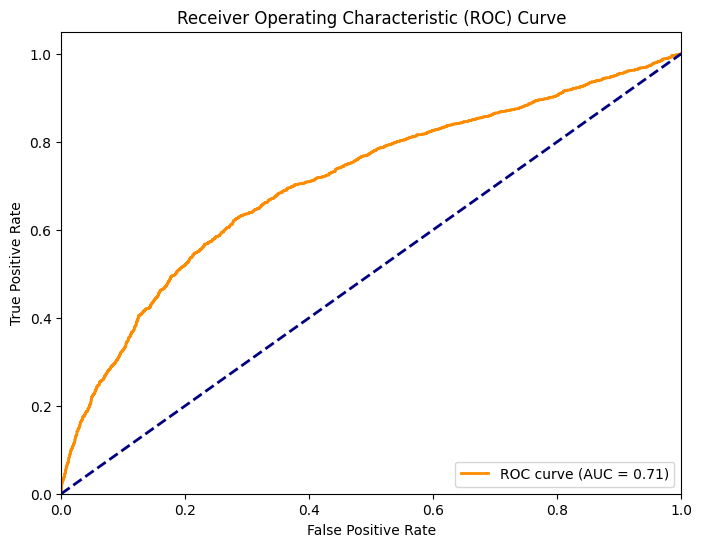

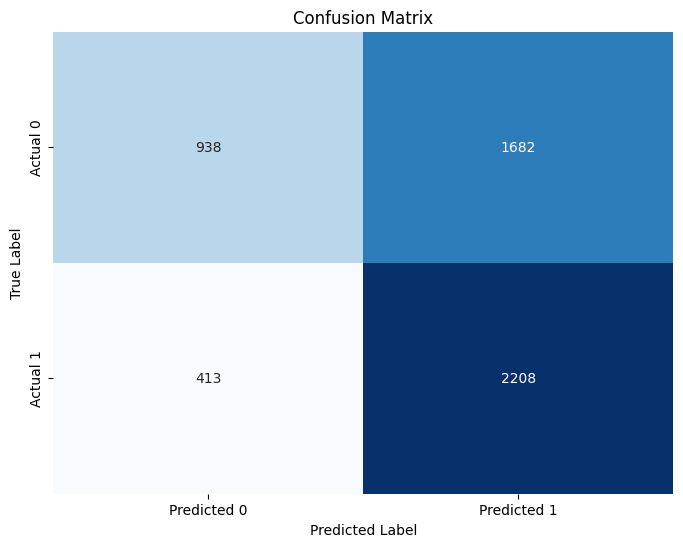

Model: DecisionTreeClassifier
Accuracy test: 0.7840 | Accuracy Training: 0.7331
F1-score test: 0.7861 | F1-score Training: 0.7437
roc_AUC-score test:0.8691 | roc_AUC-score Training:      0.8178
Differenza Accuracy: -0.0509
Differenza F1-score: -0.0424
Differenza AUC:      -0.0513
Importanza delle Feature per Decision Tree:
'person_home_ownership_RENT': 0.3079
'loan_int_rate': 0.2645
'person_income': 0.2256
'loan_amnt': 0.1154
'loan_intent_MEDICAL': 0.0284
'loan_intent_VENTURE': 0.0108
'person_home_ownership_OWN': 0.0105
'loan_intent_HOMEIMPROVEMENT': 0.0101
'loan_intent_EDUCATION': 0.0072
'loan_intent_PERSONAL': 0.0063
'credit_score': 0.0046
'person_emp_exp': 0.0031
'cb_person_cred_hist_length': 0.0030
'person_gender_male': 0.0015
'person_age': 0.0010
AUC: 0.8691


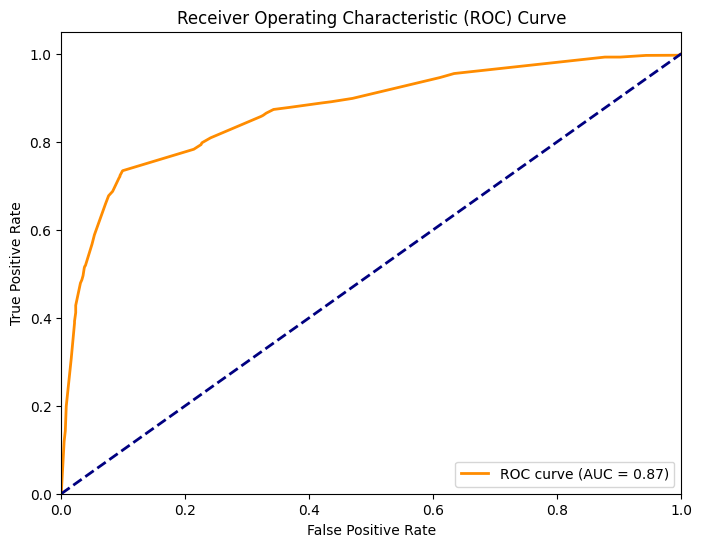

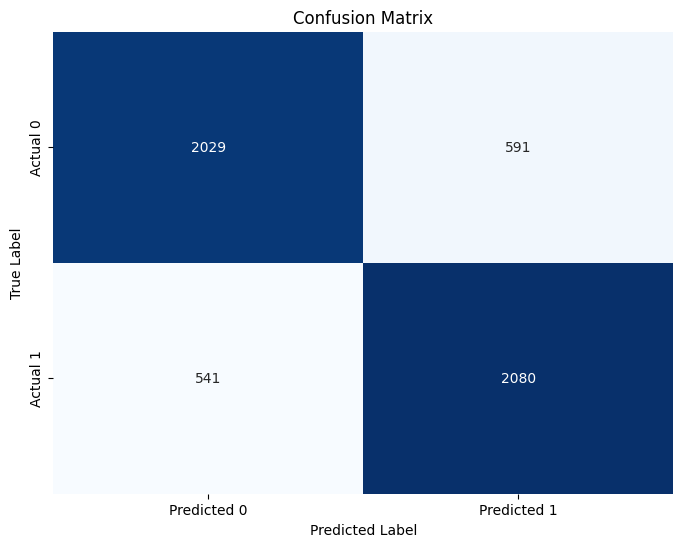

Model: MLPClassifier
Accuracy test: 0.7857 | Accuracy Training: 0.7645
F1-score test: 0.7886 | F1-score Training: 0.7556
roc_AUC-score test:0.8692 | roc_AUC-score Training:      0.8537
Differenza Accuracy: -0.0212
Differenza F1-score: -0.0329
Differenza AUC:      -0.0155

Importanza delle Feature (stimata con Permutation Importance) per MLP:
person_age                      0.0
person_income                   0.0
person_emp_exp                  0.0
loan_amnt                       0.0
loan_int_rate                   0.0
cb_person_cred_hist_length      0.0
credit_score                    0.0
person_gender_male              0.0
person_education_Bachelor       0.0
person_education_Doctorate      0.0
person_education_High School    0.0
person_education_Master         0.0
person_home_ownership_OTHER     0.0
person_home_ownership_OWN       0.0
person_home_ownership_RENT      0.0
loan_intent_EDUCATION           0.0
loan_intent_HOMEIMPROVEMENT     0.0
loan_intent_MEDICAL             0.0
loan_int

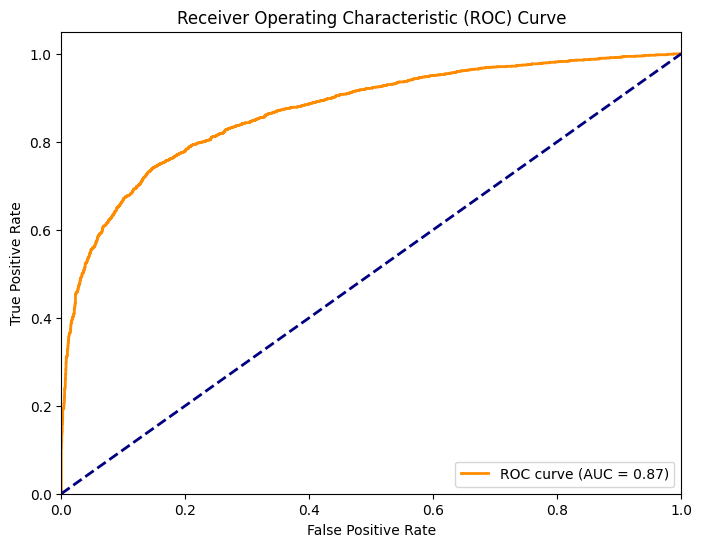

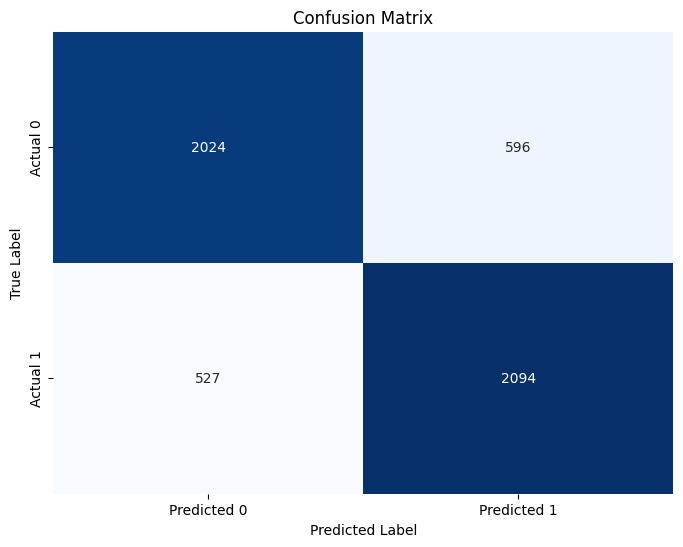

In [ ]:
main(data,nan=0.4) # caso con NaN 40%

Model: GaussianNB
Accuracy test: 0.5966 | Accuracy Training: 0.5651
F1-score test: 0.6764 | F1-score Training: 0.6730
roc_AUC-score test:0.7035 | roc_AUC-score Training:      0.6760
Differenza Accuracy: -0.0316
Differenza F1-score: -0.0033
Differenza AUC:      -0.0275

Importanza delle Feature (stimata con Permutation Importance) per Gaussian Naive Bayes:
'loan_int_rate': 0.0378
'person_income': 0.0291
'credit_score': 0.0138
'loan_amnt': 0.0071
'person_home_ownership_RENT': 0.0044
'loan_intent_EDUCATION': 5.3425e-04
'person_education_High School': 2.6712e-04
'person_education_Master': 1.9080e-04
'loan_intent_MEDICAL': 1.1448e-04
'person_home_ownership_OWN': 7.6321e-05
'person_education_Bachelor': 3.8161e-05
'loan_intent_HOMEIMPROVEMENT': -3.8161e-05
'loan_intent_PERSONAL': -2.2896e-04
'loan_intent_VENTURE': -3.0529e-04
'cb_person_cred_hist_length': -0.0051
'person_emp_exp': -0.0097
'person_age': -0.0100
AUC: 0.7035


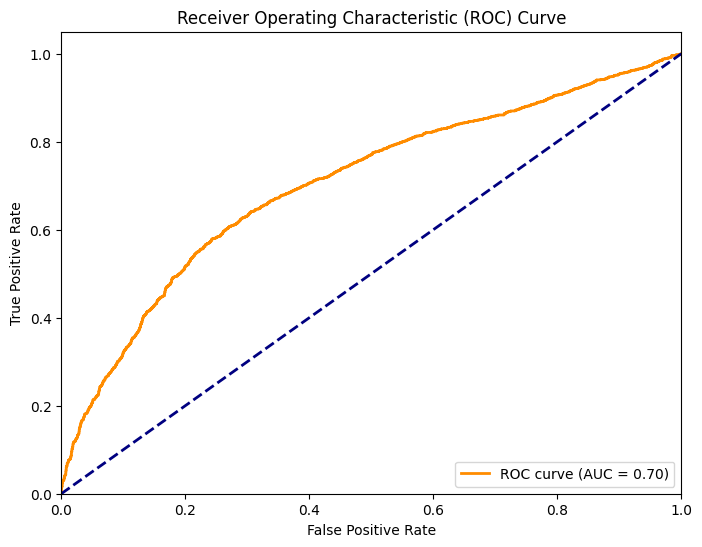

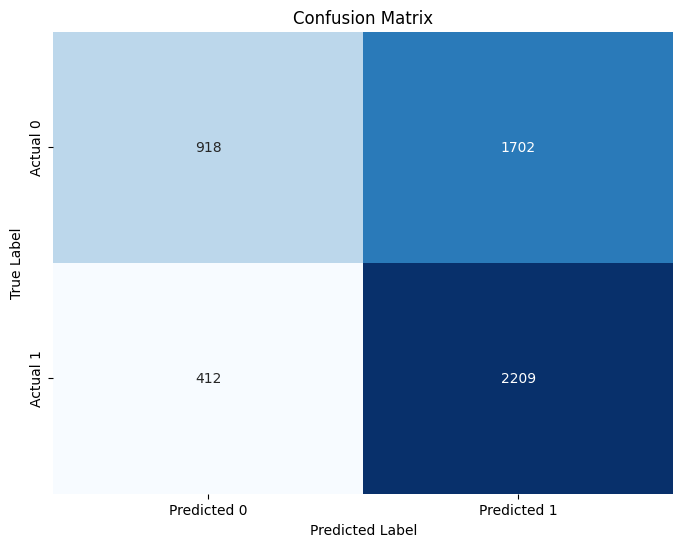

Model: DecisionTreeClassifier
Accuracy test: 0.7762 | Accuracy Training: 0.7284
F1-score test: 0.7739 | F1-score Training: 0.7316
roc_AUC-score test:0.8630 | roc_AUC-score Training:      0.8140
Differenza Accuracy: -0.0478
Differenza F1-score: -0.0423
Differenza AUC:      -0.0490
Importanza delle Feature per Decision Tree:
'person_home_ownership_RENT': 0.3144
'loan_int_rate': 0.2654
'person_income': 0.2051
'loan_amnt': 0.1196
'loan_intent_VENTURE': 0.0301
'person_home_ownership_OWN': 0.0193
'loan_intent_MEDICAL': 0.0123
'loan_intent_HOMEIMPROVEMENT': 0.0115
'credit_score': 0.0086
'loan_intent_EDUCATION': 0.0049
'person_emp_exp': 0.0043
'person_age': 0.0032
'cb_person_cred_hist_length': 9.9260e-04
'loan_intent_PERSONAL': 3.3701e-04
'person_education_High School': 1.7514e-05
AUC: 0.8630


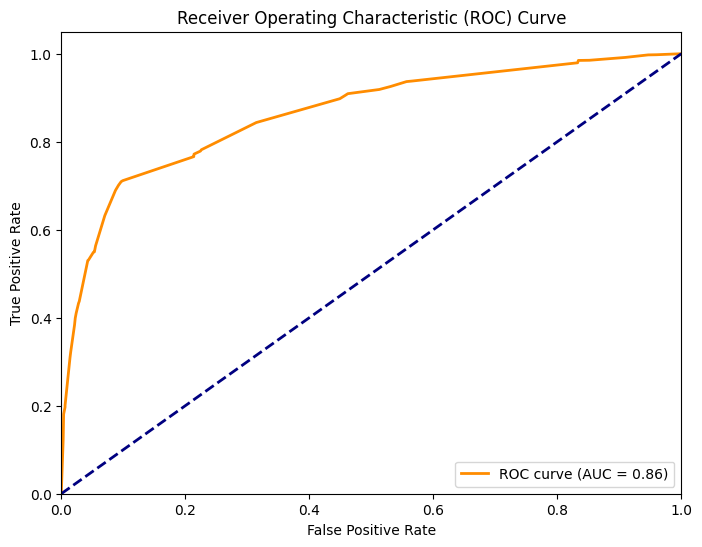

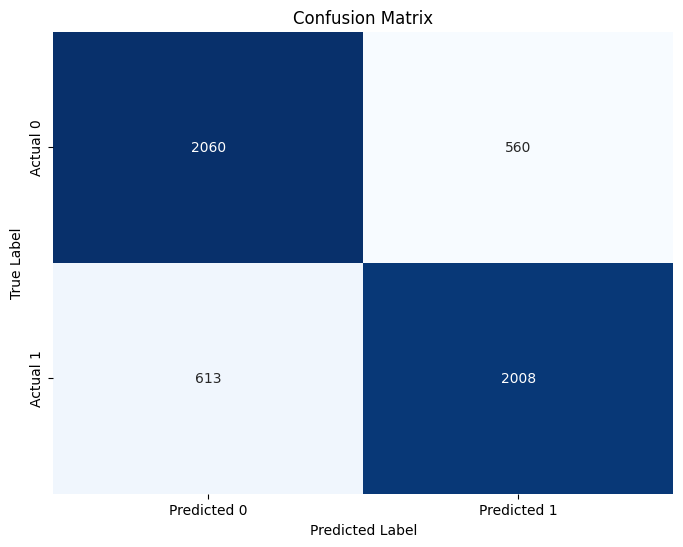

Model: MLPClassifier
Accuracy test: 0.7863 | Accuracy Training: 0.7556
F1-score test: 0.7964 | F1-score Training: 0.7513
roc_AUC-score test:0.8772 | roc_AUC-score Training:      0.8436
Differenza Accuracy: -0.0307
Differenza F1-score: -0.0452
Differenza AUC:      -0.0336

Importanza delle Feature (stimata con Permutation Importance) per MLP:
person_income                   2.220446e-17
person_age                      0.000000e+00
person_emp_exp                  0.000000e+00
loan_int_rate                   0.000000e+00
person_home_ownership_OTHER     0.000000e+00
cb_person_cred_hist_length      0.000000e+00
credit_score                    0.000000e+00
person_gender_male              0.000000e+00
person_education_Bachelor       0.000000e+00
person_education_Doctorate      0.000000e+00
person_education_High School    0.000000e+00
person_education_Master         0.000000e+00
loan_intent_HOMEIMPROVEMENT     0.000000e+00
person_home_ownership_OWN       0.000000e+00
person_home_ownership_RENT

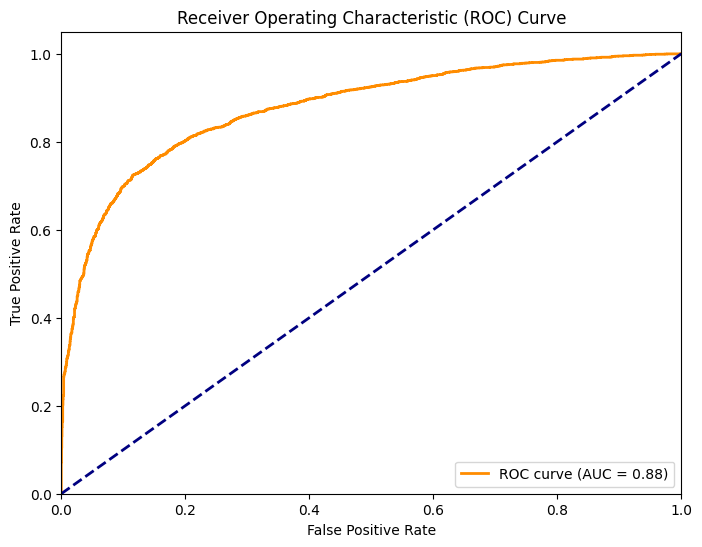

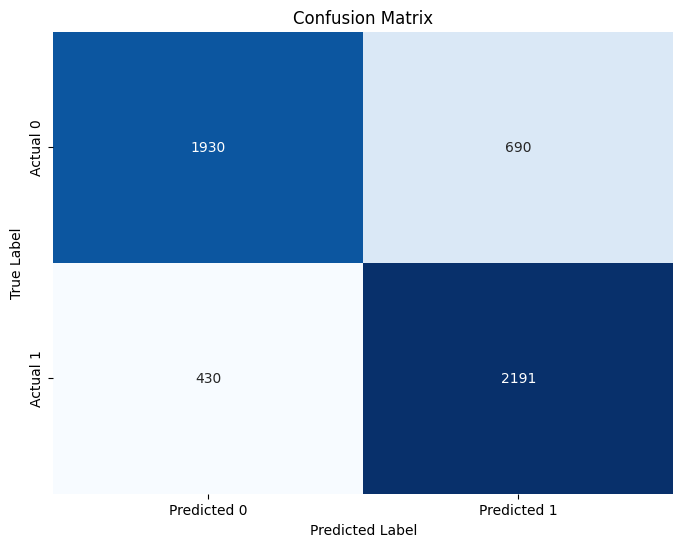

In [ ]:
main(data , nan=0.45)

Model: GaussianNB
Accuracy test: 0.6663 | Accuracy Training: 0.6341
F1-score test: 0.6965 | F1-score Training: 0.6856
roc_AUC-score test:0.7338 | roc_AUC-score Training:      0.7072
Differenza Accuracy: -0.0322
Differenza F1-score: -0.0109
Differenza AUC:      -0.0266

Importanza delle Feature (stimata con Permutation Importance) per Gaussian Naive Bayes:
'loan_int_rate': 0.0714
'person_income': 0.0390
'credit_score': 0.0226
'loan_amnt': 0.0193
'person_home_ownership_RENT': 0.0040
'loan_intent_VENTURE': 0.0014
'loan_intent_EDUCATION': 7.6321e-04
'person_home_ownership_OWN': 6.8689e-04
'loan_intent_MEDICAL': 4.5793e-04
'person_education_High School': 3.4345e-04
'person_education_Bachelor': -7.6321e-05
'loan_intent_HOMEIMPROVEMENT': -7.6321e-05
'person_education_Master': -1.5264e-04
'cb_person_cred_hist_length': -0.0035
'person_age': -0.0048
'person_emp_exp': -0.0055
AUC: 0.7338


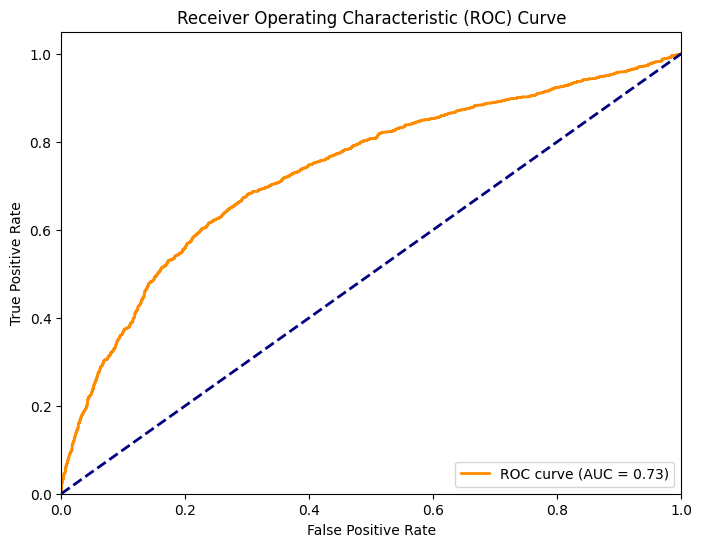

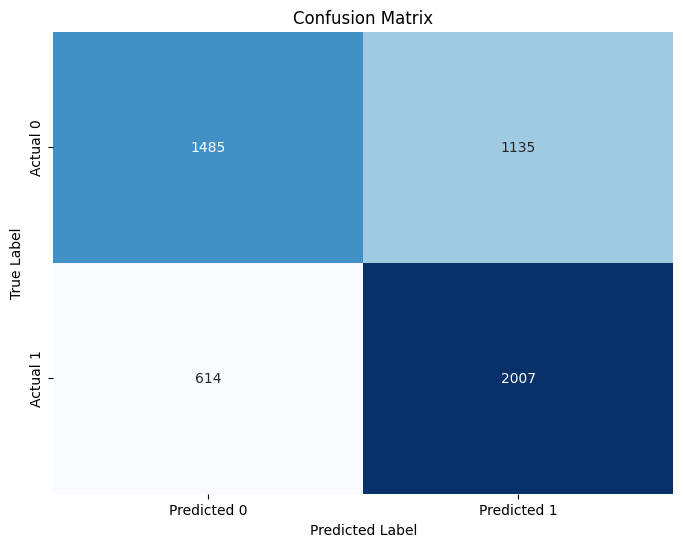

Model: DecisionTreeClassifier
Accuracy test: 0.7832 | Accuracy Training: 0.7334
F1-score test: 0.7798 | F1-score Training: 0.7399
roc_AUC-score test:0.8675 | roc_AUC-score Training:      0.8110
Differenza Accuracy: -0.0498
Differenza F1-score: -0.0399
Differenza AUC:      -0.0565
Importanza delle Feature per Decision Tree:
'person_home_ownership_RENT': 0.3213
'loan_int_rate': 0.2589
'person_income': 0.2007
'loan_amnt': 0.1181
'loan_intent_VENTURE': 0.0285
'credit_score': 0.0245
'loan_intent_MEDICAL': 0.0128
'loan_intent_HOMEIMPROVEMENT': 0.0107
'loan_intent_PERSONAL': 0.0087
'loan_intent_EDUCATION': 0.0085
'person_age': 0.0024
'person_emp_exp': 0.0020
'person_home_ownership_OWN': 0.0010
'cb_person_cred_hist_length': 9.5516e-04
'person_education_High School': 9.0193e-04
AUC: 0.8675


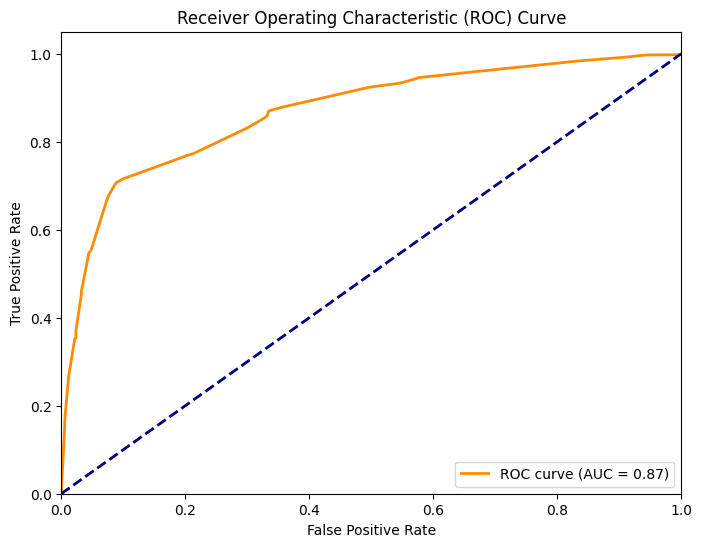

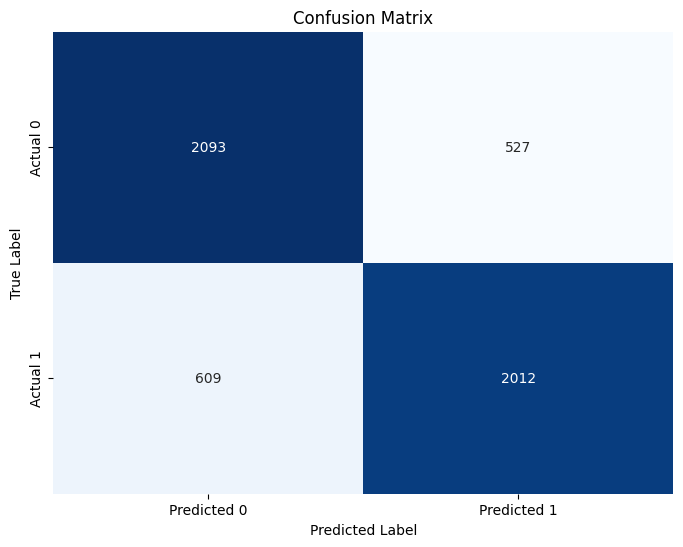

Model: MLPClassifier
Accuracy test: 0.7968 | Accuracy Training: 0.7620
F1-score test: 0.7995 | F1-score Training: 0.7546
roc_AUC-score test:0.8759 | roc_AUC-score Training:      0.8465
Differenza Accuracy: -0.0348
Differenza F1-score: -0.0449
Differenza AUC:      -0.0294

Importanza delle Feature (stimata con Permutation Importance) per MLP:
person_age                      0.000000
person_emp_exp                  0.000000
cb_person_cred_hist_length      0.000000
loan_int_rate                   0.000000
person_home_ownership_OTHER     0.000000
person_home_ownership_OWN       0.000000
credit_score                    0.000000
person_gender_male              0.000000
person_education_Bachelor       0.000000
person_education_Doctorate      0.000000
person_education_High School    0.000000
person_education_Master         0.000000
loan_intent_HOMEIMPROVEMENT     0.000000
loan_intent_MEDICAL             0.000000
person_home_ownership_RENT      0.000000
loan_intent_EDUCATION           0.000000


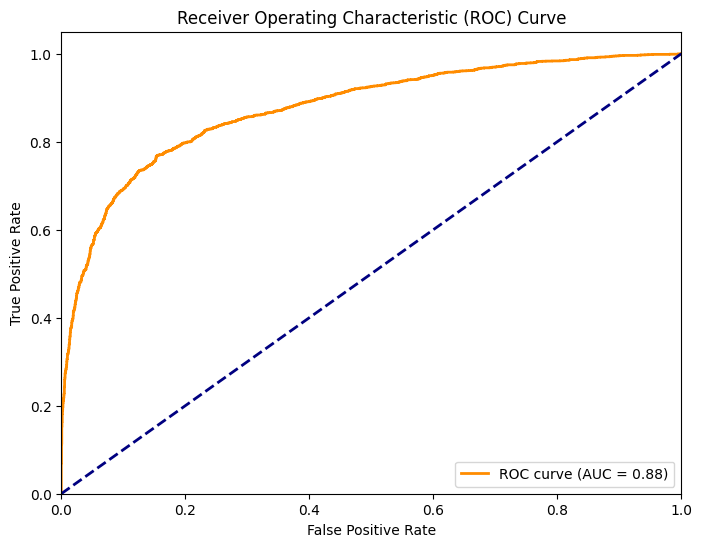

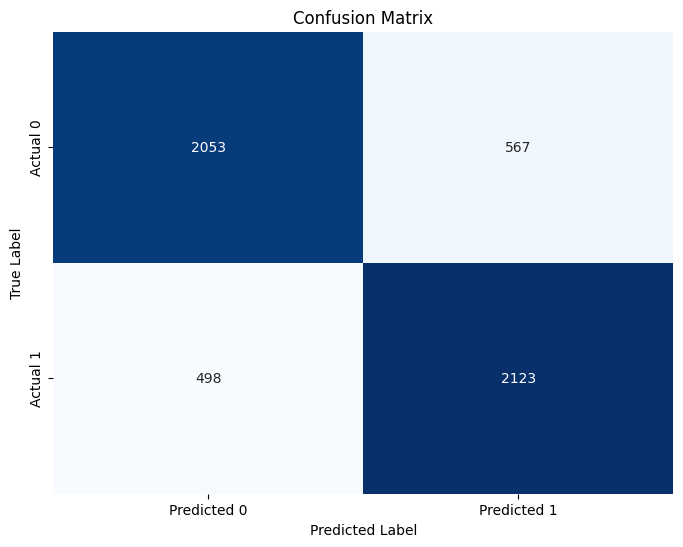

In [ ]:
main(data,nan=0.5) # caso con NaN 50%


Model: GaussianNB
Accuracy test: 0.5896 | Accuracy Training: 0.5494
F1-score test: 0.6703 | F1-score Training: 0.6655
roc_AUC-score test:0.6964 | roc_AUC-score Training:      0.6555
Differenza Accuracy: -0.0402
Differenza F1-score: -0.0049
Differenza AUC:      -0.0409

Importanza delle Feature (stimata con Permutation Importance) per Gaussian Naive Bayes:
'loan_int_rate': 0.0326
'person_income': 0.0254
'credit_score': 0.0128
'loan_amnt': 0.0037
'person_home_ownership_RENT': 0.0036
'loan_intent_VENTURE': 5.3425e-04
'person_home_ownership_OWN': 4.1977e-04
'person_education_Bachelor': 1.9080e-04
'loan_intent_HOMEIMPROVEMENT': 1.5264e-04
'loan_intent_MEDICAL': 1.1448e-04
'person_education_Master': 1.1448e-04
'loan_intent_EDUCATION': -3.8161e-05
'person_education_High School': -3.8161e-05
'loan_intent_PERSONAL': -3.8161e-05
'cb_person_cred_hist_length': -0.0061
'person_emp_exp': -0.0072
'person_age': -0.0090
AUC: 0.6964


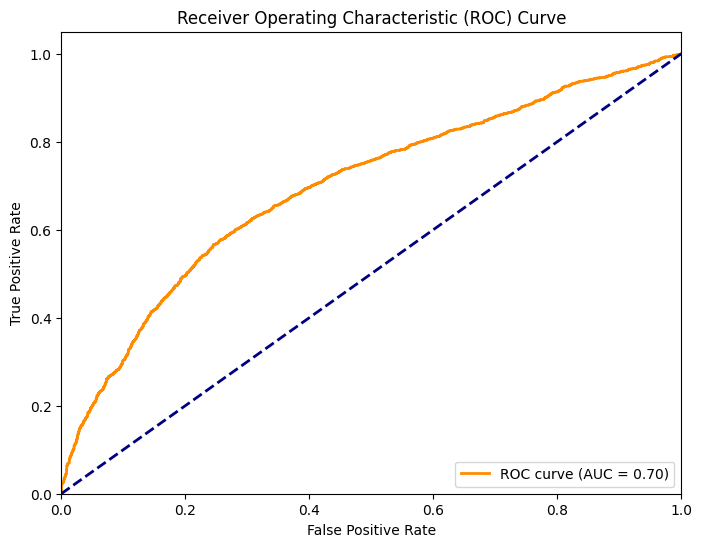

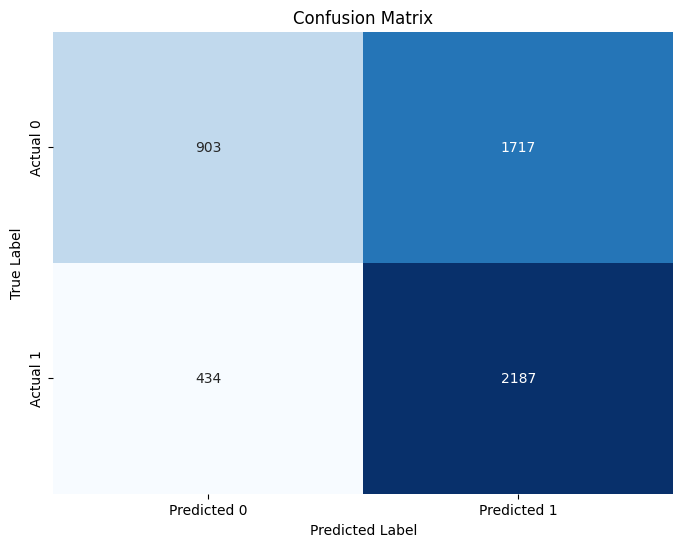

Model: DecisionTreeClassifier
Accuracy test: 0.7764 | Accuracy Training: 0.7142
F1-score test: 0.7765 | F1-score Training: 0.7229
roc_AUC-score test:0.8565 | roc_AUC-score Training:      0.7937
Differenza Accuracy: -0.0622
Differenza F1-score: -0.0536
Differenza AUC:      -0.0628
Importanza delle Feature per Decision Tree:
'person_home_ownership_RENT': 0.3578
'loan_int_rate': 0.2355
'person_income': 0.1753
'loan_amnt': 0.1226
'loan_intent_VENTURE': 0.0328
'loan_intent_EDUCATION': 0.0193
'credit_score': 0.0160
'loan_intent_MEDICAL': 0.0125
'loan_intent_HOMEIMPROVEMENT': 0.0090
'person_age': 0.0059
'loan_intent_PERSONAL': 0.0056
'person_emp_exp': 0.0053
'cb_person_cred_hist_length': 0.0014
'person_education_Doctorate': 9.6999e-04
AUC: 0.8565


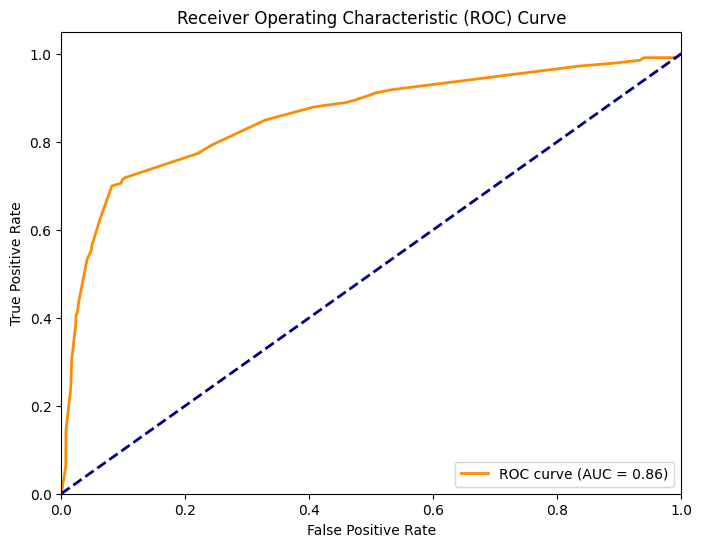

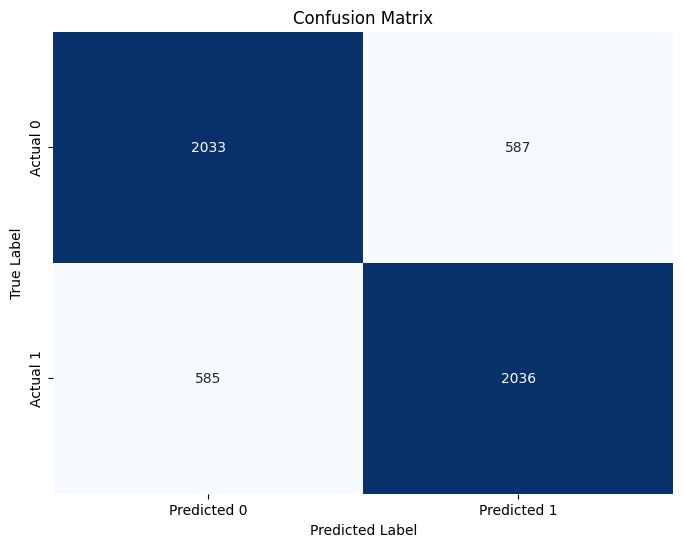

Model: MLPClassifier
Accuracy test: 0.7909 | Accuracy Training: 0.7397
F1-score test: 0.7964 | F1-score Training: 0.7306
roc_AUC-score test:0.8741 | roc_AUC-score Training:      0.8267
Differenza Accuracy: -0.0512
Differenza F1-score: -0.0657
Differenza AUC:      -0.0473

Importanza delle Feature (stimata con Permutation Importance) per MLP:
person_age                      0.000000
person_emp_exp                  0.000000
cb_person_cred_hist_length      0.000000
loan_int_rate                   0.000000
person_home_ownership_OTHER     0.000000
person_home_ownership_OWN       0.000000
credit_score                    0.000000
person_gender_male              0.000000
person_education_Bachelor       0.000000
person_education_Doctorate      0.000000
person_education_High School    0.000000
person_education_Master         0.000000
loan_intent_HOMEIMPROVEMENT     0.000000
loan_intent_MEDICAL             0.000000
person_home_ownership_RENT      0.000000
loan_intent_EDUCATION           0.000000


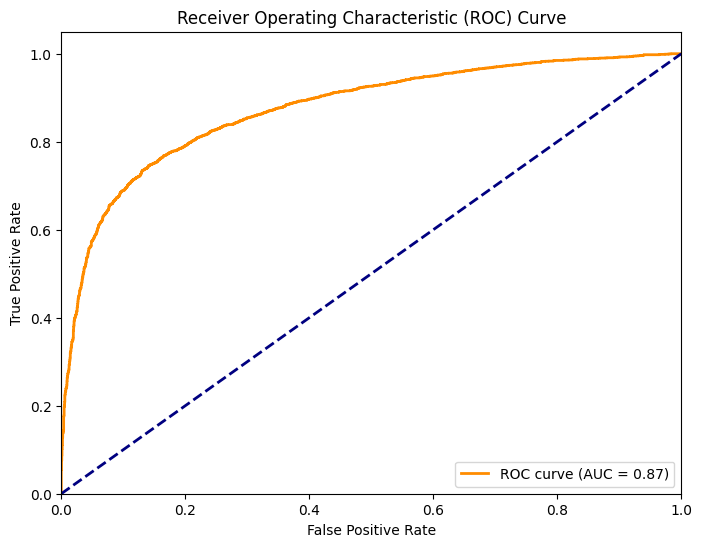

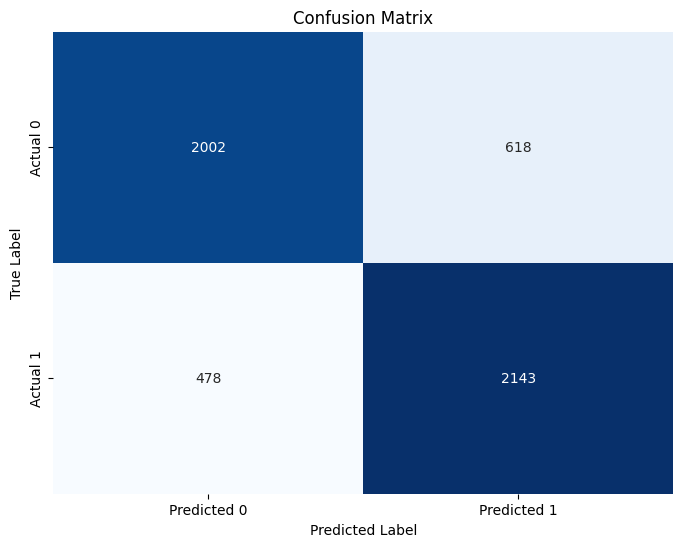

In [ ]:
main(data,nan=0.6) # caso con NaN 60%

Model: GaussianNB
Accuracy test: 0.6577 | Accuracy Training: 0.6126
F1-score test: 0.6909 | F1-score Training: 0.6779
roc_AUC-score test:0.7256 | roc_AUC-score Training:      0.6867
Differenza Accuracy: -0.0451
Differenza F1-score: -0.0130
Differenza AUC:      -0.0389

Importanza delle Feature (stimata con Permutation Importance) per Gaussian Naive Bayes:
'loan_int_rate': 0.0649
'person_income': 0.0376
'credit_score': 0.0214
'loan_amnt': 0.0154
'person_home_ownership_RENT': 0.0048
'person_education_Bachelor': 5.7241e-04
'person_home_ownership_OWN': 5.3425e-04
'person_education_High School': 3.8161e-04
'loan_intent_HOMEIMPROVEMENT': 3.4345e-04
'loan_intent_VENTURE': 1.1448e-04
'person_education_Master': -3.8161e-05
'loan_intent_PERSONAL': -1.5264e-04
'loan_intent_MEDICAL': -7.6321e-04
'loan_intent_EDUCATION': -0.0011
'cb_person_cred_hist_length': -0.0044
'person_emp_exp': -0.0055
'person_age': -0.0063
AUC: 0.7256


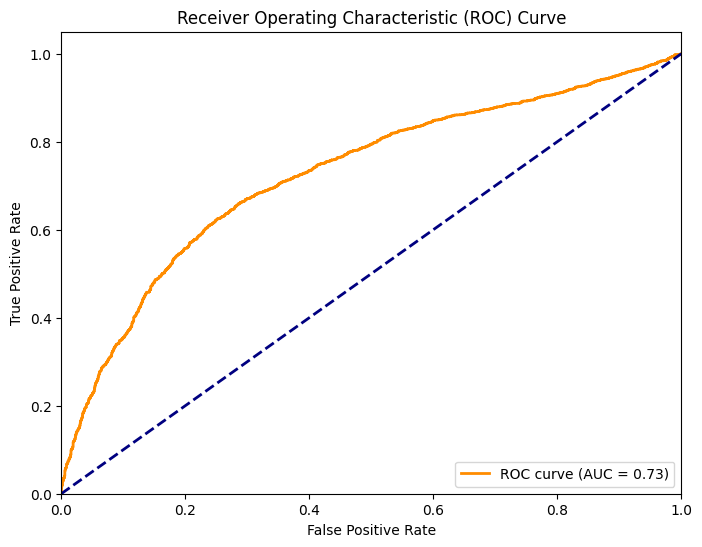

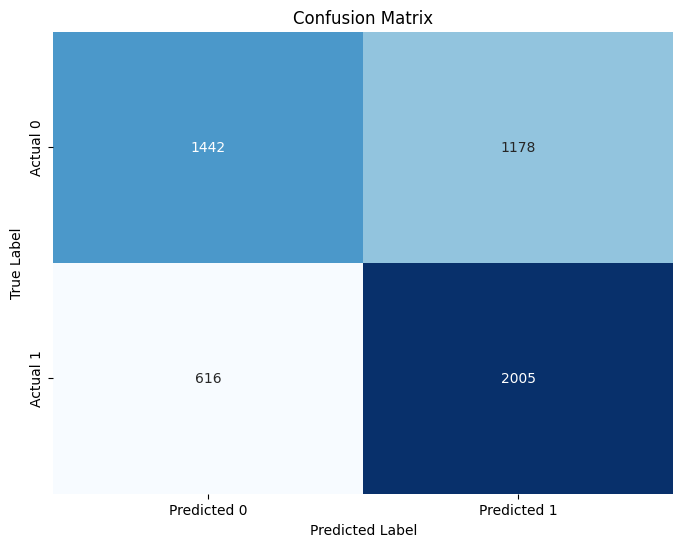

Model: DecisionTreeClassifier
Accuracy test: 0.7754 | Accuracy Training: 0.7102
F1-score test: 0.7809 | F1-score Training: 0.7187
roc_AUC-score test:0.8483 | roc_AUC-score Training:      0.7833
Differenza Accuracy: -0.0652
Differenza F1-score: -0.0622
Differenza AUC:      -0.0650
Importanza delle Feature per Decision Tree:
'person_home_ownership_RENT': 0.3814
'loan_int_rate': 0.2610
'person_income': 0.1843
'loan_amnt': 0.0786
'loan_intent_VENTURE': 0.0325
'loan_intent_EDUCATION': 0.0252
'credit_score': 0.0126
'loan_intent_MEDICAL': 0.0100
'person_home_ownership_OWN': 0.0072
'person_age': 0.0041
'cb_person_cred_hist_length': 0.0026
'loan_intent_PERSONAL': 5.0679e-04
AUC: 0.8483


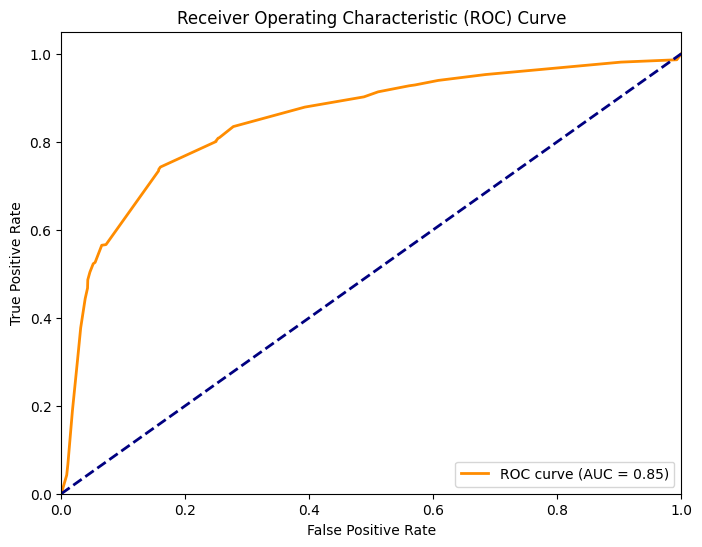

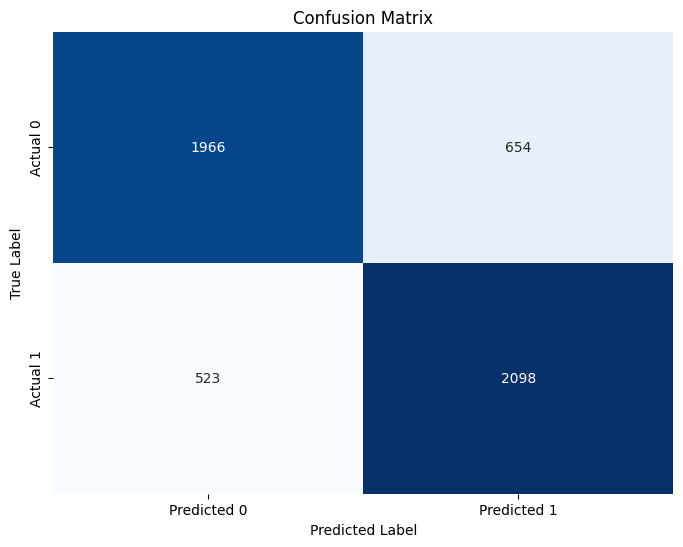

Model: MLPClassifier
Accuracy test: 0.7762 | Accuracy Training: 0.7418
F1-score test: 0.7872 | F1-score Training: 0.7445
roc_AUC-score test:0.8650 | roc_AUC-score Training:      0.8268
Differenza Accuracy: -0.0344
Differenza F1-score: -0.0427
Differenza AUC:      -0.0383

Importanza delle Feature (stimata con Permutation Importance) per MLP:
person_age                      0.000000
person_emp_exp                  0.000000
cb_person_cred_hist_length      0.000000
loan_int_rate                   0.000000
person_home_ownership_OTHER     0.000000
person_home_ownership_OWN       0.000000
credit_score                    0.000000
person_gender_male              0.000000
person_education_Bachelor       0.000000
person_education_Doctorate      0.000000
person_education_High School    0.000000
person_education_Master         0.000000
loan_intent_HOMEIMPROVEMENT     0.000000
loan_intent_MEDICAL             0.000000
person_home_ownership_RENT      0.000000
loan_intent_EDUCATION           0.000000


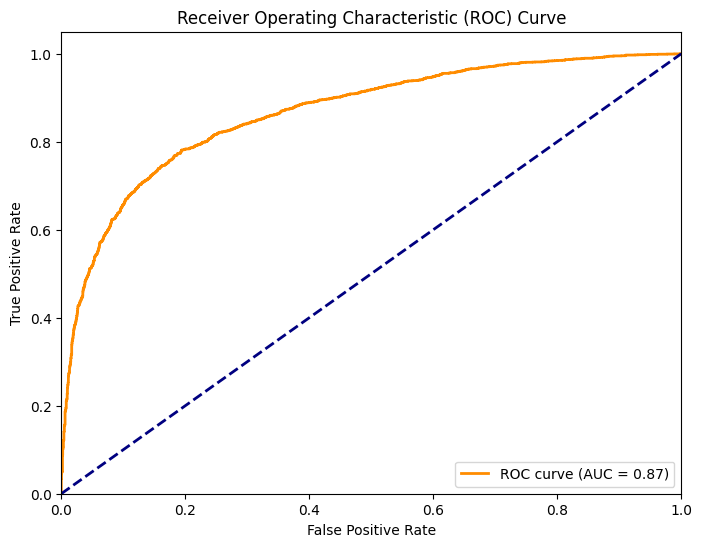

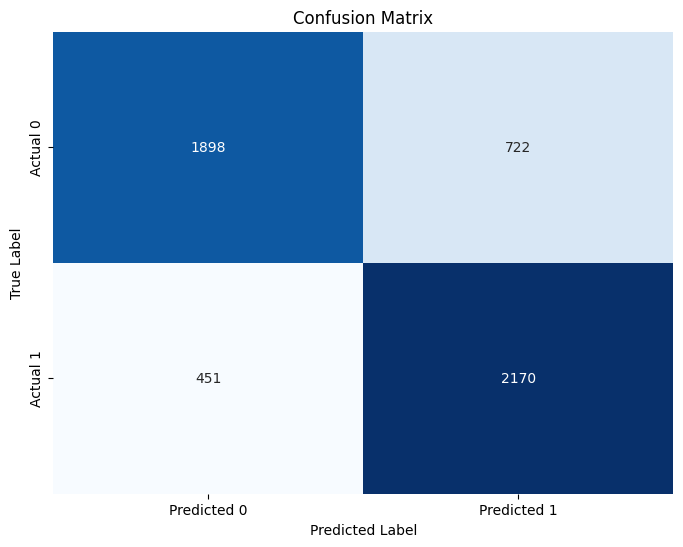

In [ ]:
main(data,nan=0.7) # caso con NaN 70%

## inconsistenze dal 20% al 50%


inconsistenze in:
person_emp_exp: 2455
cb_person_cred_hist_length: 2436

Model: GaussianNB
Accuracy test: 0.6262 | Accuracy Training: 0.6339
F1-score test: 0.6983 | F1-score Training: 0.7016
roc_AUC-score test:0.7377 | roc_AUC-score Training:      0.7414
Differenza Accuracy: 0.0077
Differenza F1-score: 0.0033
Differenza AUC:      0.0037

Importanza delle Feature (stimata con Permutation Importance) per Gaussian Naive Bayes:
'loan_int_rate': 0.0552
'person_income': 0.0414
'credit_score': 0.0143
'loan_amnt': 0.0100
'person_home_ownership_RENT': 0.0015
'loan_intent_MEDICAL': 4.5793e-04
'person_education_High School': 3.8161e-04
'person_education_Master': 1.5264e-04
'loan_intent_VENTURE': 1.1448e-04
'loan_intent_HOMEIMPROVEMENT': 3.8161e-05
'person_education_Bachelor': -1.1448e-04
'loan_intent_PERSONAL': -1.1448e-04
'person_home_ownership_OWN': -1.5264e-04
'loan_intent_EDUCATION': -2.2896e-04
'cb_person_cred_hist_length': -0.0057
'person_emp_exp': -0.0074
'person_age': -0.0087
AUC: 0.7377

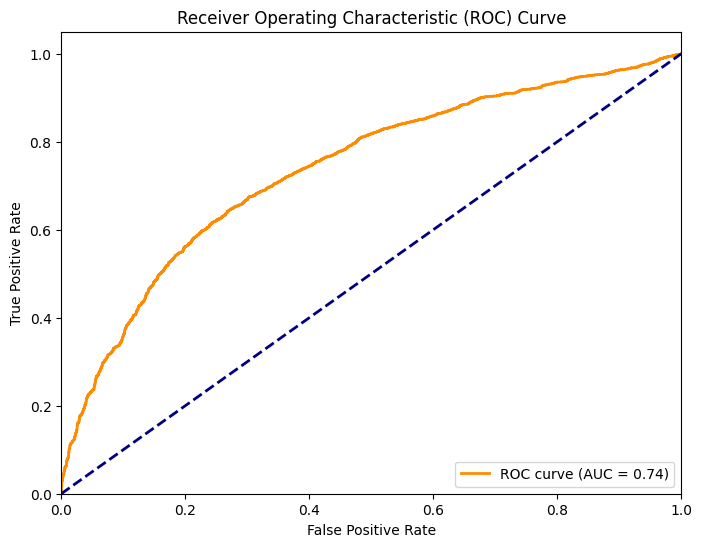

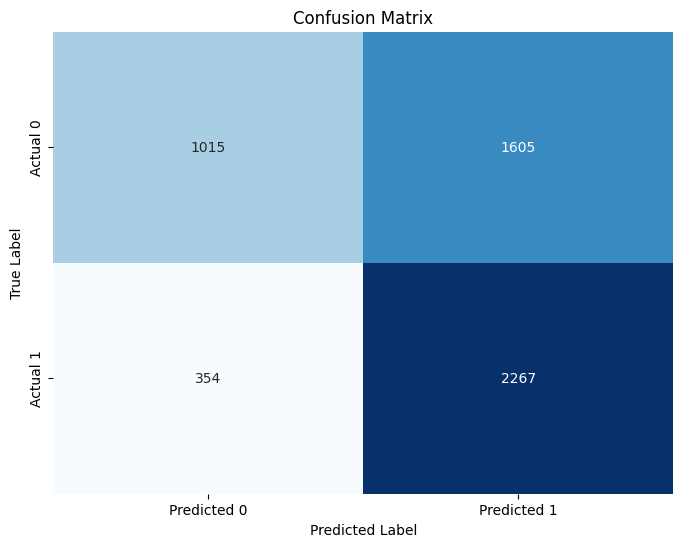

Model: DecisionTreeClassifier
Accuracy test: 0.8046 | Accuracy Training: 0.8145
F1-score test: 0.7894 | F1-score Training: 0.7998
roc_AUC-score test:0.8784 | roc_AUC-score Training:      0.8915
Differenza Accuracy: 0.0098
Differenza F1-score: 0.0104
Differenza AUC:      0.0131
Importanza delle Feature per Decision Tree:
'person_income': 0.3487
'loan_int_rate': 0.2916
'loan_amnt': 0.1348
'person_home_ownership_RENT': 0.1307
'credit_score': 0.0269
'person_home_ownership_OWN': 0.0159
'loan_intent_HOMEIMPROVEMENT': 0.0145
'loan_intent_MEDICAL': 0.0138
'loan_intent_VENTURE': 0.0068
'loan_intent_PERSONAL': 0.0063
'loan_intent_EDUCATION': 0.0059
'person_age': 0.0036
'person_education_Doctorate': 2.9894e-04
AUC: 0.8784


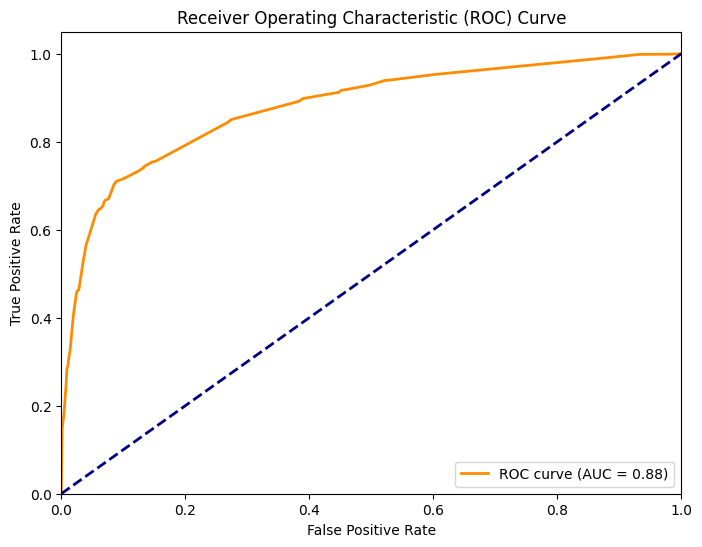

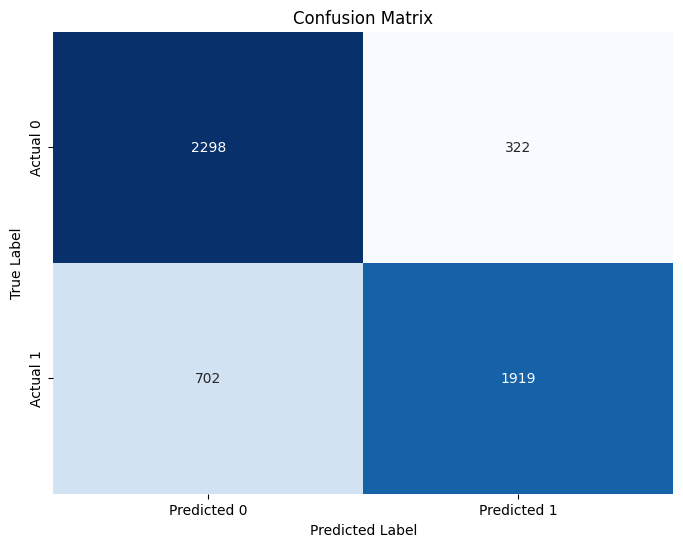

Model: MLPClassifier
Accuracy test: 0.8231 | Accuracy Training: 0.8384
F1-score test: 0.8176 | F1-score Training: 0.8324
roc_AUC-score test:0.9008 | roc_AUC-score Training:      0.9244
Differenza Accuracy: 0.0153
Differenza F1-score: 0.0147
Differenza AUC:      0.0236

Importanza delle Feature (stimata con Permutation Importance) per MLP:
person_age                      0.000000
person_emp_exp                  0.000000
cb_person_cred_hist_length      0.000000
loan_int_rate                   0.000000
person_home_ownership_OTHER     0.000000
person_home_ownership_OWN       0.000000
credit_score                    0.000000
person_gender_male              0.000000
person_education_Bachelor       0.000000
person_education_Doctorate      0.000000
person_education_High School    0.000000
person_education_Master         0.000000
loan_intent_HOMEIMPROVEMENT     0.000000
loan_intent_MEDICAL             0.000000
person_home_ownership_RENT      0.000000
loan_intent_EDUCATION           0.000000
loa

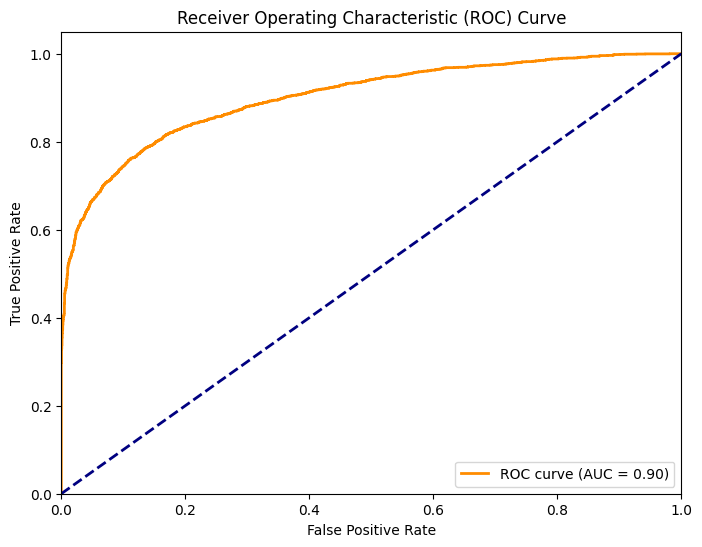

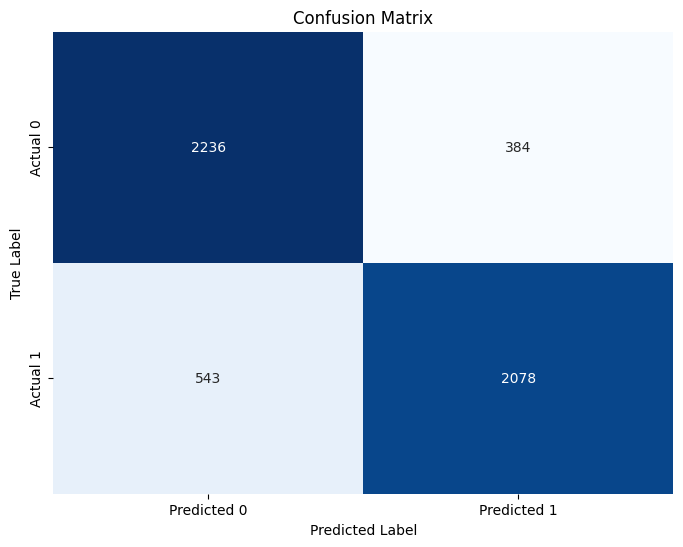

In [ ]:
main(data,inconsistenza=0.2) # caso con inconsistenza 20%


inconsistenze in:
person_emp_exp: 3680
cb_person_cred_hist_length: 3657

Model: GaussianNB
Accuracy test: 0.6279 | Accuracy Training: 0.6373
F1-score test: 0.7004 | F1-score Training: 0.7036
roc_AUC-score test:0.7395 | roc_AUC-score Training:      0.7429
Differenza Accuracy: 0.0093
Differenza F1-score: 0.0032
Differenza AUC:      0.0034

Importanza delle Feature (stimata con Permutation Importance) per Gaussian Naive Bayes:
'loan_int_rate': 0.0567
'person_income': 0.0407
'credit_score': 0.0143
'loan_amnt': 0.0113
'person_home_ownership_RENT': 0.0022
'loan_intent_HOMEIMPROVEMENT': 2.6712e-04
'loan_intent_EDUCATION': 1.1448e-04
'loan_intent_PERSONAL': 3.8161e-05
'person_education_Master': 4.4409e-17
'loan_intent_VENTURE': 2.2204e-17
'person_education_Bachelor': -3.8161e-05
'person_education_High School': -1.5264e-04
'loan_intent_MEDICAL': -2.2896e-04
'person_home_ownership_OWN': -2.6712e-04
'cb_person_cred_hist_length': -0.0040
'person_age': -0.0056
'person_emp_exp': -0.0065
AUC: 0.7395

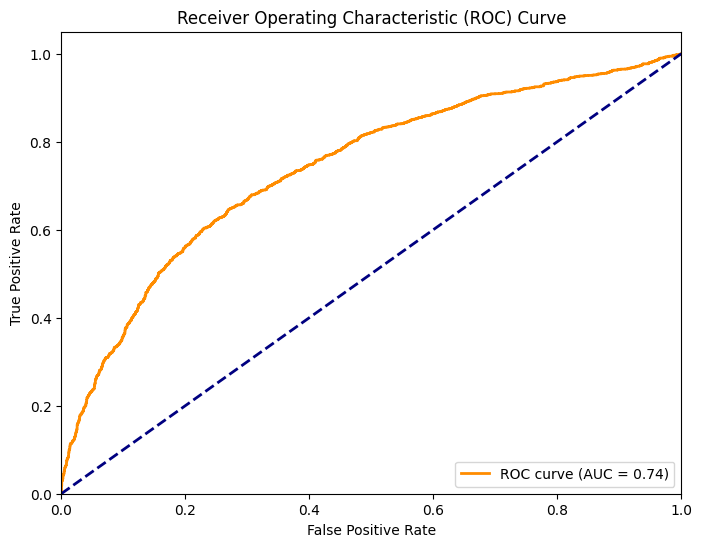

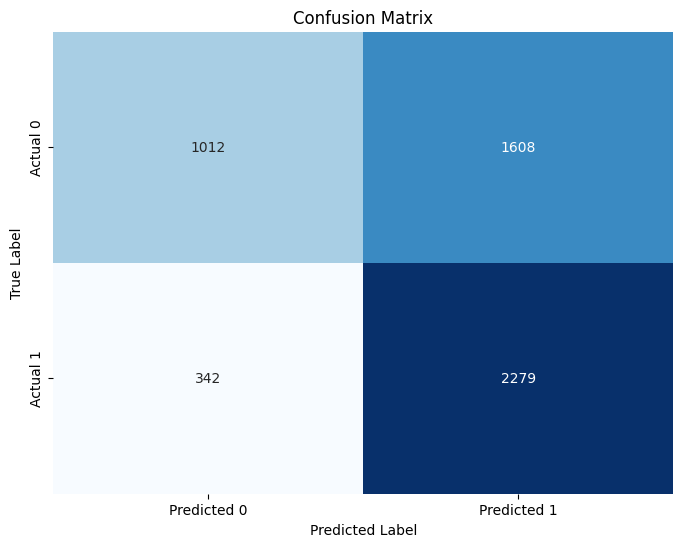

Model: DecisionTreeClassifier
Accuracy test: 0.8046 | Accuracy Training: 0.8146
F1-score test: 0.7894 | F1-score Training: 0.8000
roc_AUC-score test:0.8782 | roc_AUC-score Training:      0.8914
Differenza Accuracy: 0.0100
Differenza F1-score: 0.0106
Differenza AUC:      0.0133
Importanza delle Feature per Decision Tree:
'person_income': 0.3483
'loan_int_rate': 0.2914
'loan_amnt': 0.1348
'person_home_ownership_RENT': 0.1307
'credit_score': 0.0264
'person_home_ownership_OWN': 0.0159
'loan_intent_HOMEIMPROVEMENT': 0.0145
'loan_intent_MEDICAL': 0.0138
'loan_intent_VENTURE': 0.0068
'loan_intent_PERSONAL': 0.0063
'loan_intent_EDUCATION': 0.0059
'person_age': 0.0036
'cb_person_cred_hist_length': 0.0012
'person_education_Doctorate': 2.9879e-04
AUC: 0.8782


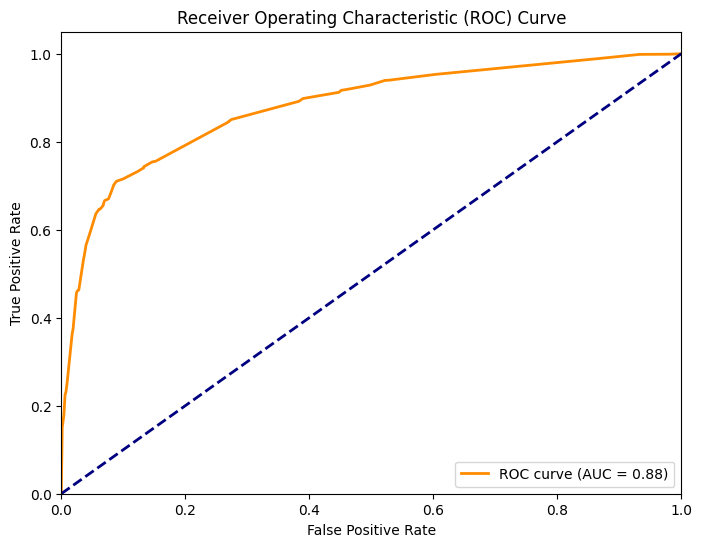

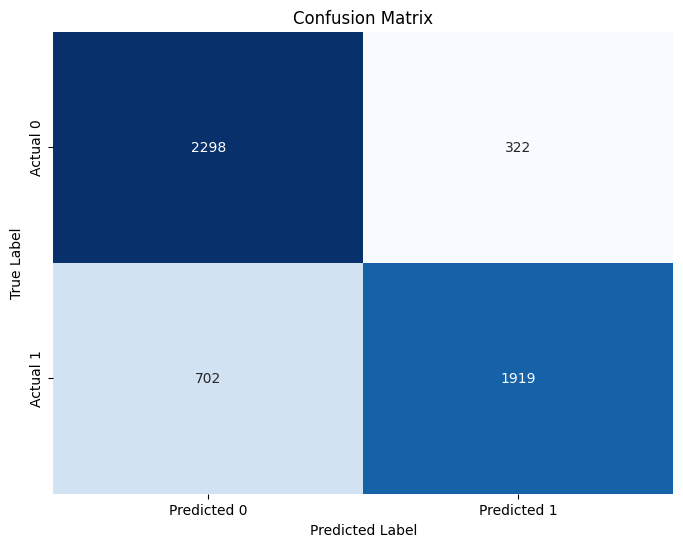

Model: MLPClassifier
Accuracy test: 0.8220 | Accuracy Training: 0.8402
F1-score test: 0.8162 | F1-score Training: 0.8344
roc_AUC-score test:0.9010 | roc_AUC-score Training:      0.9252
Differenza Accuracy: 0.0182
Differenza F1-score: 0.0182
Differenza AUC:      0.0243

Importanza delle Feature (stimata con Permutation Importance) per MLP:
person_income                   0.024385
loan_int_rate                   0.000267
cb_person_cred_hist_length      0.000038
credit_score                    0.000038
person_home_ownership_OTHER     0.000000
person_emp_exp                  0.000000
person_age                      0.000000
person_gender_male              0.000000
person_education_Bachelor       0.000000
person_education_Doctorate      0.000000
person_education_High School    0.000000
person_education_Master         0.000000
loan_intent_HOMEIMPROVEMENT     0.000000
person_home_ownership_OWN       0.000000
person_home_ownership_RENT      0.000000
loan_intent_EDUCATION           0.000000
loa

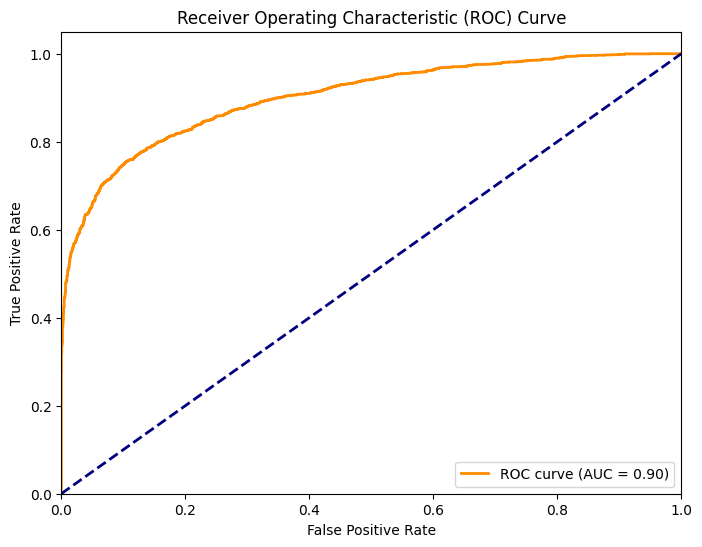

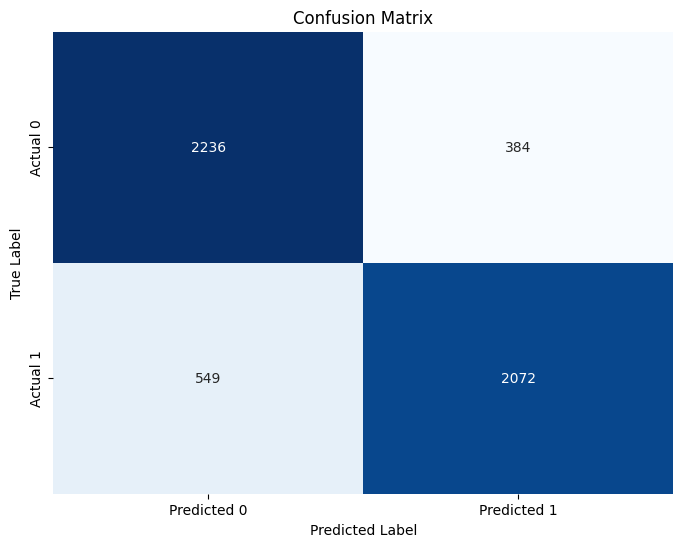

In [ ]:
main(data,inconsistenza=0.3) # caso con inconsistenza 30%


inconsistenze in:
person_emp_exp: 4994
cb_person_cred_hist_length: 4789

Model: GaussianNB
Accuracy test: 0.6224 | Accuracy Training: 0.6288
F1-score test: 0.7014 | F1-score Training: 0.6990
roc_AUC-score test:0.7401 | roc_AUC-score Training:      0.7394
Differenza Accuracy: 0.0064
Differenza F1-score: -0.0023
Differenza AUC:      -0.0006

Importanza delle Feature (stimata con Permutation Importance) per Gaussian Naive Bayes:
'loan_int_rate': 0.0535
'person_income': 0.0417
'credit_score': 0.0147
'loan_amnt': 0.0108
'person_home_ownership_RENT': 0.0027
'loan_intent_EDUCATION': 9.9218e-04
'person_education_Master': 3.8161e-04
'loan_intent_VENTURE': 1.5264e-04
'cb_person_cred_hist_length': 1.5264e-04
'loan_intent_HOMEIMPROVEMENT': 1.5264e-04
'loan_intent_PERSONAL': 1.1448e-04
'person_education_High School': 1.1448e-04
'person_education_Bachelor': 7.6321e-05
'person_home_ownership_OWN': -3.8161e-05
'loan_intent_MEDICAL': -2.6712e-04
'person_age': -0.0026
'person_emp_exp': -0.0030
AUC: 0.7

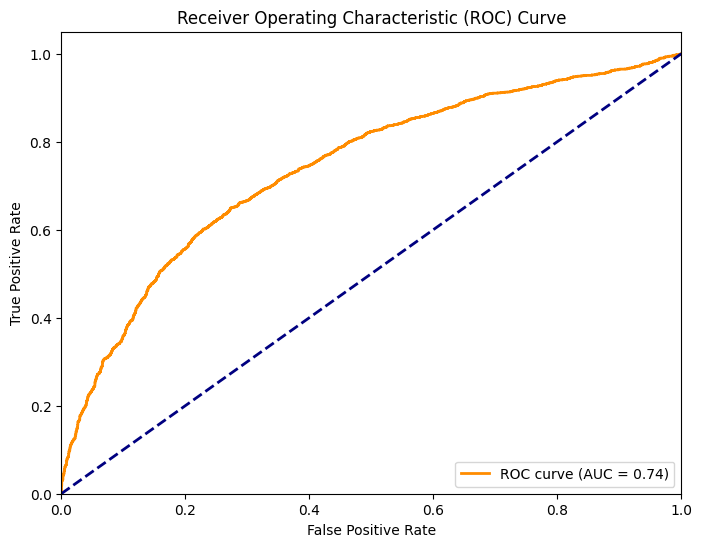

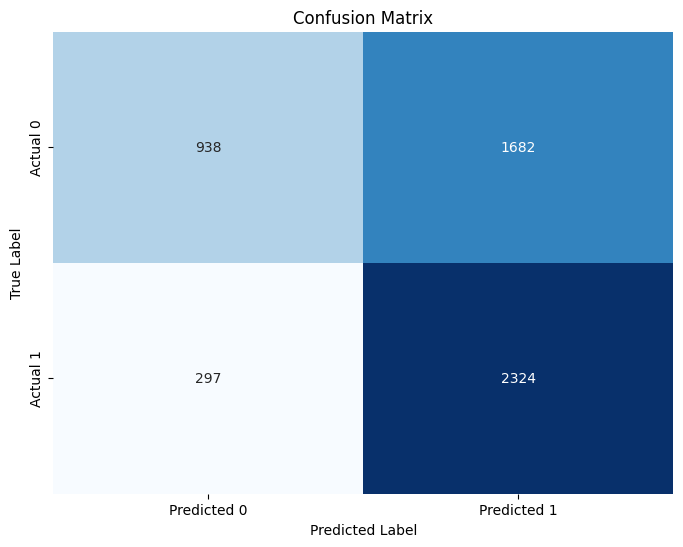

Model: DecisionTreeClassifier
Accuracy test: 0.8044 | Accuracy Training: 0.8146
F1-score test: 0.7893 | F1-score Training: 0.8000
roc_AUC-score test:0.8783 | roc_AUC-score Training:      0.8915
Differenza Accuracy: 0.0102
Differenza F1-score: 0.0107
Differenza AUC:      0.0132
Importanza delle Feature per Decision Tree:
'person_income': 0.3485
'loan_int_rate': 0.2914
'loan_amnt': 0.1347
'person_home_ownership_RENT': 0.1307
'credit_score': 0.0264
'person_home_ownership_OWN': 0.0159
'loan_intent_HOMEIMPROVEMENT': 0.0145
'loan_intent_MEDICAL': 0.0138
'loan_intent_VENTURE': 0.0068
'loan_intent_PERSONAL': 0.0063
'loan_intent_EDUCATION': 0.0059
'person_age': 0.0027
'cb_person_cred_hist_length': 0.0019
'person_education_Doctorate': 2.9878e-04
'person_emp_exp': 9.5048e-05
AUC: 0.8783


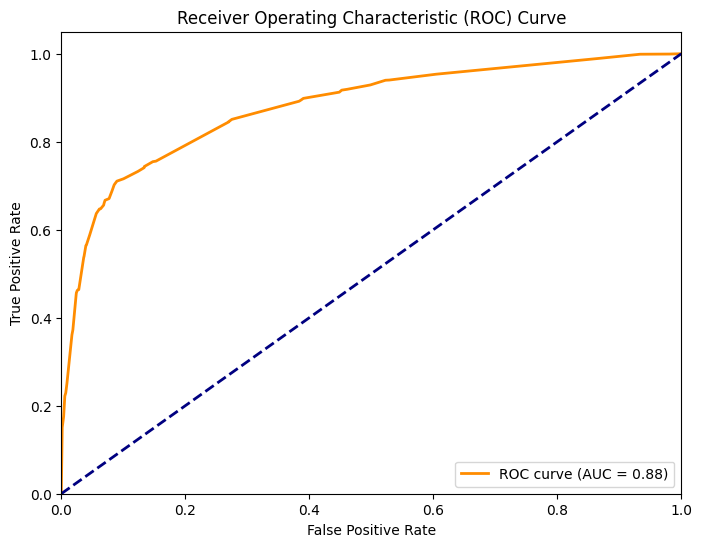

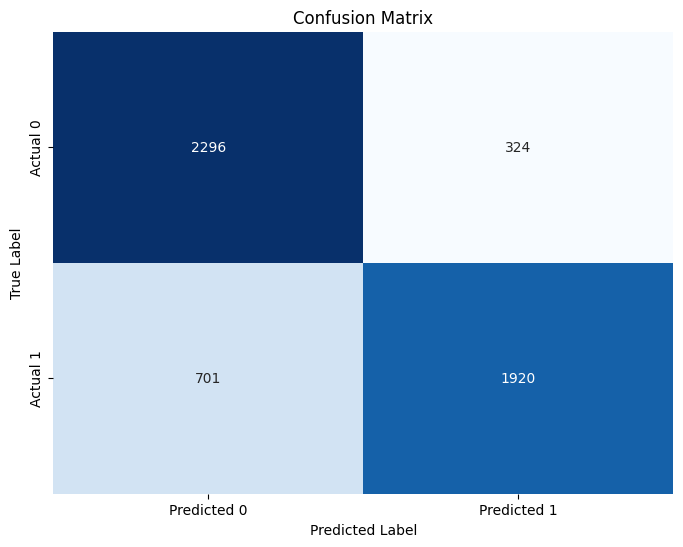

Model: MLPClassifier
Accuracy test: 0.8237 | Accuracy Training: 0.8467
F1-score test: 0.8160 | F1-score Training: 0.8380
roc_AUC-score test:0.9019 | roc_AUC-score Training:      0.9280
Differenza Accuracy: 0.0230
Differenza F1-score: 0.0219
Differenza AUC:      0.0260

Importanza delle Feature (stimata con Permutation Importance) per MLP:
person_age                      0.000000e+00
person_emp_exp                  0.000000e+00
cb_person_cred_hist_length      0.000000e+00
loan_int_rate                   0.000000e+00
person_home_ownership_OTHER     0.000000e+00
person_home_ownership_OWN       0.000000e+00
credit_score                    0.000000e+00
person_gender_male              0.000000e+00
person_education_Bachelor       0.000000e+00
person_education_Doctorate      0.000000e+00
person_education_High School    0.000000e+00
person_education_Master         0.000000e+00
loan_intent_HOMEIMPROVEMENT     0.000000e+00
loan_intent_MEDICAL             0.000000e+00
person_home_ownership_RENT   

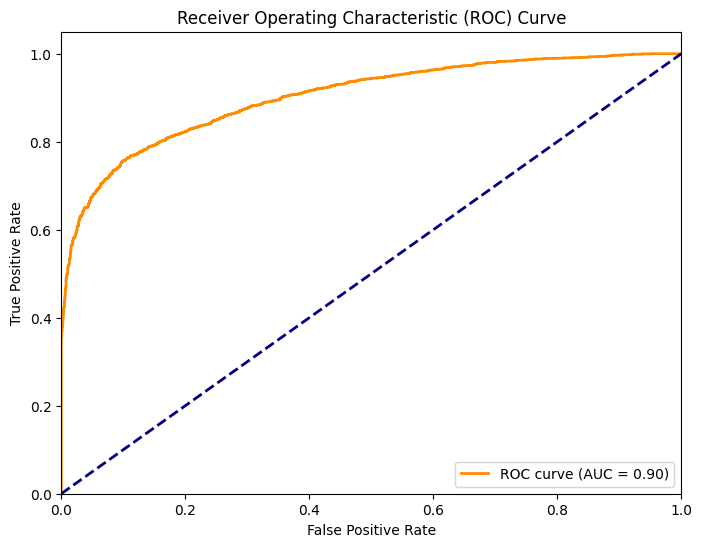

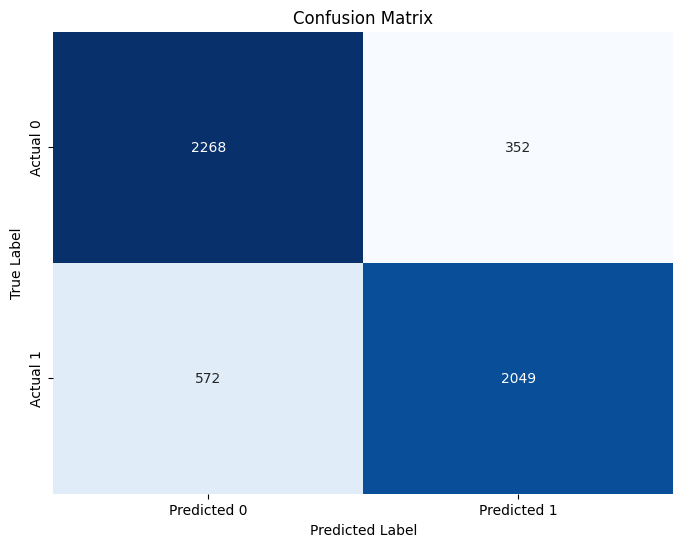

In [ ]:
main(data,inconsistenza=0.4) # caso con inconsistenza 40%


inconsistenze in:
person_emp_exp: 6206
cb_person_cred_hist_length: 6023

Model: GaussianNB
Accuracy test: 0.6222 | Accuracy Training: 0.6286
F1-score test: 0.7012 | F1-score Training: 0.6978
roc_AUC-score test:0.7413 | roc_AUC-score Training:      0.7393
Differenza Accuracy: 0.0064
Differenza F1-score: -0.0033
Differenza AUC:      -0.0020

Importanza delle Feature (stimata con Permutation Importance) per Gaussian Naive Bayes:
'loan_int_rate': 0.0527
'person_income': 0.0405
'credit_score': 0.0141
'loan_amnt': 0.0098
'person_home_ownership_RENT': 0.0017
'person_education_Master': 1.5264e-04
'loan_intent_EDUCATION': 1.1448e-04
'person_education_Bachelor': 1.1448e-04
'person_education_High School': 1.1448e-04
'person_home_ownership_OWN': 7.6321e-05
'loan_intent_MEDICAL': 7.6321e-05
'loan_intent_PERSONAL': 3.8161e-05
'loan_intent_HOMEIMPROVEMENT': 3.8161e-05
'cb_person_cred_hist_length': 4.4409e-17
'loan_intent_VENTURE': -1.1448e-04
'person_age': -0.0033
'person_emp_exp': -0.0037
AUC: 0.74

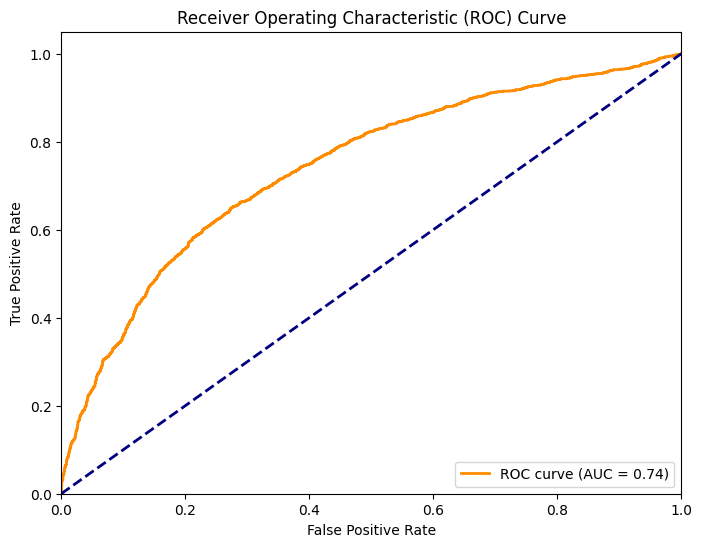

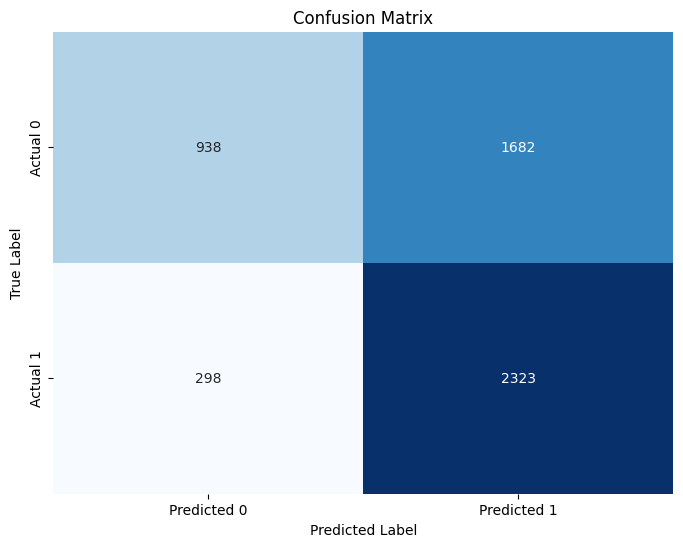

Model: DecisionTreeClassifier
Accuracy test: 0.8058 | Accuracy Training: 0.8149
F1-score test: 0.7910 | F1-score Training: 0.8006
roc_AUC-score test:0.8789 | roc_AUC-score Training:      0.8917
Differenza Accuracy: 0.0091
Differenza F1-score: 0.0096
Differenza AUC:      0.0128
Importanza delle Feature per Decision Tree:
'person_income': 0.3482
'loan_int_rate': 0.2914
'loan_amnt': 0.1347
'person_home_ownership_RENT': 0.1306
'credit_score': 0.0269
'person_home_ownership_OWN': 0.0159
'loan_intent_HOMEIMPROVEMENT': 0.0145
'loan_intent_MEDICAL': 0.0138
'loan_intent_VENTURE': 0.0068
'loan_intent_PERSONAL': 0.0063
'loan_intent_EDUCATION': 0.0059
'cb_person_cred_hist_length': 0.0033
'person_age': 0.0013
'person_education_Doctorate': 2.9871e-04
AUC: 0.8789


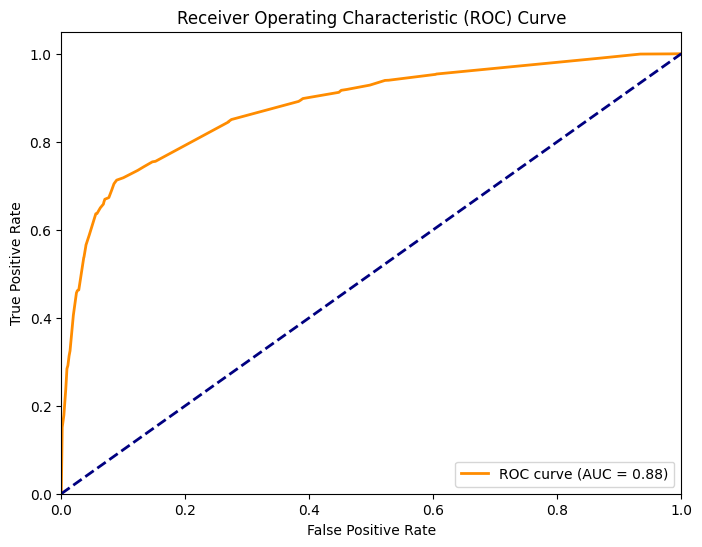

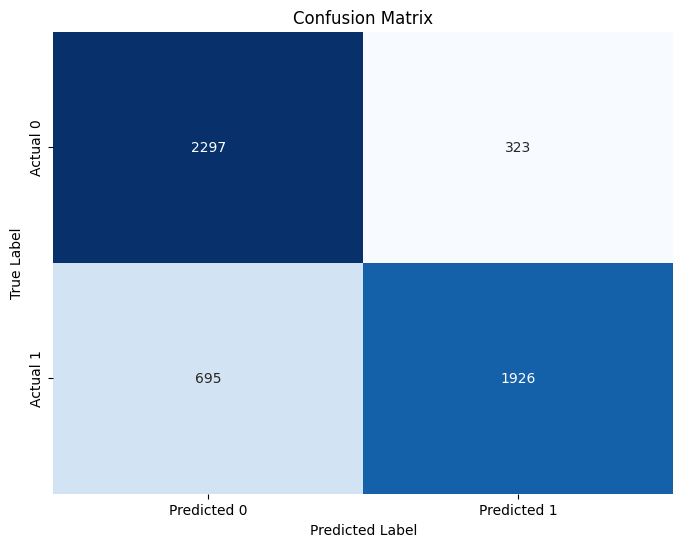

Model: MLPClassifier
Accuracy test: 0.8222 | Accuracy Training: 0.8414
F1-score test: 0.8157 | F1-score Training: 0.8357
roc_AUC-score test:0.8994 | roc_AUC-score Training:      0.9271
Differenza Accuracy: 0.0193
Differenza F1-score: 0.0201
Differenza AUC:      0.0277

Importanza delle Feature (stimata con Permutation Importance) per MLP:
person_age                      0.000000
person_emp_exp                  0.000000
cb_person_cred_hist_length      0.000000
loan_int_rate                   0.000000
person_home_ownership_OTHER     0.000000
person_home_ownership_OWN       0.000000
credit_score                    0.000000
person_gender_male              0.000000
person_education_Bachelor       0.000000
person_education_Doctorate      0.000000
person_education_High School    0.000000
person_education_Master         0.000000
loan_intent_HOMEIMPROVEMENT     0.000000
loan_intent_MEDICAL             0.000000
person_home_ownership_RENT      0.000000
loan_intent_EDUCATION           0.000000
loa

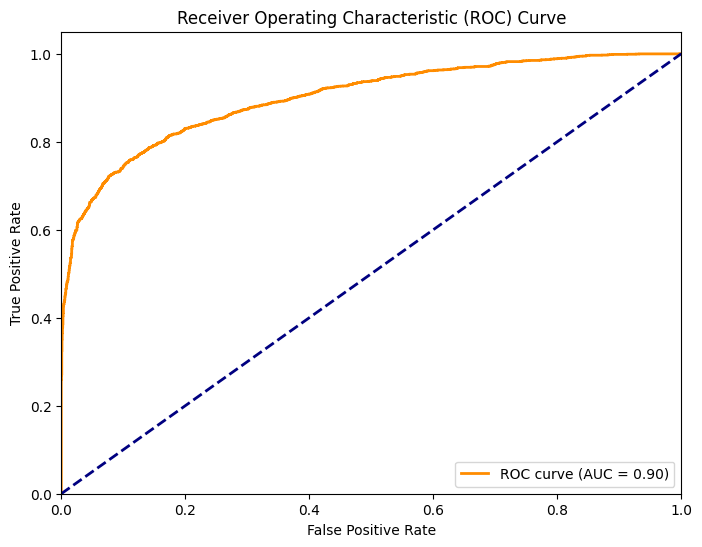

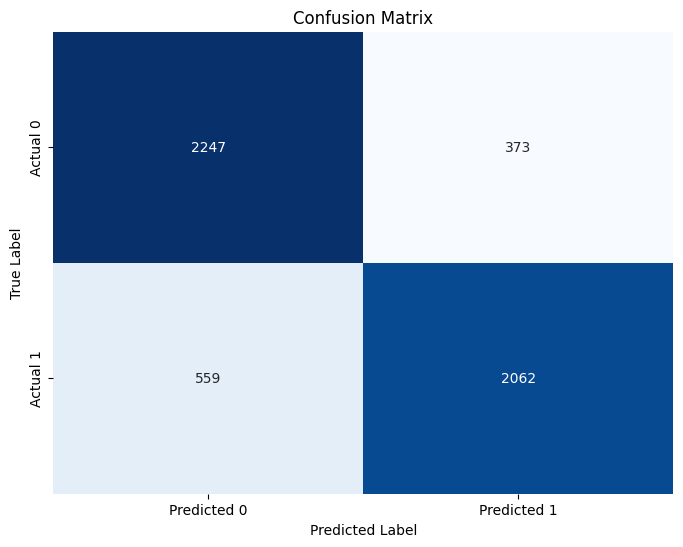

In [ ]:
main(data,inconsistenza=0.5) # caso con inconsistenza 50%


inconsistenze in:
person_emp_exp: 7382
cb_person_cred_hist_length: 7292

Model: GaussianNB
Accuracy test: 0.6235 | Accuracy Training: 0.6337
F1-score test: 0.7016 | F1-score Training: 0.7010
roc_AUC-score test:0.7422 | roc_AUC-score Training:      0.7411
Differenza Accuracy: 0.0101
Differenza F1-score: -0.0006
Differenza AUC:      -0.0011

Importanza delle Feature (stimata con Permutation Importance) per Gaussian Naive Bayes:
'loan_int_rate': 0.0535
'person_income': 0.0399
'credit_score': 0.0137
'loan_amnt': 0.0089
'person_home_ownership_RENT': 0.0016
'loan_intent_VENTURE': 1.5264e-04
'loan_intent_HOMEIMPROVEMENT': -3.8161e-05
'person_education_Master': -7.6321e-05
'loan_intent_PERSONAL': -7.6321e-05
'person_education_High School': -1.1448e-04
'loan_intent_EDUCATION': -2.2896e-04
'person_home_ownership_OWN': -2.2896e-04
'loan_intent_MEDICAL': -2.6712e-04
'cb_person_cred_hist_length': -0.0020
'person_age': -0.0032
'person_emp_exp': -0.0044
AUC: 0.7422


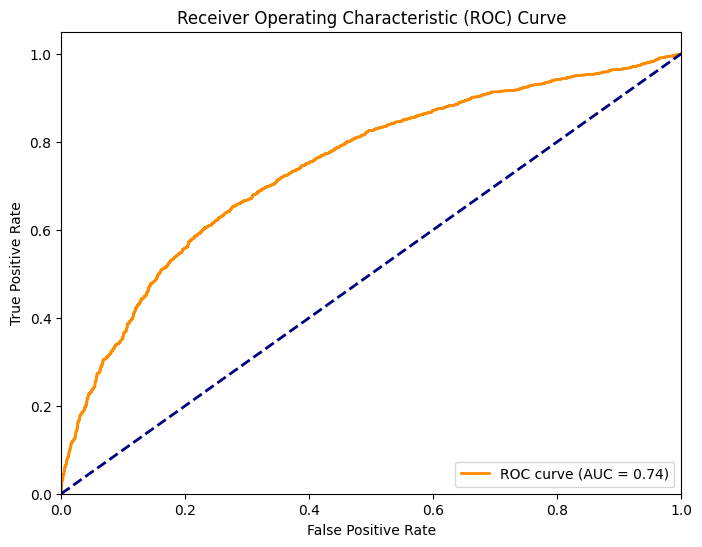

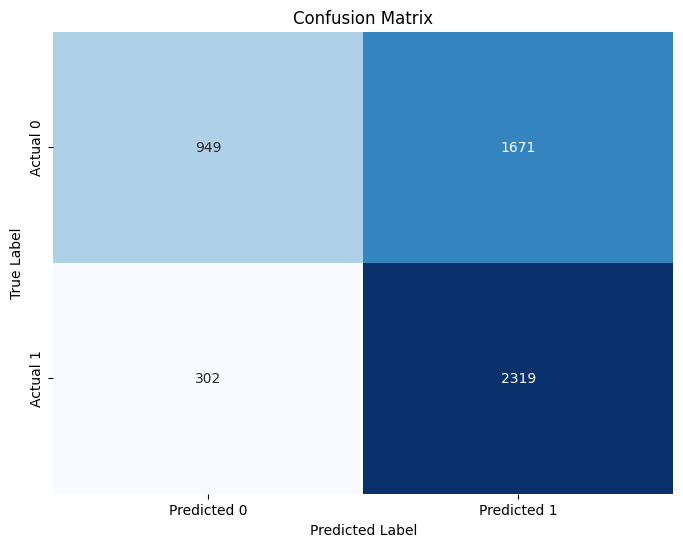

Model: DecisionTreeClassifier
Accuracy test: 0.8027 | Accuracy Training: 0.8142
F1-score test: 0.7880 | F1-score Training: 0.8002
roc_AUC-score test:0.8769 | roc_AUC-score Training:      0.8905
Differenza Accuracy: 0.0115
Differenza F1-score: 0.0121
Differenza AUC:      0.0136
Importanza delle Feature per Decision Tree:
'person_income': 0.3435
'loan_int_rate': 0.2933
'loan_amnt': 0.1354
'person_home_ownership_RENT': 0.1315
'credit_score': 0.0271
'person_home_ownership_OWN': 0.0160
'loan_intent_HOMEIMPROVEMENT': 0.0146
'loan_intent_MEDICAL': 0.0139
'loan_intent_VENTURE': 0.0069
'loan_intent_PERSONAL': 0.0064
'loan_intent_EDUCATION': 0.0059
'person_age': 0.0027
'person_emp_exp': 0.0014
'cb_person_cred_hist_length': 0.0012
'person_education_Doctorate': 3.0067e-04
AUC: 0.8769


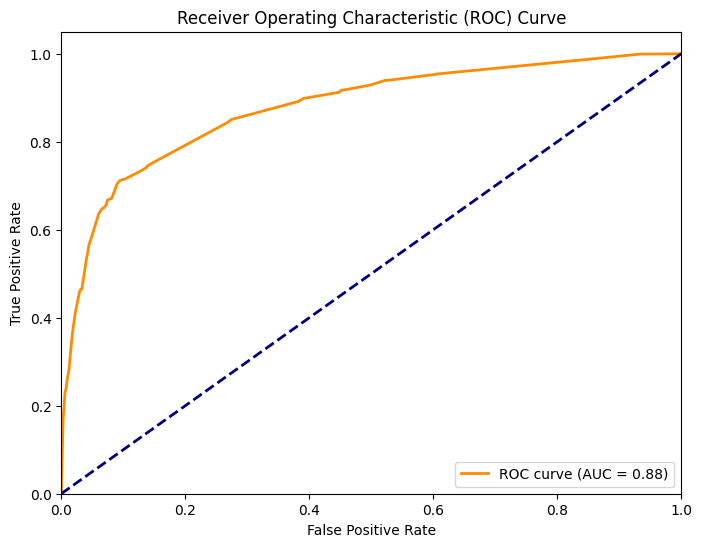

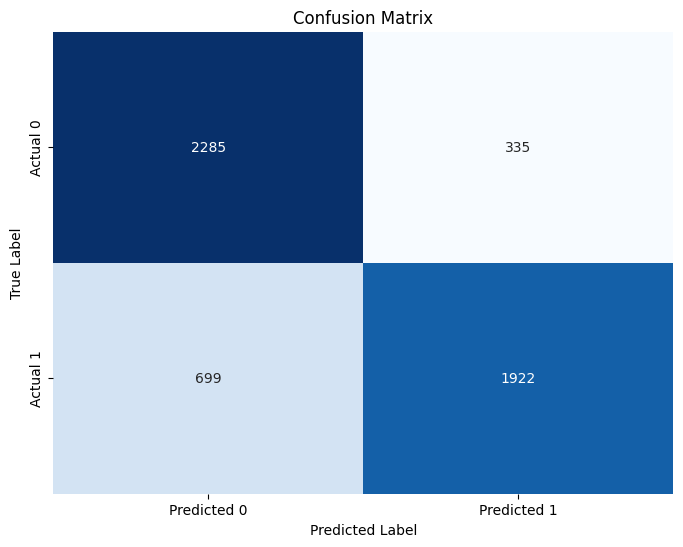

Model: MLPClassifier
Accuracy test: 0.8168 | Accuracy Training: 0.8421
F1-score test: 0.8099 | F1-score Training: 0.8365
roc_AUC-score test:0.8988 | roc_AUC-score Training:      0.9258
Differenza Accuracy: 0.0253
Differenza F1-score: 0.0266
Differenza AUC:      0.0270

Importanza delle Feature (stimata con Permutation Importance) per MLP:
person_age                      0.000000e+00
person_emp_exp                  0.000000e+00
cb_person_cred_hist_length      0.000000e+00
loan_int_rate                   0.000000e+00
person_home_ownership_OTHER     0.000000e+00
person_home_ownership_OWN       0.000000e+00
credit_score                    0.000000e+00
person_gender_male              0.000000e+00
person_education_Bachelor       0.000000e+00
person_education_Doctorate      0.000000e+00
person_education_High School    0.000000e+00
person_education_Master         0.000000e+00
loan_intent_HOMEIMPROVEMENT     0.000000e+00
loan_intent_MEDICAL             0.000000e+00
person_home_ownership_RENT   

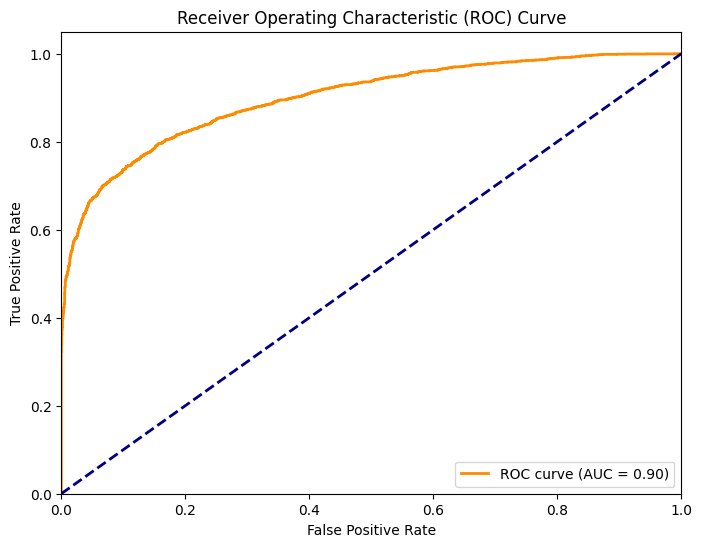

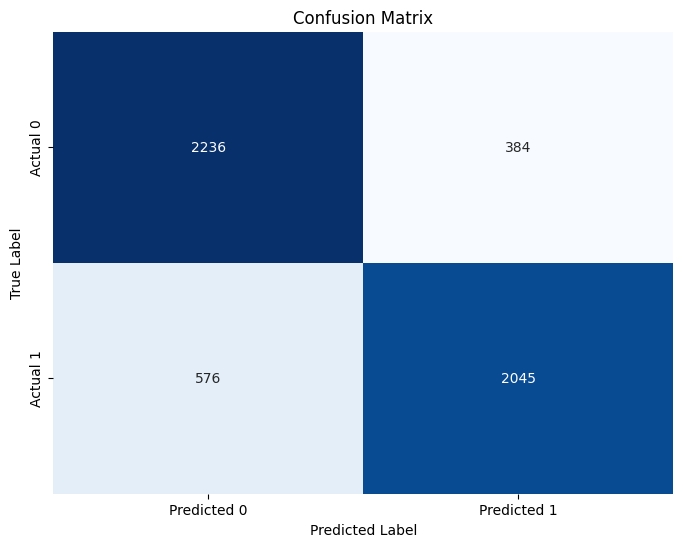

In [ ]:
main(data,inconsistenza=0.6) # caso con inconsistenza 60%


inconsistenze in:
person_emp_exp: 8594
cb_person_cred_hist_length: 8526

Model: GaussianNB
Accuracy test: 0.6253 | Accuracy Training: 0.6327
F1-score test: 0.7030 | F1-score Training: 0.7000
roc_AUC-score test:0.7429 | roc_AUC-score Training:      0.7403
Differenza Accuracy: 0.0074
Differenza F1-score: -0.0030
Differenza AUC:      -0.0026

Importanza delle Feature (stimata con Permutation Importance) per Gaussian Naive Bayes:
'loan_int_rate': 0.0551
'person_income': 0.0411
'credit_score': 0.0149
'loan_amnt': 0.0095
'person_home_ownership_RENT': 0.0021
'loan_intent_VENTURE': 3.4345e-04
'person_education_Master': 1.5264e-04
'loan_intent_PERSONAL': 1.1448e-04
'loan_intent_HOMEIMPROVEMENT': 3.8161e-05
'person_education_High School': 3.8161e-05
'loan_intent_MEDICAL': 3.8161e-05
'person_education_Bachelor': -3.8161e-05
'person_home_ownership_OWN': -1.5264e-04
'loan_intent_EDUCATION': -6.8689e-04
'cb_person_cred_hist_length': -8.0137e-04
'person_age': -0.0018
'person_emp_exp': -0.0032
AUC: 0

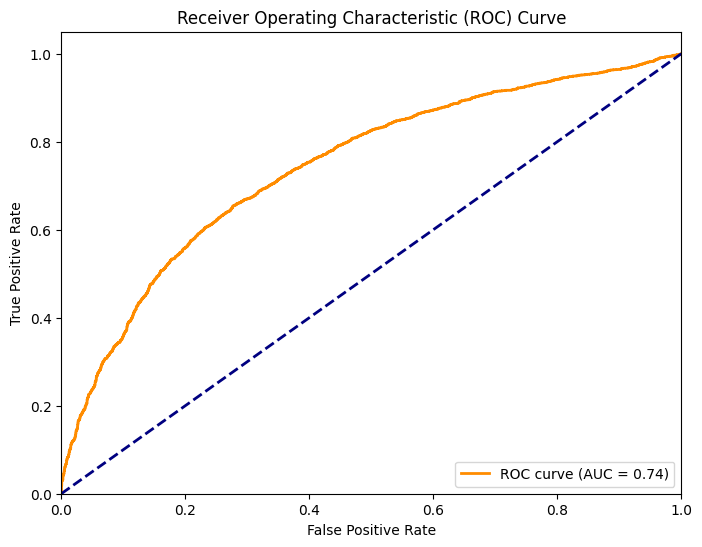

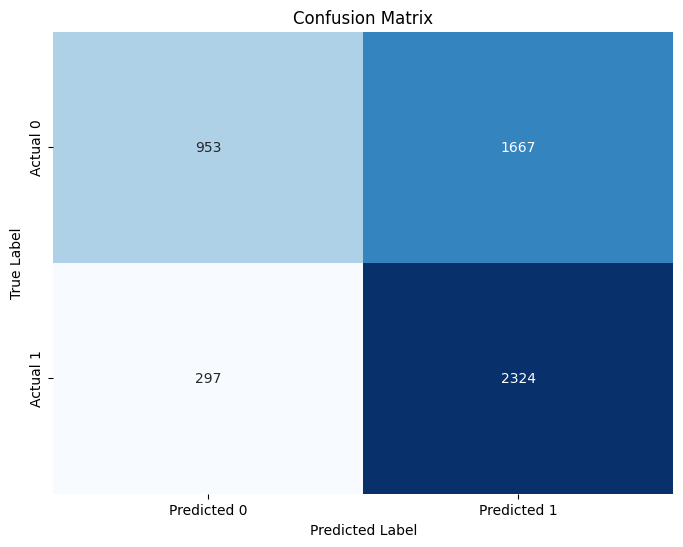

Model: DecisionTreeClassifier
Accuracy test: 0.8046 | Accuracy Training: 0.8145
F1-score test: 0.7894 | F1-score Training: 0.7999
roc_AUC-score test:0.8782 | roc_AUC-score Training:      0.8914
Differenza Accuracy: 0.0099
Differenza F1-score: 0.0105
Differenza AUC:      0.0132
Importanza delle Feature per Decision Tree:
'person_income': 0.3486
'loan_int_rate': 0.2915
'loan_amnt': 0.1348
'person_home_ownership_RENT': 0.1307
'credit_score': 0.0264
'person_home_ownership_OWN': 0.0159
'loan_intent_HOMEIMPROVEMENT': 0.0145
'loan_intent_MEDICAL': 0.0138
'loan_intent_VENTURE': 0.0068
'loan_intent_PERSONAL': 0.0063
'loan_intent_EDUCATION': 0.0059
'person_age': 0.0036
'cb_person_cred_hist_length': 7.8228e-04
'person_education_Doctorate': 2.9884e-04
AUC: 0.8782


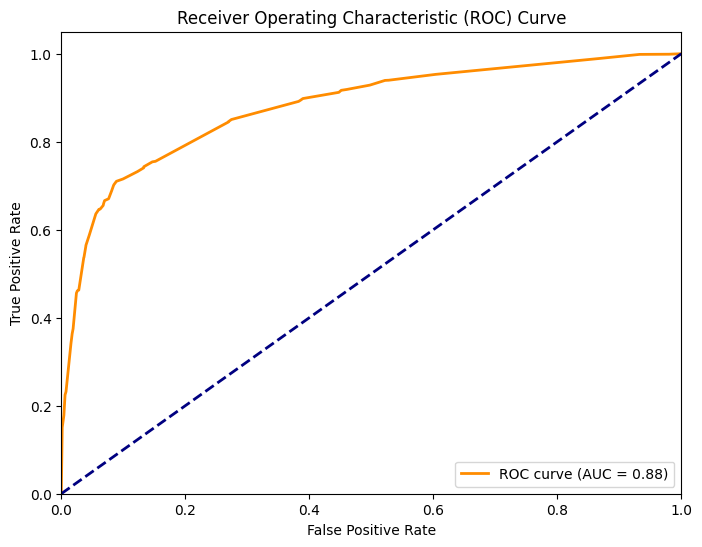

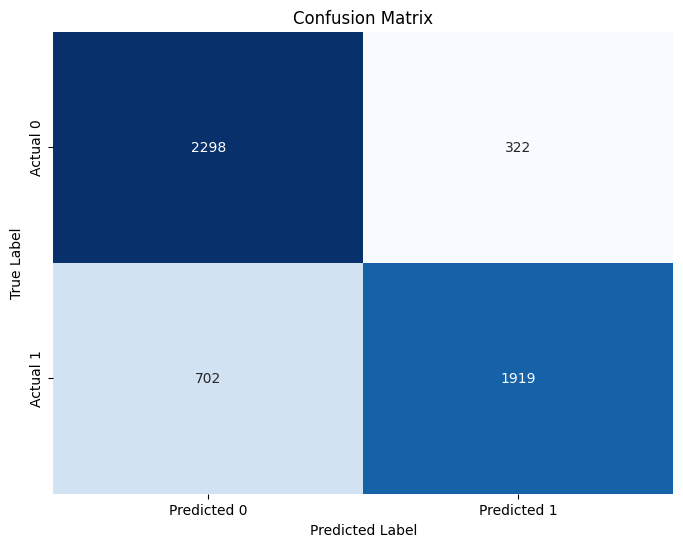

Model: MLPClassifier
Accuracy test: 0.8222 | Accuracy Training: 0.8425
F1-score test: 0.8152 | F1-score Training: 0.8362
roc_AUC-score test:0.8981 | roc_AUC-score Training:      0.9256
Differenza Accuracy: 0.0203
Differenza F1-score: 0.0210
Differenza AUC:      0.0275

Importanza delle Feature (stimata con Permutation Importance) per MLP:
person_income                   0.000038
person_age                      0.000000
person_emp_exp                  0.000000
loan_int_rate                   0.000000
person_home_ownership_OTHER     0.000000
cb_person_cred_hist_length      0.000000
credit_score                    0.000000
person_gender_male              0.000000
person_education_Bachelor       0.000000
person_education_Doctorate      0.000000
person_education_High School    0.000000
person_education_Master         0.000000
loan_intent_HOMEIMPROVEMENT     0.000000
person_home_ownership_OWN       0.000000
person_home_ownership_RENT      0.000000
loan_intent_EDUCATION           0.000000
loa

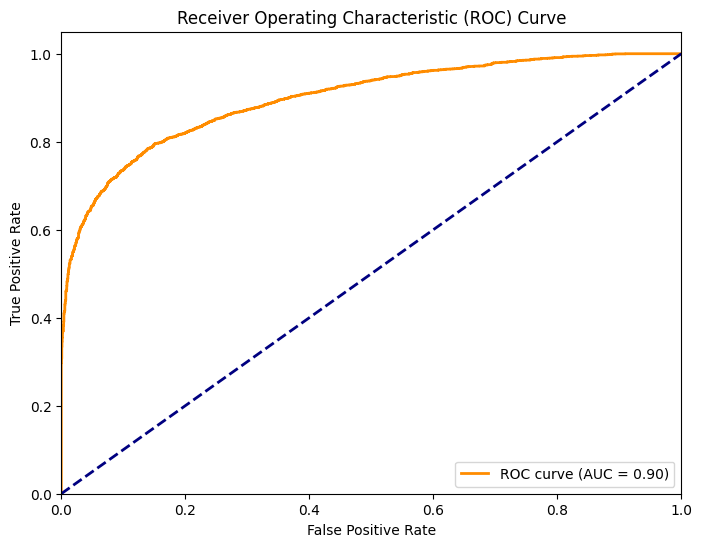

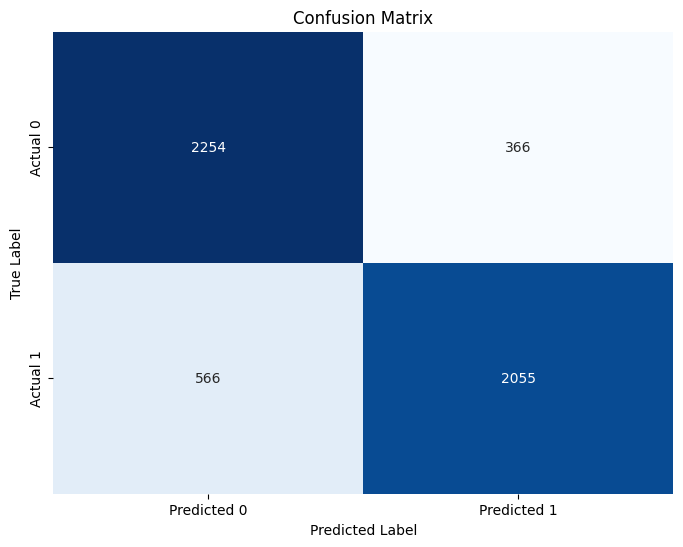

In [ ]:
main(data,inconsistenza=0.7) # caso con inconsistenza 70%


inconsistenze in:
person_emp_exp: 9783
cb_person_cred_hist_length: 9783

Model: GaussianNB
Accuracy test: 0.6230 | Accuracy Training: 0.6315
F1-score test: 0.7030 | F1-score Training: 0.6991
roc_AUC-score test:0.7433 | roc_AUC-score Training:      0.7398
Differenza Accuracy: 0.0086
Differenza F1-score: -0.0040
Differenza AUC:      -0.0034

Importanza delle Feature (stimata con Permutation Importance) per Gaussian Naive Bayes:
'loan_int_rate': 0.0535
'person_income': 0.0405
'credit_score': 0.0147
'loan_amnt': 0.0093
'person_home_ownership_RENT': 0.0026
'loan_intent_VENTURE': 4.1977e-04
'loan_intent_PERSONAL': 3.8161e-04
'loan_intent_EDUCATION': 2.6712e-04
'person_education_High School': 1.9080e-04
'person_education_Master': 7.6321e-05
'person_education_Bachelor': 3.8161e-05
'loan_intent_HOMEIMPROVEMENT': 3.8161e-05
'person_home_ownership_OWN': -1.5264e-04
'loan_intent_MEDICAL': -2.2896e-04
'cb_person_cred_hist_length': -3.4345e-04
'person_age': -0.0016
'person_emp_exp': -0.0035
AUC: 0.

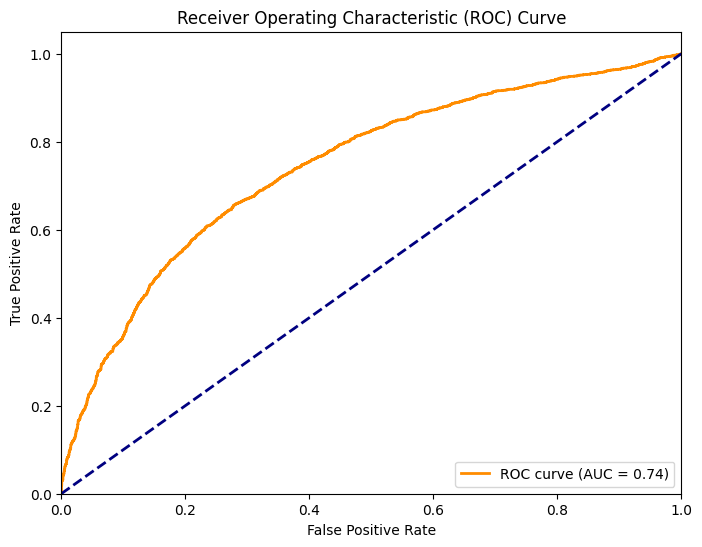

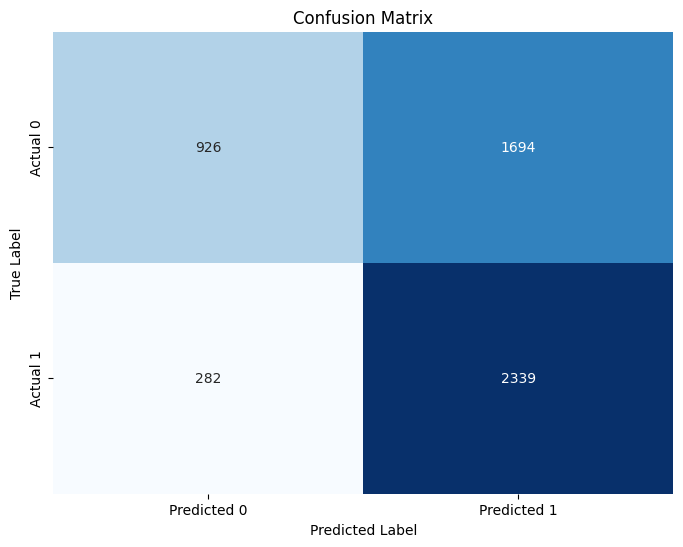

Model: DecisionTreeClassifier
Accuracy test: 0.8060 | Accuracy Training: 0.8147
F1-score test: 0.7911 | F1-score Training: 0.8002
roc_AUC-score test:0.8785 | roc_AUC-score Training:      0.8914
Differenza Accuracy: 0.0087
Differenza F1-score: 0.0091
Differenza AUC:      0.0130
Importanza delle Feature per Decision Tree:
'person_income': 0.3486
'loan_int_rate': 0.2915
'loan_amnt': 0.1348
'person_home_ownership_RENT': 0.1307
'credit_score': 0.0264
'person_home_ownership_OWN': 0.0159
'loan_intent_HOMEIMPROVEMENT': 0.0145
'loan_intent_MEDICAL': 0.0138
'loan_intent_VENTURE': 0.0068
'loan_intent_PERSONAL': 0.0063
'loan_intent_EDUCATION': 0.0059
'person_age': 0.0022
'person_emp_exp': 0.0014
'cb_person_cred_hist_length': 7.8226e-04
'person_education_Doctorate': 2.9883e-04
AUC: 0.8785


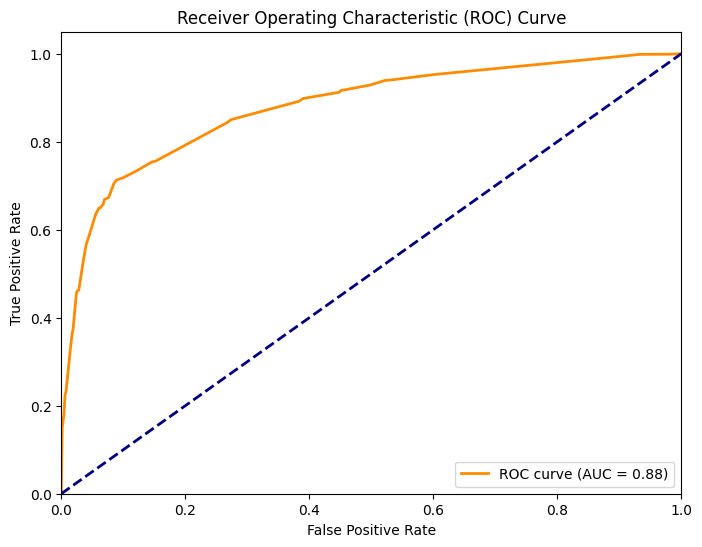

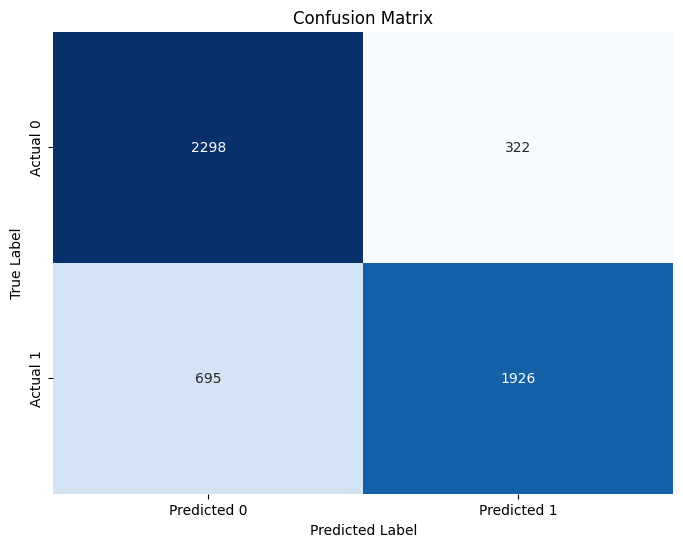

Model: MLPClassifier
Accuracy test: 0.8222 | Accuracy Training: 0.8392
F1-score test: 0.8161 | F1-score Training: 0.8334
roc_AUC-score test:0.8979 | roc_AUC-score Training:      0.9253
Differenza Accuracy: 0.0170
Differenza F1-score: 0.0173
Differenza AUC:      0.0274

Importanza delle Feature (stimata con Permutation Importance) per MLP:
person_age                      0.000000e+00
person_emp_exp                  0.000000e+00
cb_person_cred_hist_length      0.000000e+00
loan_int_rate                   0.000000e+00
person_home_ownership_OTHER     0.000000e+00
person_home_ownership_OWN       0.000000e+00
credit_score                    0.000000e+00
person_gender_male              0.000000e+00
person_education_Bachelor       0.000000e+00
person_education_Doctorate      0.000000e+00
person_education_High School    0.000000e+00
person_education_Master         0.000000e+00
loan_intent_HOMEIMPROVEMENT     0.000000e+00
loan_intent_MEDICAL             0.000000e+00
person_home_ownership_RENT   

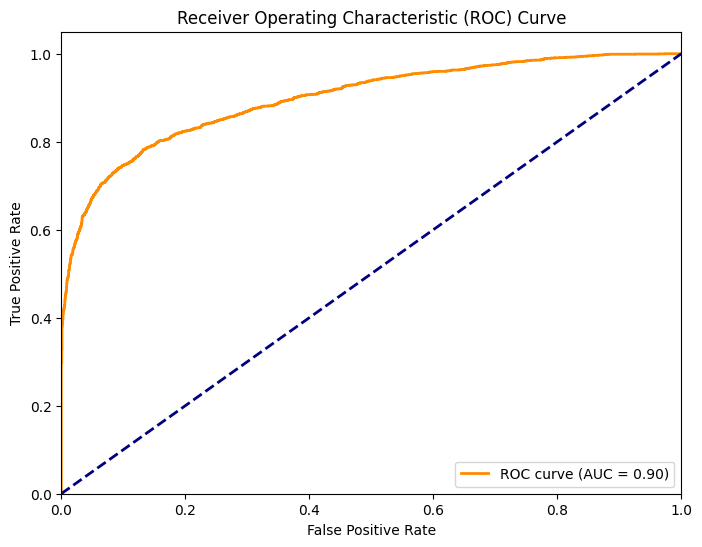

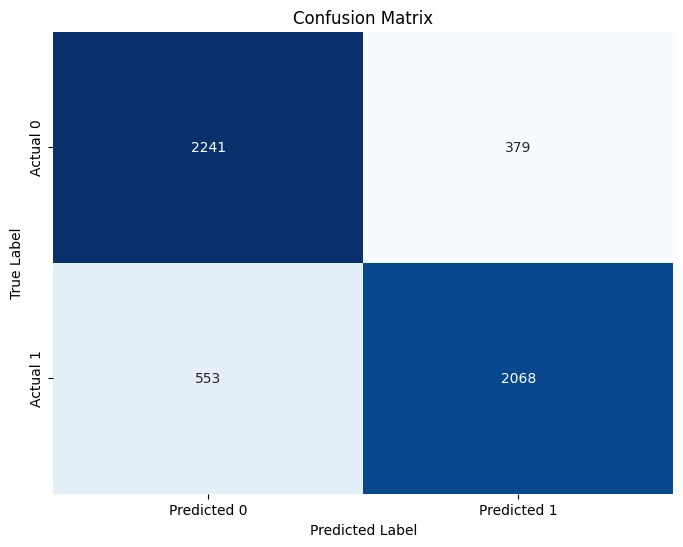

In [ ]:
main(data,inconsistenza=0.8) # caso con inconsistenza 80%


inconsistenze in:
person_emp_exp: 10989
cb_person_cred_hist_length: 11023

Model: GaussianNB
Accuracy test: 0.6228 | Accuracy Training: 0.6332
F1-score test: 0.7026 | F1-score Training: 0.7008
roc_AUC-score test:0.7437 | roc_AUC-score Training:      0.7405
Differenza Accuracy: 0.0104
Differenza F1-score: -0.0018
Differenza AUC:      -0.0033

Importanza delle Feature (stimata con Permutation Importance) per Gaussian Naive Bayes:
'loan_int_rate': 0.0529
'person_income': 0.0398
'credit_score': 0.0130
'loan_amnt': 0.0084
'person_home_ownership_RENT': 0.0022
'loan_intent_HOMEIMPROVEMENT': 2.2896e-04
'person_education_Master': 3.8161e-05
'person_education_Bachelor': 3.8161e-05
'person_education_High School': 3.8161e-05
'person_home_ownership_OWN': -7.6321e-05
'loan_intent_PERSONAL': -2.6712e-04
'loan_intent_VENTURE': -3.0529e-04
'loan_intent_MEDICAL': -4.1977e-04
'cb_person_cred_hist_length': -5.3425e-04
'loan_intent_EDUCATION': -5.3425e-04
'person_age': -0.0026
'person_emp_exp': -0.0040
AU

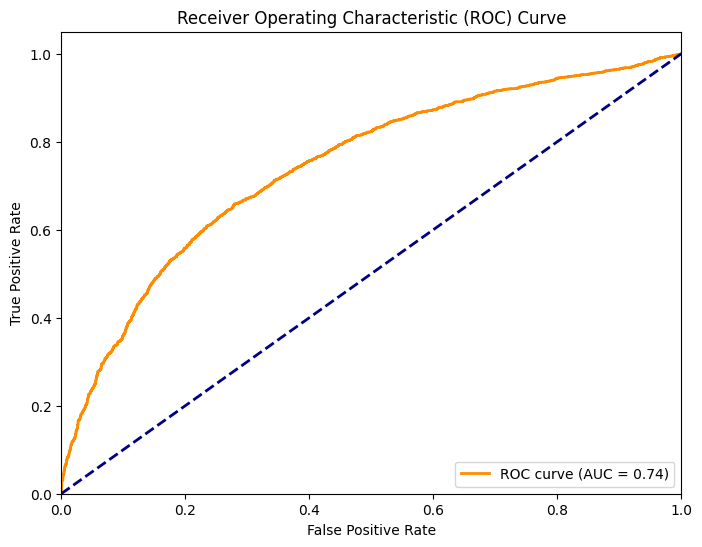

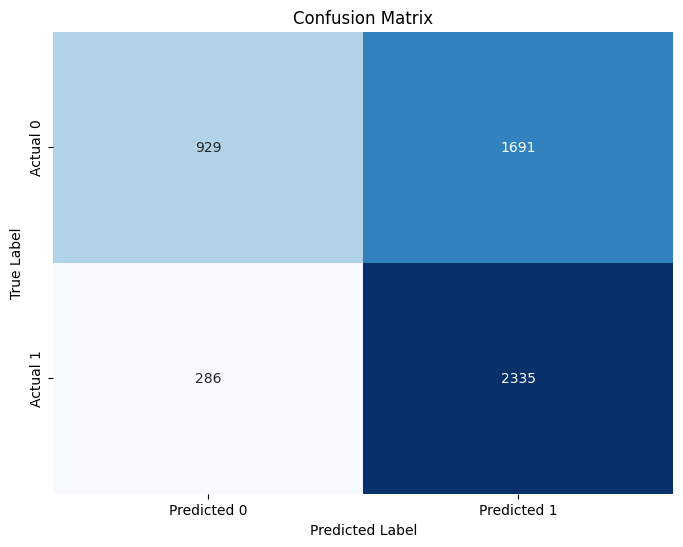

Model: DecisionTreeClassifier
Accuracy test: 0.8046 | Accuracy Training: 0.8145
F1-score test: 0.7894 | F1-score Training: 0.7999
roc_AUC-score test:0.8782 | roc_AUC-score Training:      0.8914
Differenza Accuracy: 0.0099
Differenza F1-score: 0.0105
Differenza AUC:      0.0132
Importanza delle Feature per Decision Tree:
'person_income': 0.3486
'loan_int_rate': 0.2915
'loan_amnt': 0.1348
'person_home_ownership_RENT': 0.1307
'credit_score': 0.0264
'person_home_ownership_OWN': 0.0159
'loan_intent_HOMEIMPROVEMENT': 0.0145
'loan_intent_MEDICAL': 0.0138
'loan_intent_VENTURE': 0.0068
'loan_intent_PERSONAL': 0.0063
'loan_intent_EDUCATION': 0.0059
'person_age': 0.0036
'cb_person_cred_hist_length': 7.8228e-04
'person_education_Doctorate': 2.9884e-04
AUC: 0.8782


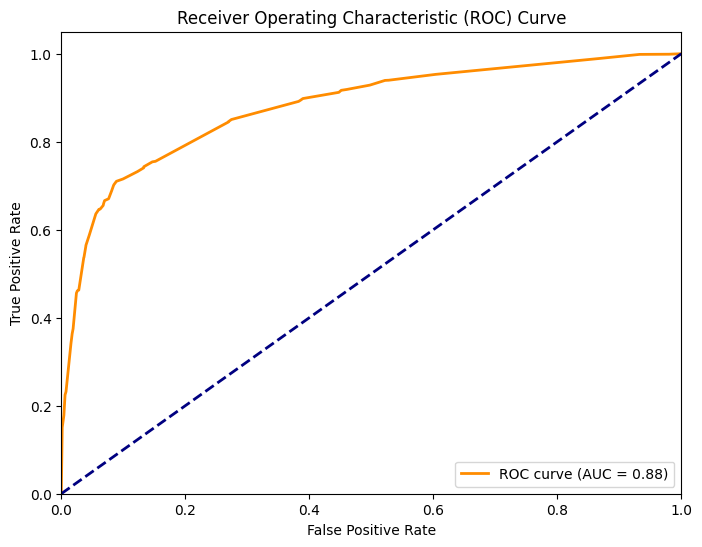

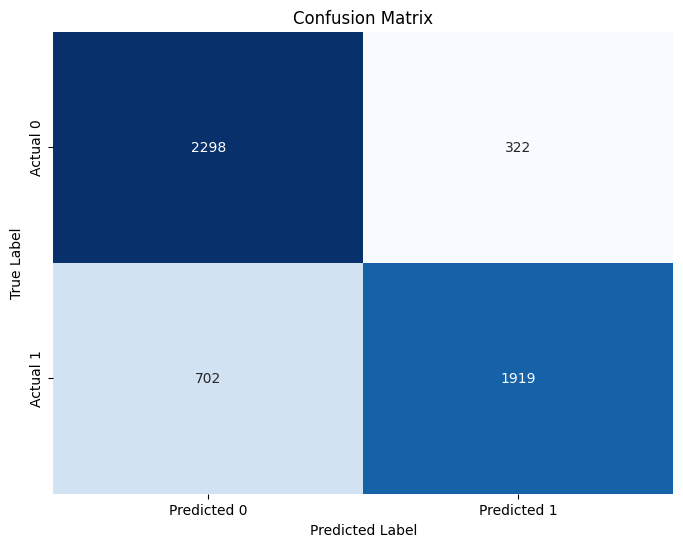

Model: MLPClassifier
Accuracy test: 0.8161 | Accuracy Training: 0.8450
F1-score test: 0.8074 | F1-score Training: 0.8370
roc_AUC-score test:0.8952 | roc_AUC-score Training:      0.9285
Differenza Accuracy: 0.0289
Differenza F1-score: 0.0296
Differenza AUC:      0.0333

Importanza delle Feature (stimata con Permutation Importance) per MLP:
person_income                   0.058119
loan_amnt                       0.030490
credit_score                    0.000954
loan_int_rate                   0.000267
person_emp_exp                  0.000000
person_age                      0.000000
cb_person_cred_hist_length      0.000000
person_gender_male              0.000000
person_education_Bachelor       0.000000
person_education_Doctorate      0.000000
person_education_High School    0.000000
person_education_Master         0.000000
person_home_ownership_OTHER     0.000000
person_home_ownership_OWN       0.000000
person_home_ownership_RENT      0.000000
loan_intent_EDUCATION           0.000000
loa

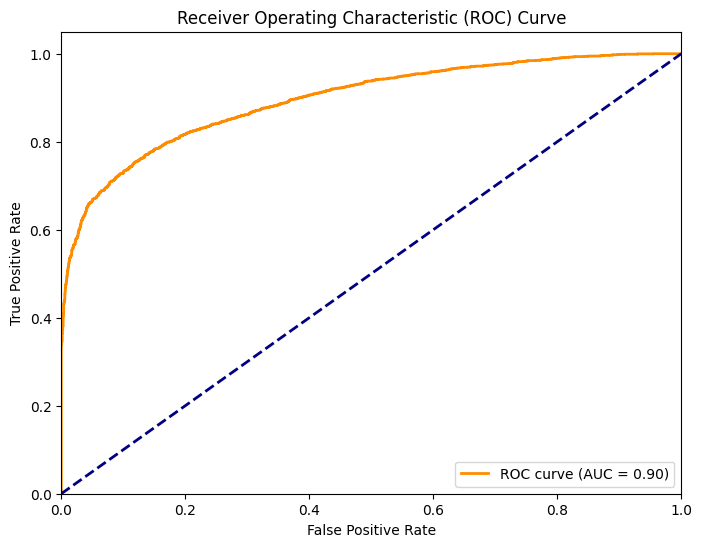

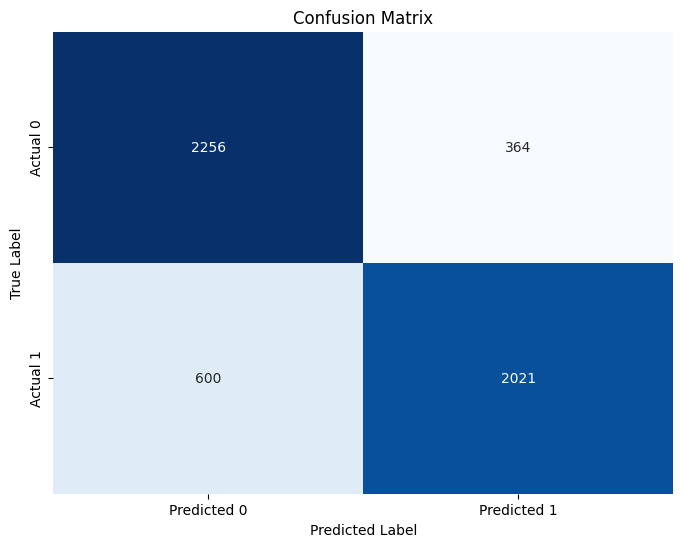

In [ ]:
main(data,inconsistenza=0.9) # caso con inconsistenza 90%

## ripetizioni dal 20% al 50% ,80% , 999%

Aggiunti 2445 duplicati. Dimensione dataset finale: 12229
Model: GaussianNB
Accuracy test: 0.6625 | Accuracy Training: 0.6727
F1-score test: 0.7041 | F1-score Training: 0.7142
roc_AUC-score test:0.7424 | roc_AUC-score Training:      0.7590
Differenza Accuracy: 0.0102
Differenza F1-score: 0.0100
Differenza AUC:      0.0165

Importanza delle Feature (stimata con Permutation Importance) per Gaussian Naive Bayes:
'loan_int_rate': 0.0705
'person_income': 0.0442
'credit_score': 0.0217
'loan_amnt': 0.0145
'person_home_ownership_RENT': 0.0018
'person_education_Bachelor': 1.1448e-04
'loan_intent_PERSONAL': 1.1448e-04
'person_education_High School': 7.6321e-05
'loan_intent_MEDICAL': 7.6321e-05
'person_home_ownership_OWN': 3.8161e-05
'person_education_Master': -1.1448e-04
'loan_intent_EDUCATION': -2.2896e-04
'cb_person_cred_hist_length': -0.0056
'person_emp_exp': -0.0080
'person_age': -0.0098
AUC: 0.7424


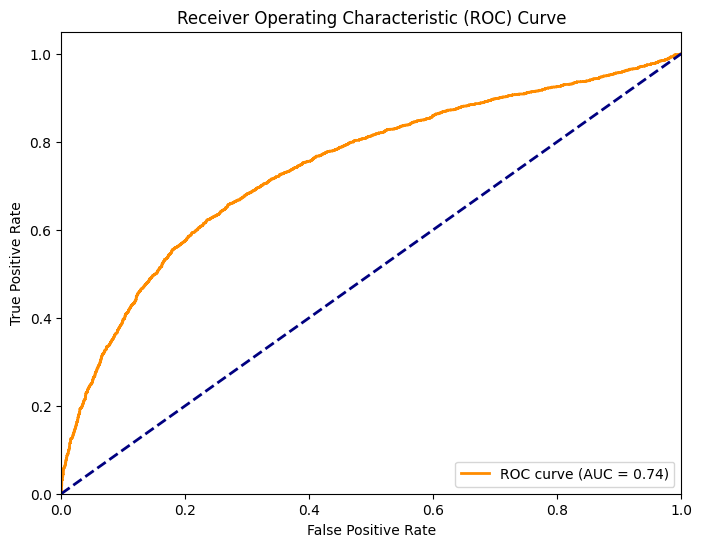

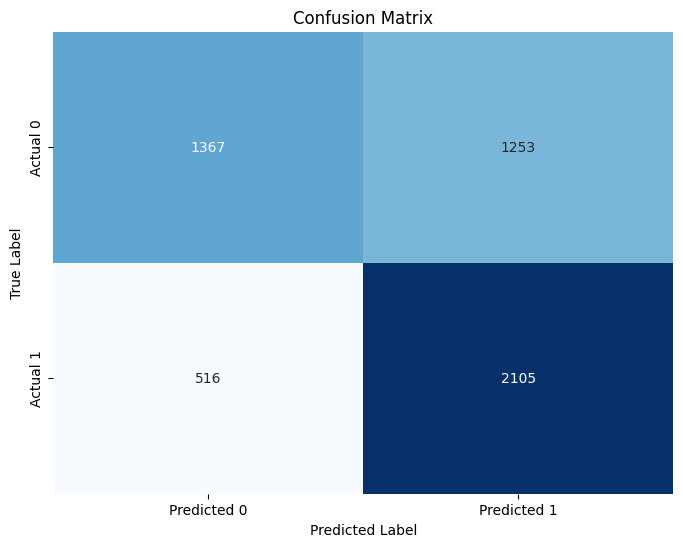

Model: DecisionTreeClassifier
Accuracy test: 0.8136 | Accuracy Training: 0.8279
F1-score test: 0.8057 | F1-score Training: 0.8198
roc_AUC-score test:0.8765 | roc_AUC-score Training:      0.8968
Differenza Accuracy: 0.0144
Differenza F1-score: 0.0141
Differenza AUC:      0.0203
Importanza delle Feature per Decision Tree:
'person_income': 0.2973
'loan_int_rate': 0.2921
'loan_amnt': 0.1830
'person_home_ownership_RENT': 0.1418
'credit_score': 0.0364
'loan_intent_MEDICAL': 0.0138
'loan_intent_HOMEIMPROVEMENT': 0.0127
'person_home_ownership_OWN': 0.0073
'loan_intent_VENTURE': 0.0057
'cb_person_cred_hist_length': 0.0041
'loan_intent_EDUCATION': 0.0029
'loan_intent_PERSONAL': 0.0022
'person_education_Doctorate': 3.2119e-04
'person_education_Bachelor': 2.3605e-04
'person_emp_exp': 2.2762e-05
AUC: 0.8765


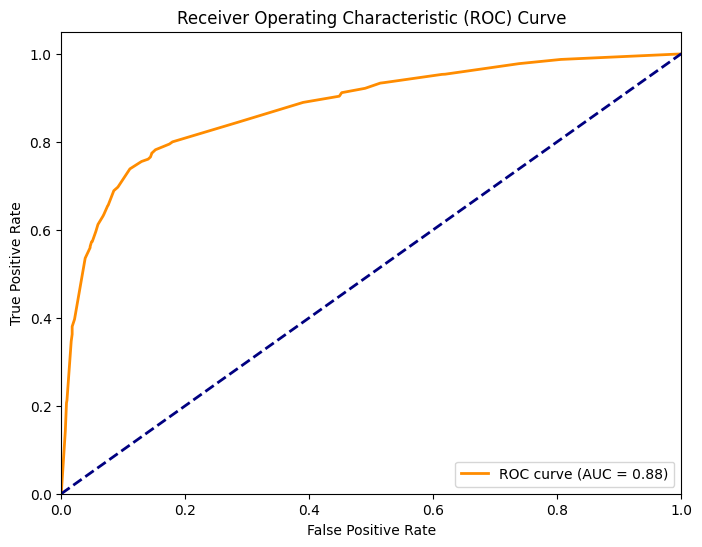

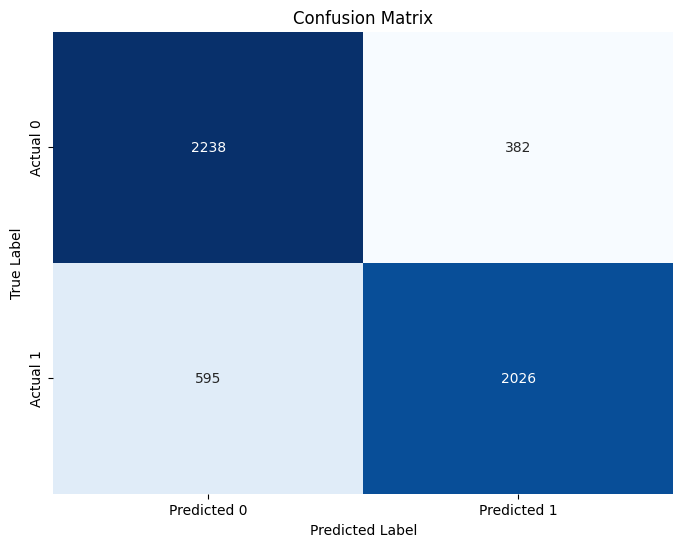

Model: MLPClassifier
Accuracy test: 0.8184 | Accuracy Training: 0.8577
F1-score test: 0.8122 | F1-score Training: 0.8537
roc_AUC-score test:0.8953 | roc_AUC-score Training:      0.9366
Differenza Accuracy: 0.0394
Differenza F1-score: 0.0414
Differenza AUC:      0.0413

Importanza delle Feature (stimata con Permutation Importance) per MLP:
person_age                      0.000000
person_emp_exp                  0.000000
cb_person_cred_hist_length      0.000000
loan_int_rate                   0.000000
person_home_ownership_OTHER     0.000000
person_home_ownership_OWN       0.000000
credit_score                    0.000000
person_gender_male              0.000000
person_education_Bachelor       0.000000
person_education_Doctorate      0.000000
person_education_High School    0.000000
person_education_Master         0.000000
loan_intent_HOMEIMPROVEMENT     0.000000
loan_intent_MEDICAL             0.000000
person_home_ownership_RENT      0.000000
loan_intent_EDUCATION           0.000000
loa

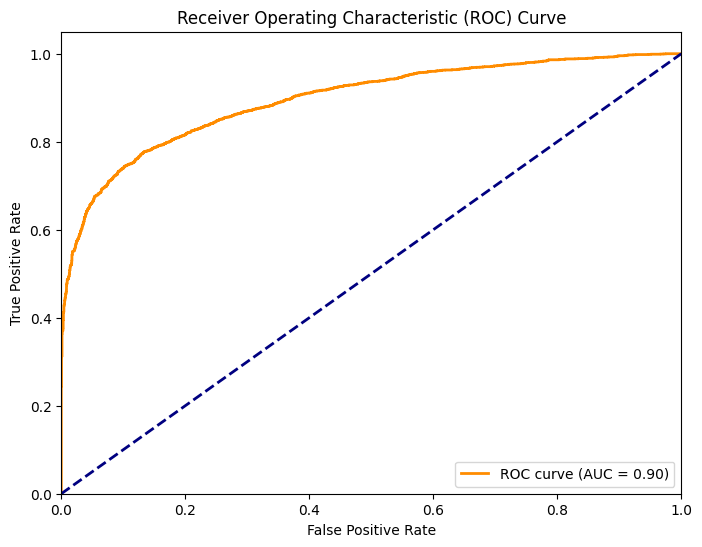

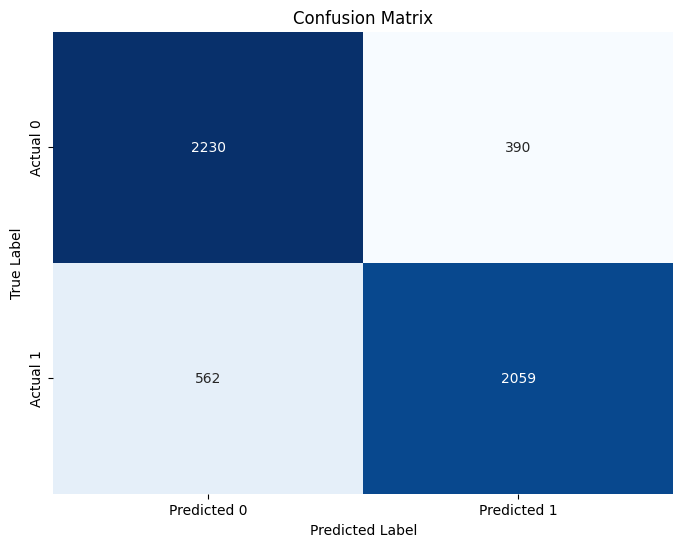

In [ ]:
main(data,ripetizioni=0.2) # caso con ripetizioni 20%

Aggiunti 3668 duplicati. Dimensione dataset finale: 12229
Model: GaussianNB
Accuracy test: 0.6567 | Accuracy Training: 0.6677
F1-score test: 0.6990 | F1-score Training: 0.7089
roc_AUC-score test:0.7354 | roc_AUC-score Training:      0.7503
Differenza Accuracy: 0.0109
Differenza F1-score: 0.0099
Differenza AUC:      0.0149

Importanza delle Feature (stimata con Permutation Importance) per Gaussian Naive Bayes:
'loan_int_rate': 0.0656
'person_income': 0.0414
'credit_score': 0.0208
'loan_amnt': 0.0114
'person_home_ownership_RENT': 0.0011
'person_education_Master': 4.1977e-04
'person_education_High School': 7.6321e-05
'person_education_Bachelor': -7.6321e-05
'loan_intent_EDUCATION': -1.9080e-04
'loan_intent_VENTURE': -2.2896e-04
'person_home_ownership_OWN': -2.2896e-04
'loan_intent_PERSONAL': -2.6712e-04
'loan_intent_MEDICAL': -3.0529e-04
'loan_intent_HOMEIMPROVEMENT': -5.3425e-04
'cb_person_cred_hist_length': -0.0044
'person_emp_exp': -0.0061
'person_age': -0.0076
AUC: 0.7354


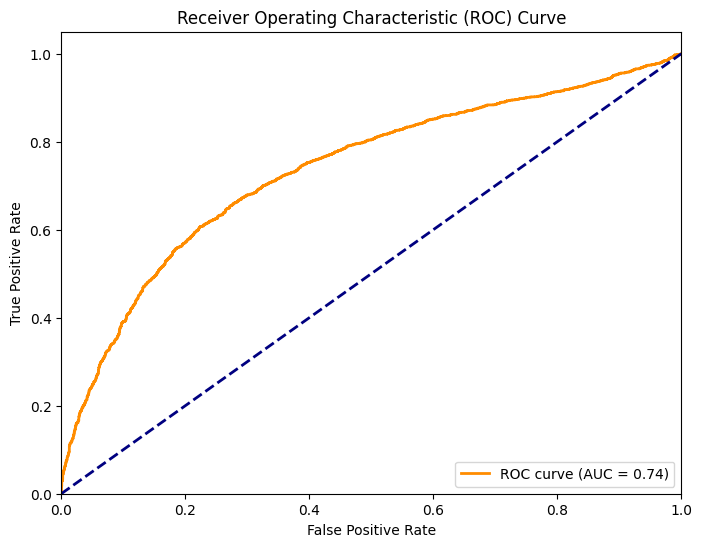

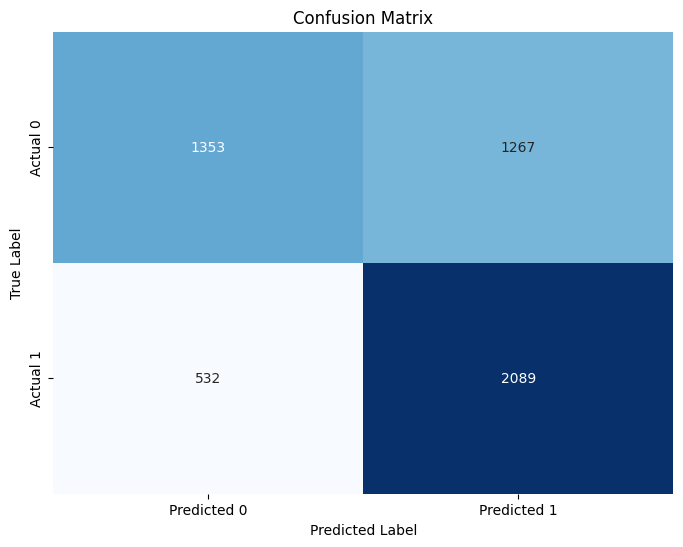

Model: DecisionTreeClassifier
Accuracy test: 0.8019 | Accuracy Training: 0.8180
F1-score test: 0.7847 | F1-score Training: 0.7994
roc_AUC-score test:0.8721 | roc_AUC-score Training:      0.8904
Differenza Accuracy: 0.0160
Differenza F1-score: 0.0147
Differenza AUC:      0.0183
Importanza delle Feature per Decision Tree:
'person_income': 0.3562
'loan_int_rate': 0.2799
'loan_amnt': 0.1563
'person_home_ownership_RENT': 0.1256
'credit_score': 0.0385
'loan_intent_MEDICAL': 0.0169
'loan_intent_HOMEIMPROVEMENT': 0.0121
'person_home_ownership_OWN': 0.0062
'loan_intent_VENTURE': 0.0049
'person_emp_exp': 0.0015
'person_age': 9.8284e-04
'cb_person_cred_hist_length': 8.0282e-04
AUC: 0.8721


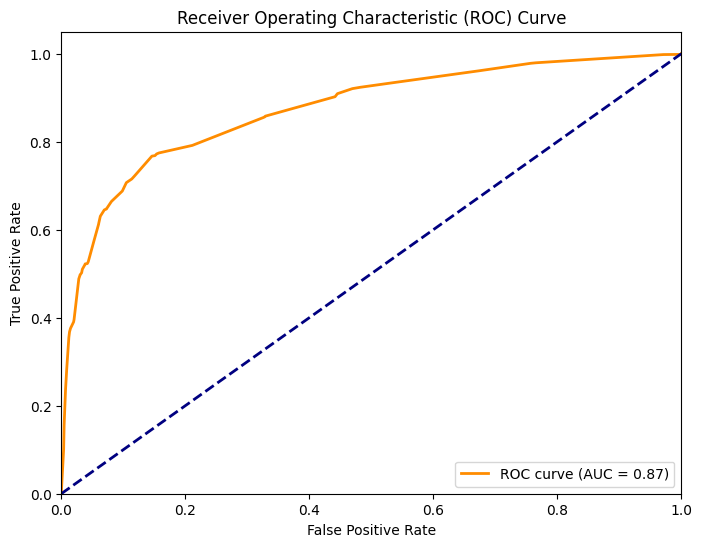

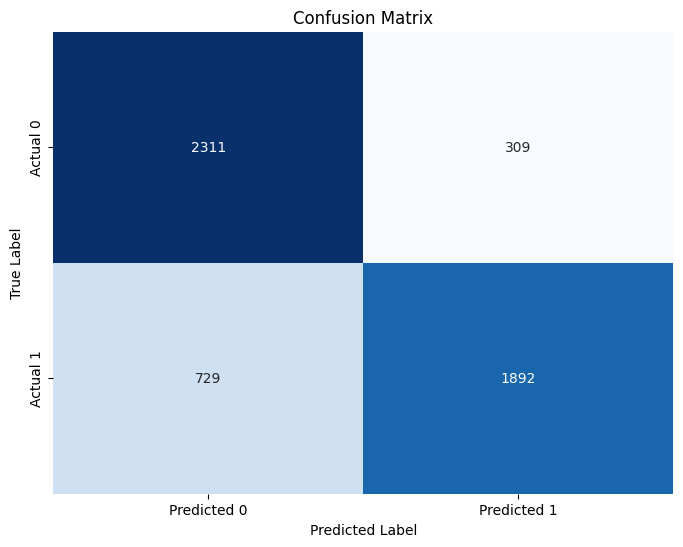

Model: MLPClassifier
Accuracy test: 0.8073 | Accuracy Training: 0.8490
F1-score test: 0.8047 | F1-score Training: 0.8477
roc_AUC-score test:0.8949 | roc_AUC-score Training:      0.9337
Differenza Accuracy: 0.0418
Differenza F1-score: 0.0430
Differenza AUC:      0.0388

Importanza delle Feature (stimata con Permutation Importance) per MLP:
person_age                      0.000000
person_emp_exp                  0.000000
cb_person_cred_hist_length      0.000000
loan_int_rate                   0.000000
person_home_ownership_OTHER     0.000000
person_home_ownership_OWN       0.000000
credit_score                    0.000000
person_gender_male              0.000000
person_education_Bachelor       0.000000
person_education_Doctorate      0.000000
person_education_High School    0.000000
person_education_Master         0.000000
loan_intent_HOMEIMPROVEMENT     0.000000
loan_intent_MEDICAL             0.000000
person_home_ownership_RENT      0.000000
loan_intent_EDUCATION           0.000000
loa

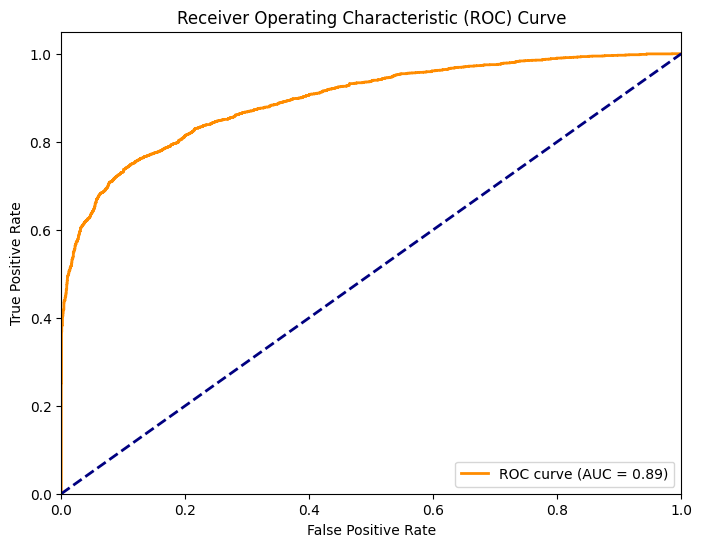

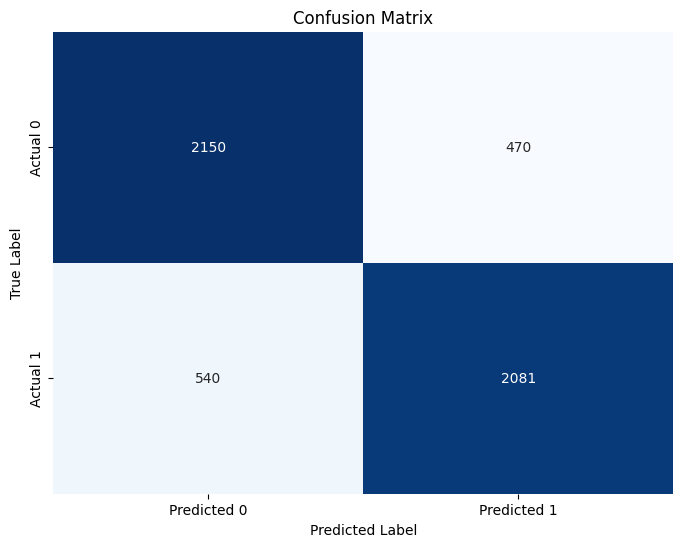

In [ ]:
main(data,ripetizioni=0.3) # caso con ripetizioni 30%

Aggiunti 4891 duplicati. Dimensione dataset finale: 12229
Model: GaussianNB
Accuracy test: 0.6764 | Accuracy Training: 0.6877
F1-score test: 0.7069 | F1-score Training: 0.7166
roc_AUC-score test:0.7455 | roc_AUC-score Training:      0.7601
Differenza Accuracy: 0.0113
Differenza F1-score: 0.0097
Differenza AUC:      0.0146

Importanza delle Feature (stimata con Permutation Importance) per Gaussian Naive Bayes:
'loan_int_rate': 0.0768
'person_income': 0.0455
'credit_score': 0.0269
'loan_amnt': 0.0211
'person_home_ownership_RENT': 0.0044
'loan_intent_EDUCATION': 5.3425e-04
'loan_intent_HOMEIMPROVEMENT': 4.9609e-04
'loan_intent_VENTURE': 3.0529e-04
'loan_intent_PERSONAL': 2.6712e-04
'person_education_High School': 2.6712e-04
'person_education_Bachelor': 1.1448e-04
'person_home_ownership_OWN': 7.6321e-05
'person_gender_male': 7.6321e-05
'person_education_Master': 3.8161e-05
'loan_intent_MEDICAL': -3.4345e-04
'cb_person_cred_hist_length': -0.0023
'person_age': -0.0044
'person_emp_exp': -0.00

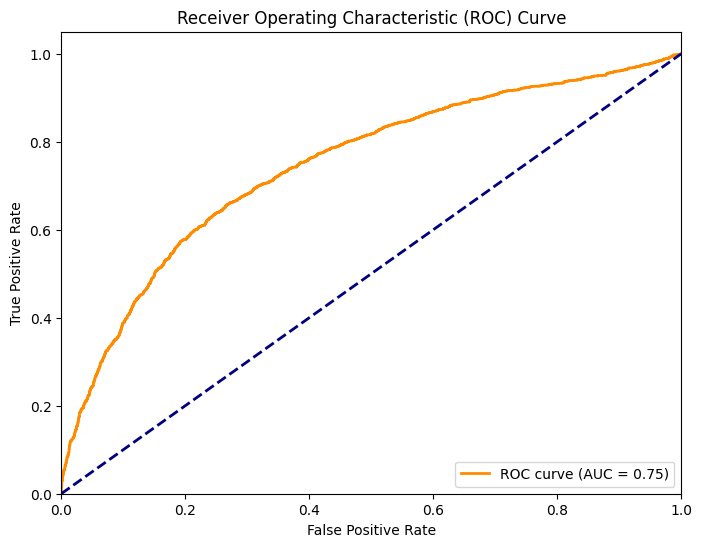

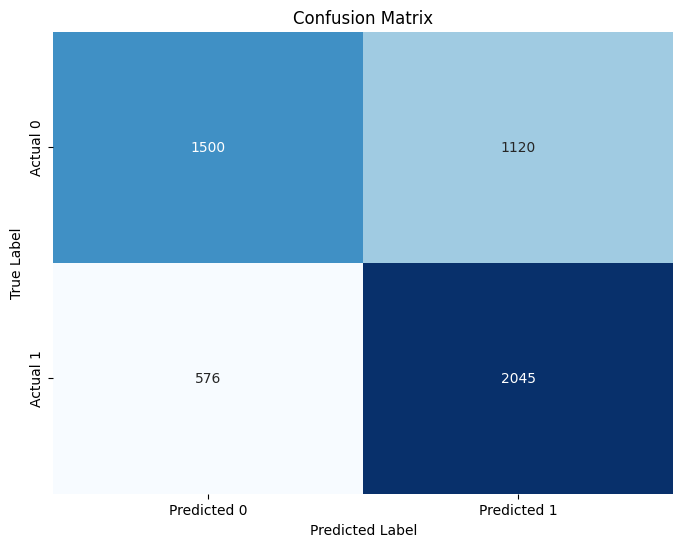

Model: DecisionTreeClassifier
Accuracy test: 0.8193 | Accuracy Training: 0.8283
F1-score test: 0.8124 | F1-score Training: 0.8214
roc_AUC-score test:0.8815 | roc_AUC-score Training:      0.9019
Differenza Accuracy: 0.0090
Differenza F1-score: 0.0091
Differenza AUC:      0.0204
Importanza delle Feature per Decision Tree:
'person_income': 0.3784
'loan_int_rate': 0.2746
'loan_amnt': 0.1241
'person_home_ownership_RENT': 0.1210
'credit_score': 0.0394
'person_home_ownership_OWN': 0.0214
'loan_intent_HOMEIMPROVEMENT': 0.0134
'loan_intent_VENTURE': 0.0087
'loan_intent_MEDICAL': 0.0065
'loan_intent_EDUCATION': 0.0050
'loan_intent_PERSONAL': 0.0037
'cb_person_cred_hist_length': 0.0037
'person_emp_exp': 3.3016e-05
AUC: 0.8815


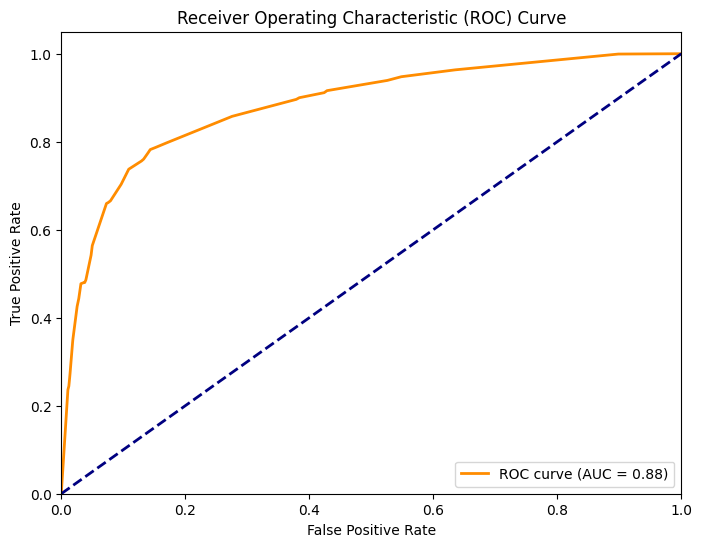

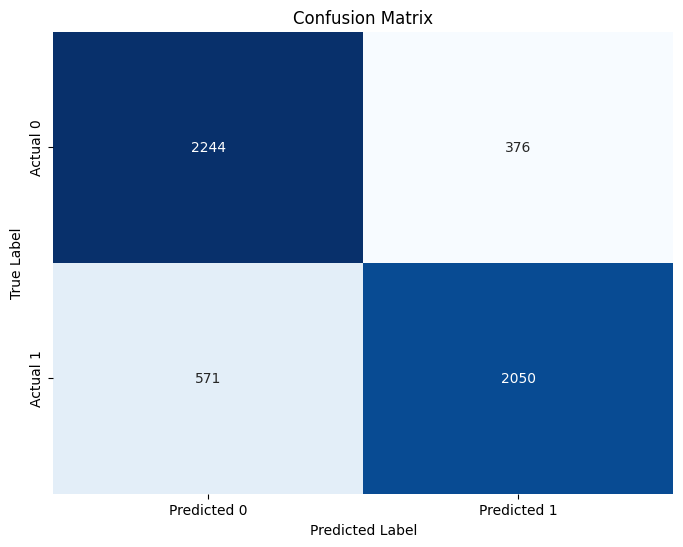

Model: MLPClassifier
Accuracy test: 0.8100 | Accuracy Training: 0.8640
F1-score test: 0.8031 | F1-score Training: 0.8579
roc_AUC-score test:0.8919 | roc_AUC-score Training:      0.9426
Differenza Accuracy: 0.0541
Differenza F1-score: 0.0548
Differenza AUC:      0.0506

Importanza delle Feature (stimata con Permutation Importance) per MLP:
person_age                      0.000000
person_emp_exp                  0.000000
cb_person_cred_hist_length      0.000000
loan_int_rate                   0.000000
person_home_ownership_OTHER     0.000000
person_home_ownership_OWN       0.000000
credit_score                    0.000000
person_gender_male              0.000000
person_education_Bachelor       0.000000
person_education_Doctorate      0.000000
person_education_High School    0.000000
person_education_Master         0.000000
loan_intent_HOMEIMPROVEMENT     0.000000
loan_intent_MEDICAL             0.000000
person_home_ownership_RENT      0.000000
loan_intent_EDUCATION           0.000000
loa

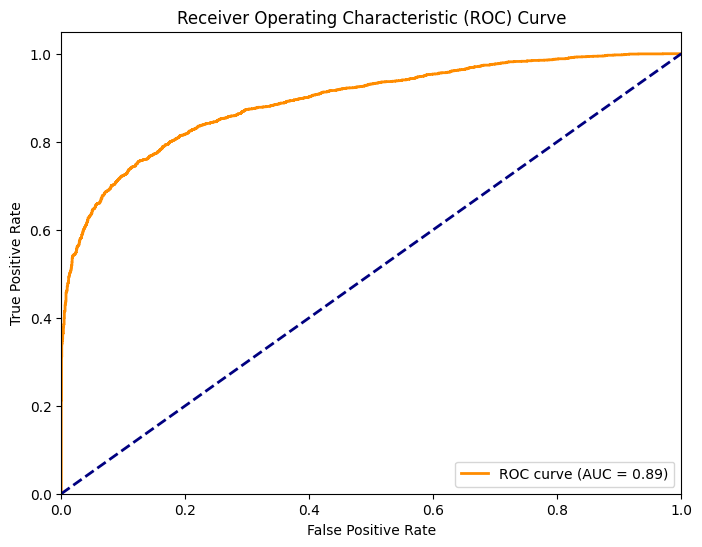

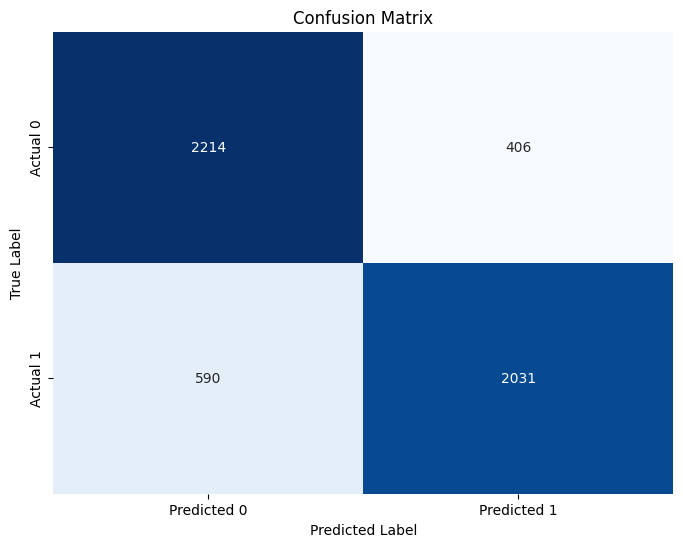

In [ ]:
main(data,ripetizioni=0.4) # caso con ripetizioni 40%

Aggiunti 6114 duplicati. Dimensione dataset finale: 12229
Model: GaussianNB
Accuracy test: 0.5678 | Accuracy Training: 0.5804
F1-score test: 0.6741 | F1-score Training: 0.6846
roc_AUC-score test:0.7146 | roc_AUC-score Training:      0.7333
Differenza Accuracy: 0.0126
Differenza F1-score: 0.0106
Differenza AUC:      0.0186

Importanza delle Feature (stimata con Permutation Importance) per Gaussian Naive Bayes:
'person_income': 0.0373
'loan_int_rate': 0.0130
'credit_score': 0.0035
'person_home_ownership_RENT': 4.1977e-04
'loan_intent_EDUCATION': 1.5264e-04
'loan_intent_MEDICAL': 7.6321e-05
'person_education_High School': 3.8161e-05
'person_home_ownership_OWN': 3.8161e-05
'loan_intent_VENTURE': -3.0529e-04
'loan_amnt': -4.5793e-04
'cb_person_cred_hist_length': -0.0020
'person_emp_exp': -0.0092
'person_age': -0.0093
AUC: 0.7146


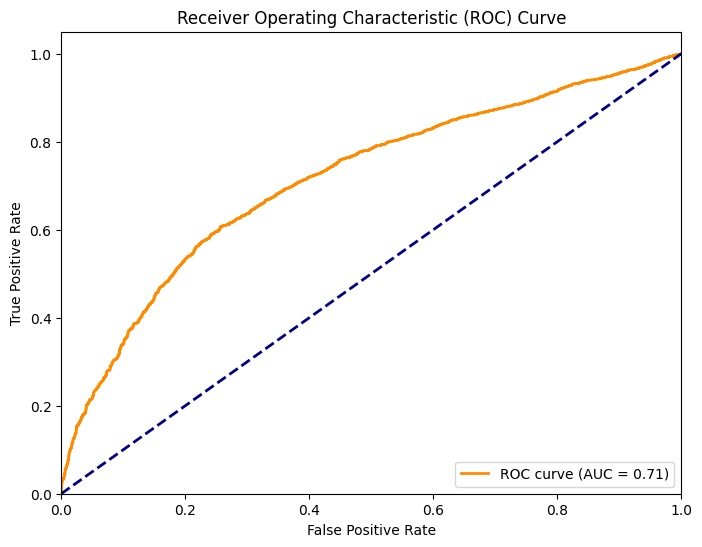

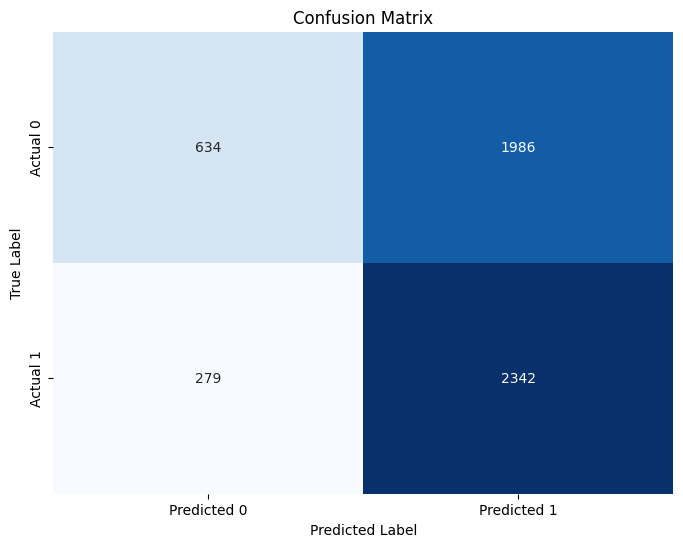

Model: DecisionTreeClassifier
Accuracy test: 0.8149 | Accuracy Training: 0.8352
F1-score test: 0.7985 | F1-score Training: 0.8184
roc_AUC-score test:0.8654 | roc_AUC-score Training:      0.9059
Differenza Accuracy: 0.0203
Differenza F1-score: 0.0199
Differenza AUC:      0.0405
Importanza delle Feature per Decision Tree:
'person_income': 0.3921
'loan_int_rate': 0.2937
'loan_amnt': 0.1141
'person_home_ownership_RENT': 0.1019
'credit_score': 0.0298
'loan_intent_HOMEIMPROVEMENT': 0.0121
'loan_intent_VENTURE': 0.0121
'loan_intent_MEDICAL': 0.0119
'person_home_ownership_OWN': 0.0094
'loan_intent_EDUCATION': 0.0089
'loan_intent_PERSONAL': 0.0074
'person_emp_exp': 0.0045
'person_age': 0.0022
AUC: 0.8654


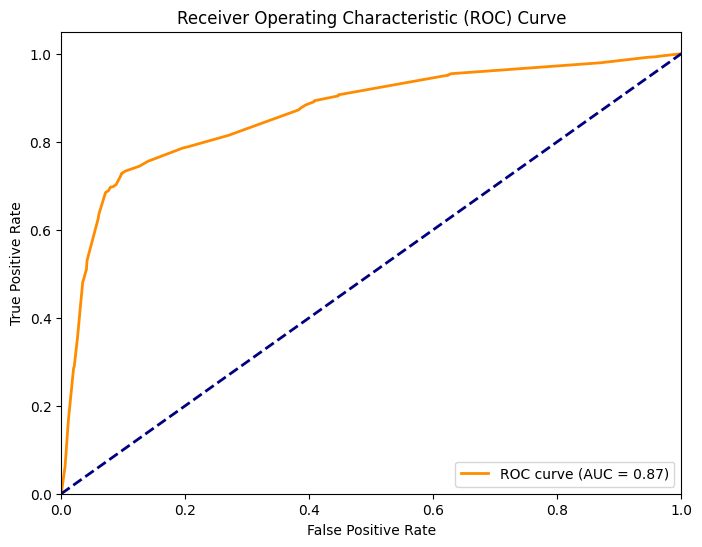

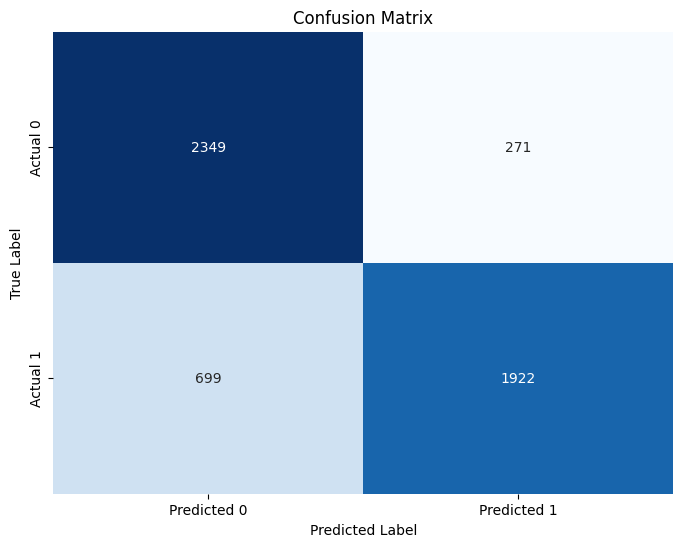

Model: MLPClassifier
Accuracy test: 0.7966 | Accuracy Training: 0.8825
F1-score test: 0.7887 | F1-score Training: 0.8769
roc_AUC-score test:0.8771 | roc_AUC-score Training:      0.9540
Differenza Accuracy: 0.0859
Differenza F1-score: 0.0882
Differenza AUC:      0.0768

Importanza delle Feature (stimata con Permutation Importance) per MLP:
person_age                      0.0
person_income                   0.0
person_emp_exp                  0.0
loan_amnt                       0.0
loan_int_rate                   0.0
cb_person_cred_hist_length      0.0
credit_score                    0.0
person_gender_male              0.0
person_education_Bachelor       0.0
person_education_Doctorate      0.0
person_education_High School    0.0
person_education_Master         0.0
person_home_ownership_OTHER     0.0
person_home_ownership_OWN       0.0
person_home_ownership_RENT      0.0
loan_intent_EDUCATION           0.0
loan_intent_HOMEIMPROVEMENT     0.0
loan_intent_MEDICAL             0.0
loan_intent

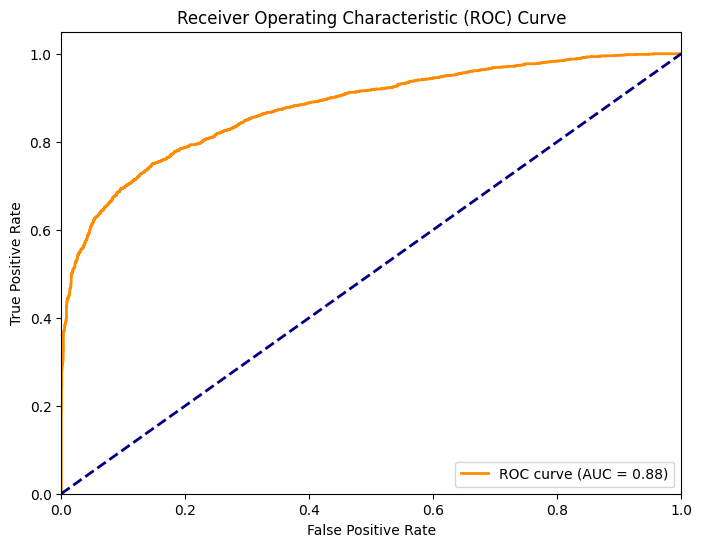

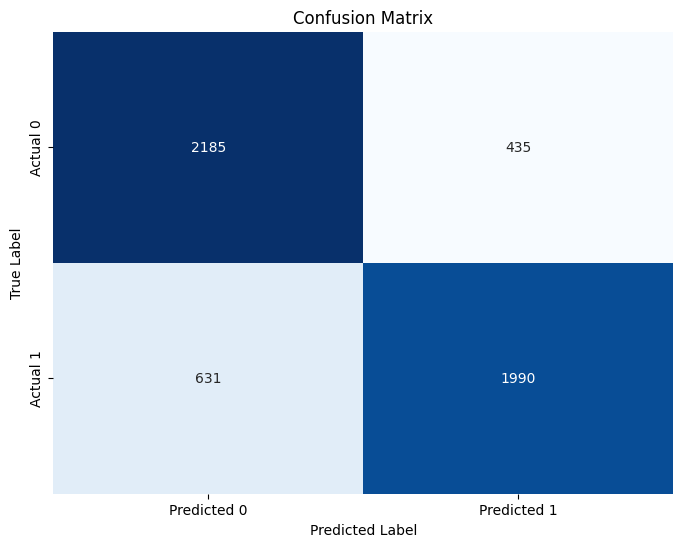

In [ ]:
main(data,ripetizioni=0.5) # caso con ripetizioni 50%

Aggiunti 9783 duplicati. Dimensione dataset finale: 12229
Model: GaussianNB
Accuracy test: 0.7205 | Accuracy Training: 0.7086
F1-score test: 0.7364 | F1-score Training: 0.7245
roc_AUC-score test:0.7942 | roc_AUC-score Training:      0.7888
Differenza Accuracy: -0.0118
Differenza F1-score: -0.0119
Differenza AUC:      -0.0054

Importanza delle Feature (stimata con Permutation Importance) per Gaussian Naive Bayes:
'loan_int_rate': 0.0871
'person_income': 0.0801
'loan_amnt': 0.0222
'credit_score': 0.0190
'person_home_ownership_RENT': 0.0050
'loan_intent_MEDICAL': 0.0011
'loan_intent_VENTURE': 1.9080e-04
'person_education_High School': 7.6321e-05
'loan_intent_PERSONAL': 3.8161e-05
'person_education_Bachelor': -3.8161e-05
'person_gender_male': -3.8161e-05
'person_home_ownership_OWN': -7.6321e-05
'loan_intent_HOMEIMPROVEMENT': -1.1448e-04
'loan_intent_EDUCATION': -1.9080e-04
'person_education_Master': -3.4345e-04
'cb_person_cred_hist_length': -0.0019
'person_emp_exp': -0.0029
'person_age': -

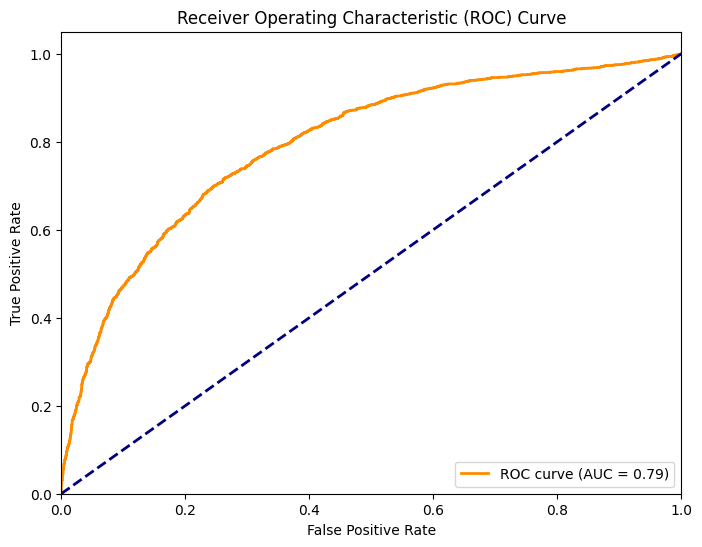

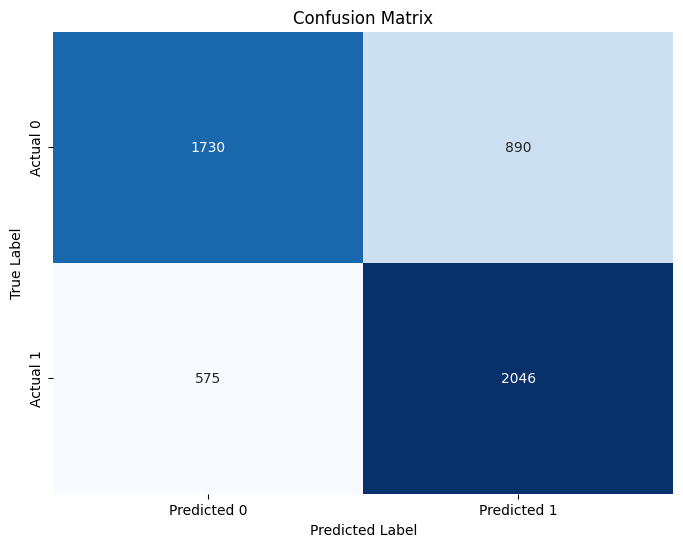

Model: DecisionTreeClassifier
Accuracy test: 0.8142 | Accuracy Training: 0.8294
F1-score test: 0.7986 | F1-score Training: 0.8120
roc_AUC-score test:0.8621 | roc_AUC-score Training:      0.9043
Differenza Accuracy: 0.0153
Differenza F1-score: 0.0134
Differenza AUC:      0.0423
Importanza delle Feature per Decision Tree:
'person_income': 0.3970
'loan_int_rate': 0.2439
'loan_amnt': 0.1480
'person_home_ownership_RENT': 0.0961
'credit_score': 0.0302
'loan_intent_HOMEIMPROVEMENT': 0.0181
'loan_intent_VENTURE': 0.0135
'loan_intent_MEDICAL': 0.0108
'person_home_ownership_OWN': 0.0089
'loan_intent_PERSONAL': 0.0076
'person_age': 0.0072
'person_emp_exp': 0.0061
'loan_intent_EDUCATION': 0.0044
'person_home_ownership_OTHER': 0.0037
'cb_person_cred_hist_length': 0.0035
'person_gender_male': 8.4277e-04
AUC: 0.8621


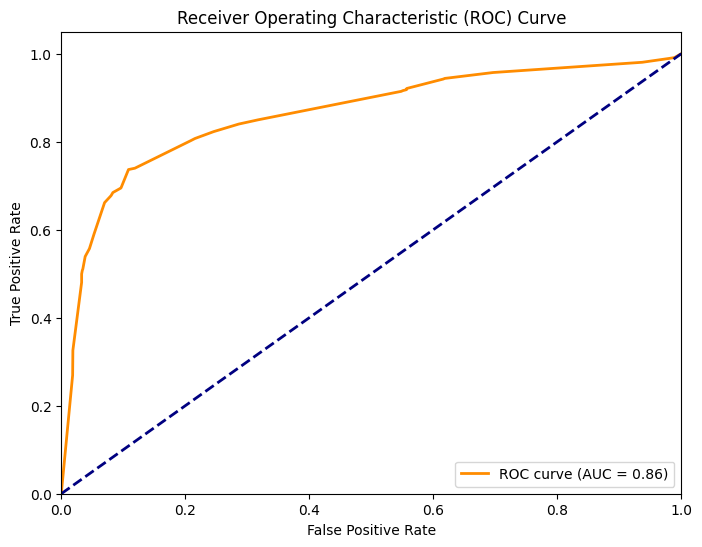

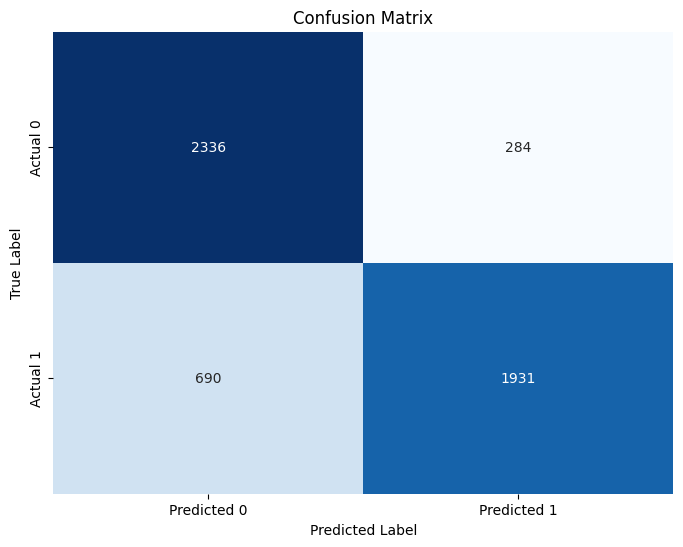

Model: MLPClassifier
Accuracy test: 0.7642 | Accuracy Training: 0.9135
F1-score test: 0.7600 | F1-score Training: 0.9095
roc_AUC-score test:0.8401 | roc_AUC-score Training:      0.9750
Differenza Accuracy: 0.1493
Differenza F1-score: 0.1495
Differenza AUC:      0.1349

Importanza delle Feature (stimata con Permutation Importance) per MLP:
person_age                      0.000000
person_emp_exp                  0.000000
cb_person_cred_hist_length      0.000000
loan_int_rate                   0.000000
person_home_ownership_OTHER     0.000000
person_home_ownership_OWN       0.000000
credit_score                    0.000000
person_gender_male              0.000000
person_education_Bachelor       0.000000
person_education_Doctorate      0.000000
person_education_High School    0.000000
person_education_Master         0.000000
loan_intent_HOMEIMPROVEMENT     0.000000
loan_intent_MEDICAL             0.000000
person_home_ownership_RENT      0.000000
loan_intent_EDUCATION           0.000000
loa

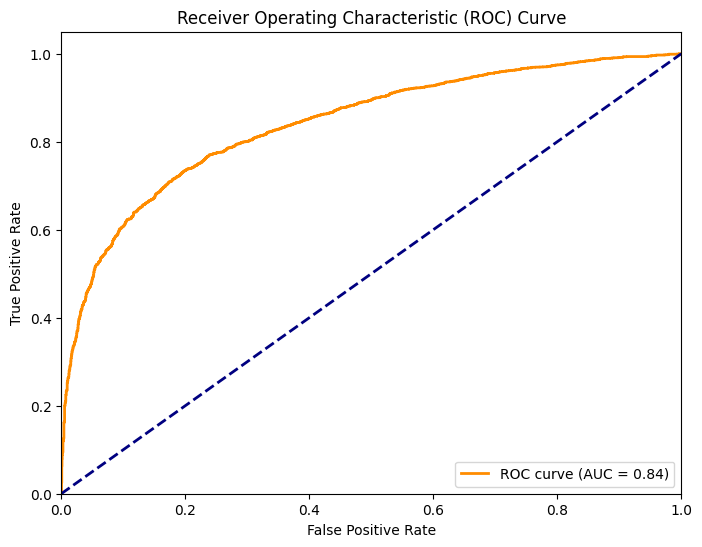

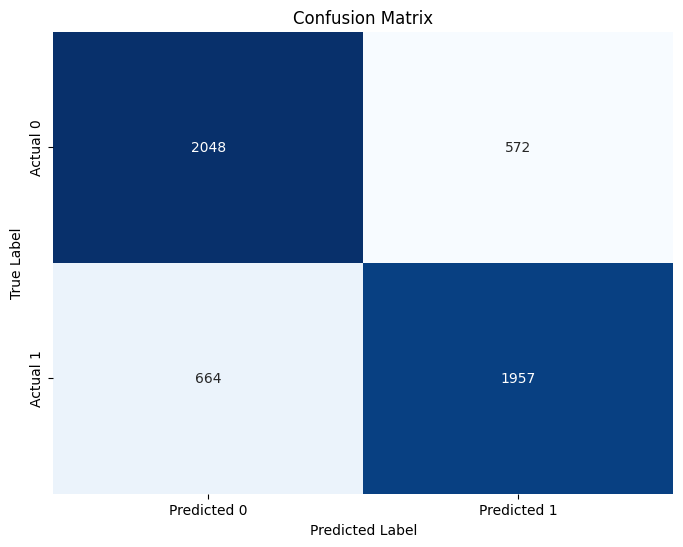

In [ ]:
main(data,ripetizioni=0.8) # caso con ripetizioni 80%

Aggiunti 12216 duplicati. Dimensione dataset finale: 12229


/usr/local/lib/python3.12/dist-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [2, 3] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


Model: GaussianNB
Accuracy test: 0.6436 | Accuracy Training: 0.9244
F1-score test: 0.6397 | F1-score Training: 0.9234
roc_AUC-score test:0.6907 | roc_AUC-score Training:      0.9775
Differenza Accuracy: 0.2808
Differenza F1-score: 0.2837
Differenza AUC:      0.2868

Importanza delle Feature (stimata con Permutation Importance) per Gaussian Naive Bayes:
'person_income': 0.0493
'loan_amnt': 0.0430
'loan_int_rate': 0.0297
'person_home_ownership_RENT': 0.0297
'loan_intent_VENTURE': 0.0042
'person_home_ownership_OWN': 0.0022
'credit_score': 0.0020
'loan_intent_MEDICAL': 0.0017
'loan_intent_EDUCATION': -2.6712e-04
'person_education_High School': -5.7241e-04
'person_education_Doctorate': -7.6321e-04
'person_education_Bachelor': -8.3953e-04
'person_education_Master': -0.0017
'person_gender_male': -0.0023
'person_emp_exp': -0.0034
'cb_person_cred_hist_length': -0.0036
'person_age': -0.0039
'loan_intent_PERSONAL': -0.0043
AUC: 0.6907


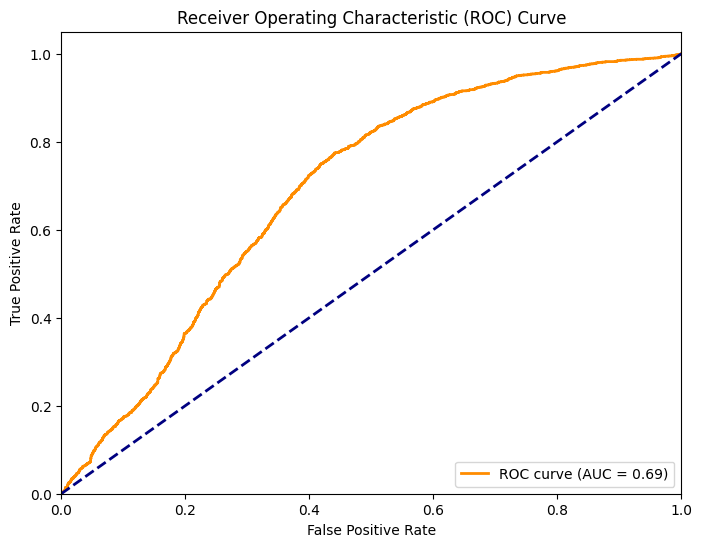

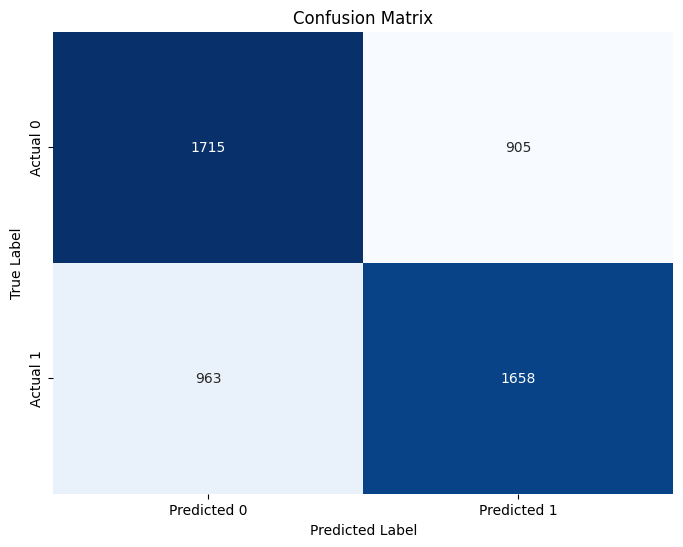

Model: DecisionTreeClassifier
Accuracy test: 0.6188 | Accuracy Training: 1.0000
F1-score test: 0.6512 | F1-score Training: 1.0000
roc_AUC-score test:0.6188 | roc_AUC-score Training:      1.0000
Differenza Accuracy: 0.3812
Differenza F1-score: 0.3488
Differenza AUC:      0.3812
Importanza delle Feature per Decision Tree:
'person_home_ownership_RENT': 0.5024
'loan_intent_VENTURE': 0.2560
'cb_person_cred_hist_length': 0.2416
AUC: 0.6188


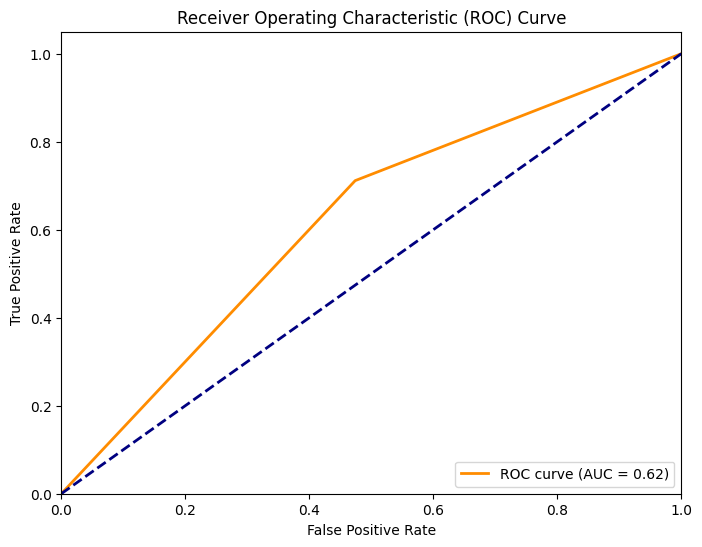

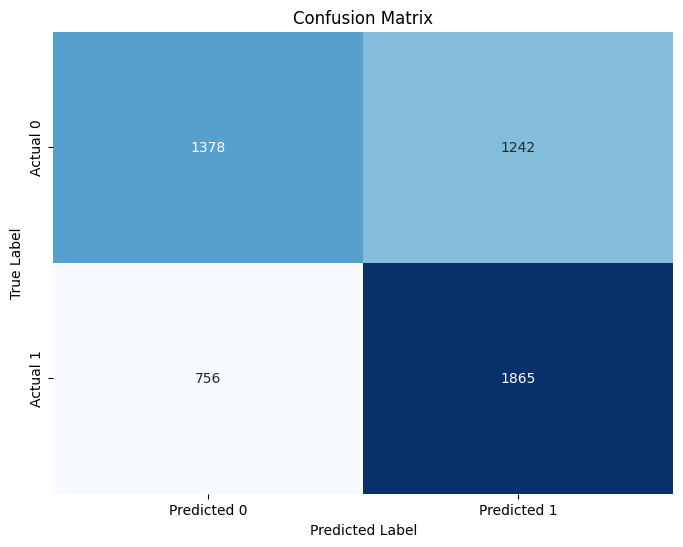

Model: MLPClassifier
Accuracy test: 0.6812 | Accuracy Training: 1.0000
F1-score test: 0.7040 | F1-score Training: 1.0000
roc_AUC-score test:0.7531 | roc_AUC-score Training:      1.0000
Differenza Accuracy: 0.3188
Differenza F1-score: 0.2960
Differenza AUC:      0.2469

Importanza delle Feature (stimata con Permutation Importance) per MLP:
person_income                   0.035451
credit_score                    0.000153
cb_person_cred_hist_length      0.000038
person_age                      0.000000
loan_int_rate                   0.000000
person_emp_exp                  0.000000
person_education_Bachelor       0.000000
person_gender_male              0.000000
person_education_Doctorate      0.000000
person_education_High School    0.000000
loan_intent_EDUCATION           0.000000
person_education_Master         0.000000
person_home_ownership_OWN       0.000000
person_home_ownership_RENT      0.000000
loan_intent_PERSONAL            0.000000
loan_intent_MEDICAL             0.000000
loa

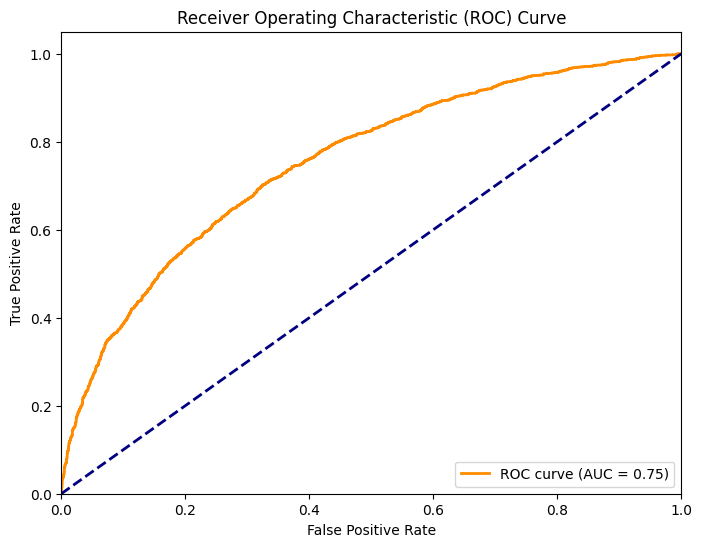

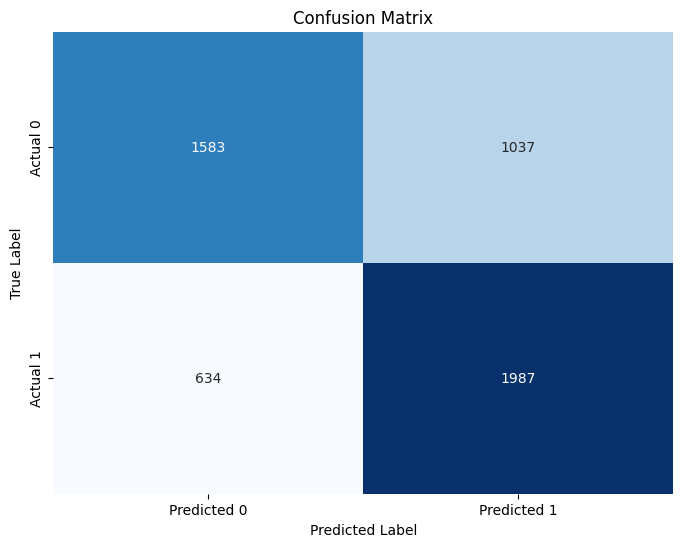

In [ ]:
main(data,ripetizioni=0.999)

## selezioni dal 20% al 50%


modifiche in:
person_gender: 2477
person_education: 2414
person_home_ownership: 2502
loan_intent: 2379
loan_status: 2457

Model: GaussianNB
Accuracy test: 0.6006 | Accuracy Training: 0.5624
F1-score test: 0.6857 | F1-score Training: 0.6576
roc_AUC-score test:0.7204 | roc_AUC-score Training:      0.6367
Differenza Accuracy: -0.0382
Differenza F1-score: -0.0281
Differenza AUC:      -0.0837

Importanza delle Feature (stimata con Permutation Importance) per Gaussian Naive Bayes:
'loan_int_rate': 0.0412
'person_income': 0.0349
'credit_score': 0.0120
'loan_amnt': 0.0072
'person_home_ownership_RENT': 0.0031
'loan_intent_MEDICAL': 6.4873e-04
'loan_intent_VENTURE': 5.7241e-04
'loan_intent_EDUCATION': 4.1977e-04
'loan_intent_PERSONAL': 1.5264e-04
'loan_intent_HOMEIMPROVEMENT': 1.1448e-04
'person_gender_male': 4.4409e-17
'person_home_ownership_OWN': 2.2204e-17
'person_education_High School': -3.8161e-05
'person_education_Bachelor': -7.6321e-05
'cb_person_cred_hist_length': -0.0079
'person_age': 

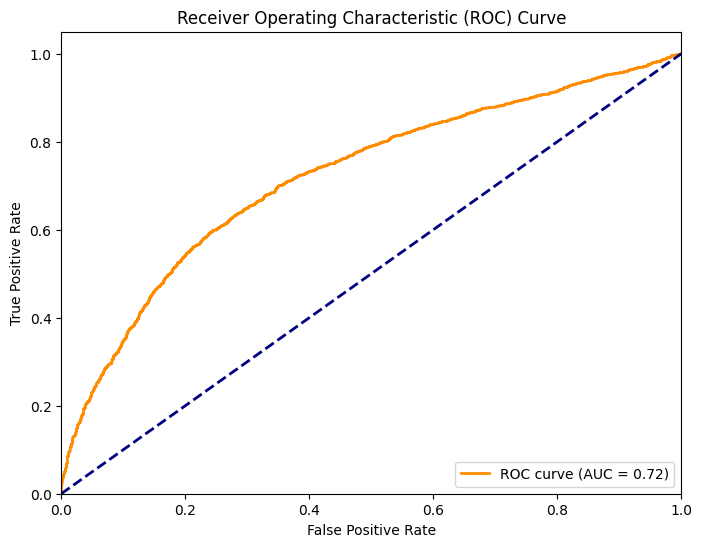

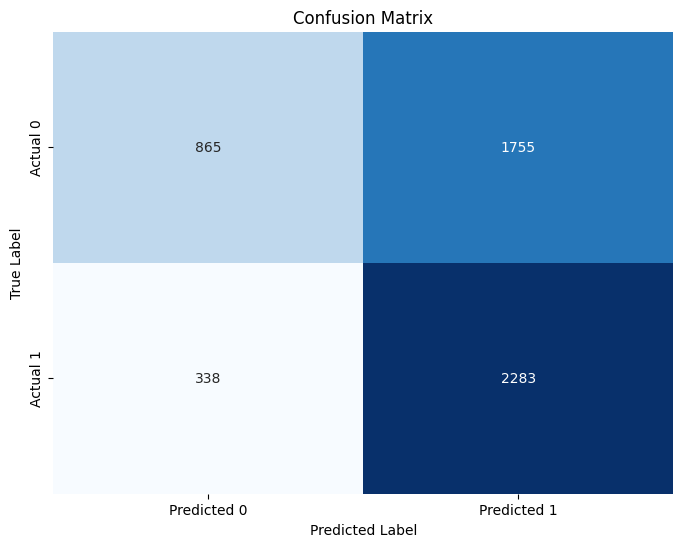

Model: DecisionTreeClassifier
Accuracy test: 0.7853 | Accuracy Training: 0.6808
F1-score test: 0.7873 | F1-score Training: 0.6796
roc_AUC-score test:0.8577 | roc_AUC-score Training:      0.7360
Differenza Accuracy: -0.1045
Differenza F1-score: -0.1077
Differenza AUC:      -0.1216
Importanza delle Feature per Decision Tree:
'person_income': 0.4104
'loan_int_rate': 0.2911
'loan_amnt': 0.1582
'credit_score': 0.0485
'person_home_ownership_RENT': 0.0403
'person_emp_exp': 0.0109
'person_home_ownership_OWN': 0.0093
'cb_person_cred_hist_length': 0.0079
'loan_intent_VENTURE': 0.0074
'person_education_High School': 0.0074
'loan_intent_MEDICAL': 0.0043
'person_age': 0.0042
AUC: 0.8577


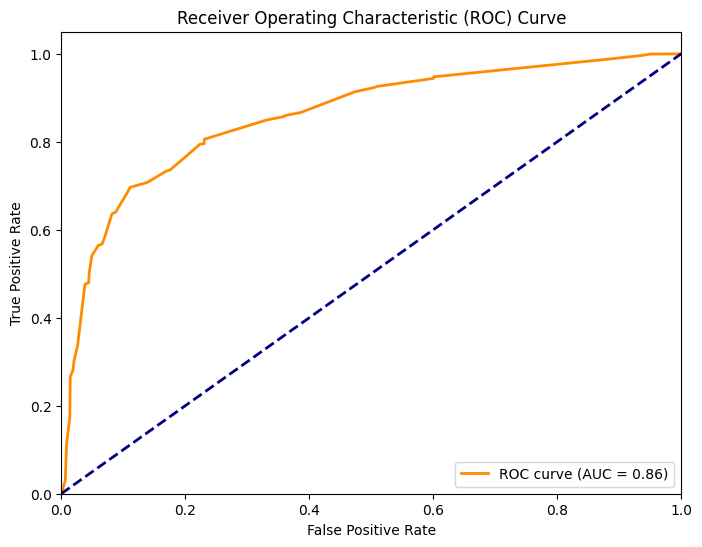

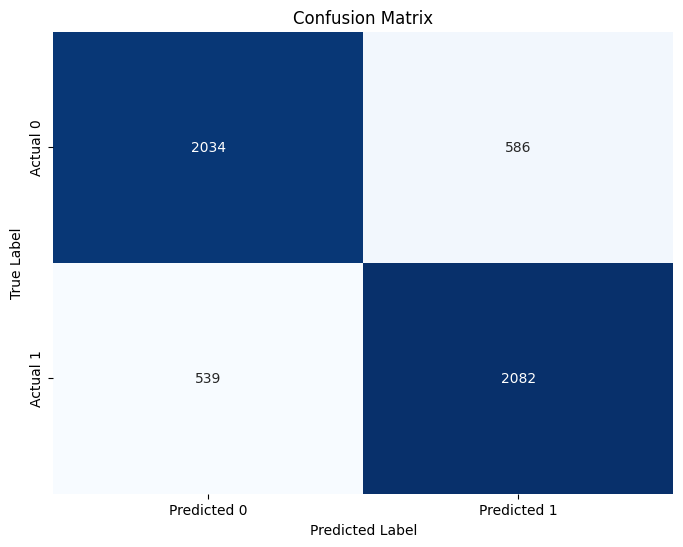

Model: MLPClassifier
Accuracy test: 0.7687 | Accuracy Training: 0.6961
F1-score test: 0.7721 | F1-score Training: 0.6993
roc_AUC-score test:0.8473 | roc_AUC-score Training:      0.7582
Differenza Accuracy: -0.0727
Differenza F1-score: -0.0727
Differenza AUC:      -0.0891

Importanza delle Feature (stimata con Permutation Importance) per MLP:
person_age                      0.000305
cb_person_cred_hist_length      0.000305
credit_score                    0.000267
person_emp_exp                  0.000038
person_home_ownership_OTHER     0.000000
person_home_ownership_OWN       0.000000
loan_int_rate                   0.000000
person_gender_male              0.000000
person_education_Bachelor       0.000000
person_education_Doctorate      0.000000
person_education_High School    0.000000
person_education_Master         0.000000
loan_intent_HOMEIMPROVEMENT     0.000000
loan_intent_MEDICAL             0.000000
person_home_ownership_RENT      0.000000
loan_intent_EDUCATION           0.000000


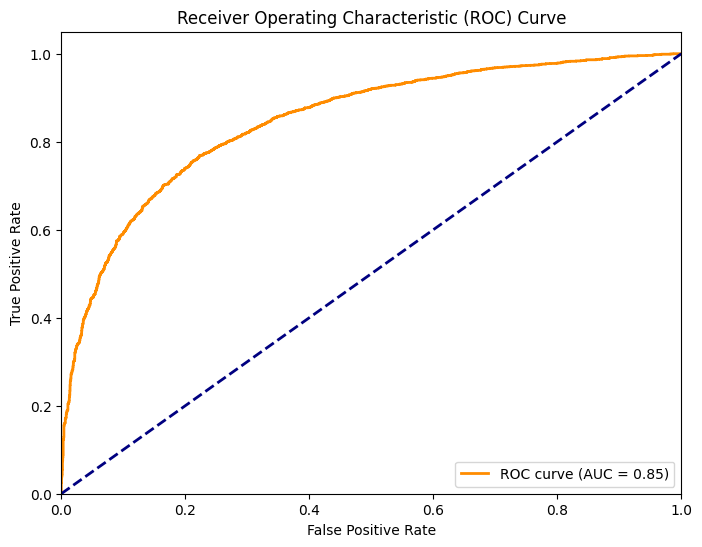

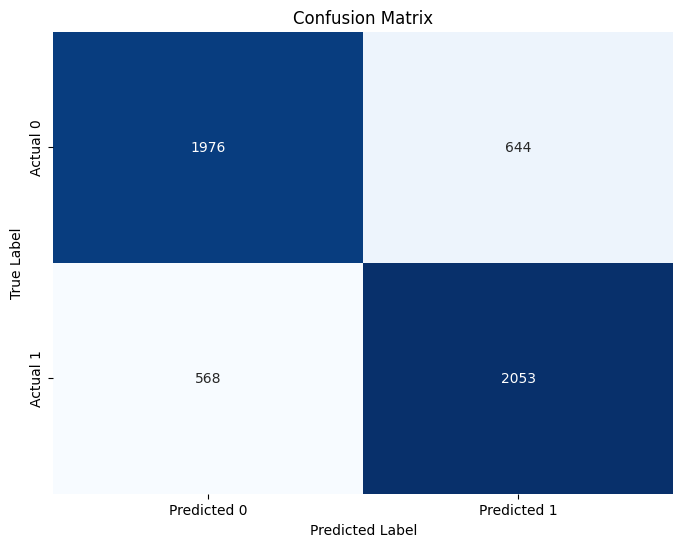

In [ ]:
main(data,selezioni=0.2) # caso con errori di selezione 20%


modifiche in:
person_gender: 3644
person_education: 3668
person_home_ownership: 3609
loan_intent: 3697
loan_status: 3725

Model: GaussianNB
Accuracy test: 0.5575 | Accuracy Training: 0.5301
F1-score test: 0.6679 | F1-score Training: 0.6474
roc_AUC-score test:0.7075 | roc_AUC-score Training:      0.5910
Differenza Accuracy: -0.0274
Differenza F1-score: -0.0205
Differenza AUC:      -0.1165

Importanza delle Feature (stimata con Permutation Importance) per Gaussian Naive Bayes:
'person_income': 0.0259
'loan_int_rate': 0.0145
'credit_score': 0.0038
'person_home_ownership_RENT': 9.1586e-04
'loan_intent_VENTURE': 3.8161e-04
'loan_intent_HOMEIMPROVEMENT': 1.9080e-04
'person_education_Master': 7.6321e-05
'loan_intent_MEDICAL': 7.6321e-05
'person_gender_male': 4.4409e-17
'loan_intent_PERSONAL': 2.2204e-17
'person_education_High School': -3.8161e-05
'person_home_ownership_OWN': -3.8161e-05
'loan_amnt': -3.8161e-04
'cb_person_cred_hist_length': -0.0061
'person_age': -0.0112
'person_emp_exp': -0.

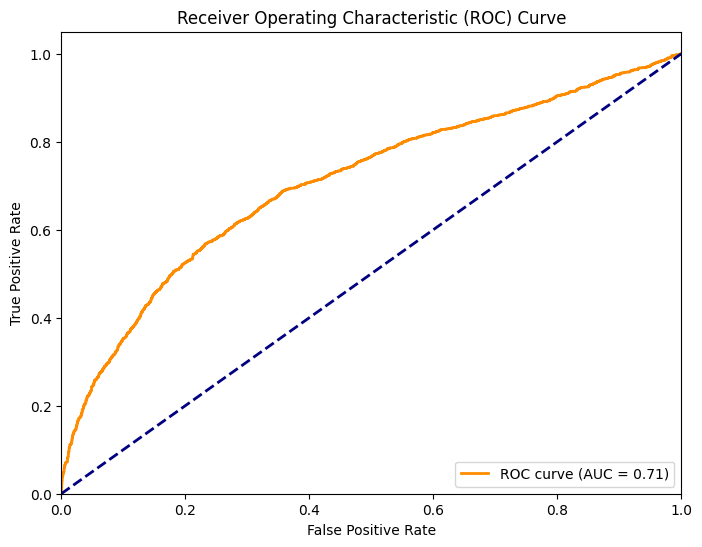

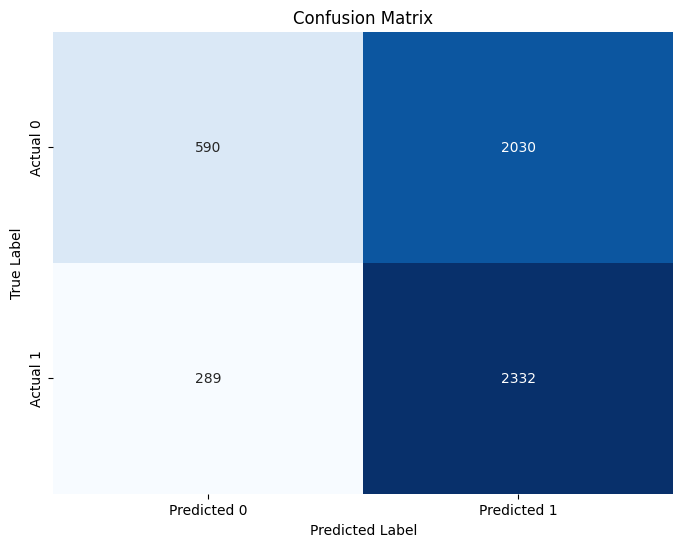

Model: DecisionTreeClassifier
Accuracy test: 0.7848 | Accuracy Training: 0.6301
F1-score test: 0.7779 | F1-score Training: 0.6103
roc_AUC-score test:0.8300 | roc_AUC-score Training:      0.6710
Differenza Accuracy: -0.1546
Differenza F1-score: -0.1675
Differenza AUC:      -0.1591
Importanza delle Feature per Decision Tree:
'loan_int_rate': 0.3049
'person_income': 0.2947
'loan_amnt': 0.1788
'credit_score': 0.0816
'person_emp_exp': 0.0333
'person_home_ownership_RENT': 0.0325
'person_age': 0.0207
'person_education_Doctorate': 0.0156
'person_home_ownership_OTHER': 0.0126
'loan_intent_MEDICAL': 0.0108
'loan_intent_VENTURE': 0.0071
'cb_person_cred_hist_length': 0.0051
'person_gender_male': 0.0023
AUC: 0.8300


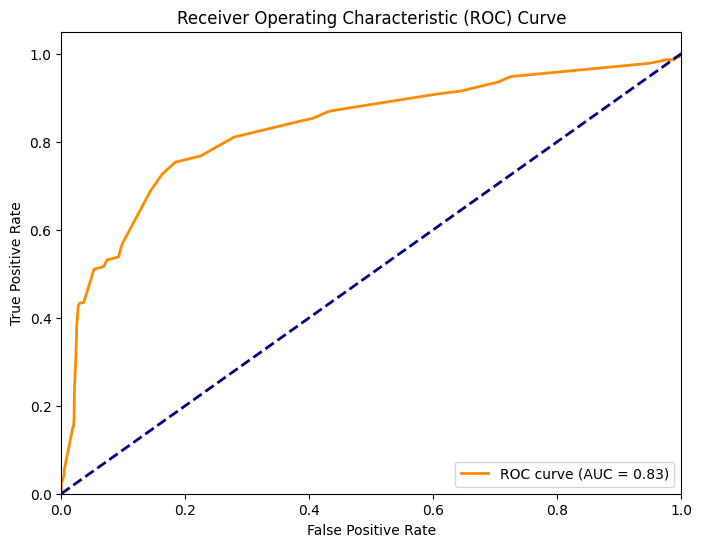

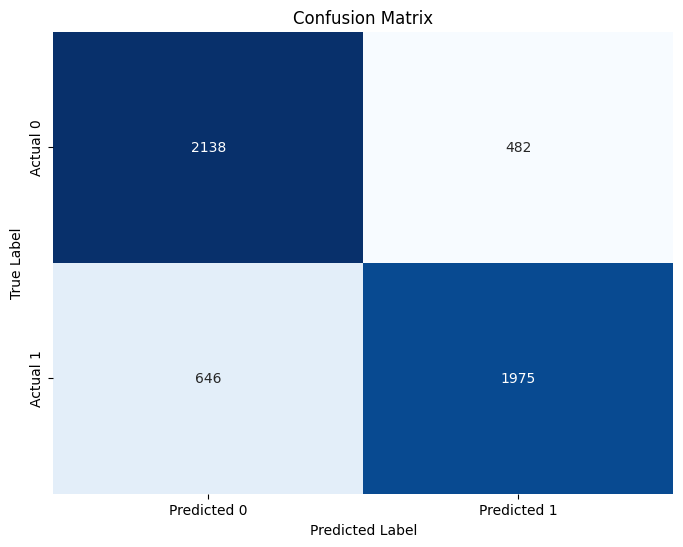

Model: MLPClassifier
Accuracy test: 0.7430 | Accuracy Training: 0.6499
F1-score test: 0.7549 | F1-score Training: 0.6587
roc_AUC-score test:0.8183 | roc_AUC-score Training:      0.7050
Differenza Accuracy: -0.0931
Differenza F1-score: -0.0961
Differenza AUC:      -0.1133

Importanza delle Feature (stimata con Permutation Importance) per MLP:
person_age                      0.0
person_income                   0.0
person_emp_exp                  0.0
loan_amnt                       0.0
loan_int_rate                   0.0
cb_person_cred_hist_length      0.0
credit_score                    0.0
person_gender_male              0.0
person_education_Bachelor       0.0
person_education_Doctorate      0.0
person_education_High School    0.0
person_education_Master         0.0
person_home_ownership_OTHER     0.0
person_home_ownership_OWN       0.0
person_home_ownership_RENT      0.0
loan_intent_EDUCATION           0.0
loan_intent_HOMEIMPROVEMENT     0.0
loan_intent_MEDICAL             0.0
loan_int

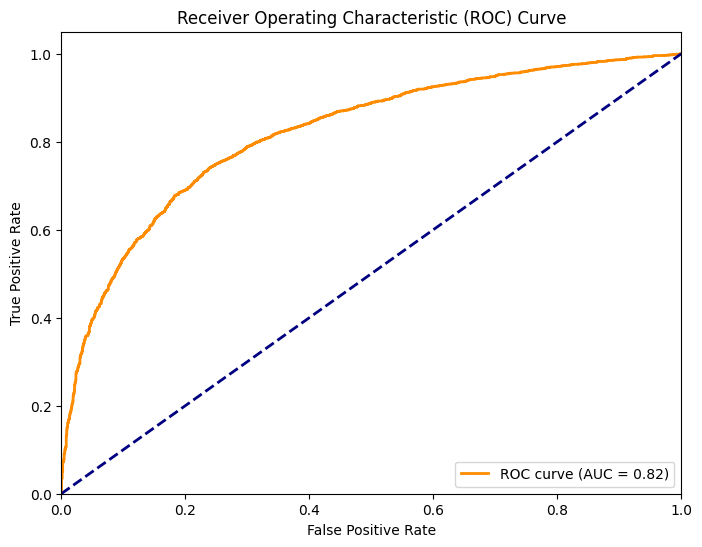

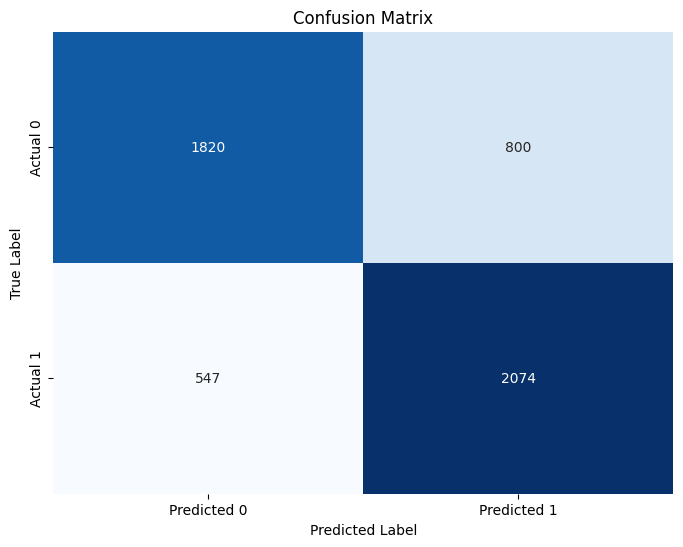

In [ ]:
main(data,selezioni=0.3) # caso con errori di selezione 30%


modifiche in:
person_gender: 4863
person_education: 4891
person_home_ownership: 4885
loan_intent: 4919
loan_status: 4900

Model: GaussianNB
Accuracy test: 0.5323 | Accuracy Training: 0.5166
F1-score test: 0.6575 | F1-score Training: 0.6456
roc_AUC-score test:0.6643 | roc_AUC-score Training:      0.5376
Differenza Accuracy: -0.0158
Differenza F1-score: -0.0119
Differenza AUC:      -0.1267

Importanza delle Feature (stimata con Permutation Importance) per Gaussian Naive Bayes:
'person_income': 0.0221
'loan_int_rate': 0.0037
'credit_score': 8.0137e-04
'person_home_ownership_RENT': -7.6321e-05
'loan_amnt': -7.2505e-04
'cb_person_cred_hist_length': -0.0031
'person_age': -0.0067
'person_emp_exp': -0.0070
AUC: 0.6643


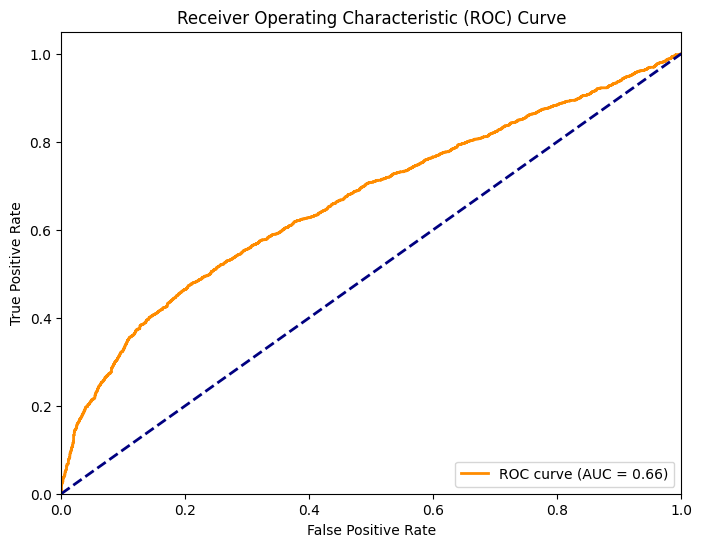

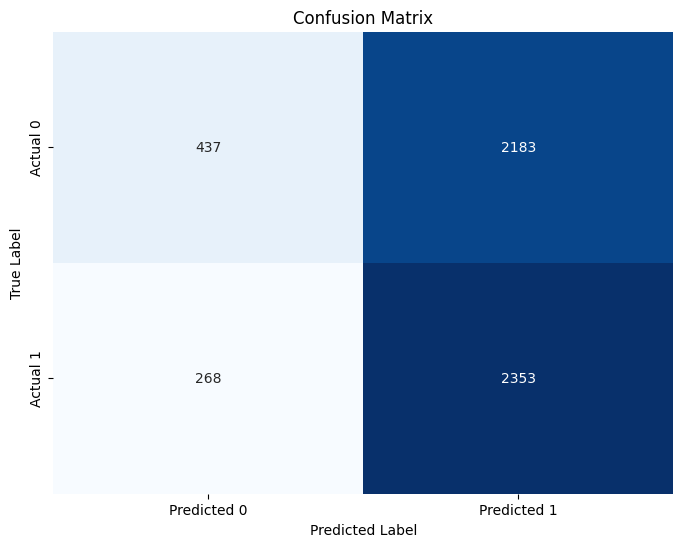

Model: DecisionTreeClassifier
Accuracy test: 0.7317 | Accuracy Training: 0.5837
F1-score test: 0.7365 | F1-score Training: 0.5863
roc_AUC-score test:0.7714 | roc_AUC-score Training:      0.6132
Differenza Accuracy: -0.1480
Differenza F1-score: -0.1502
Differenza AUC:      -0.1582
Importanza delle Feature per Decision Tree:
'person_income': 0.3425
'loan_amnt': 0.1587
'loan_int_rate': 0.1564
'credit_score': 0.0995
'person_emp_exp': 0.0547
'person_education_High School': 0.0401
'cb_person_cred_hist_length': 0.0388
'person_age': 0.0358
'loan_intent_HOMEIMPROVEMENT': 0.0177
'person_home_ownership_OWN': 0.0156
'loan_intent_EDUCATION': 0.0136
'person_gender_male': 0.0118
'loan_intent_VENTURE': 0.0102
'loan_intent_PERSONAL': 0.0049
AUC: 0.7714


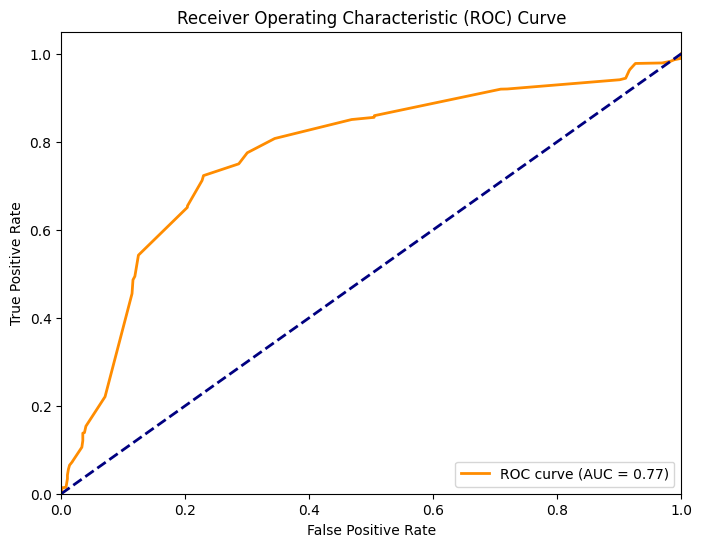

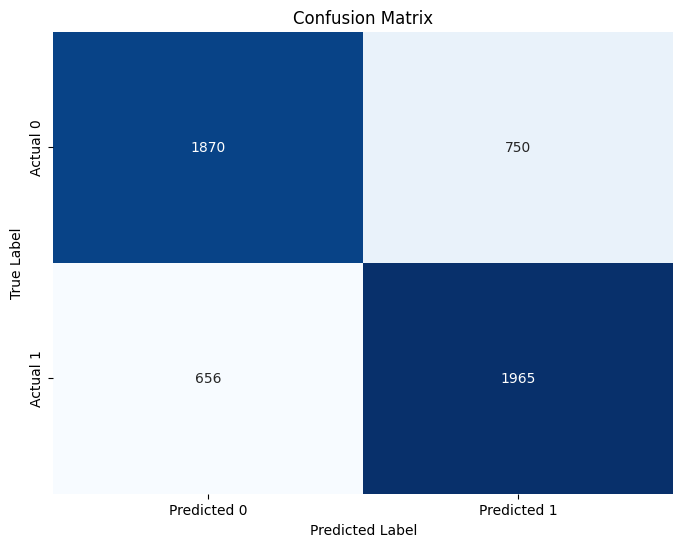

Model: MLPClassifier
Accuracy test: 0.5903 | Accuracy Training: 0.6166
F1-score test: 0.5301 | F1-score Training: 0.5721
roc_AUC-score test:0.6289 | roc_AUC-score Training:      0.6673
Differenza Accuracy: 0.0263
Differenza F1-score: 0.0420
Differenza AUC:      0.0384

Importanza delle Feature (stimata con Permutation Importance) per MLP:
person_age                      0.0
person_income                   0.0
person_emp_exp                  0.0
loan_amnt                       0.0
loan_int_rate                   0.0
cb_person_cred_hist_length      0.0
credit_score                    0.0
person_gender_male              0.0
person_education_Bachelor       0.0
person_education_Doctorate      0.0
person_education_High School    0.0
person_education_Master         0.0
person_home_ownership_OTHER     0.0
person_home_ownership_OWN       0.0
person_home_ownership_RENT      0.0
loan_intent_EDUCATION           0.0
loan_intent_HOMEIMPROVEMENT     0.0
loan_intent_MEDICAL             0.0
loan_intent

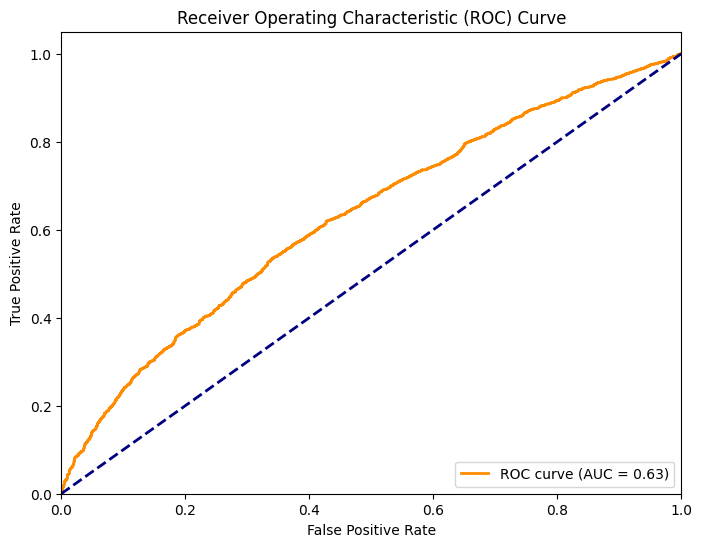

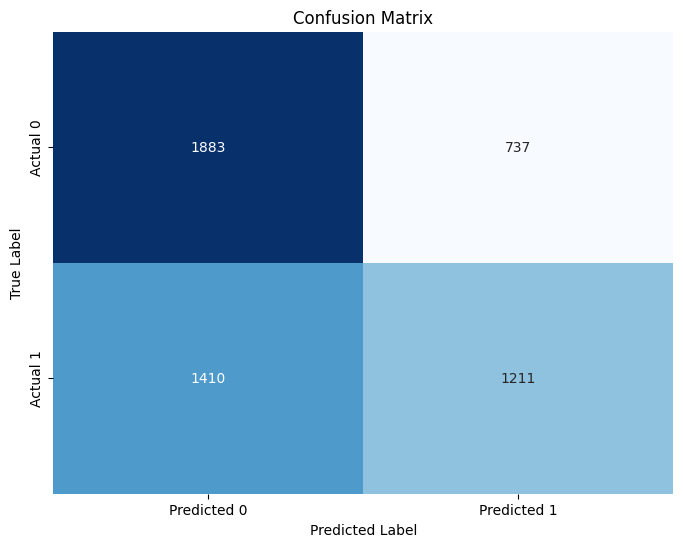

In [ ]:
main(data,selezioni=0.4) # caso con errori di selezione 40%


modifiche in:
person_gender: 6059
person_education: 6151
person_home_ownership: 6079
loan_intent: 6152
loan_status: 6131

Model: GaussianNB
Accuracy test: 0.4728 | Accuracy Training: 0.5067
F1-score test: 0.0908 | F1-score Training: 0.1383
roc_AUC-score test:0.5319 | roc_AUC-score Training:      0.5129
Differenza Accuracy: 0.0339
Differenza F1-score: 0.0474
Differenza AUC:      -0.0189

Importanza delle Feature (stimata con Permutation Importance) per Gaussian Naive Bayes:
'person_age': 0.0026
'person_emp_exp': 0.0016
'credit_score': 8.7770e-04
'person_education_High School': 1.1448e-04
'person_education_Bachelor': 3.8161e-05
'loan_intent_HOMEIMPROVEMENT': -3.8161e-05
'person_education_Doctorate': -3.8161e-05
'person_education_Master': -7.6321e-05
'loan_intent_EDUCATION': -1.5264e-04
'person_home_ownership_RENT': -1.5264e-04
'cb_person_cred_hist_length': -9.5402e-04
'loan_amnt': -0.0010
'loan_int_rate': -0.0011
'person_income': -0.0269
AUC: 0.5319


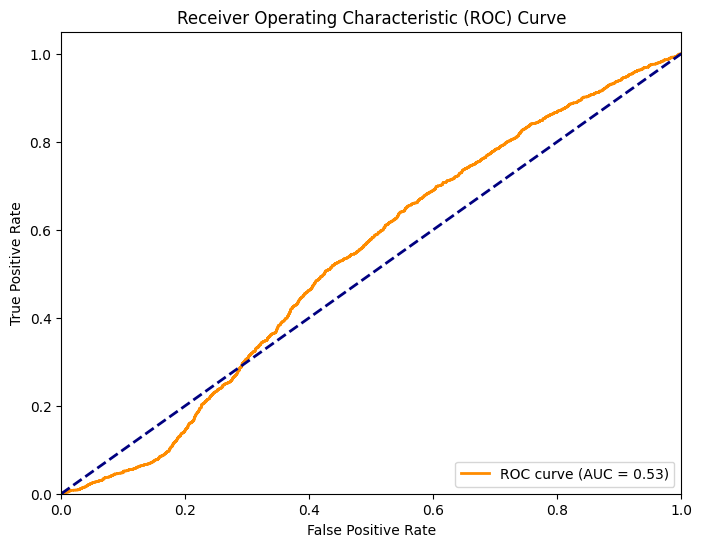

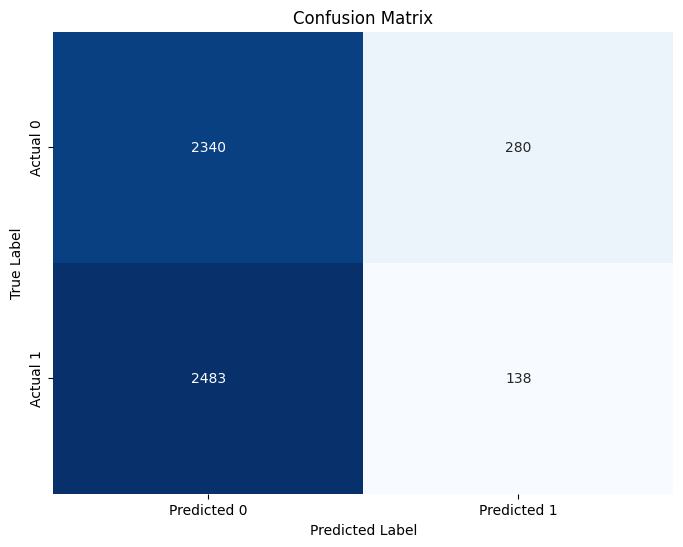

Model: DecisionTreeClassifier
Accuracy test: 0.4850 | Accuracy Training: 0.5204
F1-score test: 0.1024 | F1-score Training: 0.1562
roc_AUC-score test:0.4947 | roc_AUC-score Training:      0.5321
Differenza Accuracy: 0.0354
Differenza F1-score: 0.0538
Differenza AUC:      0.0374
Importanza delle Feature per Decision Tree:
'person_income': 0.3089
'credit_score': 0.2220
'person_emp_exp': 0.1384
'loan_int_rate': 0.1323
'person_age': 0.0610
'loan_amnt': 0.0300
'cb_person_cred_hist_length': 0.0249
'person_education_High School': 0.0234
'loan_intent_EDUCATION': 0.0226
'person_education_Doctorate': 0.0188
'loan_intent_MEDICAL': 0.0178
AUC: 0.4947


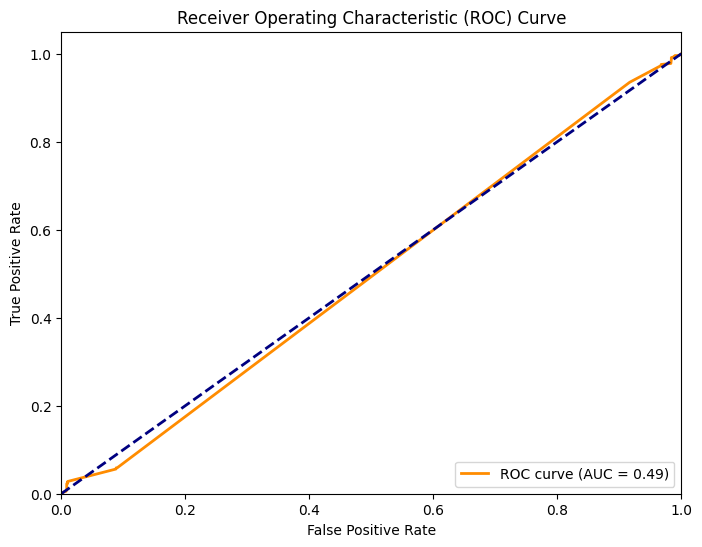

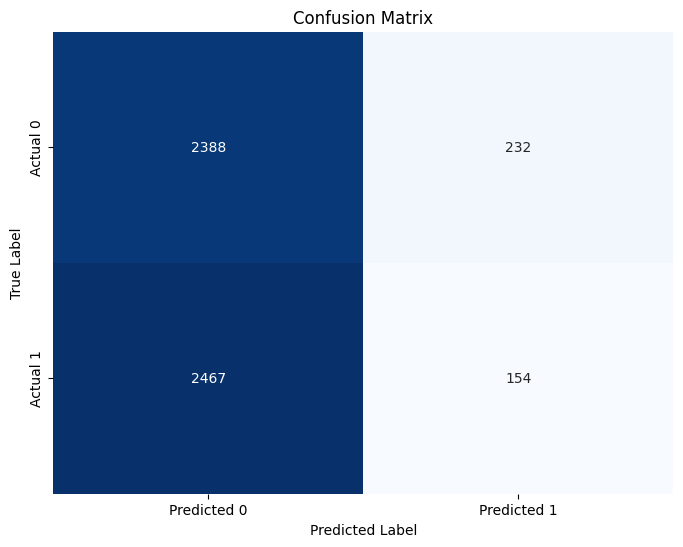

Model: MLPClassifier
Accuracy test: 0.4913 | Accuracy Training: 0.5988
F1-score test: 0.5397 | F1-score Training: 0.6445
roc_AUC-score test:0.4859 | roc_AUC-score Training:      0.6514
Differenza Accuracy: 0.1075
Differenza F1-score: 0.1048
Differenza AUC:      0.1655

Importanza delle Feature (stimata con Permutation Importance) per MLP:
person_age                      0.0
person_income                   0.0
person_emp_exp                  0.0
loan_amnt                       0.0
loan_int_rate                   0.0
cb_person_cred_hist_length      0.0
credit_score                    0.0
person_gender_male              0.0
person_education_Bachelor       0.0
person_education_Doctorate      0.0
person_education_High School    0.0
person_education_Master         0.0
person_home_ownership_OTHER     0.0
person_home_ownership_OWN       0.0
person_home_ownership_RENT      0.0
loan_intent_EDUCATION           0.0
loan_intent_HOMEIMPROVEMENT     0.0
loan_intent_MEDICAL             0.0
loan_intent

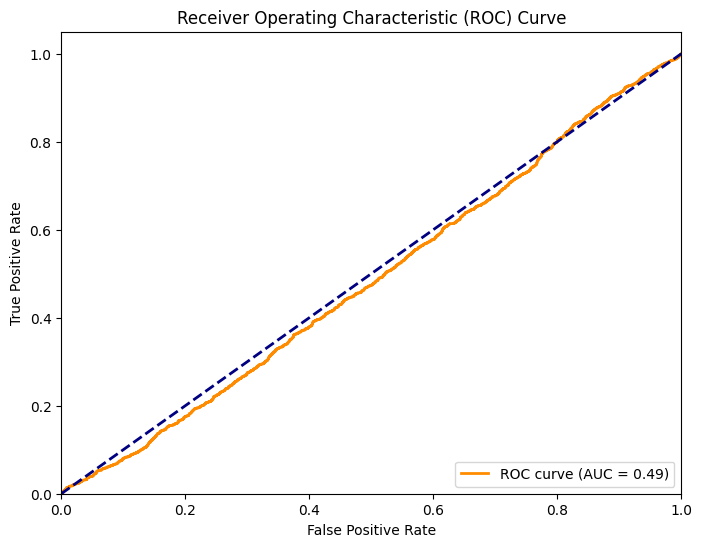

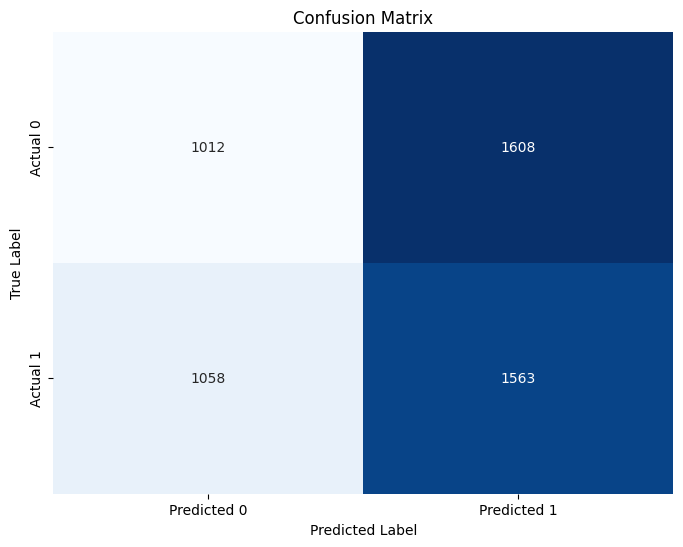

In [ ]:
main(data,selezioni=0.5) # caso con errori di selezione 50%

## mancanza dati dal 20% al 50%, 70%,90%,95%


MIA added:
numerical: 17129
strings: 9774

Model: GaussianNB
Accuracy test: 0.6144 | Accuracy Training: 0.5980
F1-score test: 0.6862 | F1-score Training: 0.6860
roc_AUC-score test:0.7199 | roc_AUC-score Training:      0.7100
Differenza Accuracy: -0.0164
Differenza F1-score: -0.0002
Differenza AUC:      -0.0099

Importanza delle Feature (stimata con Permutation Importance) per Gaussian Naive Bayes:
'loan_int_rate': 0.0468
'person_income': 0.0369
'credit_score': 0.0141
'loan_amnt': 0.0084
'person_home_ownership_RENT': 9.1586e-04
'loan_intent_EDUCATION': 6.8689e-04
'loan_intent_VENTURE': 4.9609e-04
'person_education_High School': 2.2896e-04
'person_home_ownership_OWN': 2.2896e-04
'person_gender_male': 7.6321e-05
'loan_intent_PERSONAL': -1.1448e-04
'loan_intent_HOMEIMPROVEMENT': -1.1448e-04
'person_education_Bachelor': -1.1448e-04
'person_education_Master': -1.9080e-04
'loan_intent_MEDICAL': -1.9080e-04
'cb_person_cred_hist_length': -0.0057
'person_age': -0.0113
'person_emp_exp': -0.0124


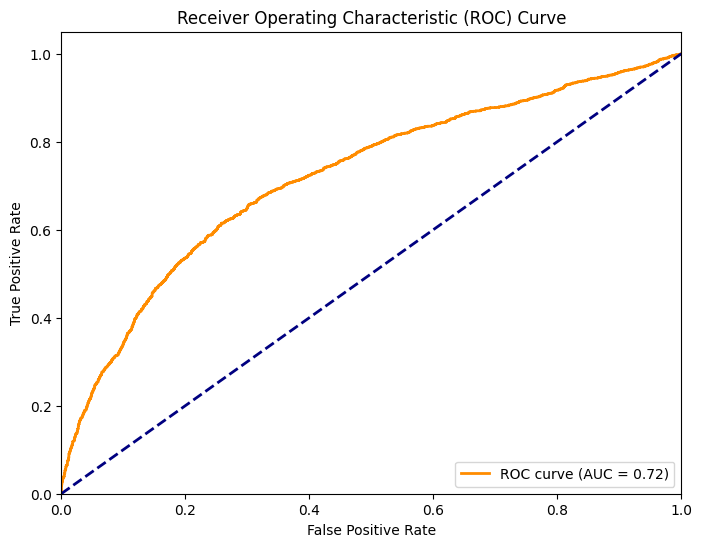

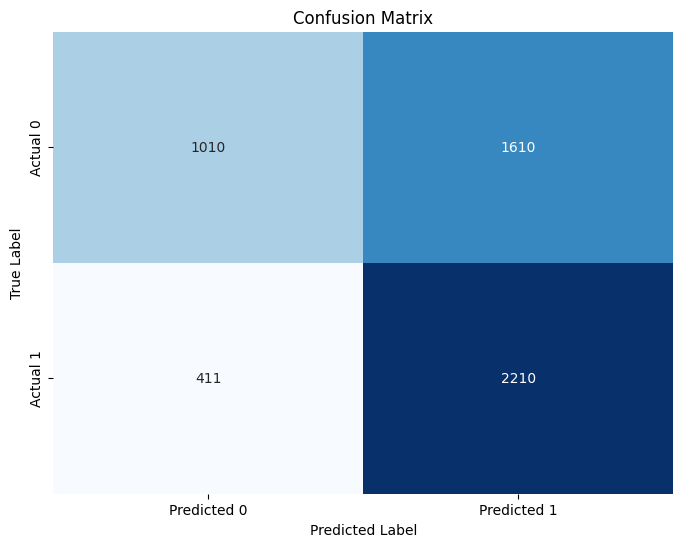

Model: DecisionTreeClassifier
Accuracy test: 0.8098 | Accuracy Training: 0.7578
F1-score test: 0.8038 | F1-score Training: 0.7280
roc_AUC-score test:0.8724 | roc_AUC-score Training:      0.8328
Differenza Accuracy: -0.0520
Differenza F1-score: -0.0758
Differenza AUC:      -0.0396
Importanza delle Feature per Decision Tree:
'person_income': 0.3362
'loan_int_rate': 0.3333
'loan_amnt': 0.1355
'person_home_ownership_RENT': 0.0930
'person_home_ownership_OWN': 0.0378
'credit_score': 0.0261
'loan_intent_HOMEIMPROVEMENT': 0.0144
'loan_intent_VENTURE': 0.0080
'loan_intent_MEDICAL': 0.0076
'person_age': 0.0063
'person_emp_exp': 0.0017
AUC: 0.8724


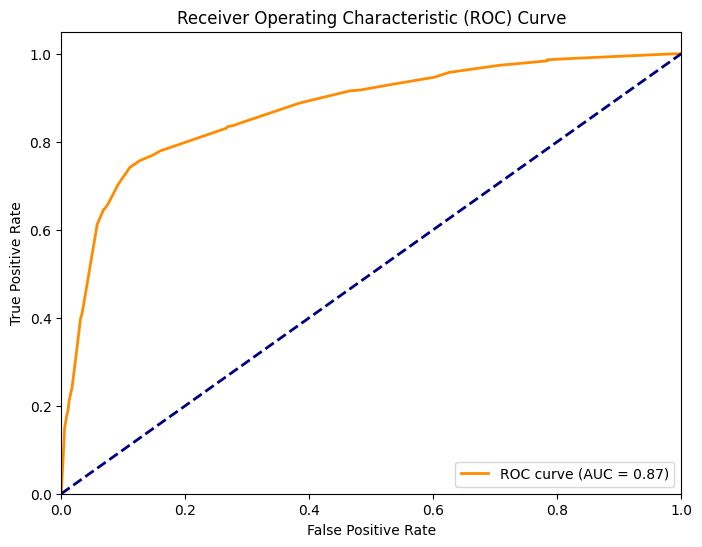

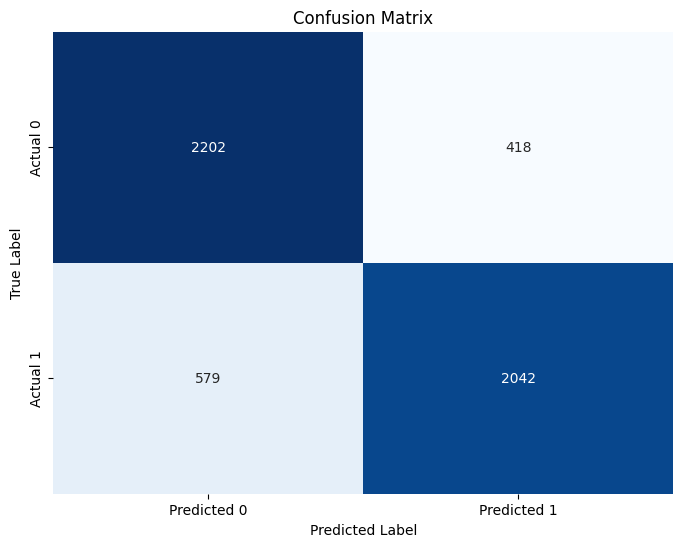

Model: MLPClassifier
Accuracy test: 0.8077 | Accuracy Training: 0.7877
F1-score test: 0.8057 | F1-score Training: 0.7730
roc_AUC-score test:0.8868 | roc_AUC-score Training:      0.8753
Differenza Accuracy: -0.0200
Differenza F1-score: -0.0327
Differenza AUC:      -0.0115

Importanza delle Feature (stimata con Permutation Importance) per MLP:
person_age                      0.000000e+00
person_emp_exp                  0.000000e+00
cb_person_cred_hist_length      0.000000e+00
loan_int_rate                   0.000000e+00
credit_score                    0.000000e+00
person_gender_male              0.000000e+00
person_education_Bachelor       0.000000e+00
person_gender_None              0.000000e+00
person_home_ownership_RENT      0.000000e+00
person_home_ownership_None      0.000000e+00
person_education_Doctorate      0.000000e+00
person_education_High School    0.000000e+00
person_education_Master         0.000000e+00
person_education_None           0.000000e+00
person_home_ownership_OTHE

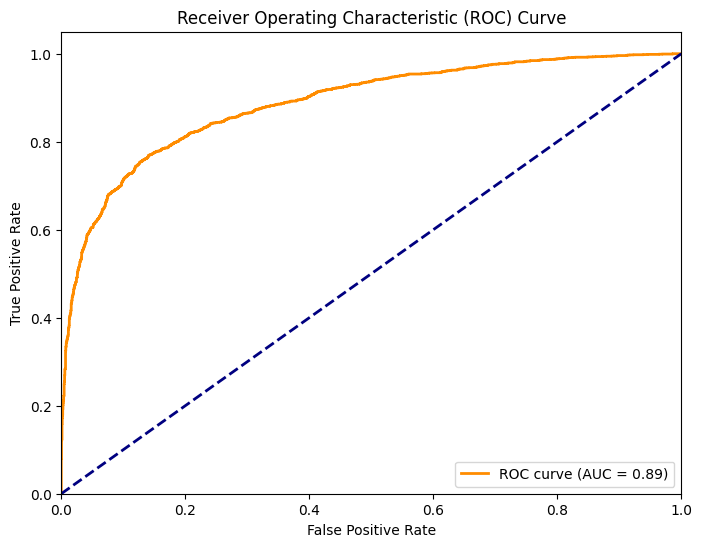

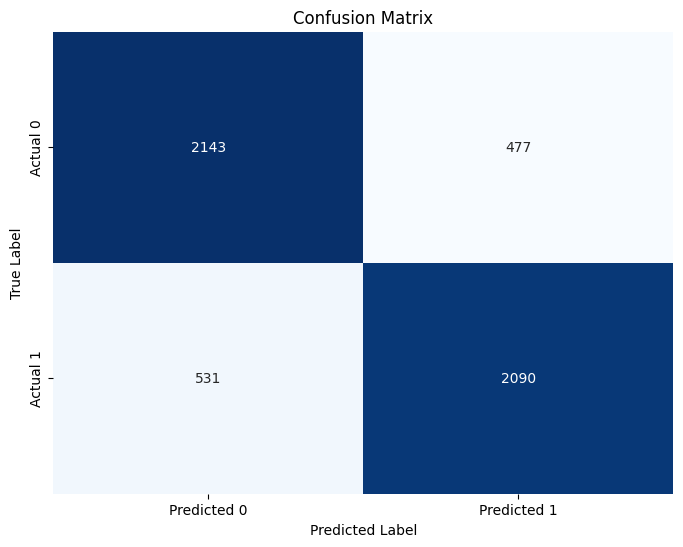

In [ ]:
main(data,MIA=0.2) # caso con mancanza dati 20%


MIA added:
numerical: 25746
strings: 14609

Model: GaussianNB
Accuracy test: 0.6066 | Accuracy Training: 0.5797
F1-score test: 0.6803 | F1-score Training: 0.6785
roc_AUC-score test:0.7094 | roc_AUC-score Training:      0.6896
Differenza Accuracy: -0.0269
Differenza F1-score: -0.0018
Differenza AUC:      -0.0199

Importanza delle Feature (stimata con Permutation Importance) per Gaussian Naive Bayes:
'loan_int_rate': 0.0440
'person_income': 0.0323
'credit_score': 0.0154
'loan_amnt': 0.0073
'person_home_ownership_RENT': 0.0015
'loan_intent_EDUCATION': 7.2505e-04
'loan_intent_HOMEIMPROVEMENT': 1.5264e-04
'loan_intent_MEDICAL': 1.1448e-04
'person_education_Doctorate': -3.8161e-05
'person_home_ownership_OWN': -1.5264e-04
'person_education_Master': -1.9080e-04
'loan_intent_VENTURE': -2.6712e-04
'person_education_High School': -2.6712e-04
'loan_intent_PERSONAL': -4.1977e-04
'cb_person_cred_hist_length': -0.0075
'person_emp_exp': -0.0098
'person_age': -0.0100
AUC: 0.7094


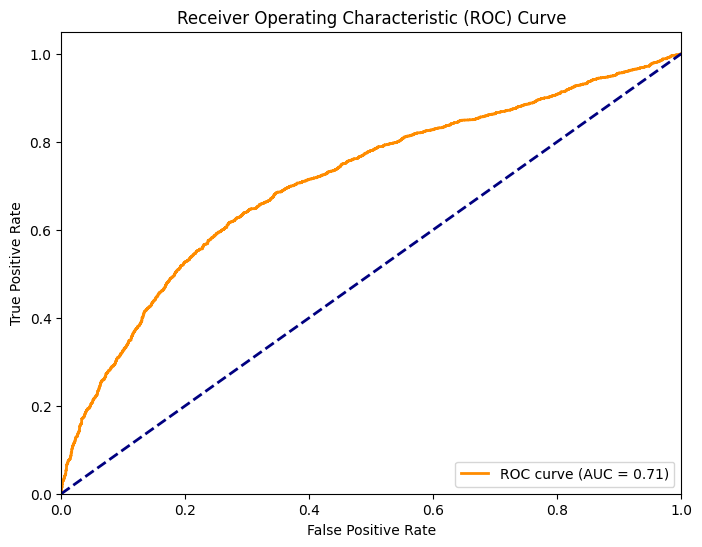

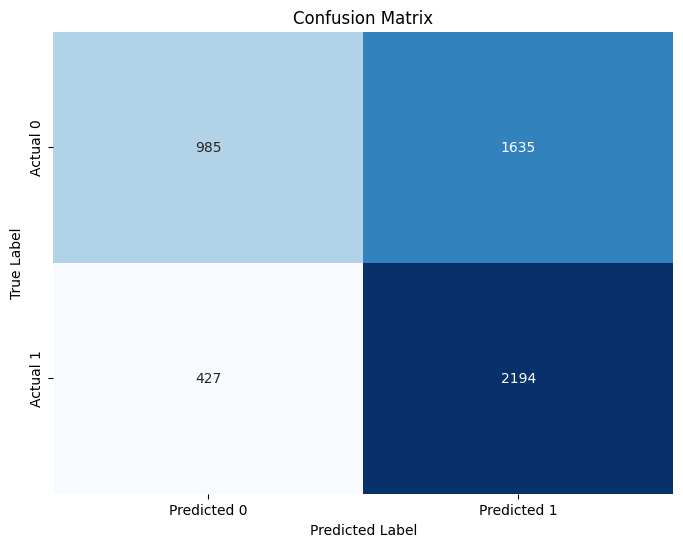

Model: DecisionTreeClassifier
Accuracy test: 0.8027 | Accuracy Training: 0.7307
F1-score test: 0.8033 | F1-score Training: 0.7019
roc_AUC-score test:0.8691 | roc_AUC-score Training:      0.8034
Differenza Accuracy: -0.0720
Differenza F1-score: -0.1014
Differenza AUC:      -0.0657
Importanza delle Feature per Decision Tree:
'loan_int_rate': 0.3640
'person_income': 0.3321
'loan_amnt': 0.1503
'person_home_ownership_RENT': 0.0473
'credit_score': 0.0446
'person_home_ownership_OWN': 0.0262
'loan_intent_HOMEIMPROVEMENT': 0.0096
'loan_intent_EDUCATION': 0.0074
'person_age': 0.0056
'loan_intent_VENTURE': 0.0055
'person_emp_exp': 0.0028
'loan_intent_PERSONAL': 0.0019
'cb_person_cred_hist_length': 0.0019
'person_gender_None': 8.4909e-04
AUC: 0.8691


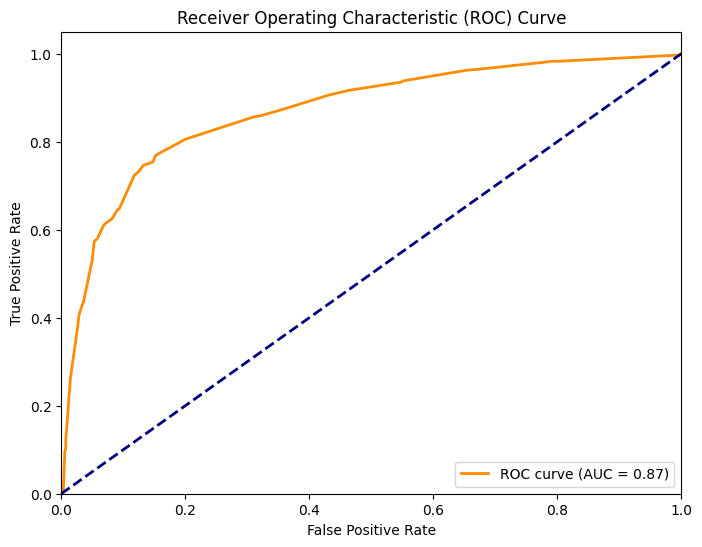

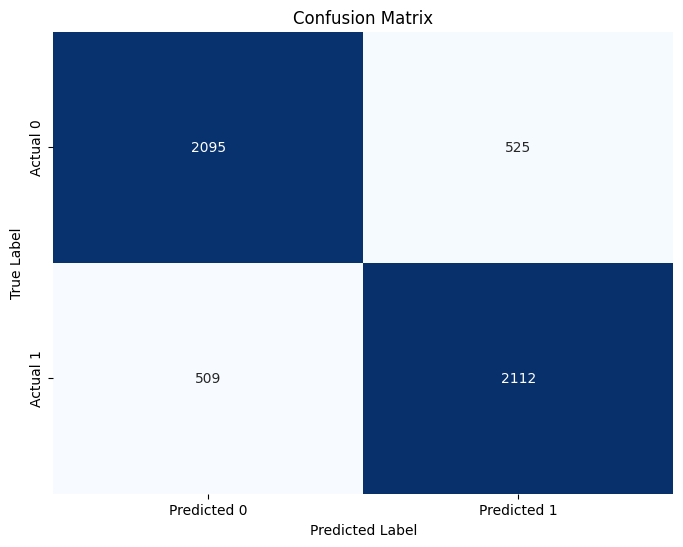

Model: MLPClassifier
Accuracy test: 0.7928 | Accuracy Training: 0.7627
F1-score test: 0.8000 | F1-score Training: 0.7498
roc_AUC-score test:0.8772 | roc_AUC-score Training:      0.8489
Differenza Accuracy: -0.0301
Differenza F1-score: -0.0502
Differenza AUC:      -0.0283

Importanza delle Feature (stimata con Permutation Importance) per MLP:
person_age                      0.000000
person_emp_exp                  0.000000
cb_person_cred_hist_length      0.000000
loan_int_rate                   0.000000
credit_score                    0.000000
person_gender_male              0.000000
person_education_Bachelor       0.000000
person_gender_None              0.000000
person_home_ownership_RENT      0.000000
person_home_ownership_None      0.000000
person_education_Doctorate      0.000000
person_education_High School    0.000000
person_education_Master         0.000000
person_education_None           0.000000
person_home_ownership_OTHER     0.000000
person_home_ownership_OWN       0.000000


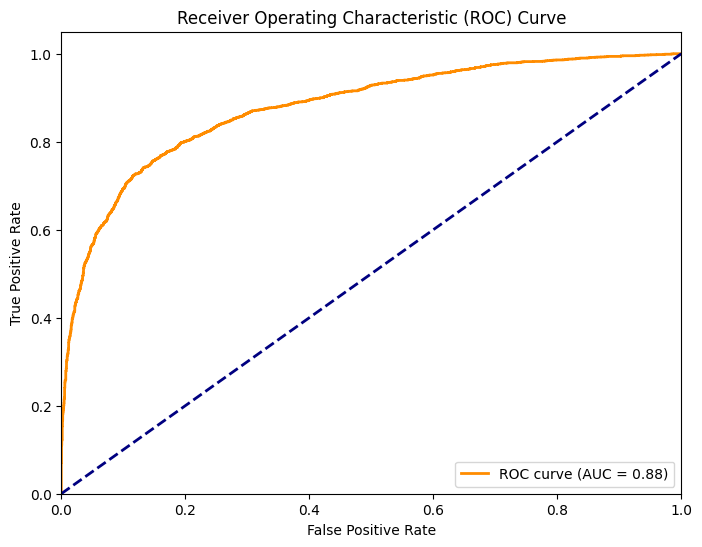

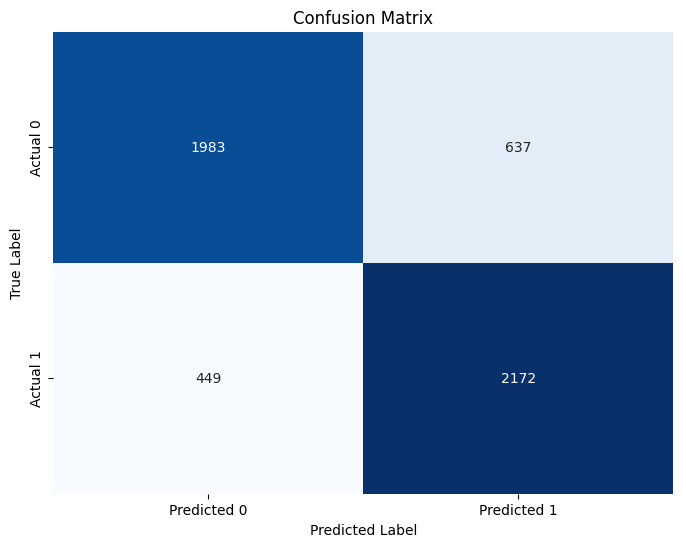

In [ ]:
main(data,MIA=0.3) # caso con mancanza dati 30%


MIA added:
numerical: 34322
strings: 19485

Model: GaussianNB
Accuracy test: 0.5928 | Accuracy Training: 0.5592
F1-score test: 0.6724 | F1-score Training: 0.6707
roc_AUC-score test:0.6984 | roc_AUC-score Training:      0.6658
Differenza Accuracy: -0.0337
Differenza F1-score: -0.0017
Differenza AUC:      -0.0326

Importanza delle Feature (stimata con Permutation Importance) per Gaussian Naive Bayes:
'loan_int_rate': 0.0372
'person_income': 0.0252
'credit_score': 0.0144
'loan_amnt': 0.0056
'person_home_ownership_RENT': 0.0027
'person_education_Master': 4.1977e-04
'person_gender_male': 1.9080e-04
'loan_intent_HOMEIMPROVEMENT': 1.1448e-04
'loan_intent_EDUCATION': -7.6321e-05
'loan_intent_VENTURE': -1.9080e-04
'loan_intent_MEDICAL': -3.4345e-04
'cb_person_cred_hist_length': -0.0057
'person_emp_exp': -0.0107
'person_age': -0.0113
AUC: 0.6984


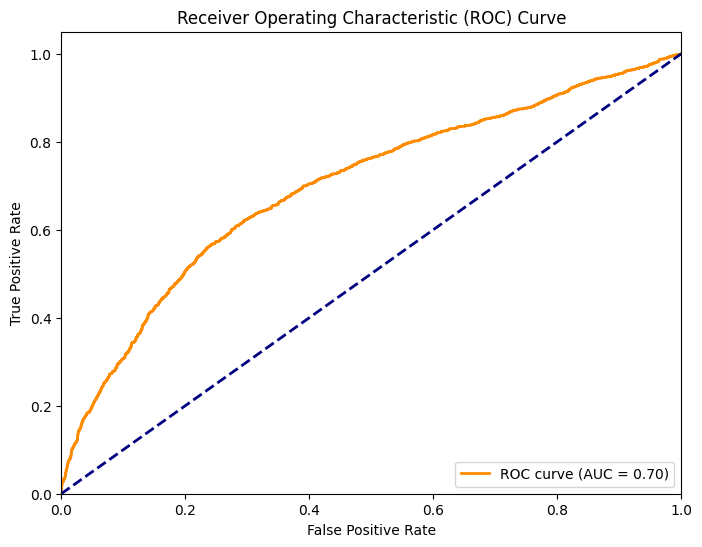

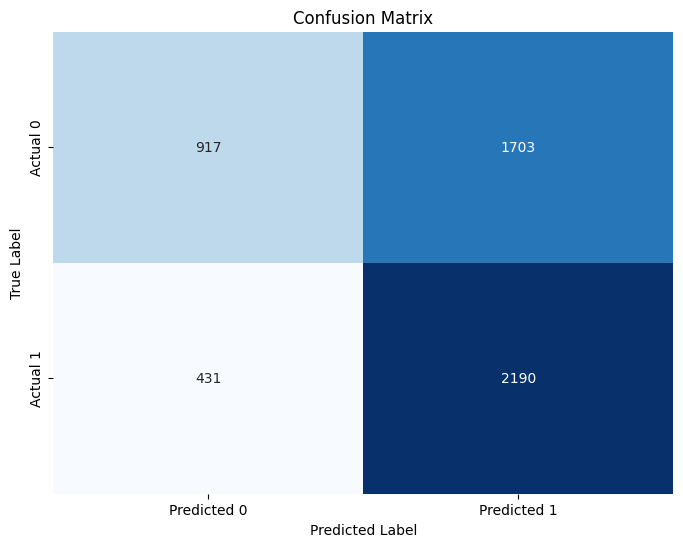

Model: DecisionTreeClassifier
Accuracy test: 0.7733 | Accuracy Training: 0.7084
F1-score test: 0.7790 | F1-score Training: 0.6914
roc_AUC-score test:0.8550 | roc_AUC-score Training:      0.7810
Differenza Accuracy: -0.0649
Differenza F1-score: -0.0876
Differenza AUC:      -0.0740
Importanza delle Feature per Decision Tree:
'loan_int_rate': 0.3598
'person_income': 0.3268
'loan_amnt': 0.1037
'person_home_ownership_RENT': 0.1033
'credit_score': 0.0431
'person_home_ownership_OWN': 0.0239
'person_home_ownership_None': 0.0141
'loan_intent_HOMEIMPROVEMENT': 0.0114
'person_gender_male': 0.0047
'loan_intent_EDUCATION': 0.0039
'person_age': 0.0021
'loan_intent_MEDICAL': 0.0015
'loan_intent_PERSONAL': 8.5906e-04
'cb_person_cred_hist_length': 5.6721e-04
'person_education_Bachelor': 3.0170e-04
AUC: 0.8550


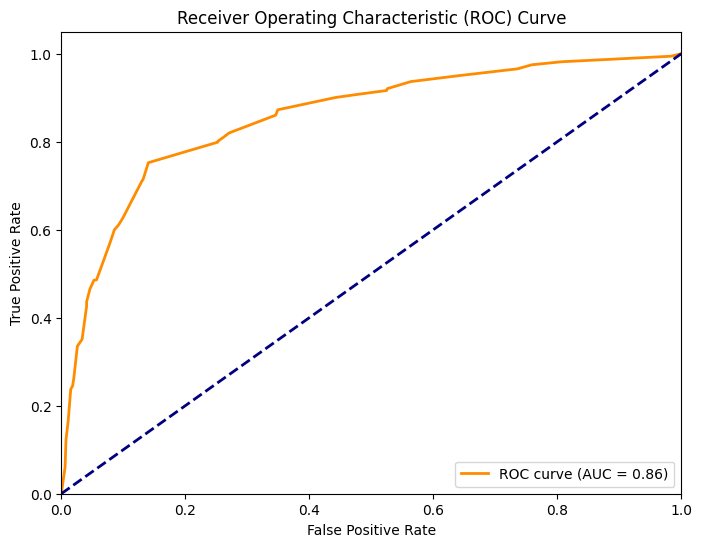

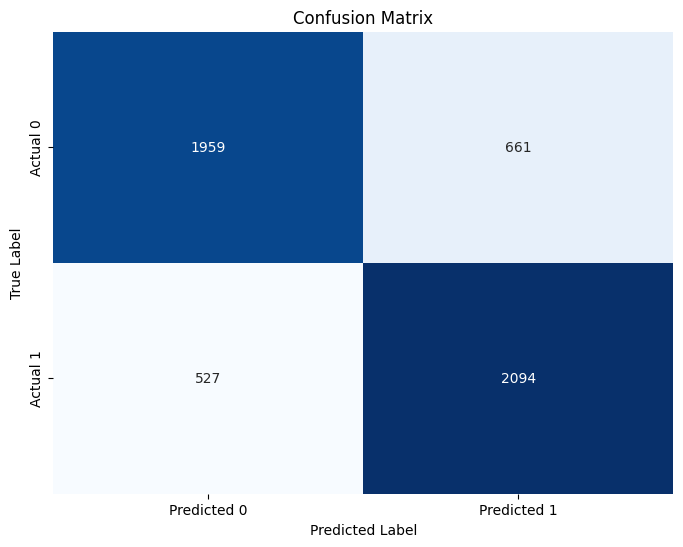

Model: MLPClassifier
Accuracy test: 0.7802 | Accuracy Training: 0.7450
F1-score test: 0.7819 | F1-score Training: 0.7279
roc_AUC-score test:0.8595 | roc_AUC-score Training:      0.8296
Differenza Accuracy: -0.0352
Differenza F1-score: -0.0540
Differenza AUC:      -0.0299

Importanza delle Feature (stimata con Permutation Importance) per MLP:
person_age                      0.000000
person_emp_exp                  0.000000
cb_person_cred_hist_length      0.000000
loan_int_rate                   0.000000
credit_score                    0.000000
person_gender_male              0.000000
person_education_Bachelor       0.000000
person_gender_None              0.000000
person_home_ownership_RENT      0.000000
person_home_ownership_None      0.000000
person_education_Doctorate      0.000000
person_education_High School    0.000000
person_education_Master         0.000000
person_education_None           0.000000
person_home_ownership_OTHER     0.000000
person_home_ownership_OWN       0.000000


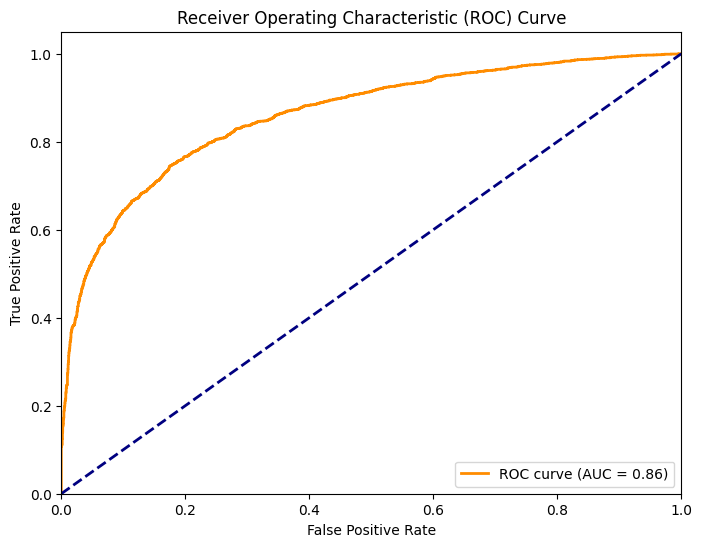

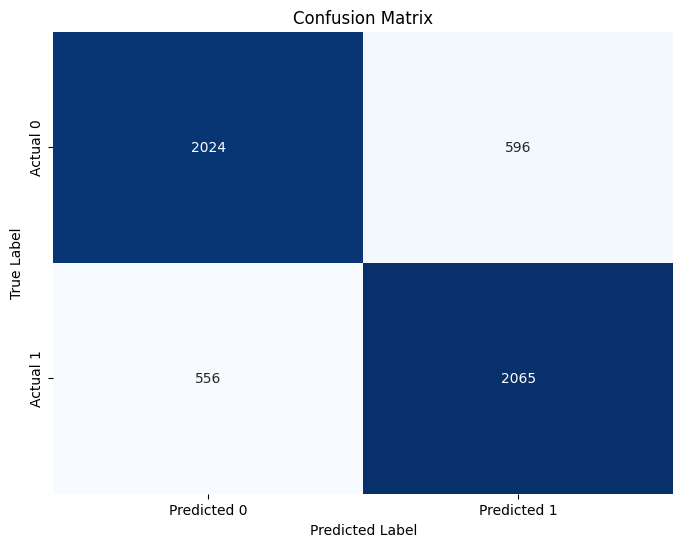

In [ ]:
main(data,MIA=0.4) # caso con mancanza dati 40%


MIA added:
numerical: 42752
strings: 24507

Model: GaussianNB
Accuracy test: 0.6489 | Accuracy Training: 0.5923
F1-score test: 0.6861 | F1-score Training: 0.6632
roc_AUC-score test:0.7174 | roc_AUC-score Training:      0.6615
Differenza Accuracy: -0.0566
Differenza F1-score: -0.0229
Differenza AUC:      -0.0558

Importanza delle Feature (stimata con Permutation Importance) per Gaussian Naive Bayes:
'loan_int_rate': 0.0685
'person_income': 0.0324
'credit_score': 0.0243
'loan_amnt': 0.0152
'person_home_ownership_RENT': 0.0016
'loan_intent_VENTURE': 8.3953e-04
'person_home_ownership_OWN': 1.9080e-04
'person_education_High School': 7.6321e-05
'loan_intent_HOMEIMPROVEMENT': 7.6321e-05
'loan_intent_MEDICAL': 7.6321e-05
'loan_intent_EDUCATION': -1.9080e-04
'loan_intent_PERSONAL': -3.0529e-04
'person_education_Master': -4.1977e-04
'cb_person_cred_hist_length': -0.0030
'person_emp_exp': -0.0050
'person_age': -0.0070
AUC: 0.7174


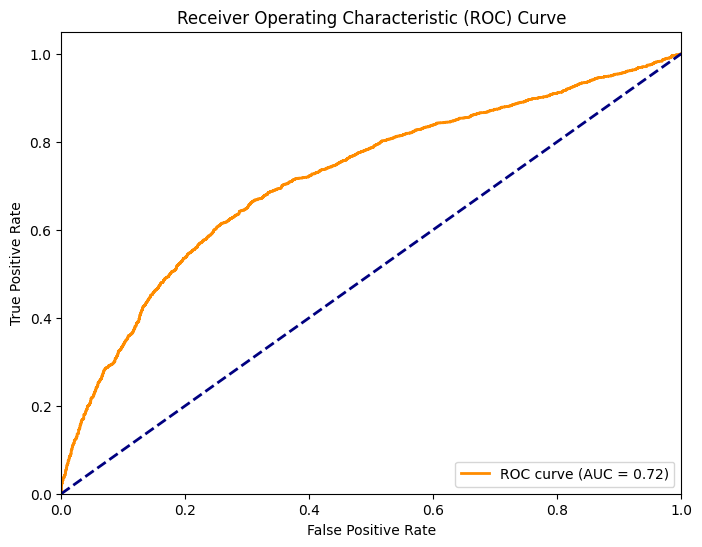

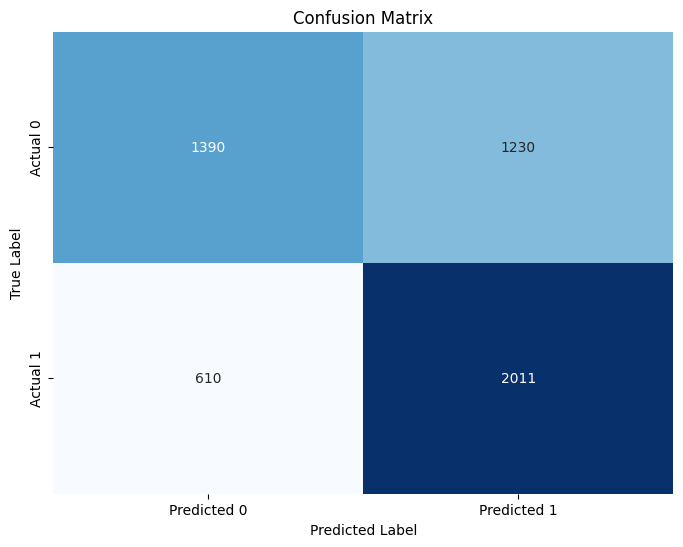

Model: DecisionTreeClassifier
Accuracy test: 0.7527 | Accuracy Training: 0.6624
F1-score test: 0.7741 | F1-score Training: 0.6322
roc_AUC-score test:0.8417 | roc_AUC-score Training:      0.7439
Differenza Accuracy: -0.0904
Differenza F1-score: -0.1419
Differenza AUC:      -0.0978
Importanza delle Feature per Decision Tree:
'loan_int_rate': 0.3902
'person_income': 0.2924
'person_home_ownership_RENT': 0.0862
'person_home_ownership_None': 0.0754
'loan_amnt': 0.0692
'credit_score': 0.0399
'person_home_ownership_OWN': 0.0280
'person_age': 0.0094
'loan_intent_HOMEIMPROVEMENT': 0.0039
'person_emp_exp': 0.0036
'person_gender_male': 0.0011
'person_education_None': 3.8152e-04
'loan_intent_VENTURE': 3.1612e-04
AUC: 0.8417


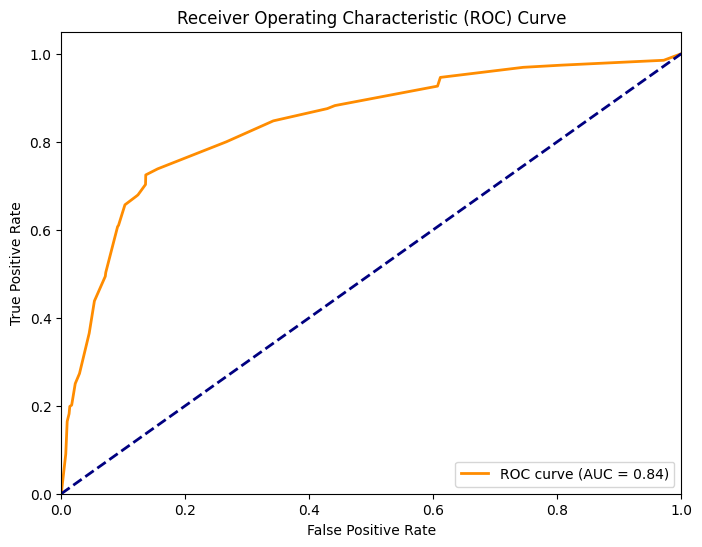

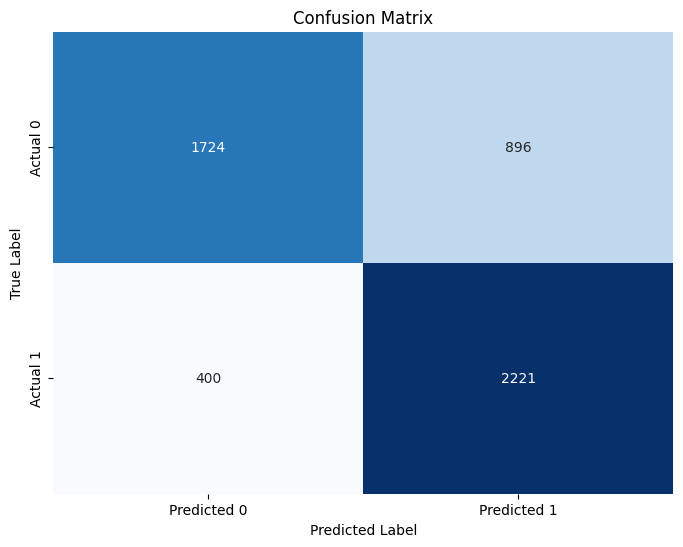

Model: MLPClassifier
Accuracy test: 0.7697 | Accuracy Training: 0.7154
F1-score test: 0.7820 | F1-score Training: 0.7078
roc_AUC-score test:0.8528 | roc_AUC-score Training:      0.7971
Differenza Accuracy: -0.0543
Differenza F1-score: -0.0743
Differenza AUC:      -0.0557

Importanza delle Feature (stimata con Permutation Importance) per MLP:
loan_amnt                       0.005190
person_income                   0.000916
person_age                      0.000000
person_emp_exp                  0.000000
loan_int_rate                   0.000000
cb_person_cred_hist_length      0.000000
credit_score                    0.000000
person_gender_male              0.000000
person_gender_None              0.000000
person_education_Bachelor       0.000000
person_education_Doctorate      0.000000
person_education_High School    0.000000
person_education_Master         0.000000
person_education_None           0.000000
person_home_ownership_OTHER     0.000000
person_home_ownership_OWN       0.000000


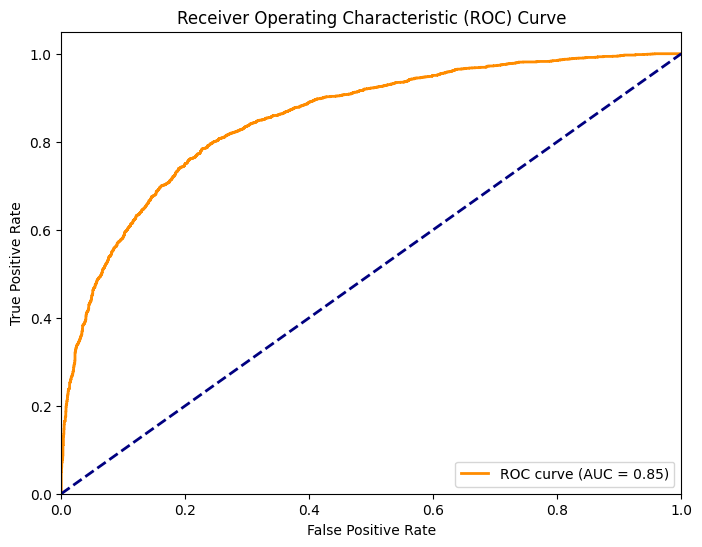

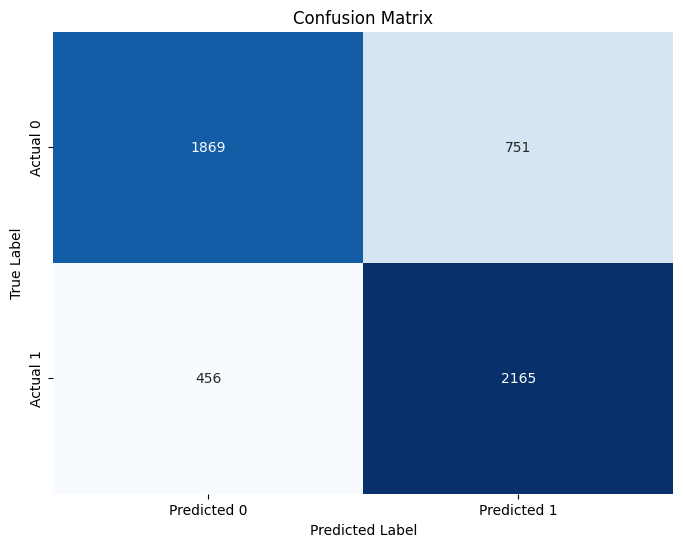

In [ ]:
main(data,MIA=0.5) # caso con mancanza dati 50%


MIA added:
numerical: 59991
strings: 34172

Model: GaussianNB
Accuracy test: 0.5394 | Accuracy Training: 0.5132
F1-score test: 0.6317 | F1-score Training: 0.6534
roc_AUC-score test:0.6245 | roc_AUC-score Training:      0.5699
Differenza Accuracy: -0.0262
Differenza F1-score: 0.0217
Differenza AUC:      -0.0547

Importanza delle Feature (stimata con Permutation Importance) per Gaussian Naive Bayes:
'loan_int_rate': 0.0162
'credit_score': 0.0082
'person_income': 0.0026
'person_home_ownership_RENT': 5.3425e-04
'loan_intent_EDUCATION': 2.6712e-04
'loan_intent_PERSONAL': 1.9080e-04
'person_gender_male': 1.9080e-04
'person_education_High School': 1.5264e-04
'loan_intent_HOMEIMPROVEMENT': 7.6321e-05
'loan_intent_VENTURE': 3.8161e-05
'loan_intent_MEDICAL': 3.8161e-05
'person_education_Bachelor': -3.8161e-05
'cb_person_cred_hist_length': -0.0011
'loan_amnt': -0.0047
'person_emp_exp': -0.0094
'person_age': -0.0095
AUC: 0.6245


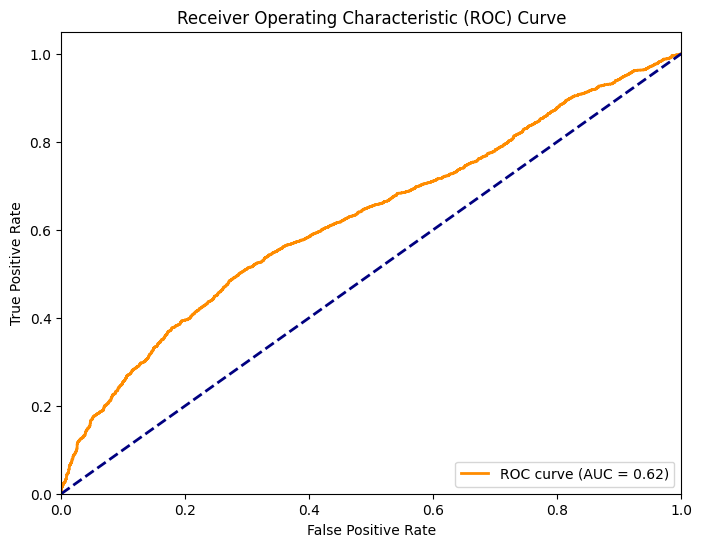

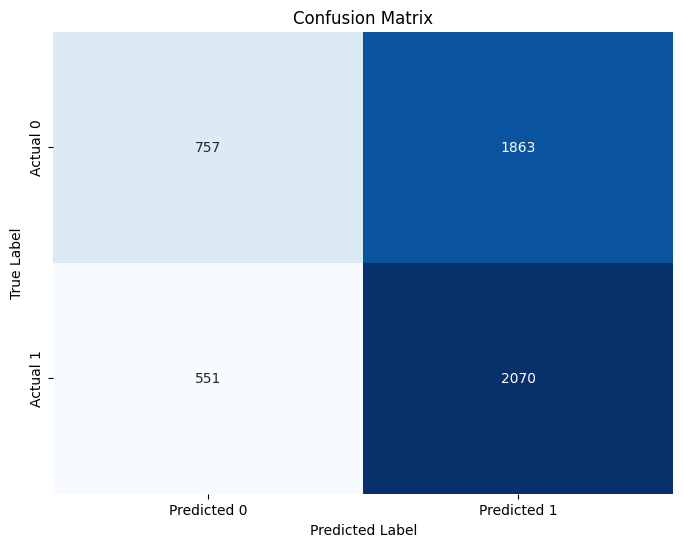

Model: DecisionTreeClassifier
Accuracy test: 0.7163 | Accuracy Training: 0.6110
F1-score test: 0.7208 | F1-score Training: 0.6865
roc_AUC-score test:0.7725 | roc_AUC-score Training:      0.6791
Differenza Accuracy: -0.1053
Differenza F1-score: -0.0342
Differenza AUC:      -0.0935
Importanza delle Feature per Decision Tree:
'loan_int_rate': 0.3846
'person_income': 0.3483
'person_home_ownership_None': 0.0888
'person_home_ownership_RENT': 0.0884
'loan_amnt': 0.0505
'person_emp_exp': 0.0118
'loan_intent_None': 0.0080
'person_age': 0.0062
'loan_intent_MEDICAL': 0.0045
'person_education_High School': 0.0020
'person_gender_male': 0.0020
'cb_person_cred_hist_length': 0.0020
'loan_intent_PERSONAL': 0.0013
'loan_intent_EDUCATION': 0.0011
'loan_intent_HOMEIMPROVEMENT': 3.7815e-04
AUC: 0.7725


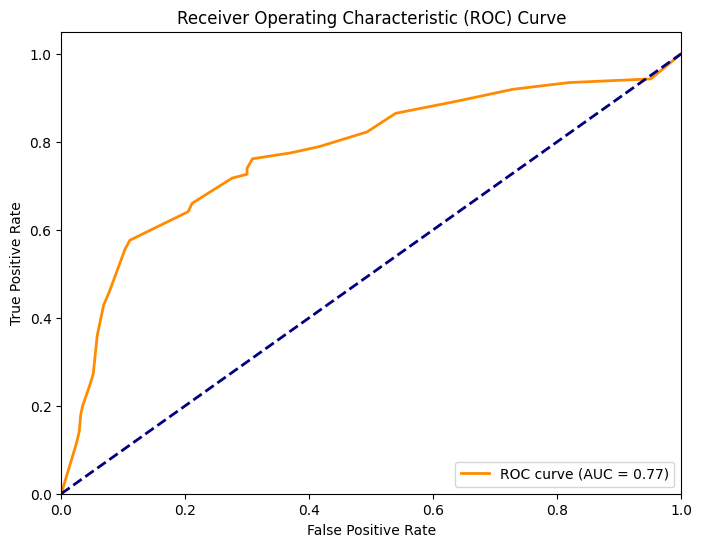

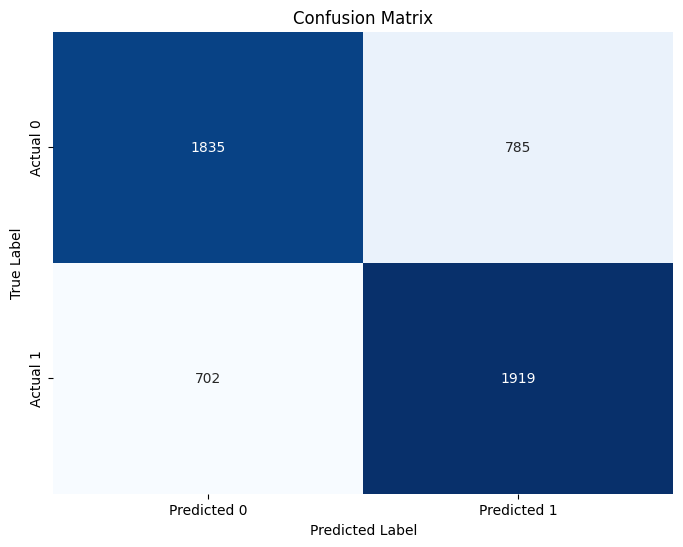

Model: MLPClassifier
Accuracy test: 0.7167 | Accuracy Training: 0.6708
F1-score test: 0.7364 | F1-score Training: 0.6699
roc_AUC-score test:0.7975 | roc_AUC-score Training:      0.7455
Differenza Accuracy: -0.0459
Differenza F1-score: -0.0665
Differenza AUC:      -0.0521

Importanza delle Feature (stimata con Permutation Importance) per MLP:
loan_amnt                       0.001030
person_income                   0.000038
person_age                      0.000000
person_emp_exp                  0.000000
loan_int_rate                   0.000000
cb_person_cred_hist_length      0.000000
credit_score                    0.000000
person_gender_male              0.000000
person_gender_None              0.000000
person_education_Bachelor       0.000000
person_education_Doctorate      0.000000
person_education_High School    0.000000
person_education_Master         0.000000
person_education_None           0.000000
person_home_ownership_OTHER     0.000000
person_home_ownership_OWN       0.000000


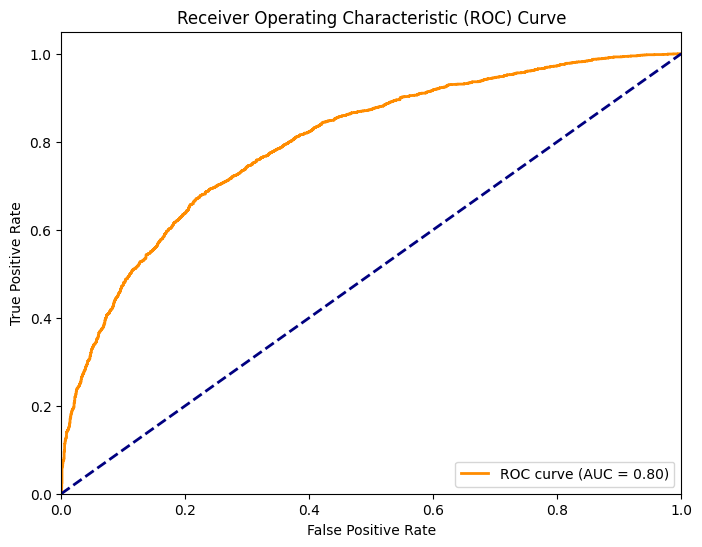

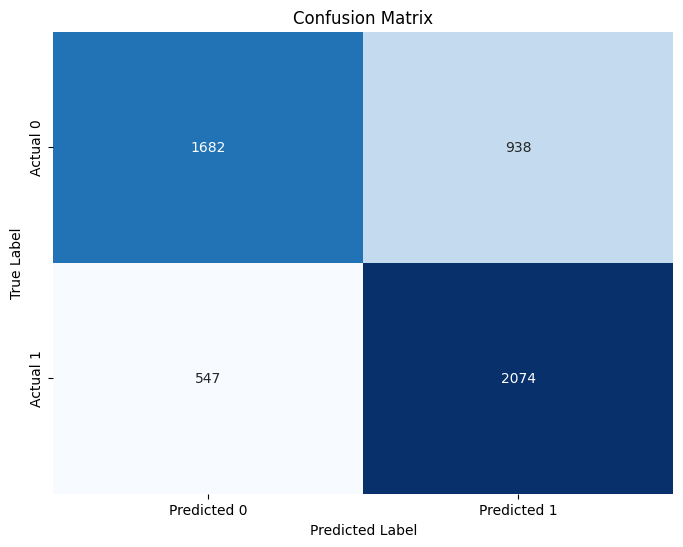

In [ ]:
main(data,MIA=0.7) # caso con mancanza dati 70%


MIA added:
numerical: 76964
strings: 44103

Model: GaussianNB
Accuracy test: 0.5562 | Accuracy Training: 0.5061
F1-score test: 0.5662 | F1-score Training: 0.6268
roc_AUC-score test:0.5900 | roc_AUC-score Training:      0.5255
Differenza Accuracy: -0.0501
Differenza F1-score: 0.0606
Differenza AUC:      -0.0645

Importanza delle Feature (stimata con Permutation Importance) per Gaussian Naive Bayes:
'loan_int_rate': 0.0321
'credit_score': 0.0148
'loan_amnt': 0.0124
'person_home_ownership_RENT': 0.0047
'loan_intent_MEDICAL': 5.3425e-04
'person_education_High School': 3.0529e-04
'loan_intent_VENTURE': 2.6712e-04
'loan_intent_EDUCATION': 2.6712e-04
'cb_person_cred_hist_length': 1.9080e-04
'loan_intent_PERSONAL': 1.1448e-04
'person_education_Doctorate': 7.6321e-05
'person_gender_male': 3.8161e-05
'person_home_ownership_OWN': 3.8161e-05
'person_home_ownership_OTHER': -3.8161e-05
'person_education_Master': -3.0529e-04
'person_age': -0.0022
'person_emp_exp': -0.0036
'person_income': -0.0047
AU

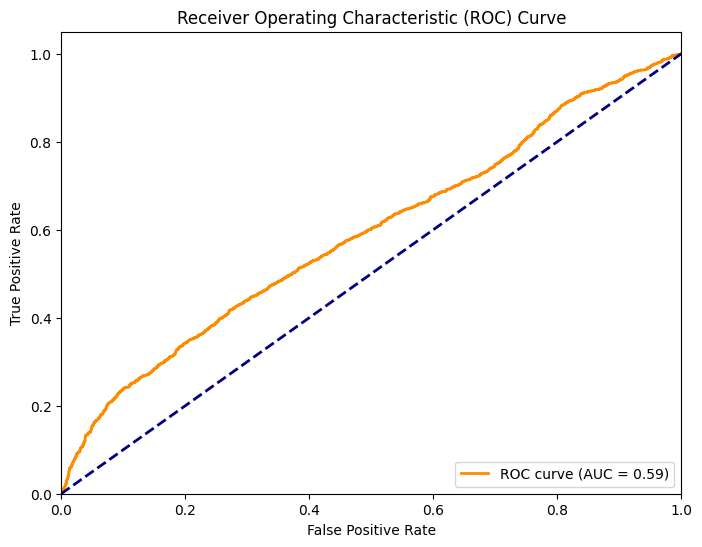

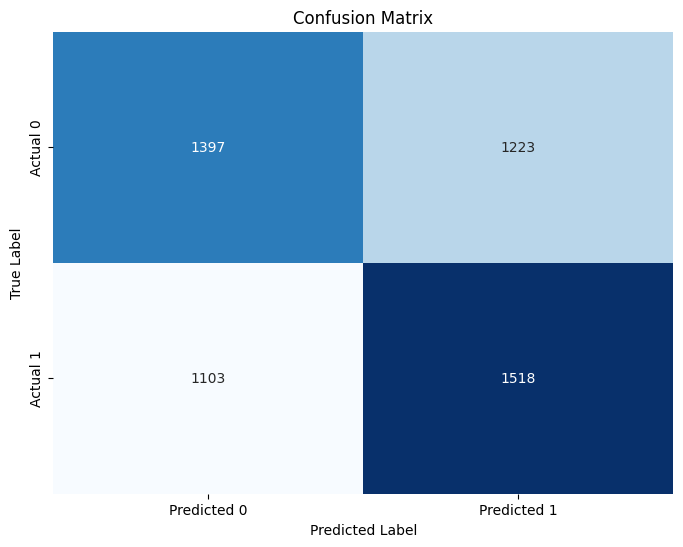

Model: DecisionTreeClassifier
Accuracy test: 0.6724 | Accuracy Training: 0.5406
F1-score test: 0.6800 | F1-score Training: 0.6710
roc_AUC-score test:0.6902 | roc_AUC-score Training:      0.5699
Differenza Accuracy: -0.1318
Differenza F1-score: -0.0090
Differenza AUC:      -0.1203
Importanza delle Feature per Decision Tree:
'loan_int_rate': 0.3811
'person_income': 0.2902
'person_home_ownership_RENT': 0.1212
'person_home_ownership_None': 0.1046
'credit_score': 0.0269
'loan_amnt': 0.0263
'person_age': 0.0215
'person_home_ownership_OWN': 0.0207
'person_education_Bachelor': 0.0071
'person_education_None': 4.7661e-04
AUC: 0.6902


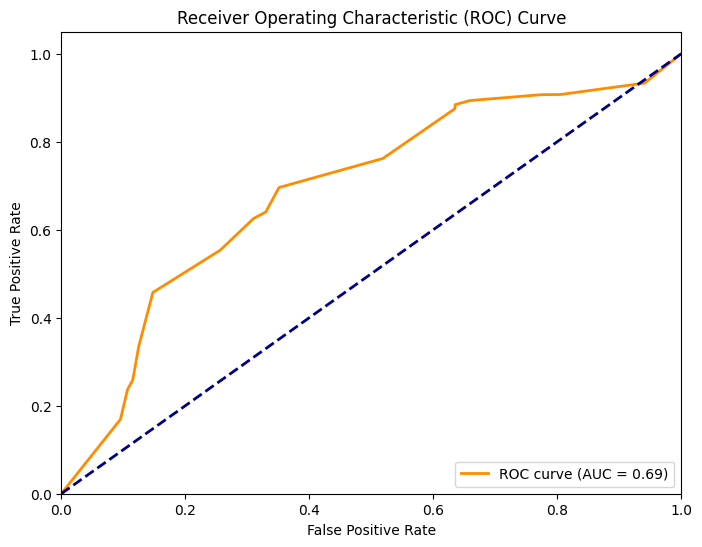

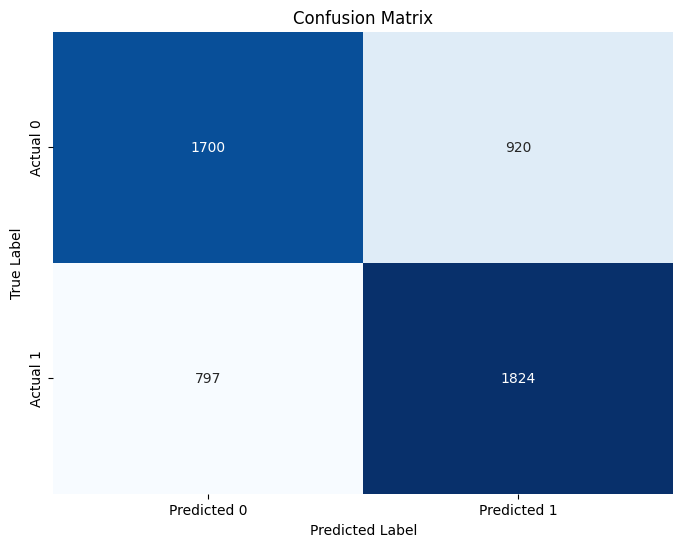

Model: MLPClassifier
Accuracy test: 0.6802 | Accuracy Training: 0.5767
F1-score test: 0.7216 | F1-score Training: 0.4608
roc_AUC-score test:0.7611 | roc_AUC-score Training:      0.6307
Differenza Accuracy: -0.1036
Differenza F1-score: -0.2608
Differenza AUC:      -0.1304

Importanza delle Feature (stimata con Permutation Importance) per MLP:
person_age                      0.0
person_income                   0.0
person_emp_exp                  0.0
loan_amnt                       0.0
loan_int_rate                   0.0
cb_person_cred_hist_length      0.0
credit_score                    0.0
person_gender_male              0.0
person_gender_None              0.0
person_education_Bachelor       0.0
person_education_Doctorate      0.0
person_education_High School    0.0
person_education_Master         0.0
person_education_None           0.0
person_home_ownership_OTHER     0.0
person_home_ownership_OWN       0.0
person_home_ownership_RENT      0.0
person_home_ownership_None      0.0
loan_int

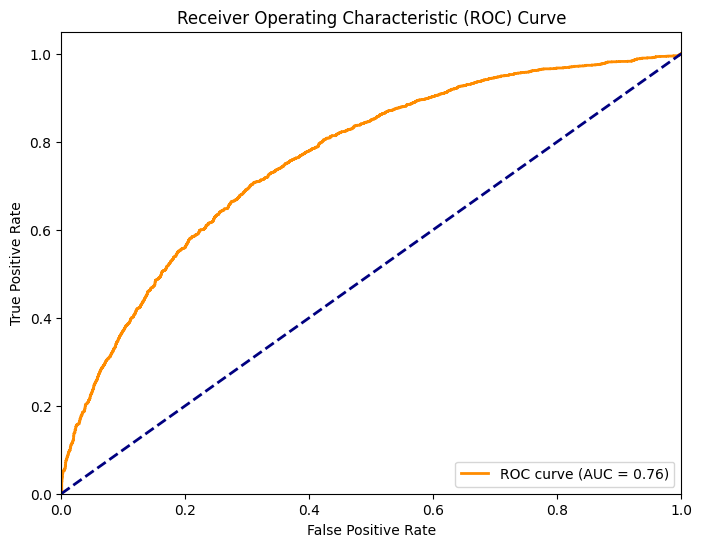

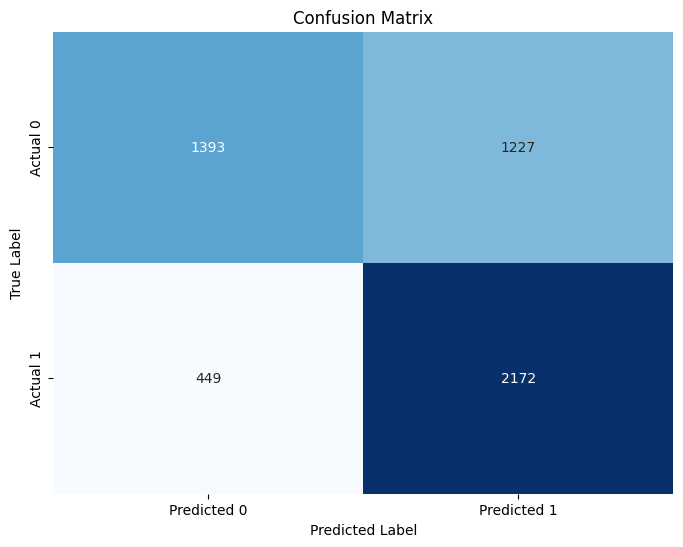

In [ ]:
main(data,MIA=0.9) # caso con mancanza dati 90%

## input_error 20-50%

/tmp/ipython-input-2607937929.py:179: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '24000,00' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df_unified.iloc[row_idx, col_idx] =f"{value:.2f}".replace('.', ',') # se è float sostituisci i . con le ,
/tmp/ipython-input-2607937929.py:179: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '3,00' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df_unified.iloc[row_idx, col_idx] =f"{value:.2f}".replace('.', ',') # se è float sostituisci i . con le ,
/tmp/ipython-input-2607937929.py:179: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '38,00' has dtype incompatible with float64, please explicitly cast to a compatible dtype 


input error types added:
loan_status: 2460
float_point_to_comma: 12313
int_swap_first_two_digits: 2997
str_swap_consecutive_char: 1594
str_duplicate_random_char: 1607
str_first_case_change: 1625
str_endswith_multiple_spaces: 1624
str_add_random_separator: 1644
str_add_new_line_char: 1601

Model: GaussianNB
Accuracy test: 0.6270 | Accuracy Training: 0.6351
F1-score test: 0.6935 | F1-score Training: 0.7023
roc_AUC-score test:0.7312 | roc_AUC-score Training:      0.7429
Differenza Accuracy: 0.0082
Differenza F1-score: 0.0087
Differenza AUC:      0.0116

Importanza delle Feature (stimata con Permutation Importance) per Gaussian Naive Bayes:
'loan_int_rate': 0.0532
'person_income': 0.0392
'credit_score': 0.0133
'loan_amnt': 0.0098
'person_home_ownership_RENT': 0.0012
'loan_intent_VENTURE': 3.4345e-04
'person_education_High School': 2.6712e-04
'loan_intent_EDUCATION': 1.9080e-04
'person_education_Bachelor': 1.5264e-04
'person_home_ownership_OWN': 1.1448e-04
'loan_intent_MEDICAL': 3.8161e-05

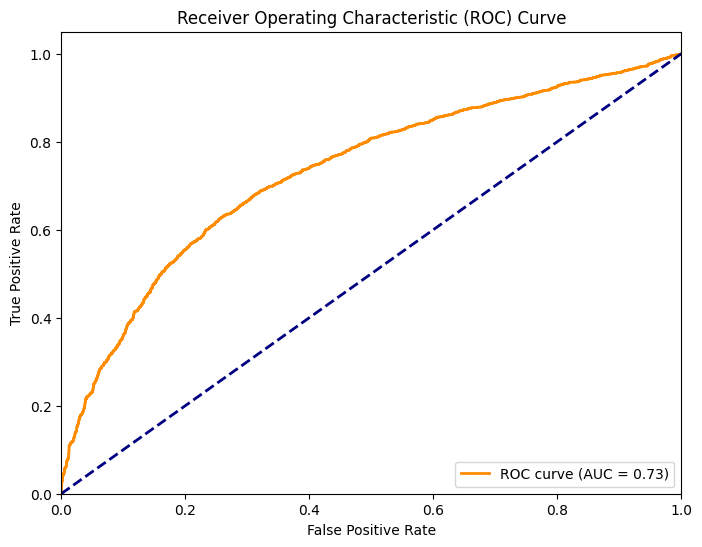

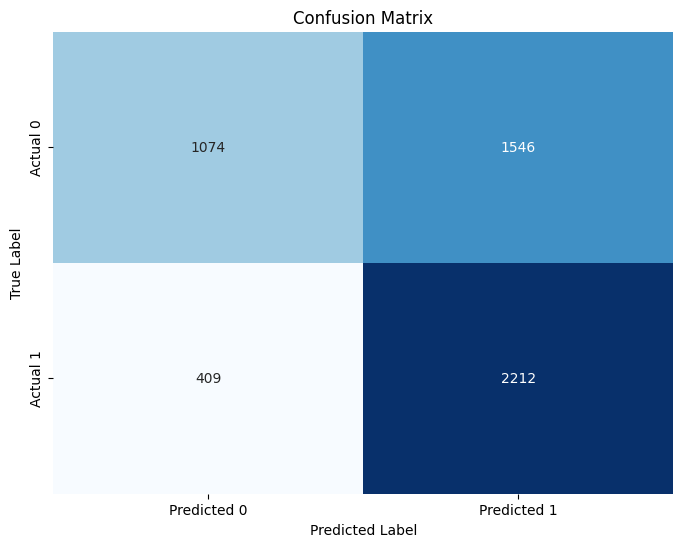

Model: DecisionTreeClassifier
Accuracy test: 0.8044 | Accuracy Training: 0.8145
F1-score test: 0.7891 | F1-score Training: 0.7999
roc_AUC-score test:0.8781 | roc_AUC-score Training:      0.8914
Differenza Accuracy: 0.0101
Differenza F1-score: 0.0107
Differenza AUC:      0.0133
Importanza delle Feature per Decision Tree:
'person_income': 0.3486
'loan_int_rate': 0.2915
'loan_amnt': 0.1348
'person_home_ownership_RENT': 0.1307
'credit_score': 0.0264
'person_home_ownership_OWN': 0.0159
'loan_intent_HOMEIMPROVEMENT': 0.0145
'loan_intent_MEDICAL': 0.0138
'loan_intent_VENTURE': 0.0068
'loan_intent_PERSONAL': 0.0063
'loan_intent_EDUCATION': 0.0059
'person_age': 0.0027
'cb_person_cred_hist_length': 0.0017
'person_education_Doctorate': 2.9884e-04
AUC: 0.8781


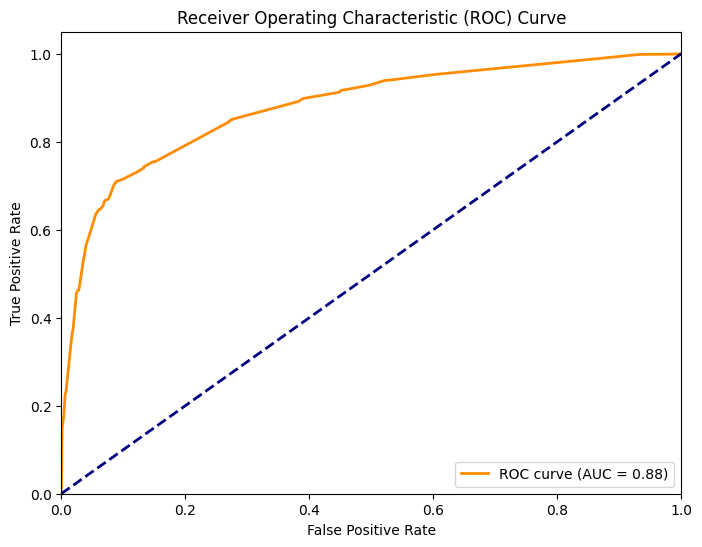

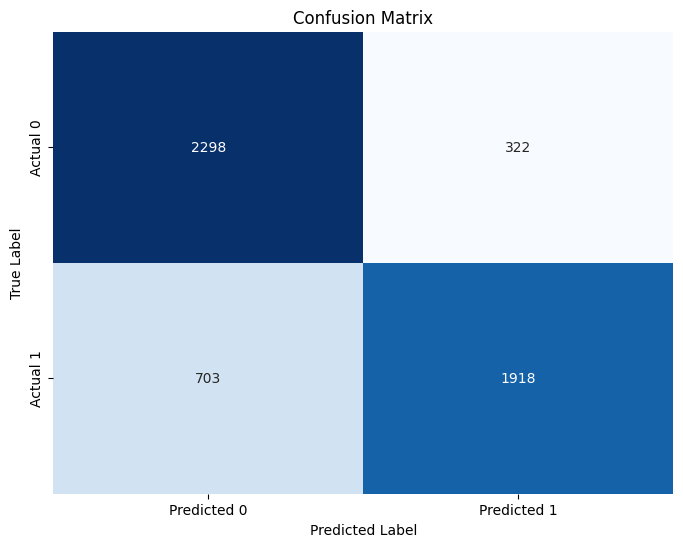

Model: MLPClassifier
Accuracy test: 0.8212 | Accuracy Training: 0.8376
F1-score test: 0.8144 | F1-score Training: 0.8320
roc_AUC-score test:0.8981 | roc_AUC-score Training:      0.9252
Differenza Accuracy: 0.0164
Differenza F1-score: 0.0176
Differenza AUC:      0.0271

Importanza delle Feature (stimata con Permutation Importance) per MLP:
person_age                      0.000000
person_emp_exp                  0.000000
cb_person_cred_hist_length      0.000000
loan_int_rate                   0.000000
person_home_ownership_OTHER     0.000000
person_home_ownership_OWN       0.000000
credit_score                    0.000000
person_gender_male              0.000000
person_education_Bachelor       0.000000
person_education_Doctorate      0.000000
person_education_High School    0.000000
person_education_Master         0.000000
loan_intent_HOMEIMPROVEMENT     0.000000
loan_intent_MEDICAL             0.000000
person_home_ownership_RENT      0.000000
loan_intent_EDUCATION           0.000000
loa

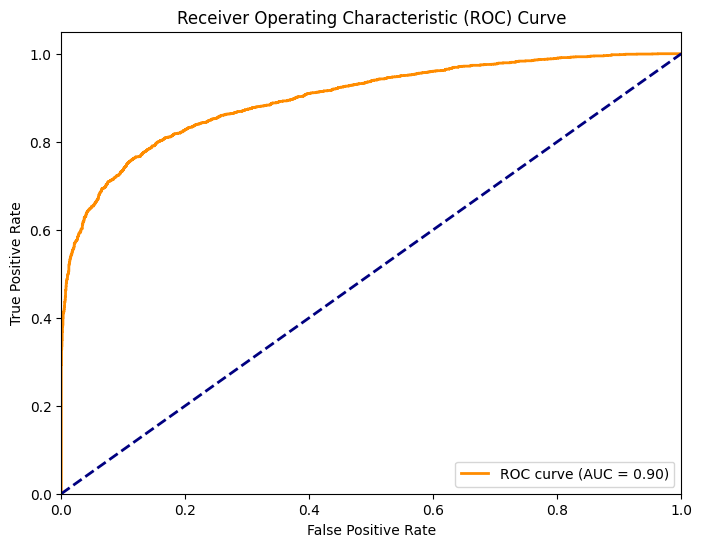

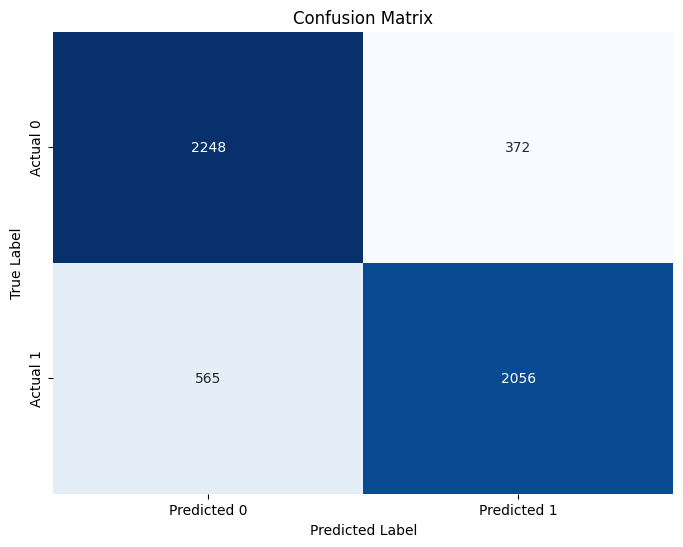

In [ ]:
main(data,input_err=0.2)

/tmp/ipython-input-2607937929.py:179: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '7,00' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df_unified.iloc[row_idx, col_idx] =f"{value:.2f}".replace('.', ',') # se è float sostituisci i . con le ,
/tmp/ipython-input-2607937929.py:179: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '30000,00' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df_unified.iloc[row_idx, col_idx] =f"{value:.2f}".replace('.', ',') # se è float sostituisci i . con le ,
/tmp/ipython-input-2607937929.py:179: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '23,00' has dtype incompatible with float64, please explicitly cast to a compatible dtype 


input error types added:
loan_status: 3670
float_point_to_comma: 18375
int_swap_first_two_digits: 4493
str_swap_consecutive_char: 2444
str_duplicate_random_char: 2467
str_first_case_change: 2416
str_endswith_multiple_spaces: 2402
str_add_random_separator: 2410
str_add_new_line_char: 2522

Model: GaussianNB
Accuracy test: 0.6270 | Accuracy Training: 0.6351
F1-score test: 0.6935 | F1-score Training: 0.7023
roc_AUC-score test:0.7312 | roc_AUC-score Training:      0.7429
Differenza Accuracy: 0.0082
Differenza F1-score: 0.0087
Differenza AUC:      0.0116

Importanza delle Feature (stimata con Permutation Importance) per Gaussian Naive Bayes:
'loan_int_rate': 0.0532
'person_income': 0.0392
'credit_score': 0.0133
'loan_amnt': 0.0098
'person_home_ownership_RENT': 0.0012
'loan_intent_VENTURE': 3.4345e-04
'person_education_High School': 2.6712e-04
'loan_intent_EDUCATION': 1.9080e-04
'person_education_Bachelor': 1.5264e-04
'person_home_ownership_OWN': 1.1448e-04
'loan_intent_MEDICAL': 3.8161e-05

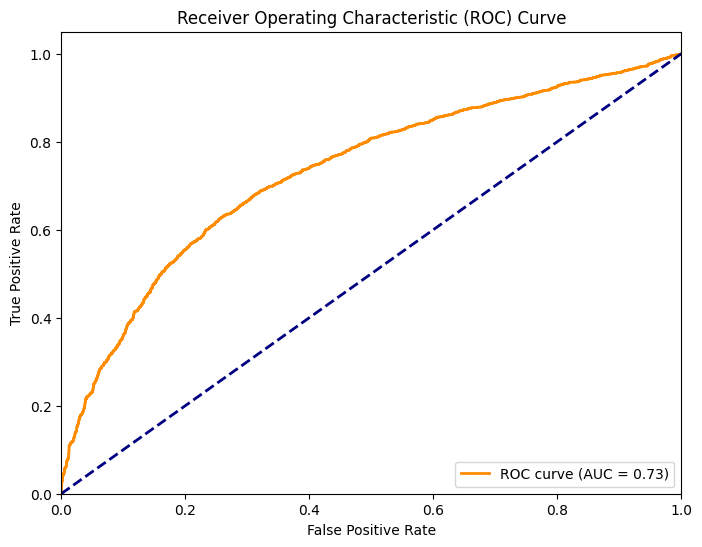

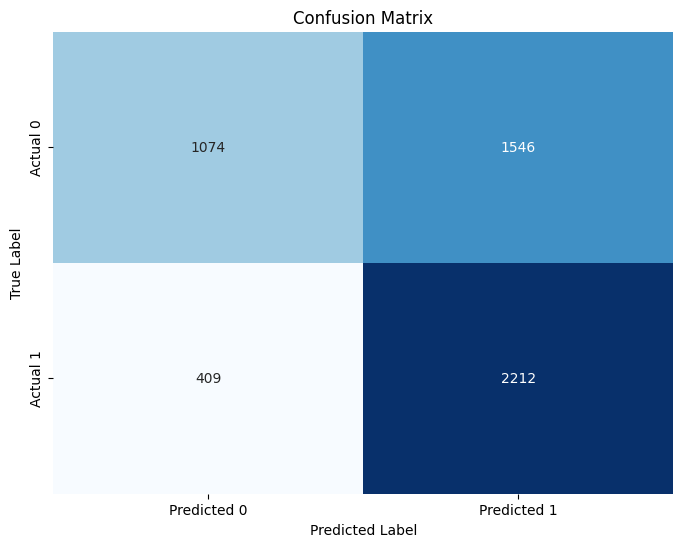

Model: DecisionTreeClassifier
Accuracy test: 0.8044 | Accuracy Training: 0.8145
F1-score test: 0.7891 | F1-score Training: 0.7999
roc_AUC-score test:0.8781 | roc_AUC-score Training:      0.8914
Differenza Accuracy: 0.0101
Differenza F1-score: 0.0107
Differenza AUC:      0.0133
Importanza delle Feature per Decision Tree:
'person_income': 0.3486
'loan_int_rate': 0.2915
'loan_amnt': 0.1348
'person_home_ownership_RENT': 0.1307
'credit_score': 0.0264
'person_home_ownership_OWN': 0.0159
'loan_intent_HOMEIMPROVEMENT': 0.0145
'loan_intent_MEDICAL': 0.0138
'loan_intent_VENTURE': 0.0068
'loan_intent_PERSONAL': 0.0063
'loan_intent_EDUCATION': 0.0059
'person_age': 0.0027
'cb_person_cred_hist_length': 0.0017
'person_education_Doctorate': 2.9884e-04
AUC: 0.8781


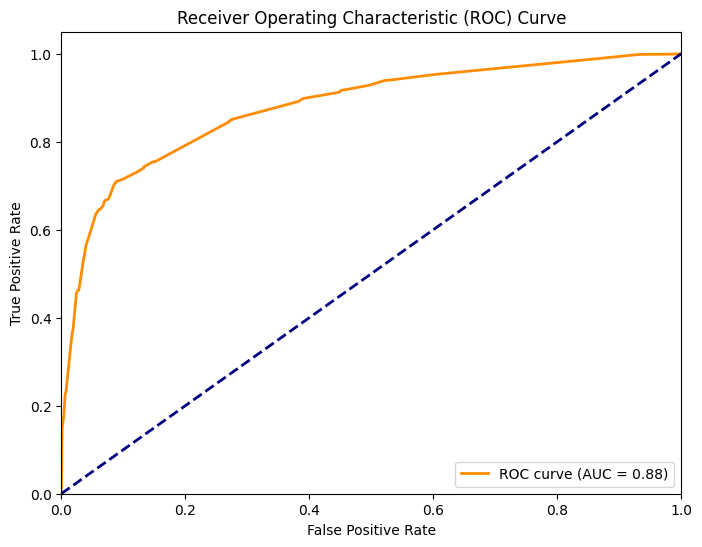

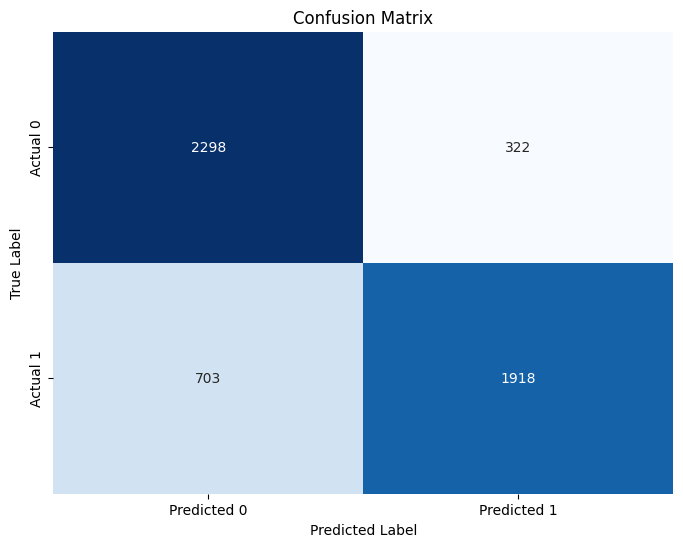

Model: MLPClassifier
Accuracy test: 0.8212 | Accuracy Training: 0.8376
F1-score test: 0.8144 | F1-score Training: 0.8320
roc_AUC-score test:0.8981 | roc_AUC-score Training:      0.9252
Differenza Accuracy: 0.0164
Differenza F1-score: 0.0176
Differenza AUC:      0.0271

Importanza delle Feature (stimata con Permutation Importance) per MLP:
person_age                      0.000000
person_emp_exp                  0.000000
cb_person_cred_hist_length      0.000000
loan_int_rate                   0.000000
person_home_ownership_OTHER     0.000000
person_home_ownership_OWN       0.000000
credit_score                    0.000000
person_gender_male              0.000000
person_education_Bachelor       0.000000
person_education_Doctorate      0.000000
person_education_High School    0.000000
person_education_Master         0.000000
loan_intent_HOMEIMPROVEMENT     0.000000
loan_intent_MEDICAL             0.000000
person_home_ownership_RENT      0.000000
loan_intent_EDUCATION           0.000000
loa

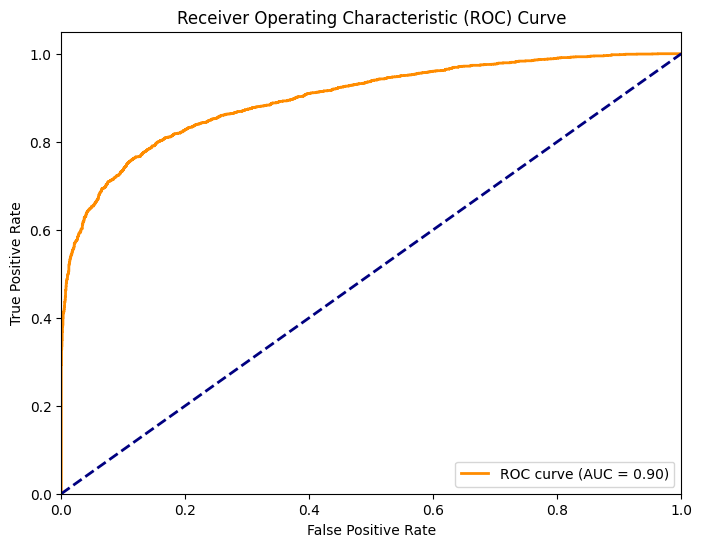

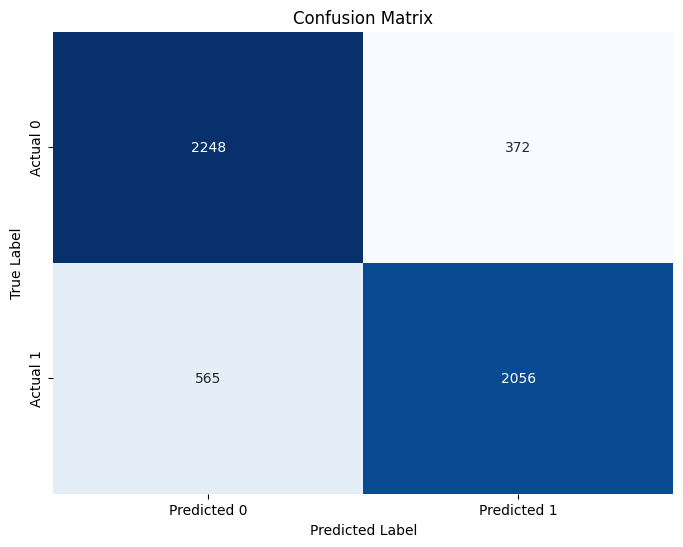

In [ ]:
main(data,input_err=0.3)

/tmp/ipython-input-2607937929.py:179: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '29,00' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df_unified.iloc[row_idx, col_idx] =f"{value:.2f}".replace('.', ',') # se è float sostituisci i . con le ,
/tmp/ipython-input-2607937929.py:179: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '2,00' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df_unified.iloc[row_idx, col_idx] =f"{value:.2f}".replace('.', ',') # se è float sostituisci i . con le ,
/tmp/ipython-input-2607937929.py:179: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '15,31' has dtype incompatible with float64, please explicitly cast to a compatible dtype fir


input error types added:
loan_status: 4848
float_point_to_comma: 24386
int_swap_first_two_digits: 6006
str_swap_consecutive_char: 3347
str_duplicate_random_char: 3320
str_first_case_change: 3174
str_endswith_multiple_spaces: 3233
str_add_random_separator: 3289
str_add_new_line_char: 3263

Model: GaussianNB
Accuracy test: 0.6270 | Accuracy Training: 0.6351
F1-score test: 0.6935 | F1-score Training: 0.7023
roc_AUC-score test:0.7312 | roc_AUC-score Training:      0.7429
Differenza Accuracy: 0.0082
Differenza F1-score: 0.0087
Differenza AUC:      0.0116

Importanza delle Feature (stimata con Permutation Importance) per Gaussian Naive Bayes:
'loan_int_rate': 0.0532
'person_income': 0.0392
'credit_score': 0.0133
'loan_amnt': 0.0098
'person_home_ownership_RENT': 0.0012
'loan_intent_VENTURE': 3.4345e-04
'person_education_High School': 2.6712e-04
'loan_intent_EDUCATION': 1.9080e-04
'person_education_Bachelor': 1.5264e-04
'person_home_ownership_OWN': 1.1448e-04
'loan_intent_MEDICAL': 3.8161e-05

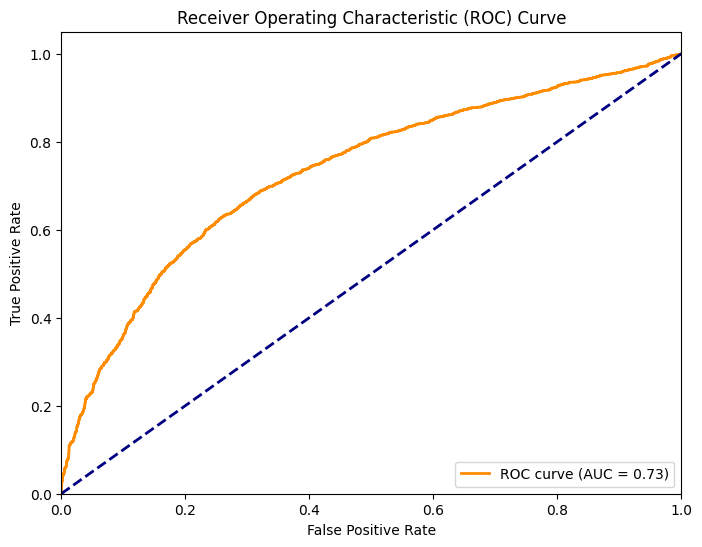

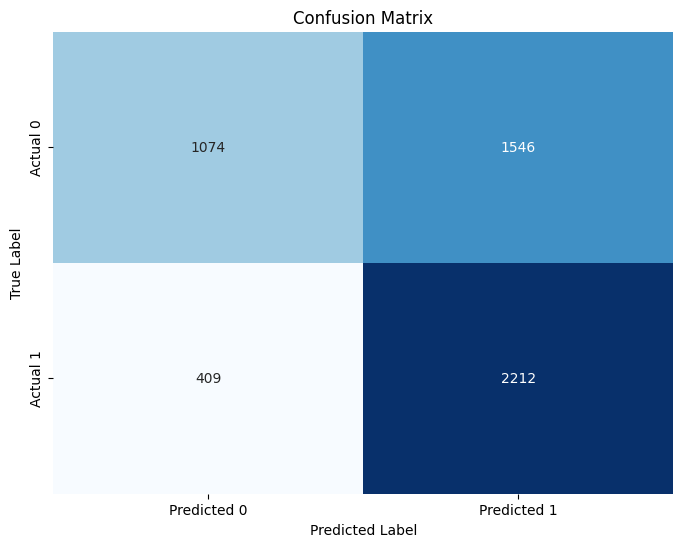

Model: DecisionTreeClassifier
Accuracy test: 0.8044 | Accuracy Training: 0.8145
F1-score test: 0.7891 | F1-score Training: 0.7999
roc_AUC-score test:0.8781 | roc_AUC-score Training:      0.8914
Differenza Accuracy: 0.0101
Differenza F1-score: 0.0107
Differenza AUC:      0.0133
Importanza delle Feature per Decision Tree:
'person_income': 0.3486
'loan_int_rate': 0.2915
'loan_amnt': 0.1348
'person_home_ownership_RENT': 0.1307
'credit_score': 0.0264
'person_home_ownership_OWN': 0.0159
'loan_intent_HOMEIMPROVEMENT': 0.0145
'loan_intent_MEDICAL': 0.0138
'loan_intent_VENTURE': 0.0068
'loan_intent_PERSONAL': 0.0063
'loan_intent_EDUCATION': 0.0059
'person_age': 0.0027
'cb_person_cred_hist_length': 0.0017
'person_education_Doctorate': 2.9884e-04
AUC: 0.8781


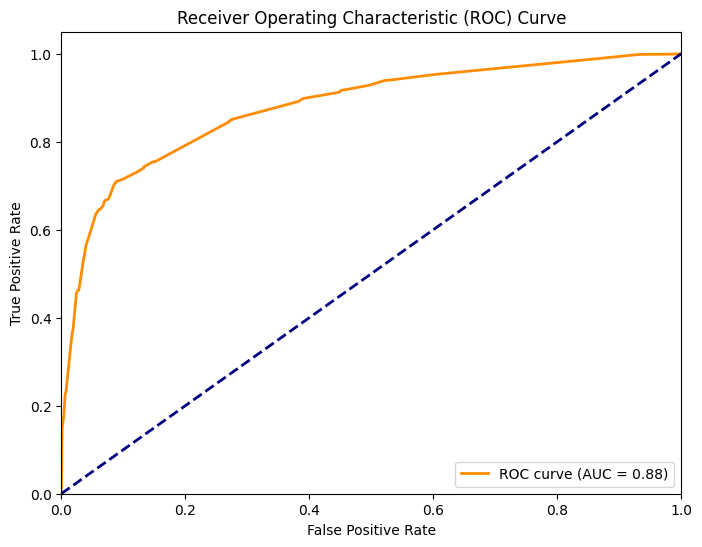

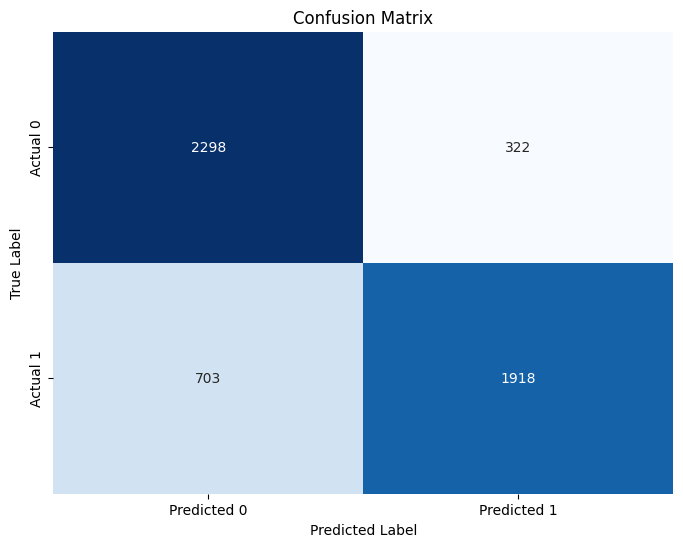

Model: MLPClassifier
Accuracy test: 0.8212 | Accuracy Training: 0.8376
F1-score test: 0.8144 | F1-score Training: 0.8320
roc_AUC-score test:0.8981 | roc_AUC-score Training:      0.9252
Differenza Accuracy: 0.0164
Differenza F1-score: 0.0176
Differenza AUC:      0.0271

Importanza delle Feature (stimata con Permutation Importance) per MLP:
person_age                      0.000000
person_emp_exp                  0.000000
cb_person_cred_hist_length      0.000000
loan_int_rate                   0.000000
person_home_ownership_OTHER     0.000000
person_home_ownership_OWN       0.000000
credit_score                    0.000000
person_gender_male              0.000000
person_education_Bachelor       0.000000
person_education_Doctorate      0.000000
person_education_High School    0.000000
person_education_Master         0.000000
loan_intent_HOMEIMPROVEMENT     0.000000
loan_intent_MEDICAL             0.000000
person_home_ownership_RENT      0.000000
loan_intent_EDUCATION           0.000000
loa

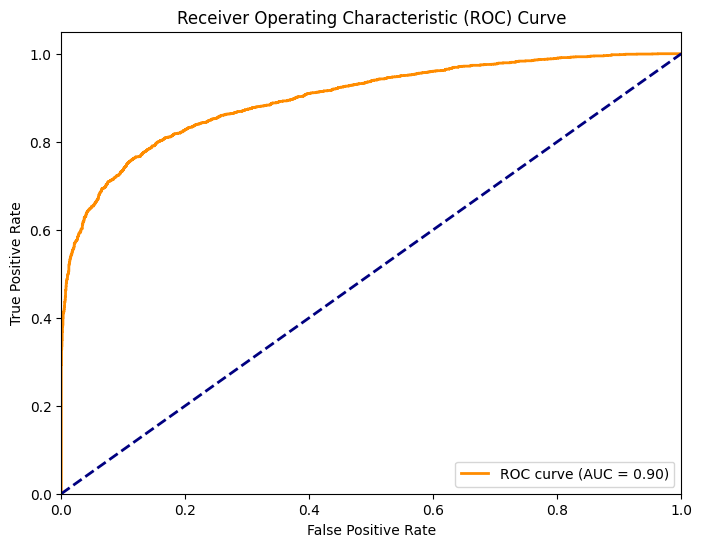

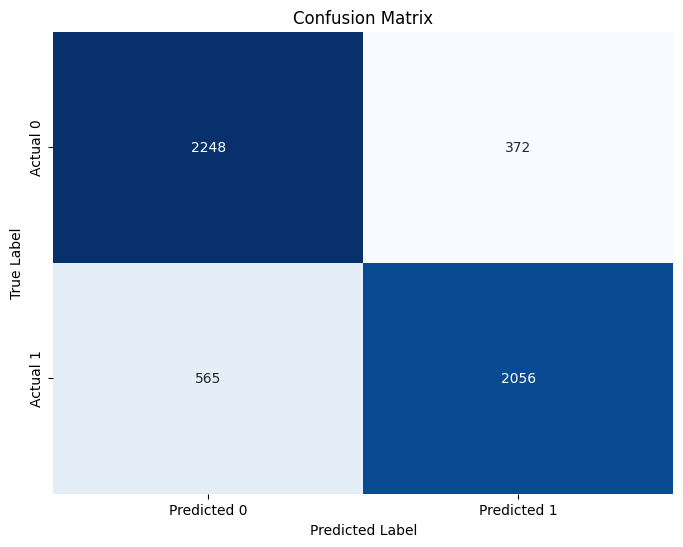

In [ ]:
main(data,input_err=0.4)

/tmp/ipython-input-2607937929.py:179: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '121220,00' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df_unified.iloc[row_idx, col_idx] =f"{value:.2f}".replace('.', ',') # se è float sostituisci i . con le ,
/tmp/ipython-input-2607937929.py:179: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '5,00' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df_unified.iloc[row_idx, col_idx] =f"{value:.2f}".replace('.', ',') # se è float sostituisci i . con le ,
/tmp/ipython-input-2607937929.py:179: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '4000,00' has dtype incompatible with float64, please explicitly cast to a compatible dty


input error types added:
loan_status: 6163
float_point_to_comma: 30610
int_swap_first_two_digits: 7534
str_swap_consecutive_char: 4073
str_duplicate_random_char: 4026
str_first_case_change: 4017
str_endswith_multiple_spaces: 4022
str_add_random_separator: 4068
str_add_new_line_char: 4085

Model: GaussianNB
Accuracy test: 0.6270 | Accuracy Training: 0.6351
F1-score test: 0.6935 | F1-score Training: 0.7023
roc_AUC-score test:0.7312 | roc_AUC-score Training:      0.7429
Differenza Accuracy: 0.0082
Differenza F1-score: 0.0087
Differenza AUC:      0.0116

Importanza delle Feature (stimata con Permutation Importance) per Gaussian Naive Bayes:
'loan_int_rate': 0.0532
'person_income': 0.0392
'credit_score': 0.0133
'loan_amnt': 0.0098
'person_home_ownership_RENT': 0.0012
'loan_intent_VENTURE': 3.4345e-04
'person_education_High School': 2.6712e-04
'loan_intent_EDUCATION': 1.9080e-04
'person_education_Bachelor': 1.5264e-04
'person_home_ownership_OWN': 1.1448e-04
'loan_intent_MEDICAL': 3.8161e-05

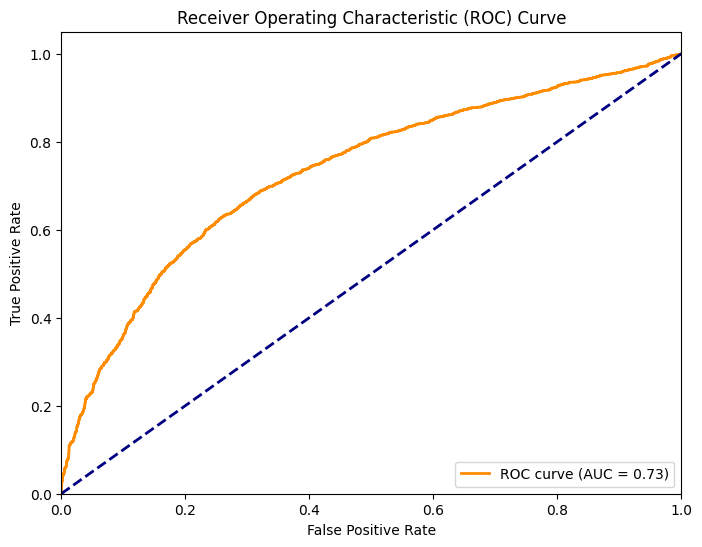

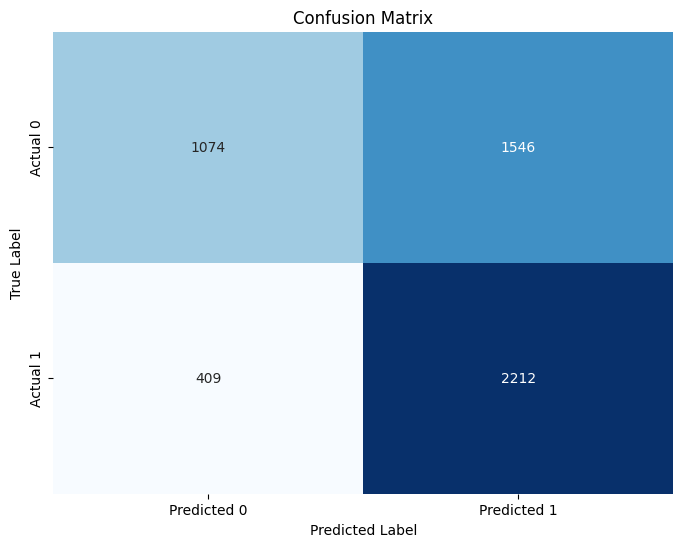

Model: DecisionTreeClassifier
Accuracy test: 0.8044 | Accuracy Training: 0.8145
F1-score test: 0.7891 | F1-score Training: 0.7999
roc_AUC-score test:0.8781 | roc_AUC-score Training:      0.8914
Differenza Accuracy: 0.0101
Differenza F1-score: 0.0107
Differenza AUC:      0.0133
Importanza delle Feature per Decision Tree:
'person_income': 0.3486
'loan_int_rate': 0.2915
'loan_amnt': 0.1348
'person_home_ownership_RENT': 0.1307
'credit_score': 0.0264
'person_home_ownership_OWN': 0.0159
'loan_intent_HOMEIMPROVEMENT': 0.0145
'loan_intent_MEDICAL': 0.0138
'loan_intent_VENTURE': 0.0068
'loan_intent_PERSONAL': 0.0063
'loan_intent_EDUCATION': 0.0059
'person_age': 0.0027
'cb_person_cred_hist_length': 0.0017
'person_education_Doctorate': 2.9884e-04
AUC: 0.8781


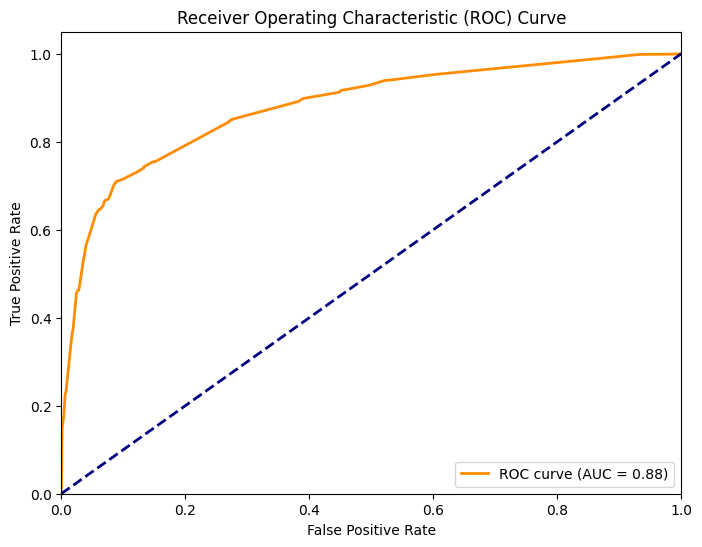

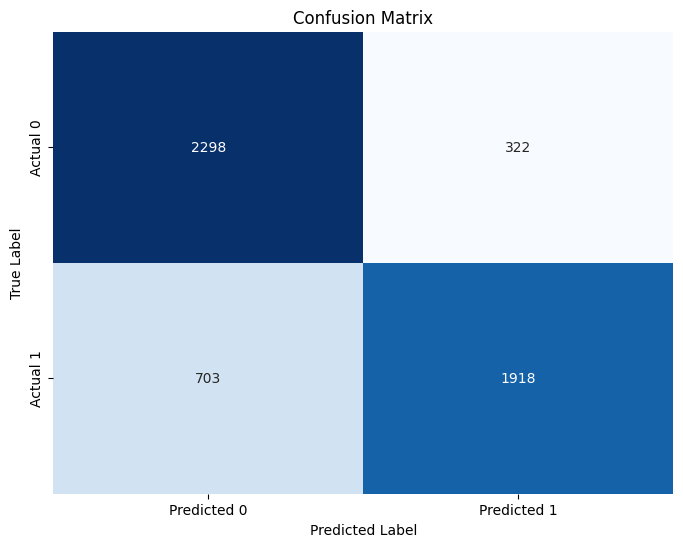

Model: MLPClassifier
Accuracy test: 0.8212 | Accuracy Training: 0.8376
F1-score test: 0.8144 | F1-score Training: 0.8320
roc_AUC-score test:0.8981 | roc_AUC-score Training:      0.9252
Differenza Accuracy: 0.0164
Differenza F1-score: 0.0176
Differenza AUC:      0.0271

Importanza delle Feature (stimata con Permutation Importance) per MLP:
person_age                      0.000000
person_emp_exp                  0.000000
cb_person_cred_hist_length      0.000000
loan_int_rate                   0.000000
person_home_ownership_OTHER     0.000000
person_home_ownership_OWN       0.000000
credit_score                    0.000000
person_gender_male              0.000000
person_education_Bachelor       0.000000
person_education_Doctorate      0.000000
person_education_High School    0.000000
person_education_Master         0.000000
loan_intent_HOMEIMPROVEMENT     0.000000
loan_intent_MEDICAL             0.000000
person_home_ownership_RENT      0.000000
loan_intent_EDUCATION           0.000000
loa

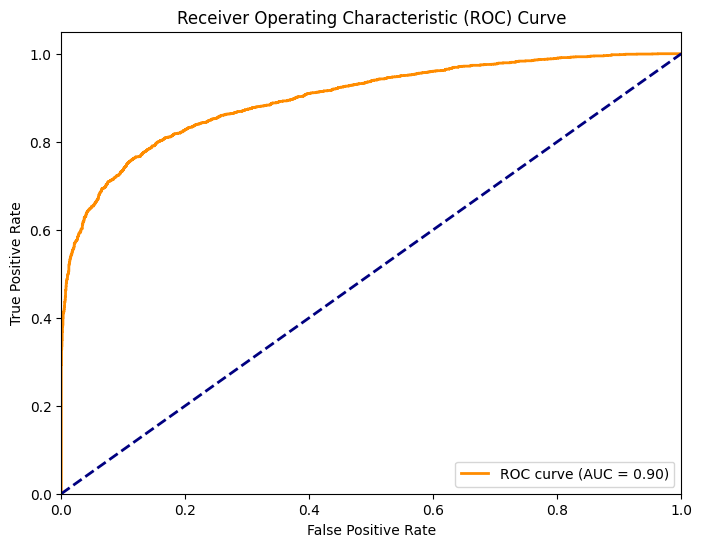

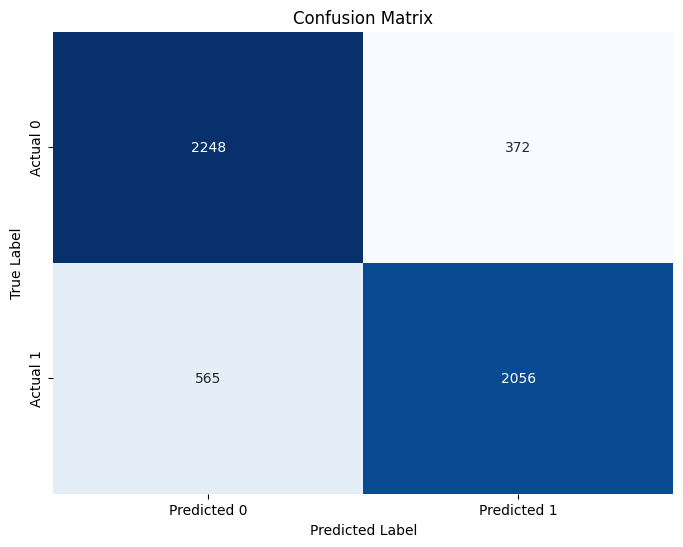

In [ ]:
main(data,input_err=0.5)

/tmp/ipython-input-2607937929.py:179: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '52741,00' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df_unified.iloc[row_idx, col_idx] =f"{value:.2f}".replace('.', ',') # se è float sostituisci i . con le ,
/tmp/ipython-input-2607937929.py:179: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '4,00' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df_unified.iloc[row_idx, col_idx] =f"{value:.2f}".replace('.', ',') # se è float sostituisci i . con le ,
/tmp/ipython-input-2607937929.py:179: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '15,96' has dtype incompatible with float64, please explicitly cast to a compatible dtype 


input error types added:
loan_status: 7354
float_point_to_comma: 36703
int_swap_first_two_digits: 9027
str_swap_consecutive_char: 4914
str_duplicate_random_char: 4842
str_first_case_change: 4839
str_endswith_multiple_spaces: 4812
str_add_random_separator: 4929
str_add_new_line_char: 4861

Model: GaussianNB
Accuracy test: 0.6270 | Accuracy Training: 0.6351
F1-score test: 0.6935 | F1-score Training: 0.7023
roc_AUC-score test:0.7312 | roc_AUC-score Training:      0.7429
Differenza Accuracy: 0.0082
Differenza F1-score: 0.0087
Differenza AUC:      0.0116

Importanza delle Feature (stimata con Permutation Importance) per Gaussian Naive Bayes:
'loan_int_rate': 0.0532
'person_income': 0.0392
'credit_score': 0.0133
'loan_amnt': 0.0098
'person_home_ownership_RENT': 0.0012
'loan_intent_VENTURE': 3.4345e-04
'person_education_High School': 2.6712e-04
'loan_intent_EDUCATION': 1.9080e-04
'person_education_Bachelor': 1.5264e-04
'person_home_ownership_OWN': 1.1448e-04
'loan_intent_MEDICAL': 3.8161e-05

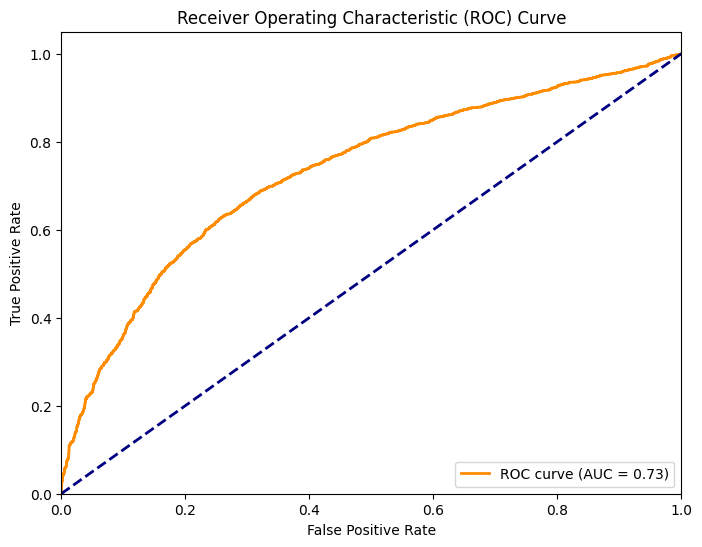

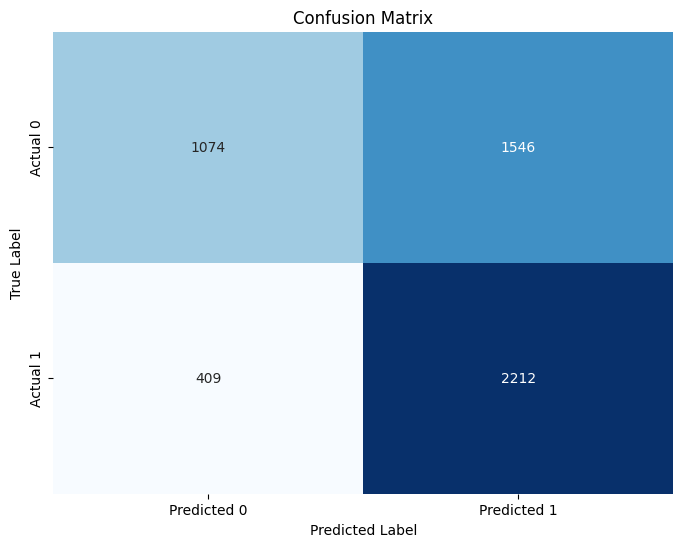

Model: DecisionTreeClassifier
Accuracy test: 0.8044 | Accuracy Training: 0.8145
F1-score test: 0.7891 | F1-score Training: 0.7999
roc_AUC-score test:0.8781 | roc_AUC-score Training:      0.8914
Differenza Accuracy: 0.0101
Differenza F1-score: 0.0107
Differenza AUC:      0.0133
Importanza delle Feature per Decision Tree:
'person_income': 0.3486
'loan_int_rate': 0.2915
'loan_amnt': 0.1348
'person_home_ownership_RENT': 0.1307
'credit_score': 0.0264
'person_home_ownership_OWN': 0.0159
'loan_intent_HOMEIMPROVEMENT': 0.0145
'loan_intent_MEDICAL': 0.0138
'loan_intent_VENTURE': 0.0068
'loan_intent_PERSONAL': 0.0063
'loan_intent_EDUCATION': 0.0059
'person_age': 0.0027
'cb_person_cred_hist_length': 0.0017
'person_education_Doctorate': 2.9884e-04
AUC: 0.8781


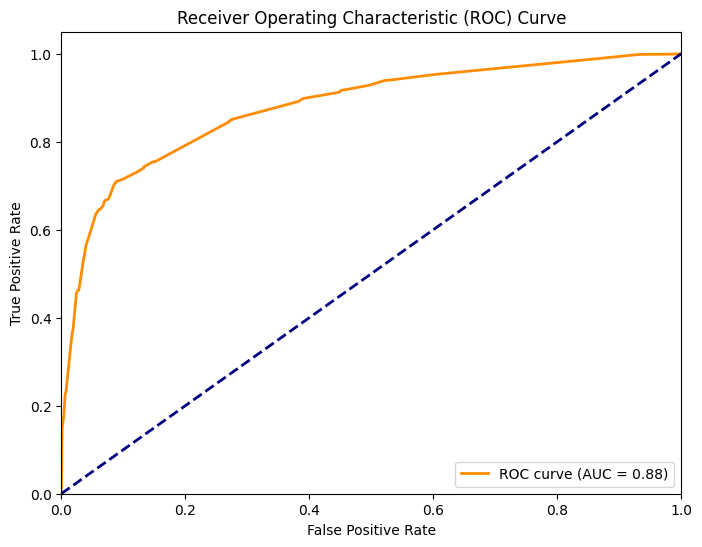

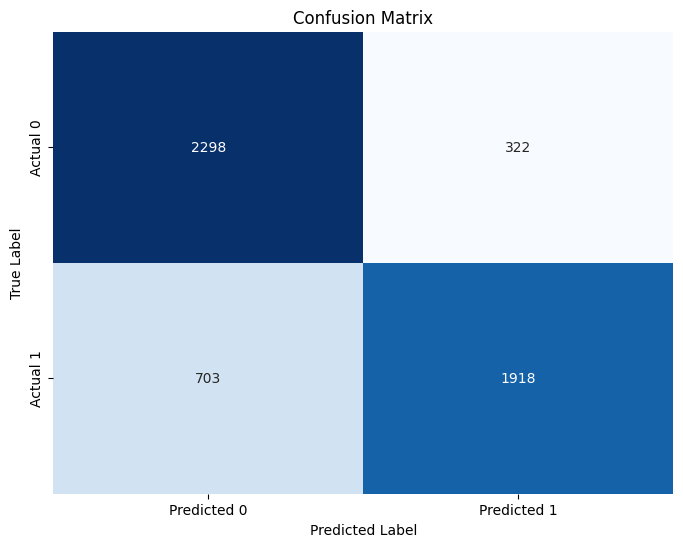

Model: MLPClassifier
Accuracy test: 0.8212 | Accuracy Training: 0.8376
F1-score test: 0.8144 | F1-score Training: 0.8320
roc_AUC-score test:0.8981 | roc_AUC-score Training:      0.9252
Differenza Accuracy: 0.0164
Differenza F1-score: 0.0176
Differenza AUC:      0.0271

Importanza delle Feature (stimata con Permutation Importance) per MLP:
person_age                      0.000000
person_emp_exp                  0.000000
cb_person_cred_hist_length      0.000000
loan_int_rate                   0.000000
person_home_ownership_OTHER     0.000000
person_home_ownership_OWN       0.000000
credit_score                    0.000000
person_gender_male              0.000000
person_education_Bachelor       0.000000
person_education_Doctorate      0.000000
person_education_High School    0.000000
person_education_Master         0.000000
loan_intent_HOMEIMPROVEMENT     0.000000
loan_intent_MEDICAL             0.000000
person_home_ownership_RENT      0.000000
loan_intent_EDUCATION           0.000000
loa

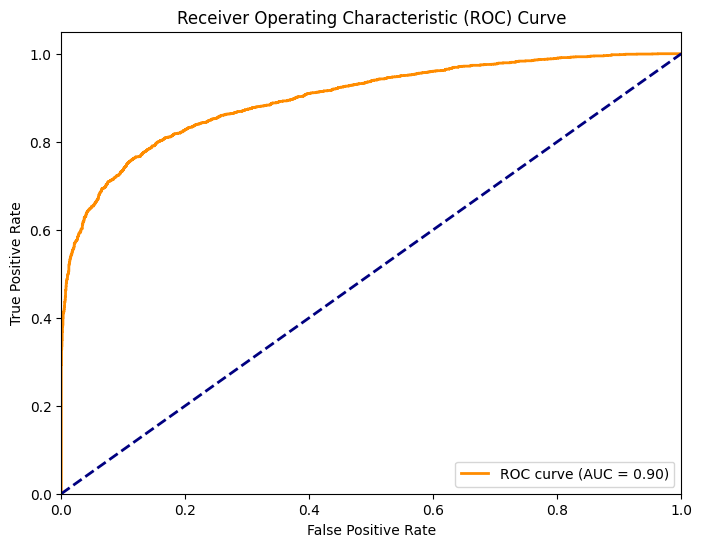

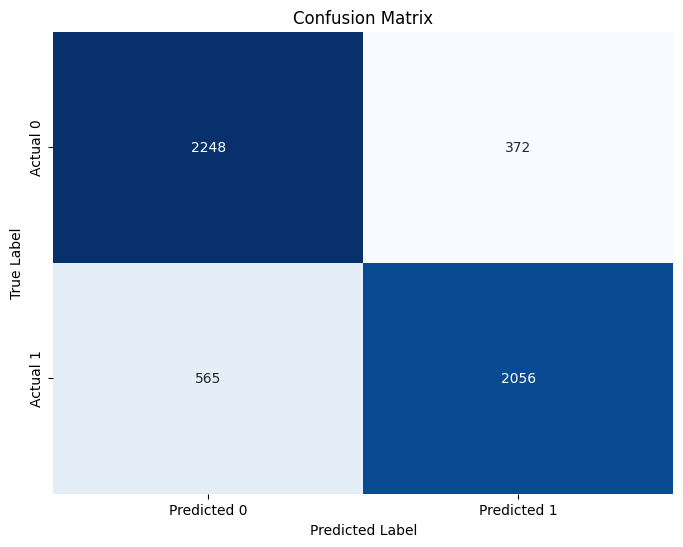

In [ ]:
main(data,input_err=0.6)

/tmp/ipython-input-2607937929.py:179: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '30,00' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df_unified.iloc[row_idx, col_idx] =f"{value:.2f}".replace('.', ',') # se è float sostituisci i . con le ,
/tmp/ipython-input-2607937929.py:179: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '39534,00' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df_unified.iloc[row_idx, col_idx] =f"{value:.2f}".replace('.', ',') # se è float sostituisci i . con le ,
/tmp/ipython-input-2607937929.py:179: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '1700,00' has dtype incompatible with float64, please explicitly cast to a compatible dty


input error types added:
loan_status: 8526
float_point_to_comma: 42831
int_swap_first_two_digits: 10443
str_swap_consecutive_char: 5877
str_duplicate_random_char: 5604
str_first_case_change: 5788
str_endswith_multiple_spaces: 5672
str_add_random_separator: 5579
str_add_new_line_char: 5779

Model: GaussianNB
Accuracy test: 0.6270 | Accuracy Training: 0.6351
F1-score test: 0.6935 | F1-score Training: 0.7023
roc_AUC-score test:0.7312 | roc_AUC-score Training:      0.7429
Differenza Accuracy: 0.0082
Differenza F1-score: 0.0087
Differenza AUC:      0.0116

Importanza delle Feature (stimata con Permutation Importance) per Gaussian Naive Bayes:
'loan_int_rate': 0.0532
'person_income': 0.0392
'credit_score': 0.0133
'loan_amnt': 0.0098
'person_home_ownership_RENT': 0.0012
'loan_intent_VENTURE': 3.4345e-04
'person_education_High School': 2.6712e-04
'loan_intent_EDUCATION': 1.9080e-04
'person_education_Bachelor': 1.5264e-04
'person_home_ownership_OWN': 1.1448e-04
'loan_intent_MEDICAL': 3.8161e-0

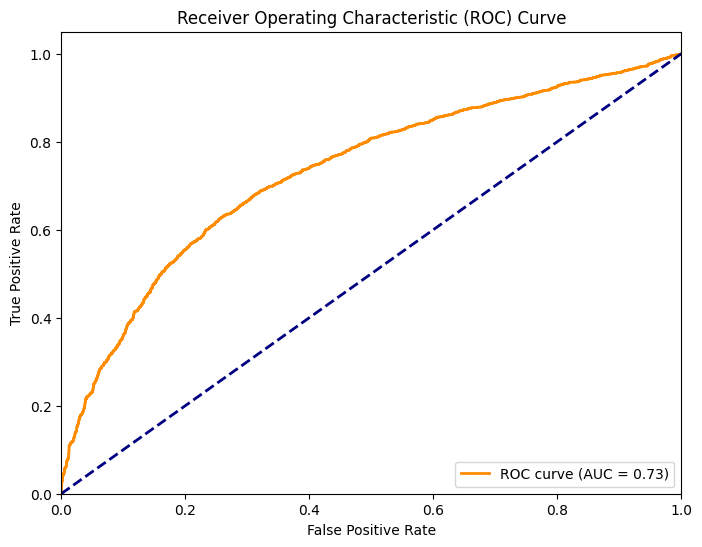

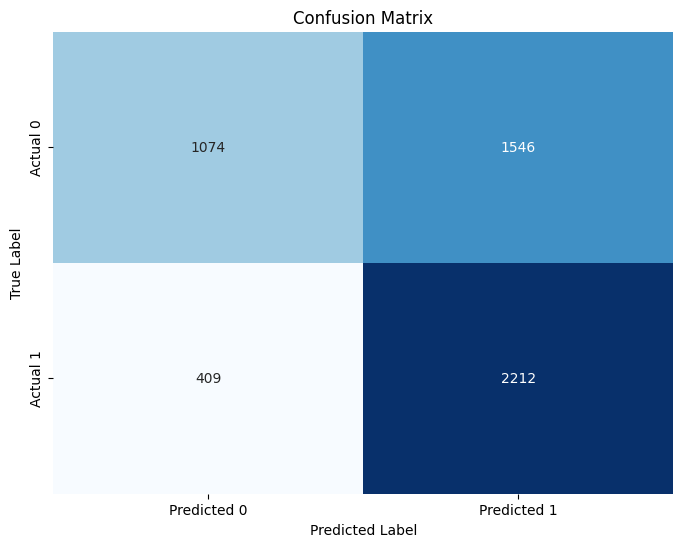

Model: DecisionTreeClassifier
Accuracy test: 0.8044 | Accuracy Training: 0.8145
F1-score test: 0.7891 | F1-score Training: 0.7999
roc_AUC-score test:0.8781 | roc_AUC-score Training:      0.8914
Differenza Accuracy: 0.0101
Differenza F1-score: 0.0107
Differenza AUC:      0.0133
Importanza delle Feature per Decision Tree:
'person_income': 0.3486
'loan_int_rate': 0.2915
'loan_amnt': 0.1348
'person_home_ownership_RENT': 0.1307
'credit_score': 0.0264
'person_home_ownership_OWN': 0.0159
'loan_intent_HOMEIMPROVEMENT': 0.0145
'loan_intent_MEDICAL': 0.0138
'loan_intent_VENTURE': 0.0068
'loan_intent_PERSONAL': 0.0063
'loan_intent_EDUCATION': 0.0059
'person_age': 0.0027
'cb_person_cred_hist_length': 0.0017
'person_education_Doctorate': 2.9884e-04
AUC: 0.8781


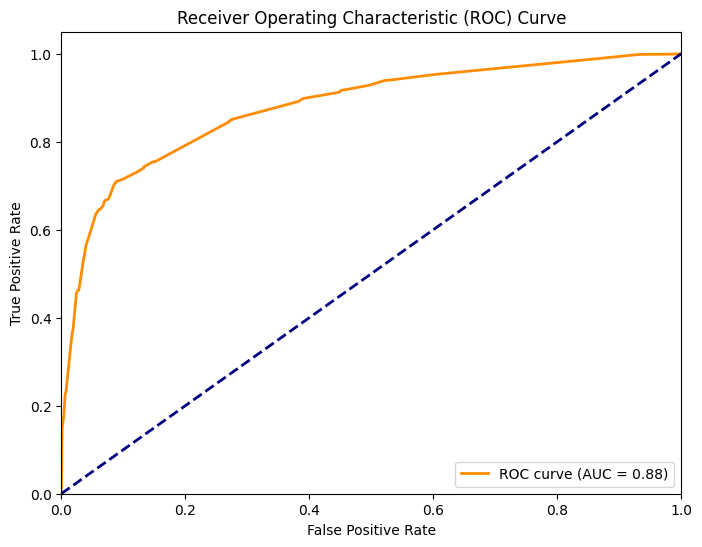

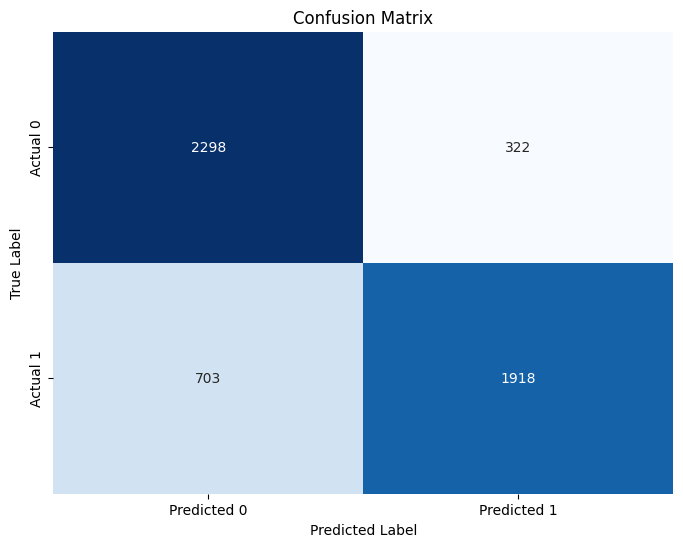

Model: MLPClassifier
Accuracy test: 0.8212 | Accuracy Training: 0.8376
F1-score test: 0.8144 | F1-score Training: 0.8320
roc_AUC-score test:0.8981 | roc_AUC-score Training:      0.9252
Differenza Accuracy: 0.0164
Differenza F1-score: 0.0176
Differenza AUC:      0.0271

Importanza delle Feature (stimata con Permutation Importance) per MLP:
person_age                      0.000000
person_emp_exp                  0.000000
cb_person_cred_hist_length      0.000000
loan_int_rate                   0.000000
person_home_ownership_OTHER     0.000000
person_home_ownership_OWN       0.000000
credit_score                    0.000000
person_gender_male              0.000000
person_education_Bachelor       0.000000
person_education_Doctorate      0.000000
person_education_High School    0.000000
person_education_Master         0.000000
loan_intent_HOMEIMPROVEMENT     0.000000
loan_intent_MEDICAL             0.000000
person_home_ownership_RENT      0.000000
loan_intent_EDUCATION           0.000000
loa

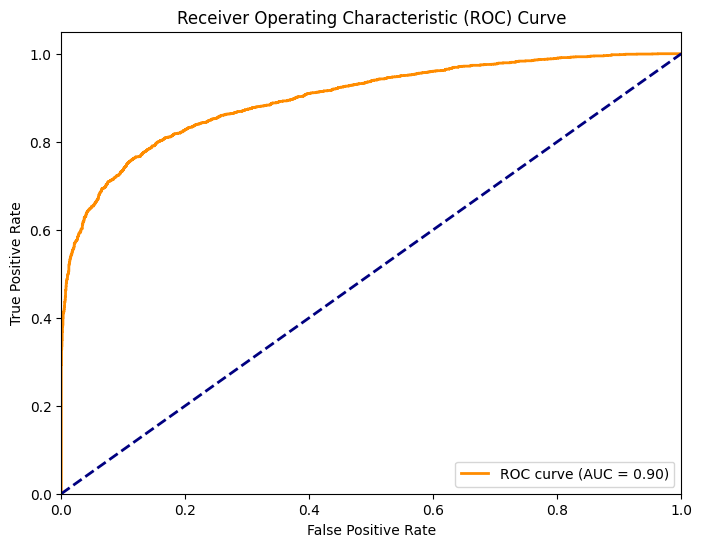

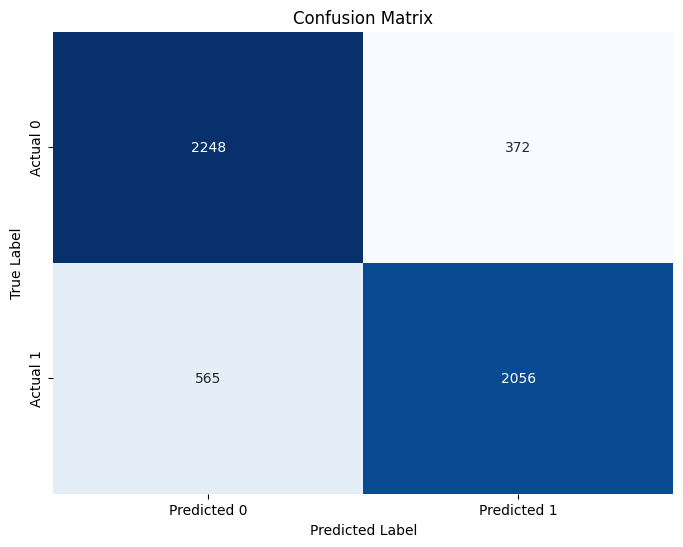

In [ ]:
main(data,input_err=0.7)

/tmp/ipython-input-2607937929.py:179: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '115037,00' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df_unified.iloc[row_idx, col_idx] =f"{value:.2f}".replace('.', ',') # se è float sostituisci i . con le ,
/tmp/ipython-input-2607937929.py:179: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '31,00' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df_unified.iloc[row_idx, col_idx] =f"{value:.2f}".replace('.', ',') # se è float sostituisci i . con le ,
/tmp/ipython-input-2607937929.py:179: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '3000,00' has dtype incompatible with float64, please explicitly cast to a compatible dt


input error types added:
loan_status: 9827
float_point_to_comma: 48965
int_swap_first_two_digits: 11940
str_swap_consecutive_char: 6536
str_duplicate_random_char: 6415
str_first_case_change: 6525
str_endswith_multiple_spaces: 6575
str_add_random_separator: 6524
str_add_new_line_char: 6561

Model: GaussianNB
Accuracy test: 0.6270 | Accuracy Training: 0.6351
F1-score test: 0.6935 | F1-score Training: 0.7023
roc_AUC-score test:0.7312 | roc_AUC-score Training:      0.7429
Differenza Accuracy: 0.0082
Differenza F1-score: 0.0087
Differenza AUC:      0.0116

Importanza delle Feature (stimata con Permutation Importance) per Gaussian Naive Bayes:
'loan_int_rate': 0.0532
'person_income': 0.0392
'credit_score': 0.0133
'loan_amnt': 0.0098
'person_home_ownership_RENT': 0.0012
'loan_intent_VENTURE': 3.4345e-04
'person_education_High School': 2.6712e-04
'loan_intent_EDUCATION': 1.9080e-04
'person_education_Bachelor': 1.5264e-04
'person_home_ownership_OWN': 1.1448e-04
'loan_intent_MEDICAL': 3.8161e-0

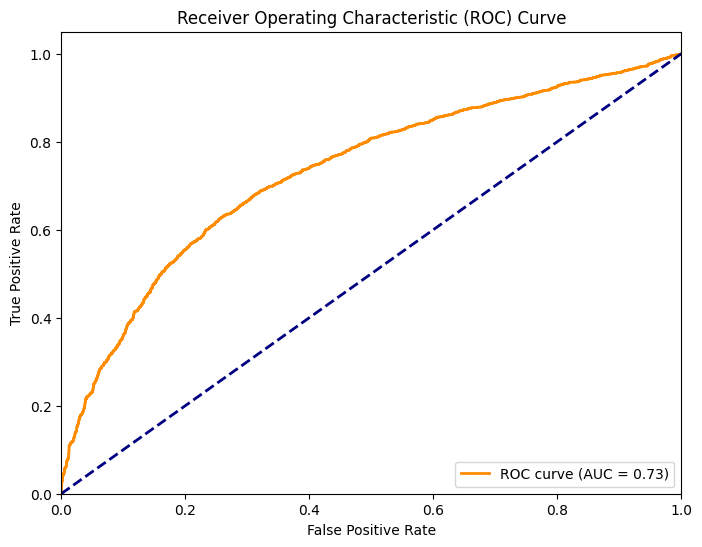

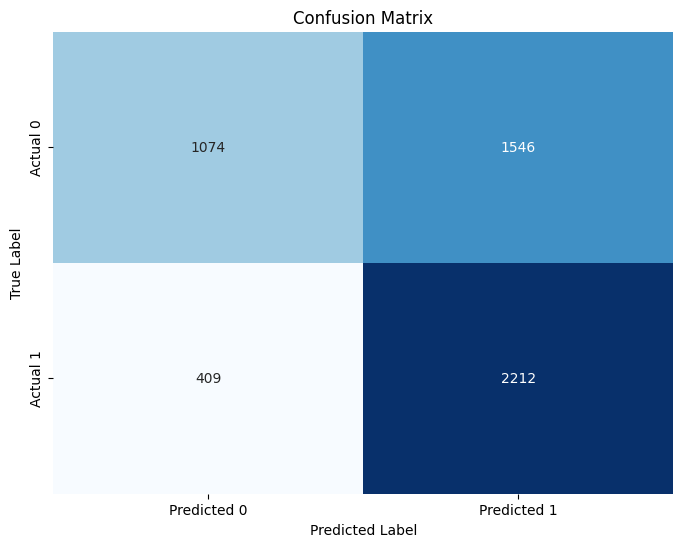

Model: DecisionTreeClassifier
Accuracy test: 0.8044 | Accuracy Training: 0.8145
F1-score test: 0.7891 | F1-score Training: 0.7999
roc_AUC-score test:0.8781 | roc_AUC-score Training:      0.8914
Differenza Accuracy: 0.0101
Differenza F1-score: 0.0107
Differenza AUC:      0.0133
Importanza delle Feature per Decision Tree:
'person_income': 0.3486
'loan_int_rate': 0.2915
'loan_amnt': 0.1348
'person_home_ownership_RENT': 0.1307
'credit_score': 0.0264
'person_home_ownership_OWN': 0.0159
'loan_intent_HOMEIMPROVEMENT': 0.0145
'loan_intent_MEDICAL': 0.0138
'loan_intent_VENTURE': 0.0068
'loan_intent_PERSONAL': 0.0063
'loan_intent_EDUCATION': 0.0059
'person_age': 0.0027
'cb_person_cred_hist_length': 0.0017
'person_education_Doctorate': 2.9884e-04
AUC: 0.8781


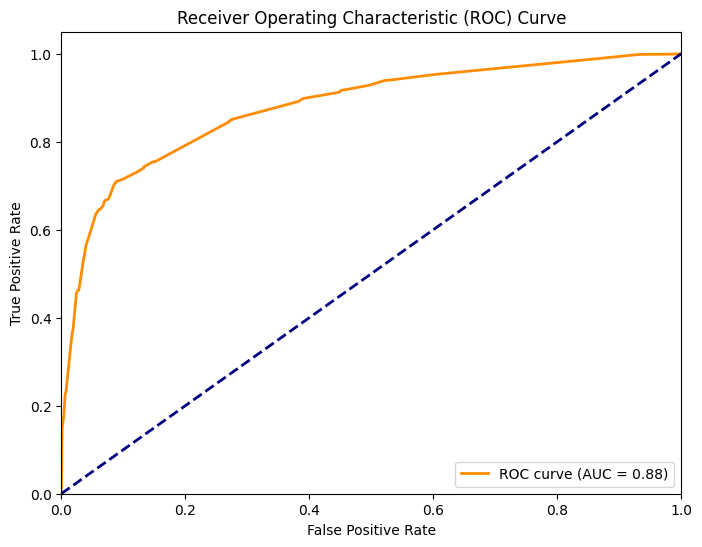

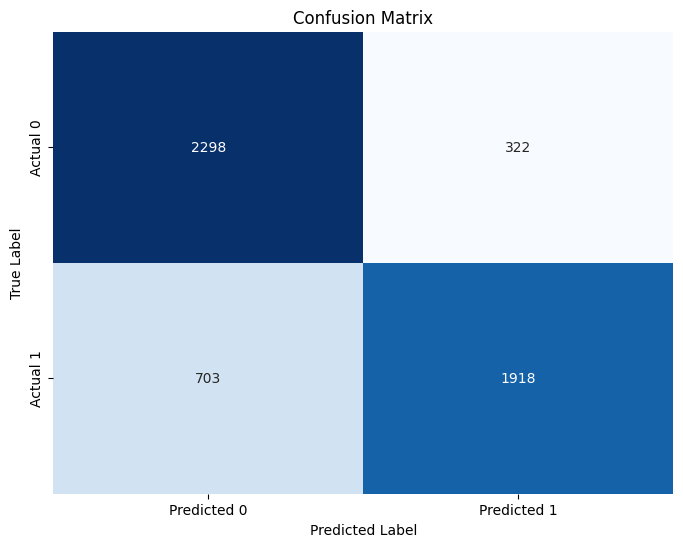

Model: MLPClassifier
Accuracy test: 0.8212 | Accuracy Training: 0.8376
F1-score test: 0.8144 | F1-score Training: 0.8320
roc_AUC-score test:0.8981 | roc_AUC-score Training:      0.9252
Differenza Accuracy: 0.0164
Differenza F1-score: 0.0176
Differenza AUC:      0.0271

Importanza delle Feature (stimata con Permutation Importance) per MLP:
person_age                      0.000000
person_emp_exp                  0.000000
cb_person_cred_hist_length      0.000000
loan_int_rate                   0.000000
person_home_ownership_OTHER     0.000000
person_home_ownership_OWN       0.000000
credit_score                    0.000000
person_gender_male              0.000000
person_education_Bachelor       0.000000
person_education_Doctorate      0.000000
person_education_High School    0.000000
person_education_Master         0.000000
loan_intent_HOMEIMPROVEMENT     0.000000
loan_intent_MEDICAL             0.000000
person_home_ownership_RENT      0.000000
loan_intent_EDUCATION           0.000000
loa

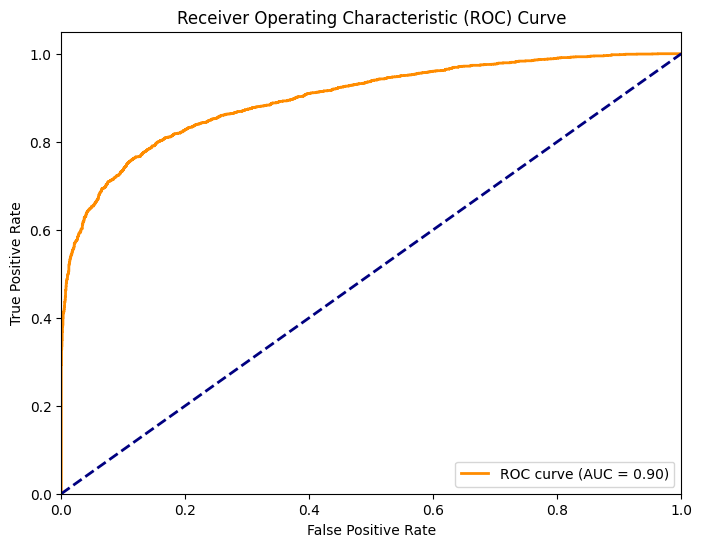

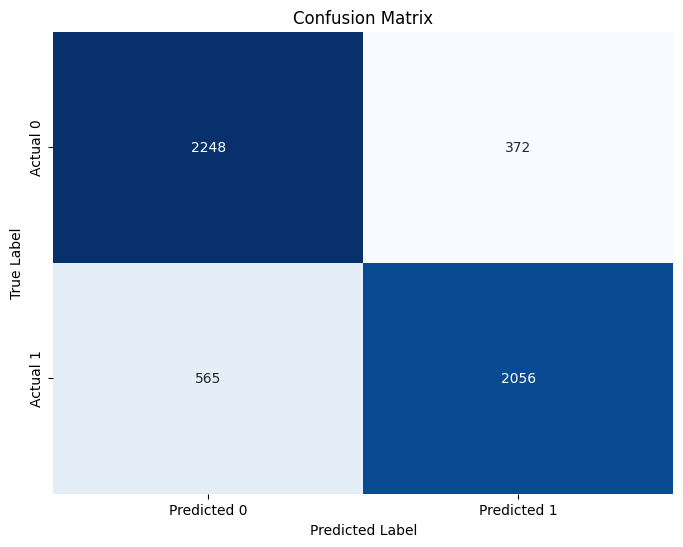

In [ ]:
main(data,input_err=0.8)